$$\newcommand{\ket}[1]{\left|{#1}\right\rangle}$$
$$\newcommand{\bra}[1]{\left\langle{#1}\right|}$$
# IBM Open Science Challenge  2022
## Solution by Q Team:  André Juan, Anton Simen, Askery Canabarro, Rafael Chaves and Rodrigo Pereira


## 1 - Overview of our approach

In the pursuit of the optimal solution, we considered the interplay of three major ingredients: (i) the order of the Trotter-Susuki decomposition, (ii) the number of steps and (iii) the duration time for each step.

As will be detailed below, after simulating a number of scenarios we focused on first and second order Trotter decompositions only. We tried different number of trotterization steps ranging from 4 (the minimun allowed) up to 8. One key ingredient of our approach was to optimize the duration of each trotterization step in order to achieve the highest fidelity at $t = \pi$ using the Sequential Least SQuares Programming (SLSQP) optimizer.



____________________

### 1.1 The Trotter-Susuki decomposition

We propose a Trotter-Susuki decomposition with different times for each step, provided that the individual time steps sum up to the total evolution time ($t=\pi$). That is, we write the trotterized operator $U_{\text{Heis3}}(t)$ as

$$U_{\text{Heis3}}(t) \approx \prod_{i=1}^n U_i^{(k)}(t_i) \ ,$$

Where $U_i^{(k)}(t_i)$ represents the $i$-th trotterization step, using a trotter decomposition of $k$-th order; and $n \geq 4$ is the number of steps. We considered Trotter decompositions of order $k=1, 2$.

#### 1.1.1 First-order trotterization ($k = 1$)

The unitary operator for the first-order trotterization is given by

$$ U_i^{(1)}(t_i) = XX(2t_i)^{(1, 2)} YY(2t_i)^{(1, 2)} ZZ(2t_i)^{(1, 2)} XX(2t_i)^{(0, 1)} YY(2t_i)^{(0, 1)} ZZ(2t_i)^{(0, 1)} \ .$$

(TO-DO: draw of single trotter step circuit, 1st order)

#### 1.1.2 Second-order trotterization ($k = 2$)

For the second-order trotterization, the operator is given by

$$ U_i^{(2)}(t_i) = XX(t_i)^{(0, 1)} YY(t_i)^{(0, 1)} ZZ(t_i)^{(0, 1)}
XX(2t_i)^{(1, 2)} YY(2t_i)^{(1, 2)} ZZ(2t_i)^{(1, 2)}
XX(t_i)^{(0, 1)} YY(t_i)^{(0, 1)} ZZ(t_i)^{(0, 1)} \ .$$

(TO-DO: draw of single trotter step circuit, 2nd order)

The superscripts $(0, 1)$ and $(1, 2)$ indicate, respectively, that the operator is acting on the first/second and second/third qubit pairs.

### 1.2 Non-uniform time-decomposition steps and optimization


Following a first-discretize-then-optimize approach, for any trotterization order, the total evolution time is decomposed into $n$ steps of duration $t_i$, such that $\sum_{i=1}^{n}t_i = t$. Most importantly, we do not assumue a fixed interval, such that $t_i = t/n$, but rather allow for non-uniform times, as long as the total evolution time corresponds to the target time $t=\pi$.

Now, we treated the step times $t_i$ as free parameters, such that the full troterrization circuit is seen as a variational circuit. The goal then becomes to find the best parameter values, subject to the $\sum_{i=1}^{n}t_i = t$ constraint.

With that aim, we used the fidelity at $t=\pi$ as the loss function to be optmized with SciPy's implemenation of the Sequential Least Squares Programming (SLSQP) for constrained optmization.

Since the optmization of the variational circuit demands a large number of circuit executions, it was done using a simulator. However, to better capture Jakarta's behavior, we used its noise model for the simulation. That is, the fidelity used as the loss function was obtained from a noisy simulation, an approach that made the optmization process harder, but certainly more realistic. 

Interestingly, by not imposing the constraint that all times must be positive, $t_i > 0$, in many cases the optimization process yielded null step times for most of the parameters, leaving only two non-zero times, equally divided as $\frac{\pi}{2}$ each. This would correspond to effectively performing only two steps. Therefore, to fulfill the requirements of the challenge, we also imposed that all steps must be non-zero, by imposing that $t_i > \epsilon$, with $\epsilon > 0$. Some of our best results were obtained setting $\epsilon = 0.01$, which was indeed picked as the values for most of the parameters. Thus, for any chosen number of trottrerization steps $n$, all such steps are effectively present and performed by the quantum circuit, satisfying the conditions imposed by the challenge at hand.

Inspired by the fact that smaller time steps could provide better solutions, we also tested $\epsilon = 0.001$ e $\epsilon = 0.0005$, but only for the most promising case of 1st-order ($k = 1$) trotterization for different number of steps ($n$), again with $n \in [4,5,6,7,8]$. A summary of our simulated investigations is given in the Table below. As can be seen, both for the real executions on Jakarta's backend and its simulator, the best results are achieved considering $k=1$ (first-order trotterization) and $n=4$ (the minimum allowed number of steps). It also becomes apparent that the real executions provide worst results than the simulated ones.


| k | n | Min $t$ | Fidelity* | Simulated Fid.** | Best time schedule |
| --- | --- | --- | --- | --- | --- |
| 1 | 4 | 0.001 | 0.387 | 0.649 | [0.001, 1.573, 0.001, 1.573] |
| 1 | 4 | 0.0005 | 0.348 | 0.621 | [0.004, 1.564, 0.004, 1.570 ] |
| 1 | 5 | 0.001 | 0.310 | 0.601 | [0.002, 1.566, 1.572, 0.001, 0.001]|
| 1 | 4 | 0.01  | X | 0.598 | [0.01, 1.555, 0.01, 1.567] |
| 1 | 4 | 0.1   | X | 0.587 | [0.1, 1.448, 0.1, 1.494]   |
| 1 | 5 | 0.0005 | 0.362 | 0.572 | [1.566, 1.574, 0.0005, 0.0005, 0.0005] |
| 1 | 6 | 0.001 | 0.233 | 0.557 | [0.001, 1.571,  1.567, 0.001, 0.001, 0.001] |
| 1 | 5 | 0.01  | X | 0.553 | [0.01,  1.563, 1.549, 0.01, 0.01]|
| 1 | 6 | 0.0005 | 0.233 | 0.529 | [4.46e-03, 1.570, 1.566, 9.11e-04, 0.0005, 0.0005] |
| 1 | 5 | 0.1   | X | 0.522 | [0.1, 1.424, 1.418, 0.1, 0.1]|
| 1 | 7 | 0.001 | 0.163 | 0.519 | [0.001, 1.570,  1.566, 0.001, 0.001, 0.001, 0.001]|
| 1 | 6 | 0.01  | X | 0.512 | [0.01, 1.553, 1.549, 0.01, 0.01, 0.01]|
| 2 | 4 | 0.01  | 0.228 | 0.492 | [0.01, 1.562, 1.559, 0.01]|
| 1 | 7 | 0.0005 | 0.187 | 0.490 | [1.6e-03, 1.571, 1.567, 0.0005, 0.0005, 0.0005, 0.0005]|
| 2	| 4	| 0.0005 | X | 0.490 | [0.0005, 0.0005, 3.138,  2.17e-03] 
| 1 | 8 | 0.001 | 0.149 | 0.484 | [0.006, 1.563,  1.568, 0.001, 0.001, 0.001, 0.001, 0.001]|
| 2	| 4	| 0.001  | X | 0.480 | [0.001, 1.573, 1.565 ,  2.27e-03] |
| 1 | 7 | 0.01  | X | 0.475 | [0.01, 1.559, 1.533, 0.01, 0.01, 0.01, 0.01]|
| 1 | 6 | 0.1   | X | 0.455 | [0.1, 1.382, 1.360, 0.1, 0.1, 0.1]|
| 1 | 8 | 0.0005 | 0.144 | 0.454 |[8.38e-04, 1.573, 1.565, 0.0005, 0.0005, 0.0005, 0.0005, 0.0005]|
| 1 | 8 | 0.01  | X | 0.444 | [0.01, 1.553, 1.529, 0.01, 0.01, 0.01, 0.01, 0.01]|
| 2 | 4 | 0.1   | 0.229 | 0.430 | [0.1, 1.47, 1.468, 0.1]|
| 2 | 5 | 0.1   | 0.148 | 0.427 | [0.1, 0.1, 2.742, 0.1, 0.1]|
| 2 | 5 | 0.01  | 0.164 | 0.406 | [0.01, 2.052, 1.060, 0.01, 0.01] |
| 2 | 5 | 0.001   | X | 0.401 | [0.001, 1.983, 1.155, 0.001, 0.001] |
| 2 | 5 | 0.0005  | X | 0.399 | [0.0005, 2.172, 0.963, 4.76e-03, 0.0005] |
| 2 | 6 | 0.01  | 0.120 | 0.399 | [0.01, 1.550, 1.551, 0.01, 0.01, 0.01]|
| 2 | 6 | 0.001  | X | 0.392 | [0.001, 1.567, 1.570, 0.001, 0.001, 0.001]|
| 2 | 6 | 0.0005  | X | 0.392 |[2.33e-03, 1.563, 1.573, 1.01e-03, 1.08e-03, 0.0005]|
| 1 | 7 | 0.1   |  | 0.392 | [0.1, 1.347, 1.294, 0.1, 0.1, 0.1, 0.1]|
| 2 | 7 | 0.01  | 0.114 | 0.364 | [0.01, 1.547, 1.544, 0.01, 0.01, 0.01, 0.01]|
| 2 | 7 | 0.0005  | X | 0.358 |[1.08e-03, 1.564, 1.573, 0.0005,1.82e-03,0.0005, 0.0005]|
| 2 | 7 | 0.001  | X | 0.358 |[0.001, 1.568, 1.569, 0.001, 0.001, 0.001, 0.001]|
| 2 | 8 | 0.01  | 0.128 | 0.340 | [0.01, 3.072, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01]|
| 1 | 8 | 0.1   | X | 0.338 | [0.1, 1.312, 1.230, 0.1, 0.1, 0.1, 0.1, 0.1]|
| 2 | 8 | 0.0005  | X | 0.334 |[6.56e-04, 3.137, 0.0005, 0.0005, 0.0005, 0.0005, 0.0005, 0.0005]|
| 2 | 8 | 0.001  | X | 0.334 |[1.77e-02, 3.117, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001]|
| 2 | 7 | 0.1   | 0.146 | 0.320 | [0.1, 0.1 , 2.541, 0.1, 0.1, 0.1, 0.1]|
| 2 | 6 | 0.1   | 0.147 | 0.245 | [0.1, 1.393, 1.348, 0.1, 0.1, 0.1]|
| 2 | 8 | 0.1   | 0.131 | 0.227 | [0.156, 0.374, 0.505, 0.407,  0.373, 0.440, 0.510, 0.378]|

*the best fidelity computed at $t = \pi$ among $8$ executions on the jakarta backend.

**the mean fidelity computed at $t = \pi$ over $8$ executions on the fake jakarta backend.

As aforementioned, we performed the variational circuit optmization by using only information of $t=\pi$ in the cost function. However, we wondered if it was possible to capture the whole dynamics even with such limited information. And, quite remarkably, it was possible, by the following procedure:

- We first determined the best parameters $t_i$ by optimizing the loss calculated with $t=\pi$
- This yields a $n$-dimensional parameters vector $\vec{t}$, whose components sum to $t=\pi$;
- We then normalized this vector, so that its components sum to 1, by dividing each component by $t=\pi$, $\vec{t}_{\text{norm}} = \frac{1}{t}\vec{t}$. The components of this normalized vector indicates the percentual contribution of each step duration to the whole evolution;
- We produced 100 intermediate times between 0 and $\pi$. The normalized vector was then used to parametrize the evolution using each one of the intermdiate times as the target time $t_{\text{target}}$, i.e., keeping the same proportion found by optmization at $t=\pi$, and making the parameter vector sum to $t_{\text{target}}$: $\vec{t}_{\text{target}} = t_{\text{target}} \vec{t}_{\text{norm}}$;
- The fidelity of the target state was then measured at each one of these intermediate target times.

And indeed, we can see that the dynamics was correctly captured for all the intermediate steps:

![evolution](https://www.dualq.tech/wp-content/uploads/full_evolution_order_1_4_steps.png)

Feel free to inspect our 'figs' folder for more plots.

Thus, by learning the proportional contribution of each step to the total evolution with information only available at $t=\pi$, we were able to reconstruct, qualitatively and quantitatively, the full dynamics. This is a quite interesting result. However, this reconstruction is, in general, not possible when null time step is allowed (e.g. $[0, 0, 0, \pi]$). Therefore, our imposition of non-null time, besides of better complying the rules, avoids these trivial solutions.

In [1]:
%load_ext autoreload
%autoreload 2

from troter_utils import *

## Quantum Devices


In [3]:
# load IBMQ Account data
provider = IBMQ.load_account()

# Get backend for experiment
provider = IBMQ.get_provider(hub='ibm-q-community', group='ibmquantumawards', project='open-science-22')
jakarta  = provider.get_backend('ibmq_jakarta')

# Simulated backend based on ibmq_jakarta's device noise profile
sim_noisy_jakarta = QasmSimulator.from_backend(provider.get_backend('ibmq_jakarta'))

# Noiseless simulated backend
sim_no_noise = QasmSimulator()

ibmqfactory.load_account:WARNING:2022-04-15 12:29:44,250: Credentials are already in use. The existing account in the session will be replaced.


____________

## Find best time schedule with SLSQP and the correspoding simulation on fake ibmq_jakarta's 

### First order trotterization ($k = 1$)

- Number steps: 4 to 8;
- Variable time;
- Minimum time: 0.1, 0.01, 0.001, 0.0005;
- It takes around 1 hour to finish all combinations.

In [7]:
results = {"order"   : [],
           "n_steps" : [],
           "t_min"   : [],
           "state_tomo_fids" : [],
           "fid_pi"  : [],
           "best_params" : []}




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 4                                   
                                 min time: 0.1                                  
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


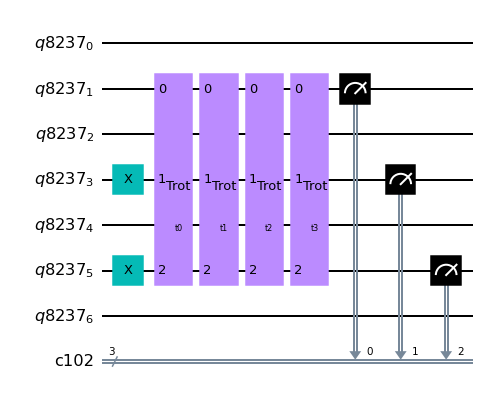

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.16098
Current parameters: [0.1   1.487 0.53  1.025] (sum to 3.14)

Iter 2 done!
Loss value: -0.55568
Current parameters: [0.1   1.541 0.1   1.4  ] (sum to 3.14)

Iter 3 done!
Loss value: -0.56172
Current parameters: [0.1   1.411 0.1   1.531] (sum to 3.14)

Iter 4 done!
Loss value: -0.56319
Current parameters: [0.1   1.438 0.1   1.504] (sum to 3.14)

Iter 5 done!
Loss value: -0.56322
Current parameters: [0.1   1.439 0.1   1.503] (sum to 3.14)

Iter 6 done!
Loss value: -0.56322
Current parameters: [0.1   1.439 0.1   1.503] (sum to 3.14)

Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.56322
            Iterations: 6
            Function evaluations: 41
            Gradient evaluations: 6

Total time of optimization: 00:00:22

Optimizer: SLSQP
eps = 0.01

Iter 1 done!
Loss value: -0.1

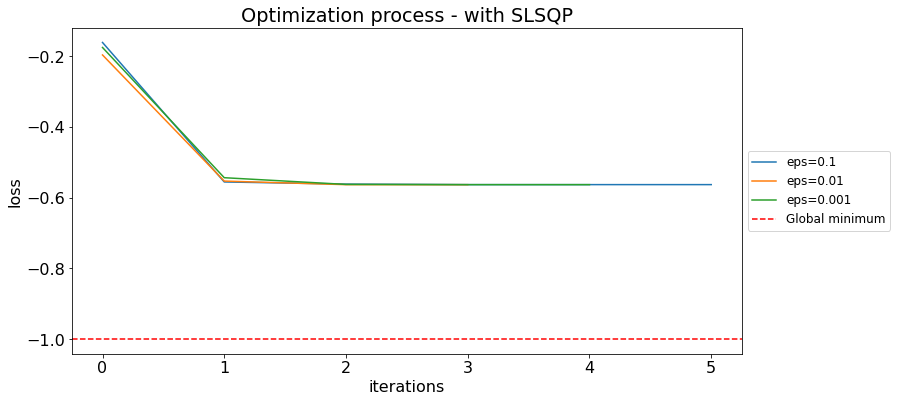


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.1, 1.4542006072722344, 0.10000000000000002,...",-0.56336
2,slsqp,0.001,"[0.10000000000000007, 1.4557786850242105, 0.10...",-0.56334
0,slsqp,0.100,"[0.10000000000000002, 1.4388493038845782, 0.1,...",-0.56322


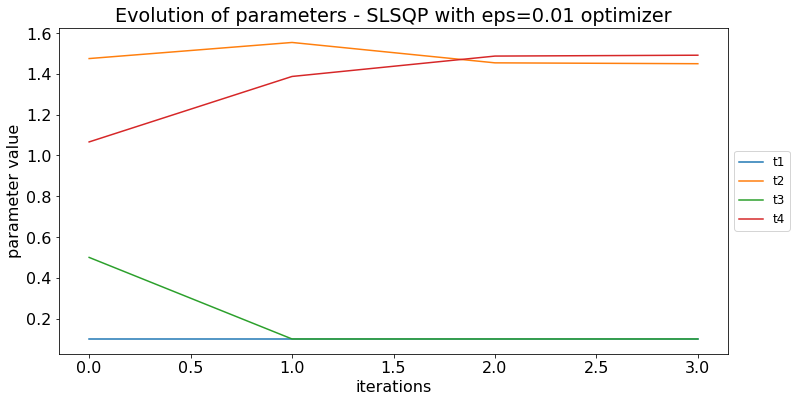

Best parameters (sum to 3.14):	[0.1   1.454 0.1   1.487]
Best parameters (sum to 1):	[0.032 0.463 0.032 0.473]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


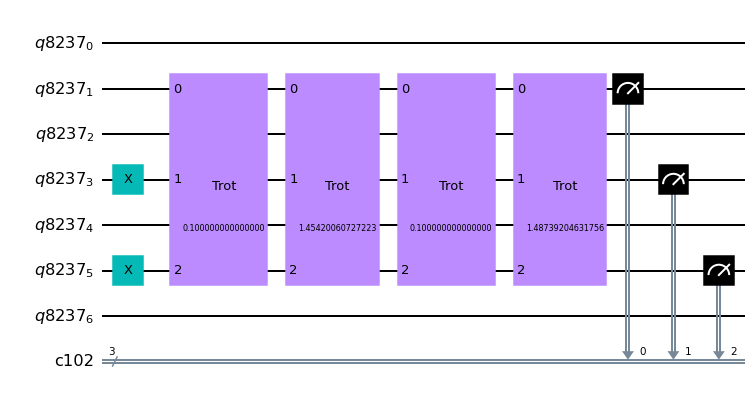

################################################################################
Single trotterization step:


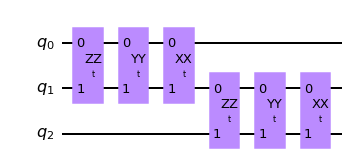

################################################################################

All steps + measurements of state tomography:


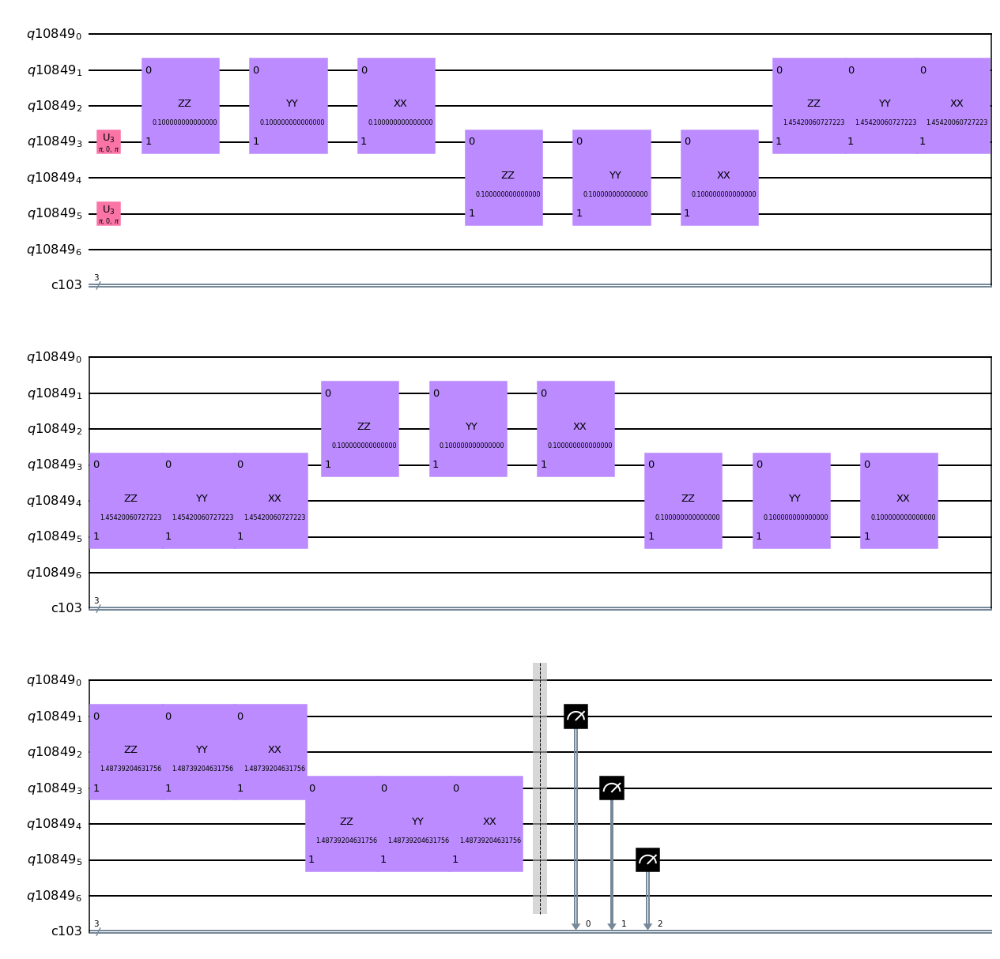

################################################################################

1/8 - Job ID ab6f263c-60f7-466d-abc4-6739abccc47b
2/8 - Job ID ab454c49-4fd6-47b5-b92f-8ed116440ff0
3/8 - Job ID 6d63c1f5-3606-4182-b74c-7ffa6c792bc8
4/8 - Job ID 3f051680-0f33-4328-8d9e-e0d08d9a0a16
5/8 - Job ID a5aee534-8a41-4a42-b175-b5dd8633d2be
6/8 - Job ID e622b5bd-0191-43d8-a420-80797f80a4d3
7/8 - Job ID df7b3cad-e2e9-4883-981d-79d853f1160f
8/8 - Job ID ab069bad-501e-46df-b40c-02b8bf127179

################################################################################

Final results - order: 1 - strotter steps: 4

State tomography fidelity = 0.5634 ± 0.0021

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:00:55



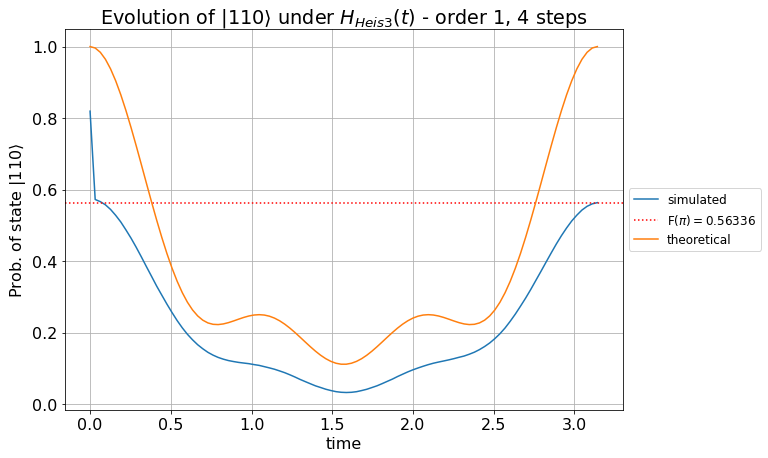




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 4                                   
                                 min time: 0.01                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


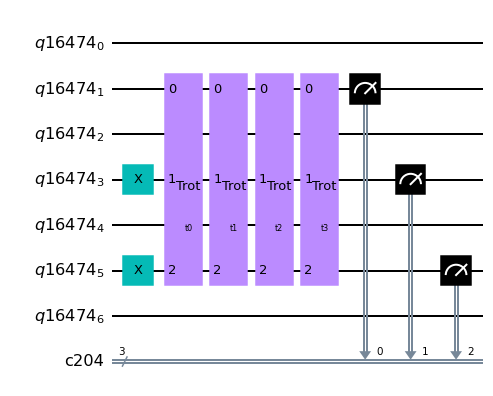

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.25601
Current parameters: [0.01  1.622 0.448 1.062] (sum to 3.14)

Iter 2 done!
Loss value: -0.56656
Current parameters: [0.01  1.454 0.01  1.667] (sum to 3.14)

Iter 3 done!
Loss value: -0.57333
Current parameters: [0.018 1.514 0.01  1.6  ] (sum to 3.14)

Iter 4 done!
Loss value: -0.57396
Current parameters: [0.015 1.544 0.01  1.573] (sum to 3.14)

Iter 5 done!
Loss value: -0.57405
Current parameters: [0.01  1.556 0.01  1.565] (sum to 3.14)

Iter 6 done!
Loss value: -0.57405
Current parameters: [0.01  1.557 0.01  1.564] (sum to 3.14)

Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.57405
            Iterations: 6
            Function evaluations: 41
            Gradient evaluations: 6

Total time of optimization: 00:00:23

Optimizer: SLSQP
eps = 0.01

Iter 1 done!
Loss value: -0.2

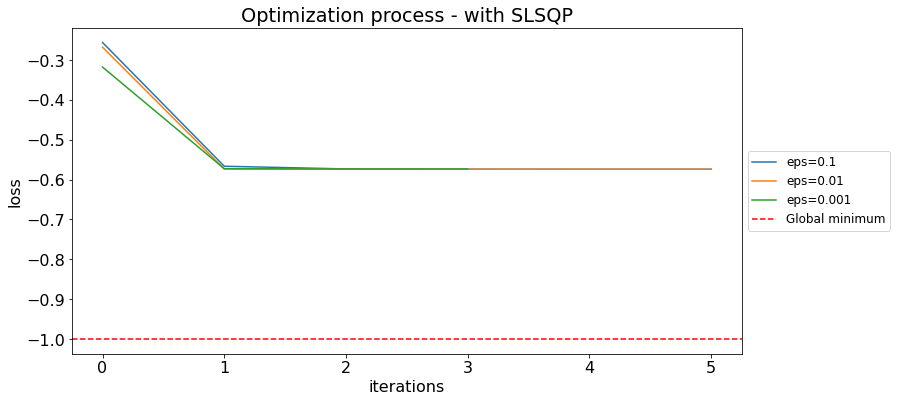


Optimization results:



,optimizer,eps,final_params,final_loss
0,slsqp,0.100,"[0.010000000000000002, 1.5562983235294372, 0.0...",-0.57405
1,slsqp,0.010,"[0.01, 1.5570396086400113, 0.01, 1.56455304494...",-0.57405
2,slsqp,0.001,"[0.03345353971777841, 1.5114932187890668, 0.01...",-0.57344


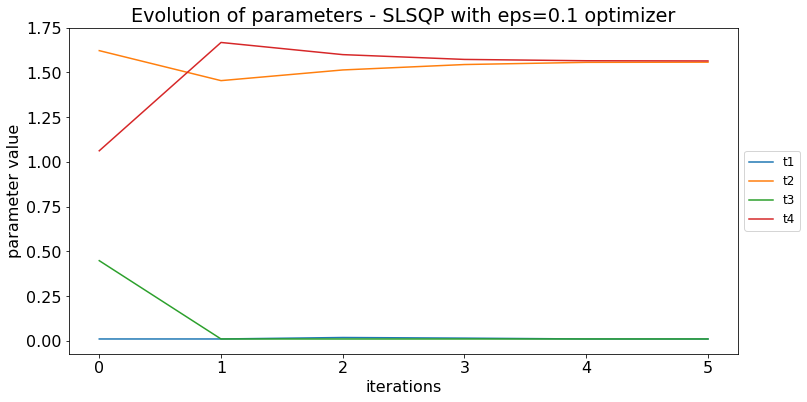

Best parameters (sum to 3.14):	[0.01  1.556 0.01  1.565]
Best parameters (sum to 1):	[0.003 0.495 0.003 0.498]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


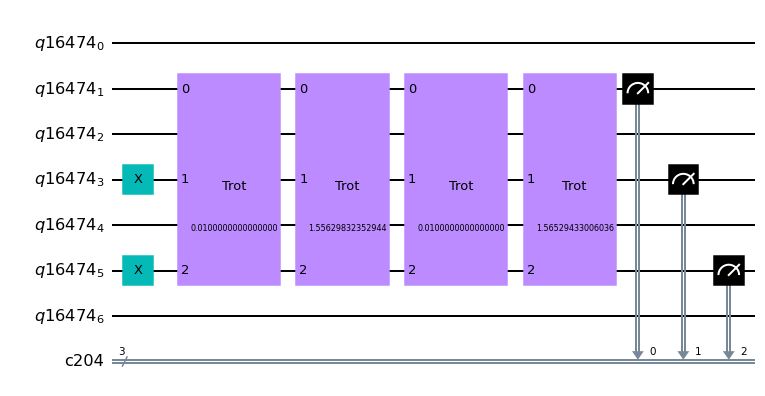

################################################################################
Single trotterization step:


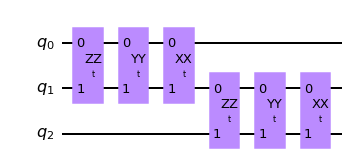

################################################################################

All steps + measurements of state tomography:


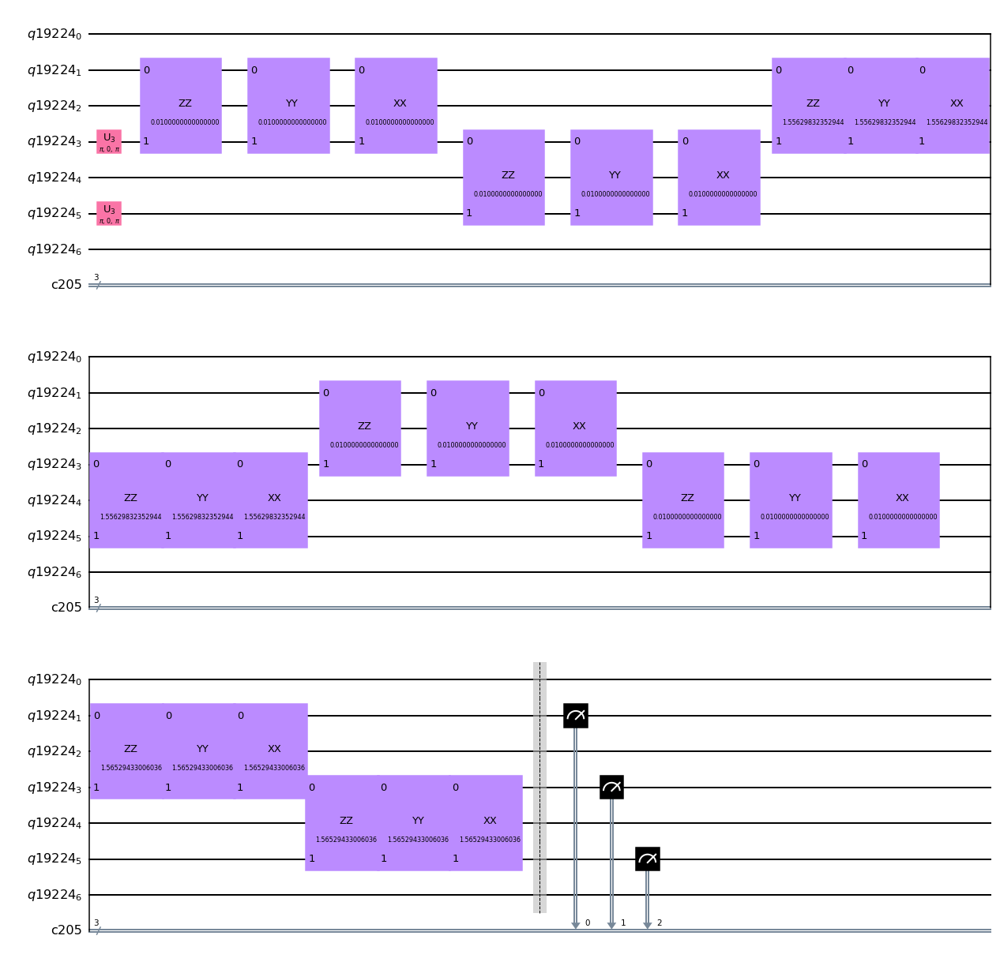

################################################################################

1/8 - Job ID 09cfc9ed-6d9d-44b9-b022-55281447410d
2/8 - Job ID 9d877300-a54a-4a10-91c4-11f48b2cc20f
3/8 - Job ID 8573b67e-4de4-4e34-82c7-54f9e228a439
4/8 - Job ID 4278772a-a220-4cbf-8196-254b39543850
5/8 - Job ID 69b002ab-66d1-4bb2-b28a-1bfd61ce41bb
6/8 - Job ID 49868b1a-47ad-4968-aaa2-0f8496eb4463
7/8 - Job ID cade0de0-ee22-4d44-9a02-bb2979179d2e
8/8 - Job ID f902d249-291a-42a5-b44c-474063505ff1

################################################################################

Final results - order: 1 - strotter steps: 4

State tomography fidelity = 0.5755 ± 0.0020

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:00:53



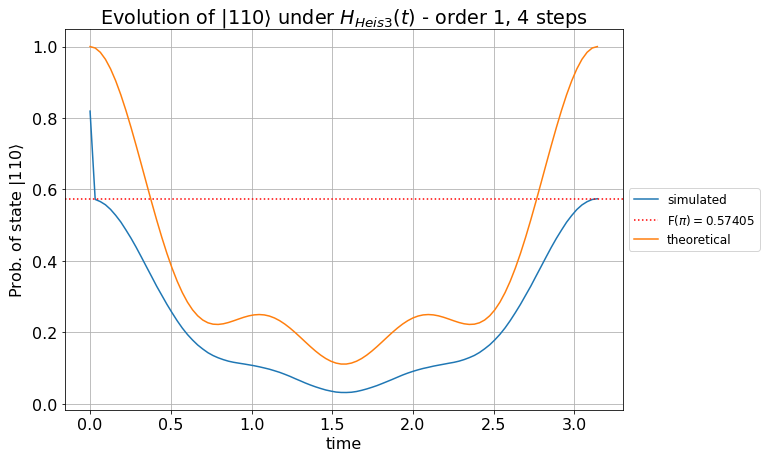




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 4                                   
                                min time: 0.001                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


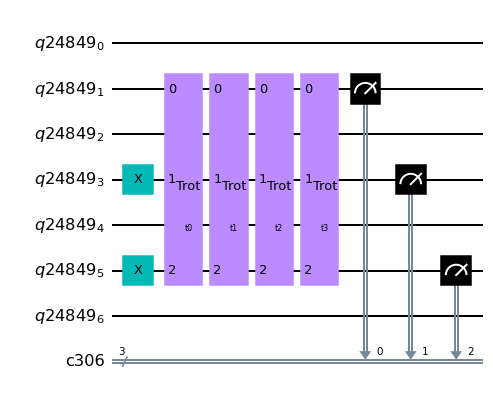

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.26265
Current parameters: [1.000e-03 1.636e+00 4.390e-01 1.066e+00] (sum to 3.14)

Iter 2 done!
Loss value: -0.56295
Current parameters: [1.000e-03 1.445e+00 1.000e-03 1.695e+00] (sum to 3.14)

Iter 3 done!
Loss value: -0.57318
Current parameters: [1.665e-02 1.517e+00 1.000e-03 1.607e+00] (sum to 3.14)

Iter 4 done!
Loss value: -0.57395
Current parameters: [0.016 1.544 0.002 1.579] (sum to 3.14)

Iter 5 done!
Loss value: -0.57407
Current parameters: [0.009 1.56  0.003 1.569] (sum to 3.14)

Iter 6 done!
Loss value: -0.57409
Current parameters: [0.005 1.565 0.004 1.568] (sum to 3.14)

Iter 7 done!
Loss value: -0.57409
Current parameters: [1.305e-03 1.572e+00 2.191e-03 1.567e+00] (sum to 3.14)

Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.57409
            Iterations: 7
           

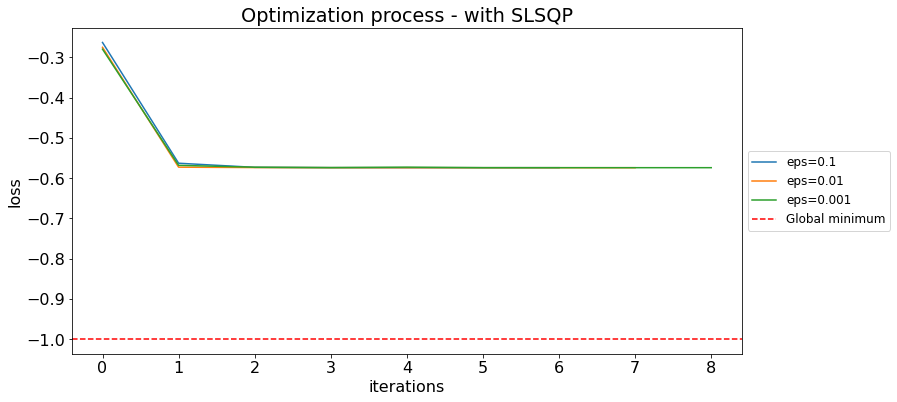


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.001, 1.568456254347037, 0.00388483498907728...",-0.57411
0,slsqp,0.100,"[0.0052069190983906315, 1.5652156082066508, 0....",-0.57409
2,slsqp,0.001,"[0.014773048631717934, 1.5530856110898743, 0.0...",-0.57404


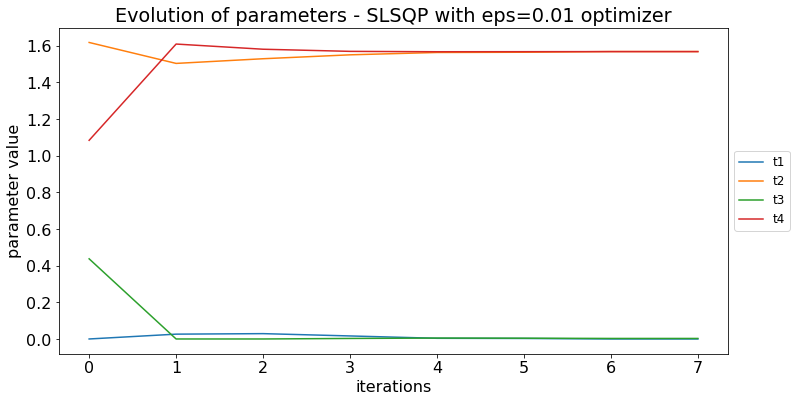

Best parameters (sum to 3.14):	[1.000e-03 1.568e+00 3.885e-03 1.568e+00]
Best parameters (sum to 1):	[3.183e-04 4.993e-01 1.237e-03 4.992e-01]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


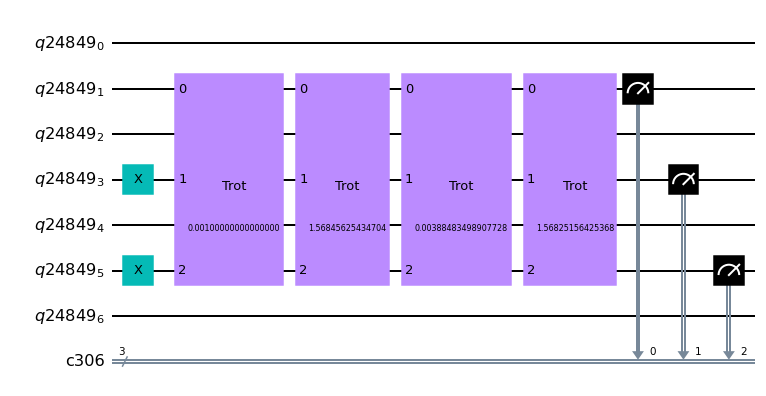

################################################################################
Single trotterization step:


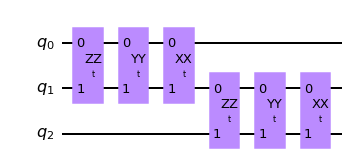

################################################################################

All steps + measurements of state tomography:


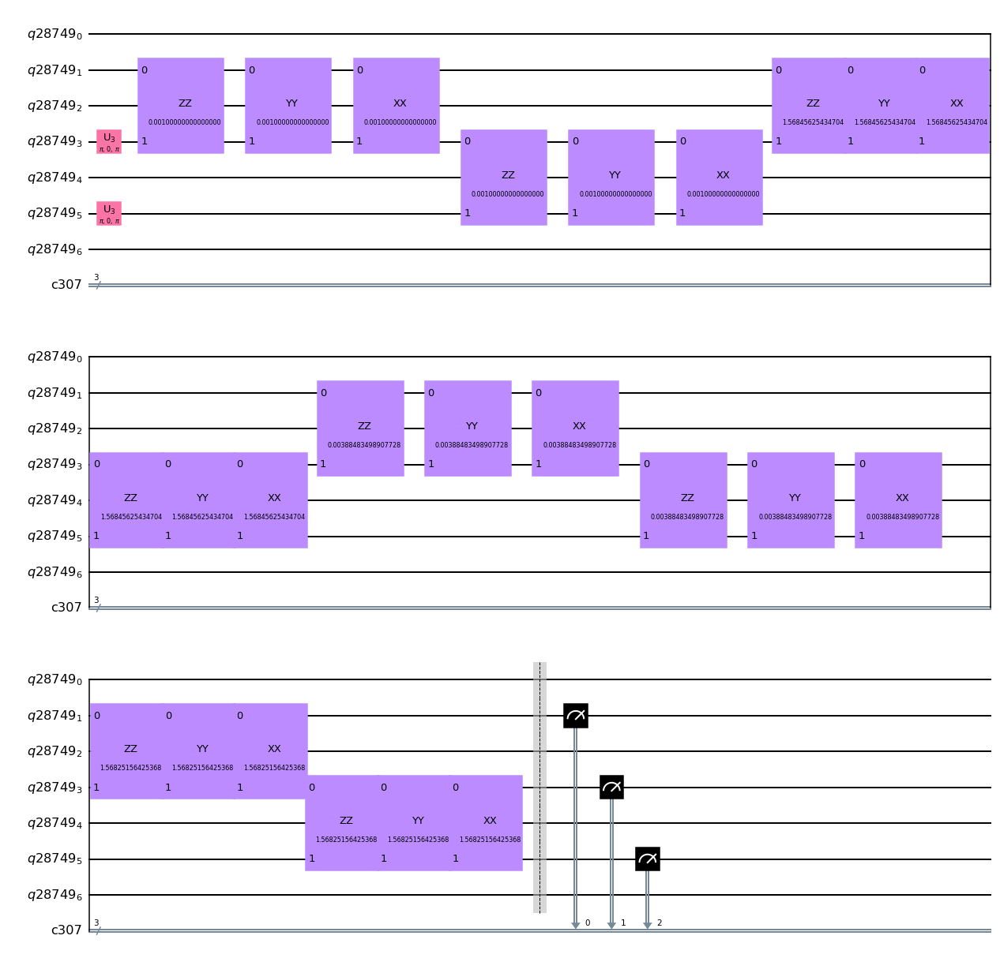

################################################################################

1/8 - Job ID aa90c365-899c-4152-9389-42f08784f15d
2/8 - Job ID 382c8f41-aef3-416c-a61b-15f7d6c72a09
3/8 - Job ID 0ed61138-6a36-461a-86ff-e7b7de9b73ab
4/8 - Job ID 4d393d84-a9a2-499f-8681-3b179b04d9d8
5/8 - Job ID 1dde03d9-60b4-42f0-8f78-0076444ac6f8
6/8 - Job ID efc949bd-3be2-4e93-88b4-91986651376d
7/8 - Job ID c5f42359-2bda-477d-bc57-3ff5791a0c7f
8/8 - Job ID fd6ff8ef-c734-4c9b-9b6b-0cf4aff7398b

################################################################################

Final results - order: 1 - strotter steps: 4

State tomography fidelity = 0.5757 ± 0.0012

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:00:54



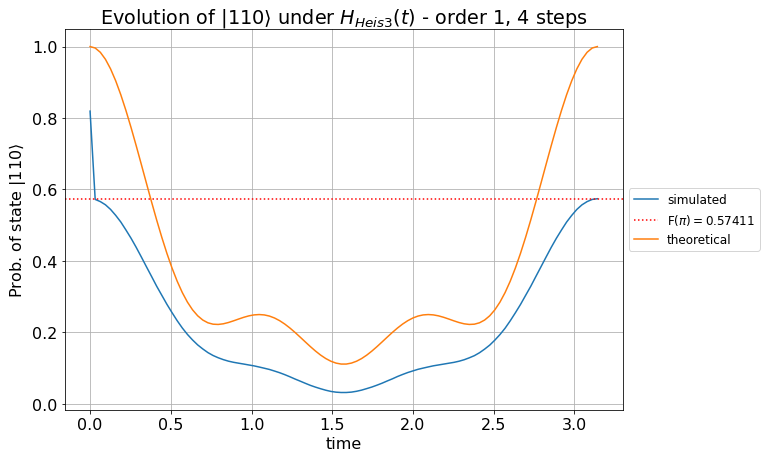




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 4                                   
                                min time: 0.0005                                
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


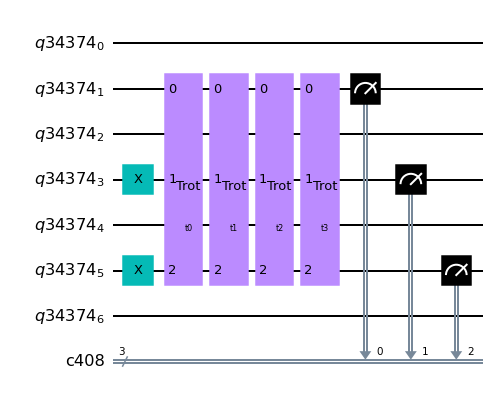

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.26249
Current parameters: [5.000e-04 1.637e+00 4.390e-01 1.066e+00] (sum to 3.14)

Iter 2 done!
Loss value: -0.56289
Current parameters: [5.000e-04 1.445e+00 5.000e-04 1.695e+00] (sum to 3.14)

Iter 3 done!
Loss value: -0.57318
Current parameters: [1.671e-02 1.517e+00 5.000e-04 1.608e+00] (sum to 3.14)

Iter 4 done!
Loss value: -0.57395
Current parameters: [1.628e-02 1.545e+00 1.354e-03 1.579e+00] (sum to 3.14)

Iter 5 done!
Loss value: -0.57408
Current parameters: [0.009 1.56  0.003 1.569] (sum to 3.14)

Iter 6 done!
Loss value: -0.57409
Current parameters: [0.005 1.566 0.003 1.567] (sum to 3.14)

Iter 7 done!
Loss value: -0.57411
Current parameters: [0.002 1.57  0.002 1.567] (sum to 3.14)

Iter 8 done!
Loss value: -0.57411
Current parameters: [2.031e-03 1.570e+00 1.332e-03 1.568e+00] (sum to 3.14)

Optimization terminated s

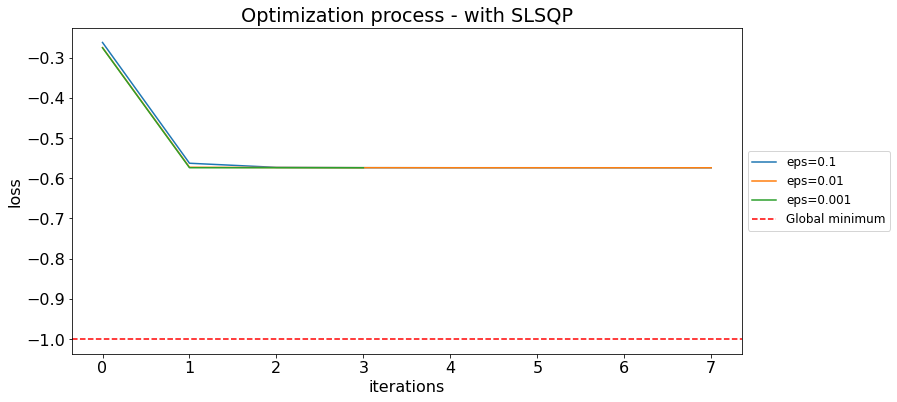


Optimization results:



,optimizer,eps,final_params,final_loss
0,slsqp,0.100,"[0.0017461160414020311, 1.5703193318202449, 0....",-0.57411
1,slsqp,0.010,"[0.000500000000000001, 1.568750630105326, 0.00...",-0.57411
2,slsqp,0.001,"[0.007251201475308753, 1.5661803282821036, 0.0...",-0.57408


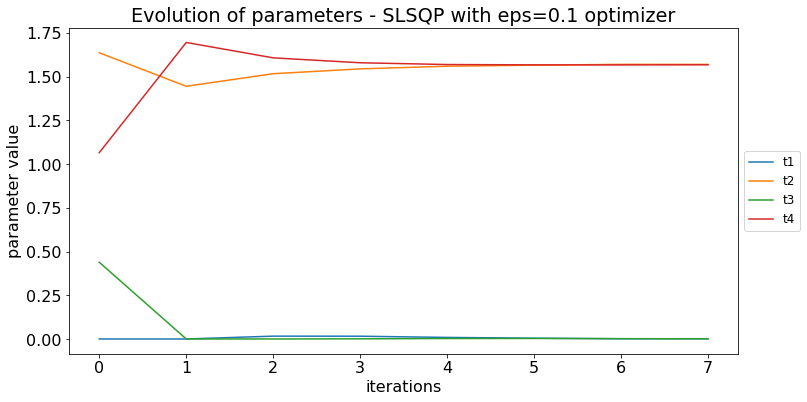

Best parameters (sum to 3.14):	[0.002 1.57  0.002 1.567]
Best parameters (sum to 1):	[0.001 0.5   0.001 0.499]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


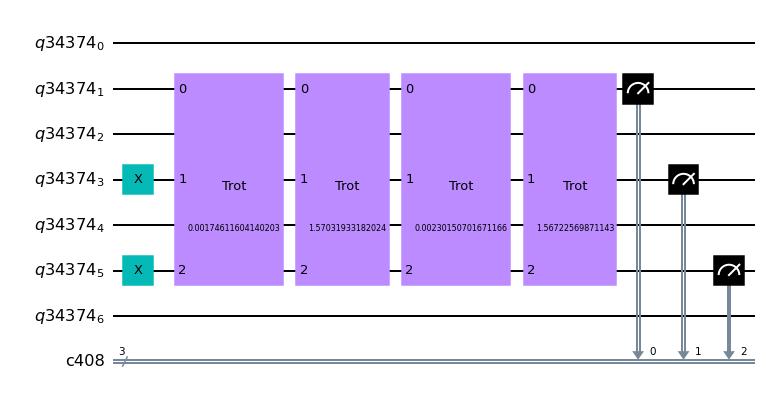

################################################################################
Single trotterization step:


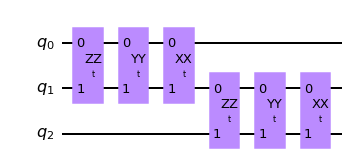

################################################################################

All steps + measurements of state tomography:


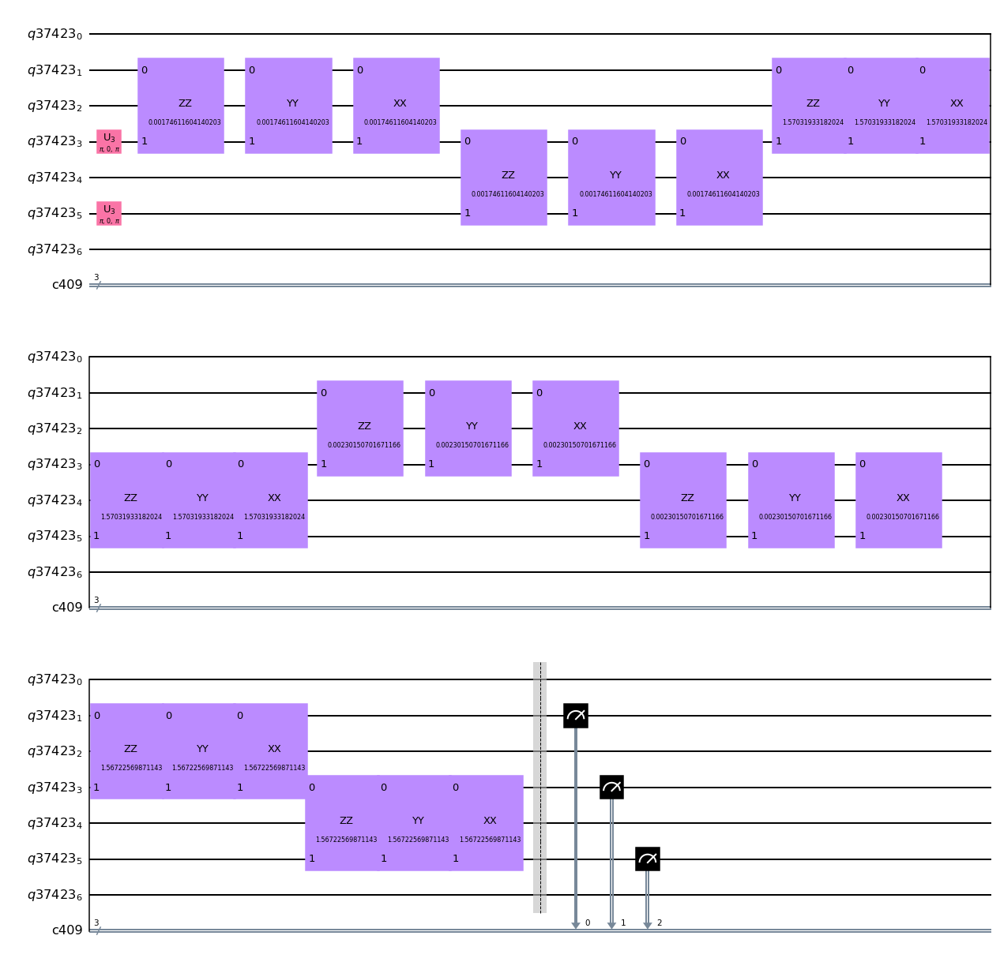

################################################################################

1/8 - Job ID e28bce65-6a6b-46c8-a3f9-fef187a944e6
2/8 - Job ID 724f6195-c5f1-4c83-9e7e-d56cc8ce94aa
3/8 - Job ID e28a3dba-6cd6-483d-b84c-b6b7d0057f94
4/8 - Job ID f804ed1b-ed85-4d1d-a1c3-b92567153d27
5/8 - Job ID 171df354-a393-4d55-b490-5af6612769c4
6/8 - Job ID 858b8e9b-f78b-4951-8565-7750d68b6e0f
7/8 - Job ID 728c4260-a7a7-4a15-8430-1a97370409b8
8/8 - Job ID 90bbdb32-feac-4e0f-a29e-74d49a276db0

################################################################################

Final results - order: 1 - strotter steps: 4

State tomography fidelity = 0.5746 ± 0.0016

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:00:54



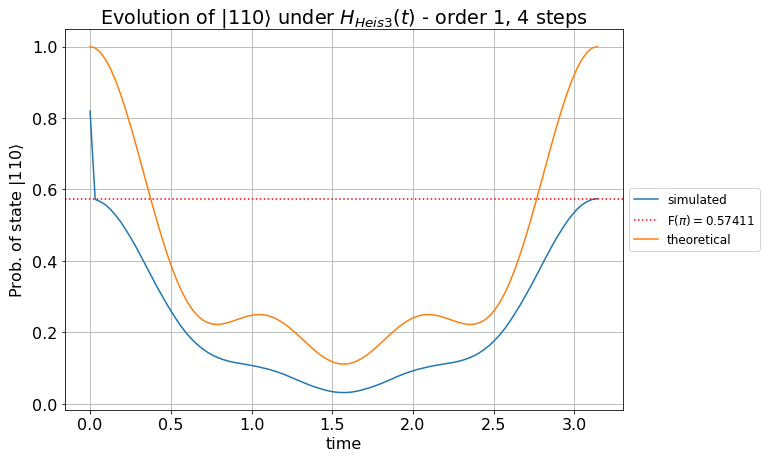




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 5                                   
                                 min time: 0.1                                  
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


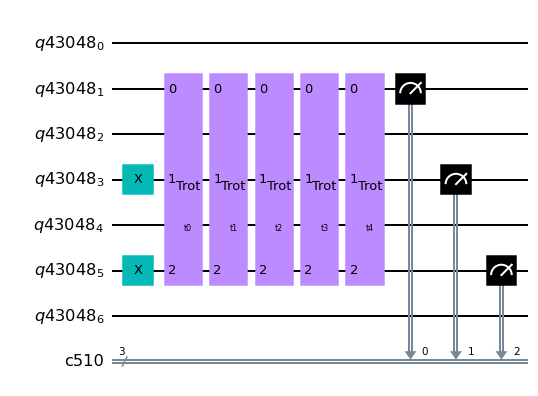

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.21763
Current parameters: [0.1   1.523 1.008 0.411 0.1  ] (sum to 3.14)

Iter 2 done!
Loss value: -0.3917
Current parameters: [0.1   1.231 1.45  0.1   0.261] (sum to 3.14)

Iter 3 done!
Loss value: -0.49374
Current parameters: [0.1   1.349 1.493 0.1   0.1  ] (sum to 3.14)

Iter 4 done!
Loss value: -0.50044
Current parameters: [0.1   1.41  1.431 0.1   0.1  ] (sum to 3.14)

Iter 5 done!
Loss value: -0.50053
Current parameters: [0.1   1.44  1.402 0.1   0.1  ] (sum to 3.14)

Iter 6 done!
Loss value: -0.50066
Current parameters: [0.1   1.435 1.406 0.1   0.1  ] (sum to 3.14)

Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.50068
            Iterations: 6
            Function evaluations: 48
            Gradient evaluations: 6

Total time of optimization: 00:00:28

Optimizer: SLSQP
eps = 

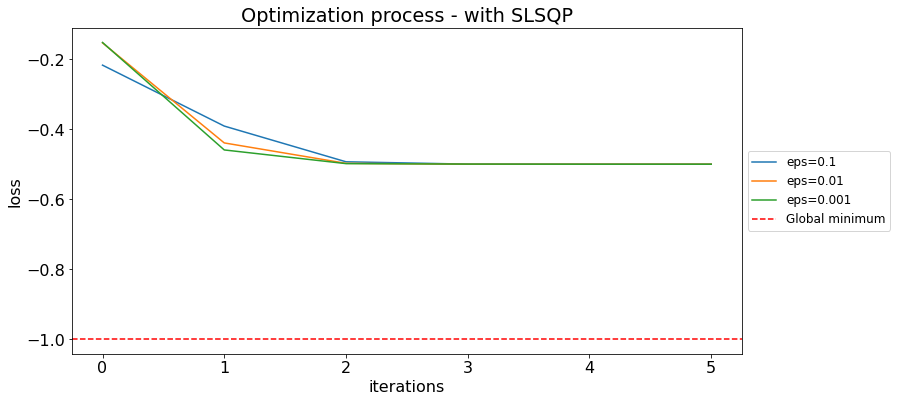


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.10000000000000002, 1.4204674816061003, 1.42...",-0.50069
0,slsqp,0.100,"[0.10000000000000002, 1.4261642347328423, 1.41...",-0.50068
2,slsqp,0.001,"[0.1, 1.4276722401435846, 1.4139204134462082, ...",-0.50068


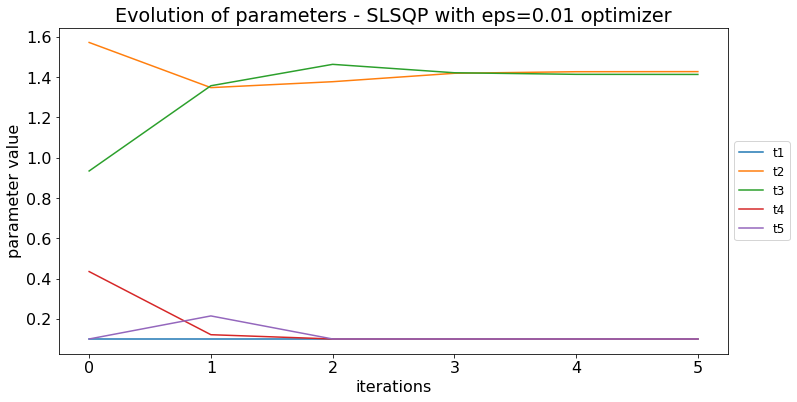

Best parameters (sum to 3.14):	[0.1   1.42  1.421 0.1   0.1  ]
Best parameters (sum to 1):	[0.032 0.452 0.452 0.032 0.032]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


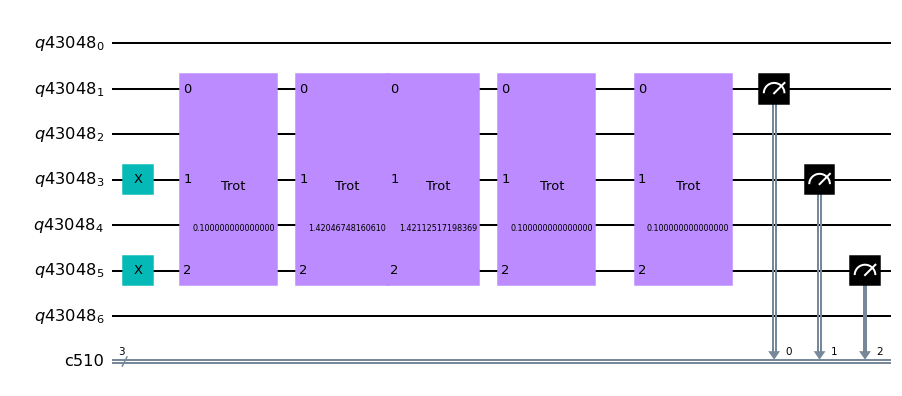

################################################################################
Single trotterization step:


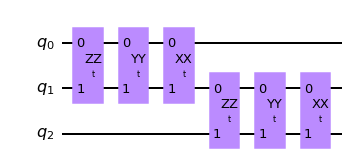

################################################################################

All steps + measurements of state tomography:


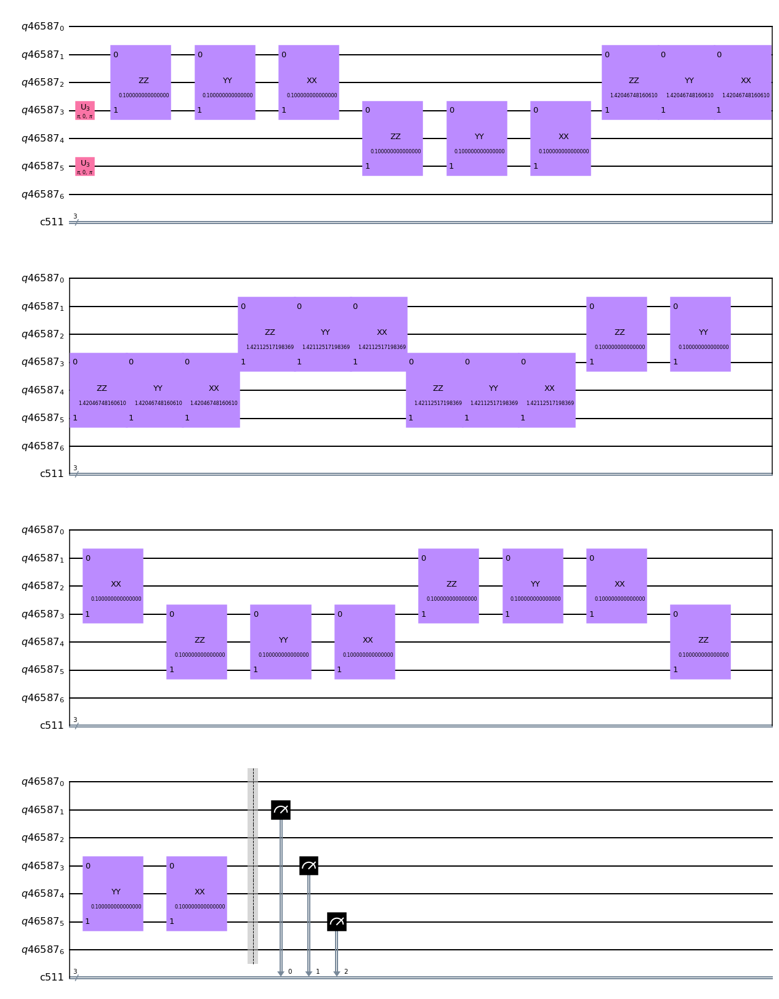

################################################################################

1/8 - Job ID 1ccdee89-987c-4fc9-aa35-ab5515dc9d9b
2/8 - Job ID fcdc9820-bcde-4d76-9b17-63287010fc7e
3/8 - Job ID d3479bf3-54a1-4d4b-95b1-babb3518efc5
4/8 - Job ID cad483d7-5b68-4bcc-a0c2-79ef903e9311
5/8 - Job ID 7dcf94d9-9b89-47fe-ba3d-90b45435f2fe
6/8 - Job ID b8169b97-d6fd-42bc-81f7-acbdcc9a6c7f
7/8 - Job ID 7bc454d4-d2a6-4dda-b58f-6a0af2c96fda
8/8 - Job ID a3fc2f11-4507-43dc-b612-8e4e3379f0e8

################################################################################

Final results - order: 1 - strotter steps: 5

State tomography fidelity = 0.5010 ± 0.0032

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:00:59



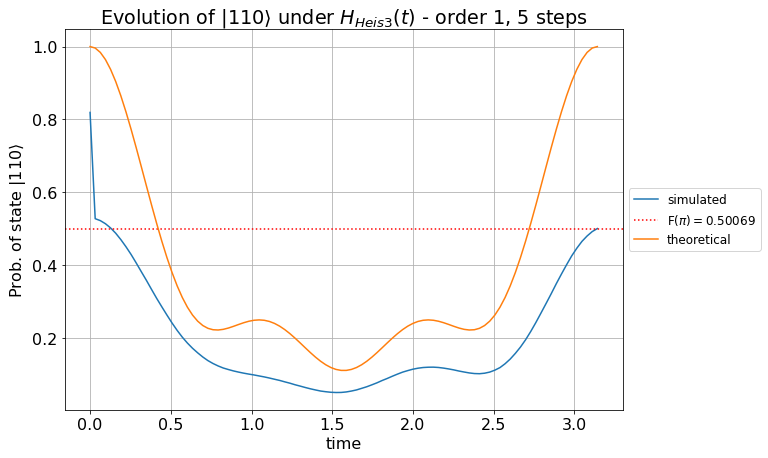




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 5                                   
                                 min time: 0.01                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


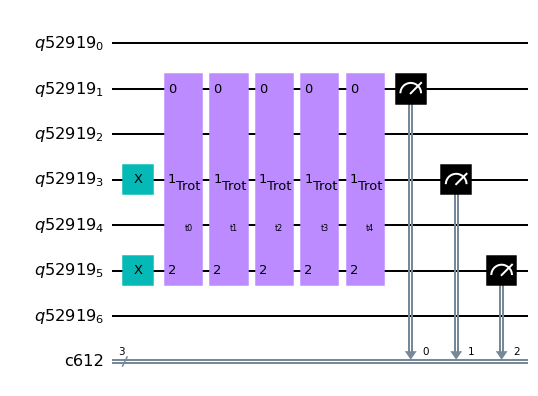

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.05835
Current parameters: [0.01  1.763 0.852 0.506 0.01 ] (sum to 3.14)

Iter 2 done!
Loss value: -0.33228
Current parameters: [0.01  1.595 1.087 0.285 0.165] (sum to 3.14)

Iter 3 done!
Loss value: -0.04917
Current parameters: [0.01  0.304 2.3   0.01  0.518] (sum to 3.14)

Iter 4 done!
Loss value: -0.52161
Current parameters: [0.01  1.538 1.474 0.01  0.11 ] (sum to 3.14)

Iter 5 done!
Loss value: -0.52819
Current parameters: [0.056 1.551 1.515 0.01  0.01 ] (sum to 3.14)

Iter 6 done!
Loss value: -0.52884
Current parameters: [0.036 1.553 1.524 0.016 0.011] (sum to 3.14)

Iter 7 done!
Loss value: -0.52939
Current parameters: [0.01  1.564 1.546 0.012 0.01 ] (sum to 3.14)

Iter 8 done!
Loss value: -0.52941
Current parameters: [0.01  1.564 1.548 0.01  0.01 ] (sum to 3.14)

Iter 9 done!
Loss value: -0.52941
Current parameters: [0.

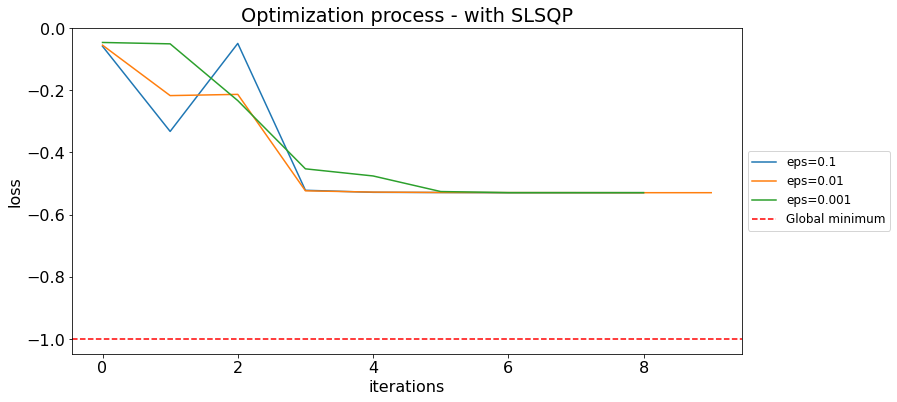


Optimization results:



,optimizer,eps,final_params,final_loss
0,slsqp,0.100,"[0.010000000000000005, 1.563732301548536, 1.54...",-0.52941
1,slsqp,0.010,"[0.01, 1.56155045505725, 1.5500421985325434, 0...",-0.52941
2,slsqp,0.001,"[0.010000561839912187, 1.5767116073229173, 1.5...",-0.52927


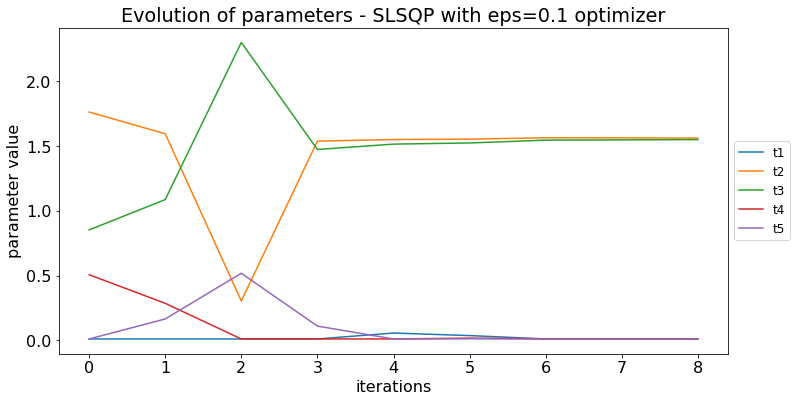

Best parameters (sum to 3.14):	[0.01  1.564 1.548 0.01  0.01 ]
Best parameters (sum to 1):	[0.003 0.498 0.493 0.003 0.003]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


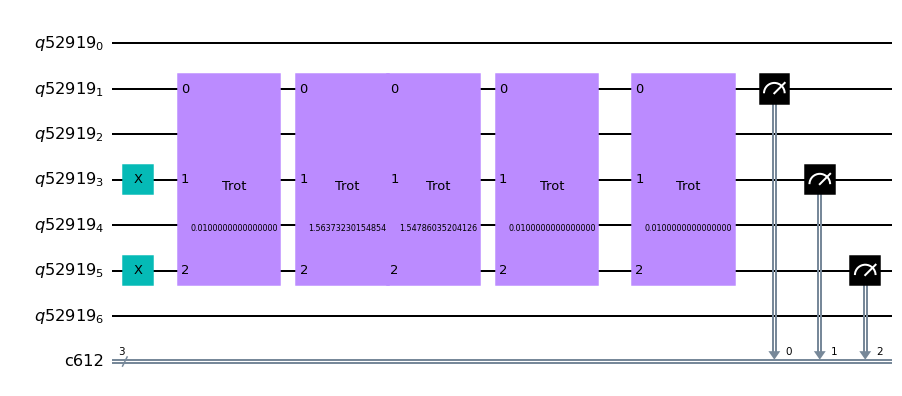

################################################################################
Single trotterization step:


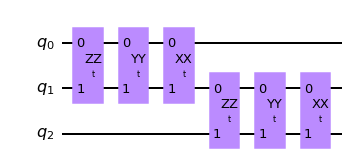

################################################################################

All steps + measurements of state tomography:


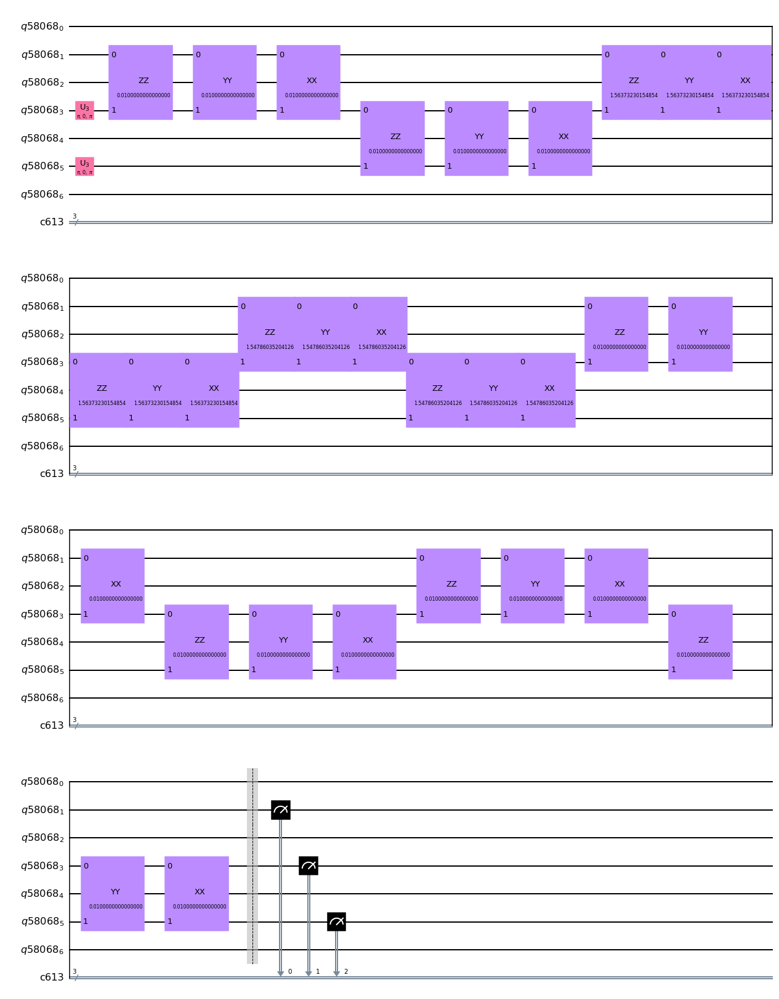

################################################################################

1/8 - Job ID 0805da4c-0f56-432c-89c1-dfc05adef414
2/8 - Job ID e262711a-a43c-4406-899b-397ae80ce2d3
3/8 - Job ID 4ff5ed35-54aa-4a7e-8f79-423969a202e5
4/8 - Job ID 5079d9f8-80a1-4f35-a053-8f2011214b64
5/8 - Job ID 44676bab-22af-41b9-9730-3996d604b73a
6/8 - Job ID 2429773d-9412-4054-965f-aff64ef33ba9
7/8 - Job ID 4046e11a-275a-4b36-a1a9-b9c0e6077970
8/8 - Job ID d94d7180-8b4f-4035-b3c3-619ab5bc30ed

################################################################################

Final results - order: 1 - strotter steps: 5

State tomography fidelity = 0.5301 ± 0.0016

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:00:57



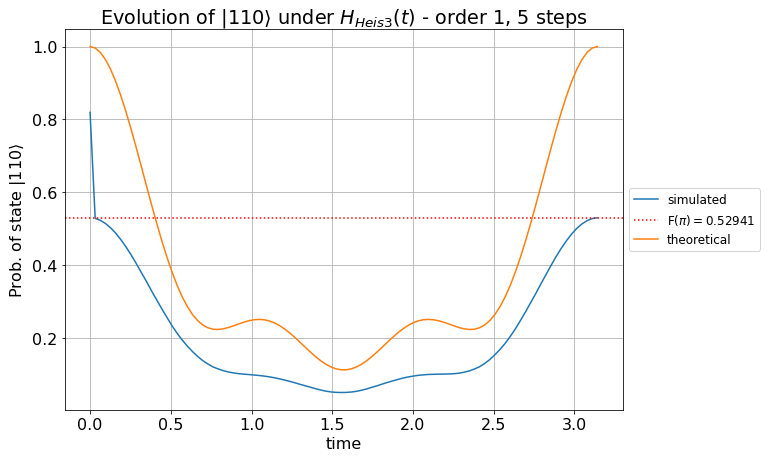




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 5                                   
                                min time: 0.001                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


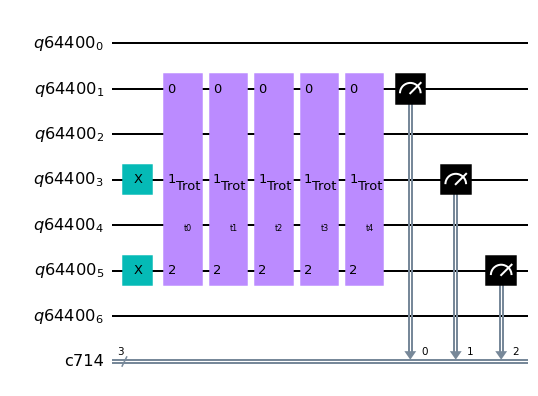

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.05211
Current parameters: [1.000e-03 1.787e+00 8.397e-01 5.134e-01 1.000e-03] (sum to 3.14)

Iter 2 done!
Loss value: -0.25088
Current parameters: [1.000e-03 1.665e+00 1.015e+00 3.291e-01 1.307e-01] (sum to 3.14)

Iter 3 done!
Loss value: -0.03842
Current parameters: [1.000e-03 1.781e-01 2.341e+00 1.000e-03 6.205e-01] (sum to 3.14)

Iter 4 done!
Loss value: -0.52451
Current parameters: [1.000e-03 1.558e+00 1.487e+00 1.000e-03 9.388e-02] (sum to 3.14)

Iter 5 done!
Loss value: -0.52868
Current parameters: [4.389e-02 1.565e+00 1.531e+00 1.000e-03 1.000e-03] (sum to 3.14)

Iter 6 done!
Loss value: -0.52916
Current parameters: [0.027 1.56  1.534 0.014 0.007] (sum to 3.14)

Iter 7 done!
Loss value: -0.52941
Current parameters: [1.133e-02 1.561e+00 1.548e+00 1.905e-02 1.456e-03] (sum to 3.14)

Iter 8 done!
Loss value: -0.52954
Curr

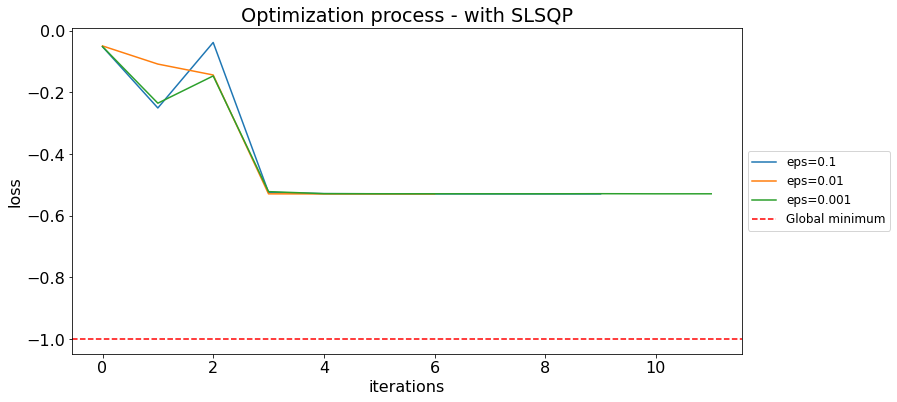


Optimization results:



,optimizer,eps,final_params,final_loss
0,slsqp,0.100,"[0.0010003879226125475, 1.5720226639167176, 1....",-0.52956
1,slsqp,0.010,"[0.00570218285486131, 1.5601350853697373, 1.57...",-0.52956
2,slsqp,0.001,"[0.029594515941771697, 1.525054693242829, 1.58...",-0.52924


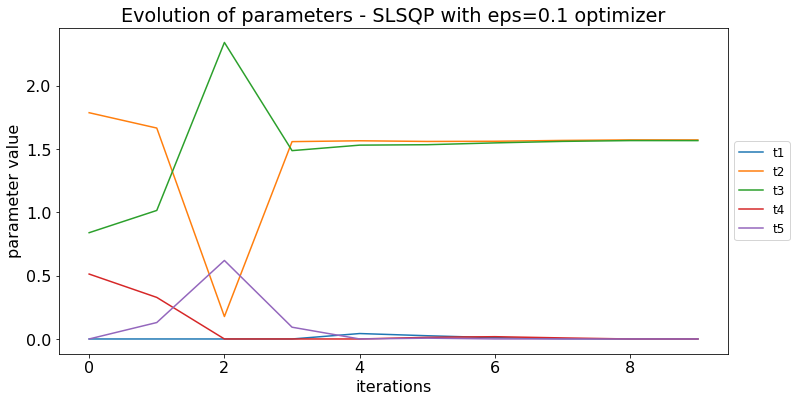

Best parameters (sum to 3.14):	[1.000e-03 1.572e+00 1.567e+00 1.000e-03 1.000e-03]
Best parameters (sum to 1):	[3.184e-04 5.004e-01 4.987e-01 3.183e-04 3.183e-04]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


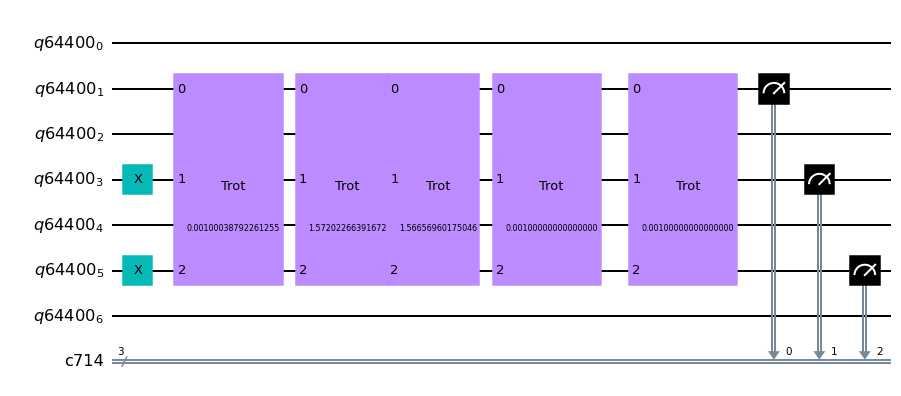

################################################################################
Single trotterization step:


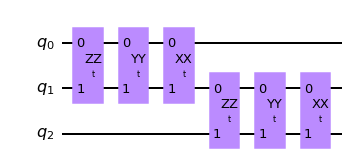

################################################################################

All steps + measurements of state tomography:


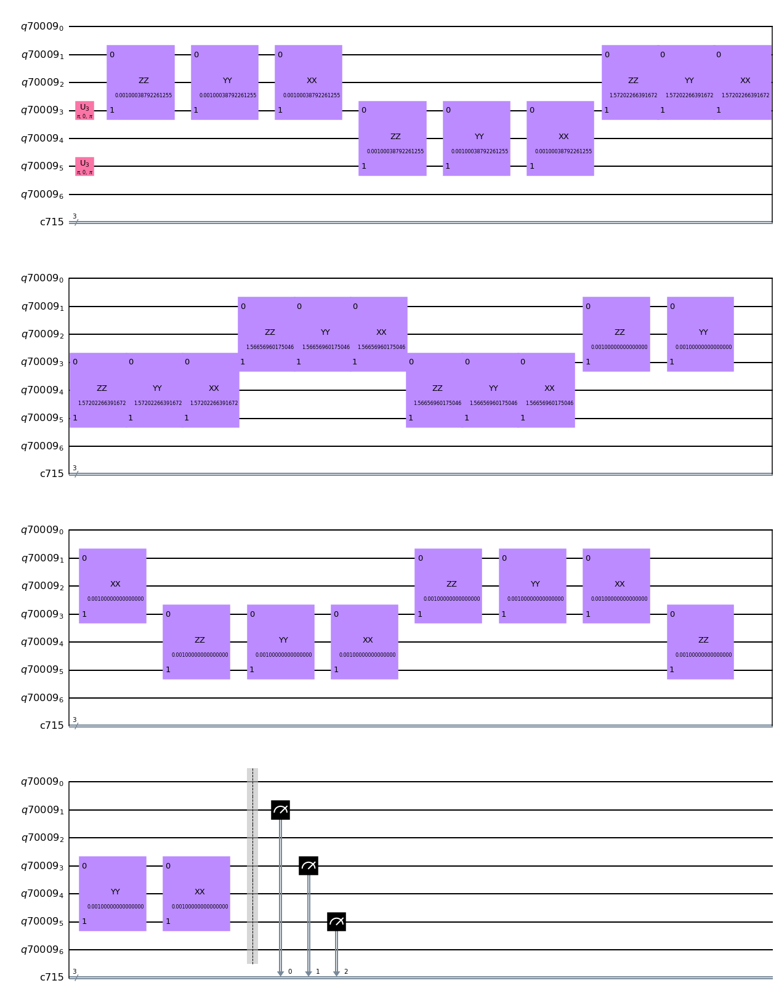

################################################################################

1/8 - Job ID f2d3c763-9879-41b0-bd7c-9764f9ec6a2c
2/8 - Job ID 6f53b597-259a-47f4-ade7-bce617c0fdd0
3/8 - Job ID 505f9723-09bc-4772-80ec-326126c14f82
4/8 - Job ID ac8a12a6-e3ec-4d18-8b4f-f1cd0ff660d0
5/8 - Job ID b885492d-33e5-44ef-af92-39bc506b7bc6
6/8 - Job ID fc90de67-7d4e-4596-bb82-dc961e81484f
7/8 - Job ID 1e9df3b4-e51b-4230-85d6-479b456a534b
8/8 - Job ID c3f29959-6a3a-49c6-b8fc-0c35edcfcb20

################################################################################

Final results - order: 1 - strotter steps: 5

State tomography fidelity = 0.5303 ± 0.0023

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:00:58



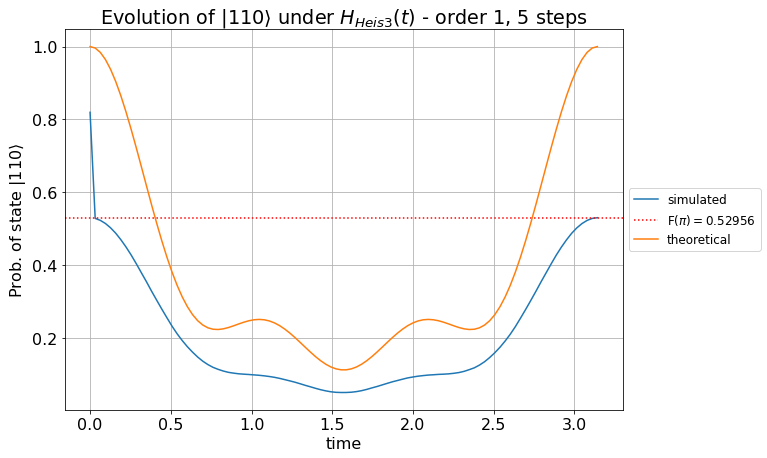




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 5                                   
                                min time: 0.0005                                
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


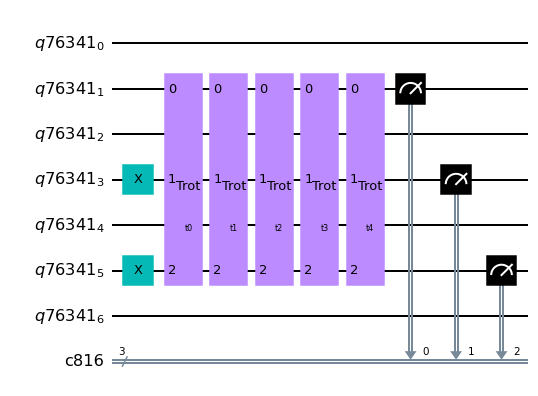

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.05193
Current parameters: [5.000e-04 1.788e+00 8.396e-01 5.134e-01 5.000e-04] (sum to 3.14)

Iter 2 done!
Loss value: -0.24855
Current parameters: [5.000e-04 1.668e+00 1.014e+00 3.303e-01 1.294e-01] (sum to 3.14)

Iter 3 done!
Loss value: -0.03876
Current parameters: [5.000e-04 1.824e-01 2.337e+00 5.000e-04 6.209e-01] (sum to 3.14)

Iter 4 done!
Loss value: -0.52453
Current parameters: [5.000e-04 1.560e+00 1.487e+00 5.000e-04 9.388e-02] (sum to 3.14)

Iter 5 done!
Loss value: -0.52868
Current parameters: [4.373e-02 1.566e+00 1.531e+00 5.000e-04 5.000e-04] (sum to 3.14)

Iter 6 done!
Loss value: -0.52916
Current parameters: [0.026 1.56  1.534 0.014 0.007] (sum to 3.14)

Iter 7 done!
Loss value: -0.52941
Current parameters: [1.214e-02 1.561e+00 1.548e+00 1.911e-02 1.300e-03] (sum to 3.14)

Iter 8 done!
Loss value: -0.52955
Curr

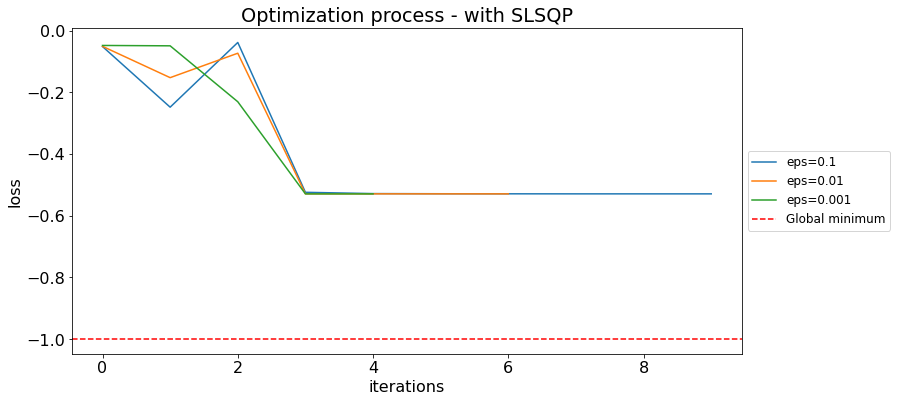


Optimization results:



,optimizer,eps,final_params,final_loss
2,slsqp,0.001,"[0.0005000000000000004, 3.1395926535896734, 0....",-0.52963
0,slsqp,0.100,"[0.000500636610999449, 1.572457600783818, 1.56...",-0.52956
1,slsqp,0.010,"[0.007714576907411492, 1.559497973518668, 1.57...",-0.52956


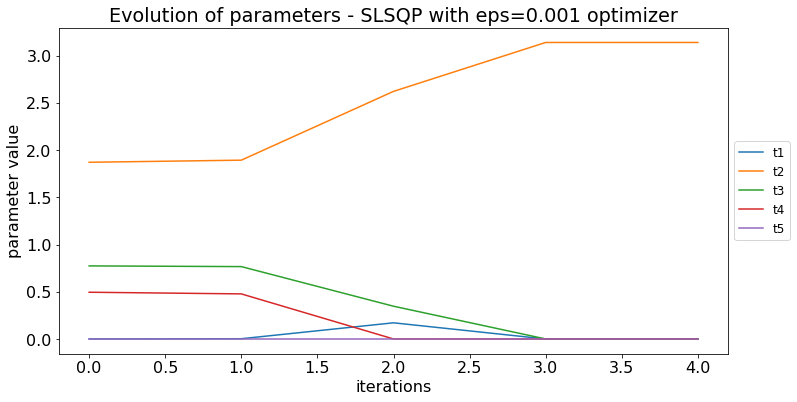

Best parameters (sum to 3.14):	[5.00e-04 3.14e+00 5.00e-04 5.00e-04 5.00e-04]
Best parameters (sum to 1):	[1.592e-04 9.994e-01 1.592e-04 1.592e-04 1.592e-04]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


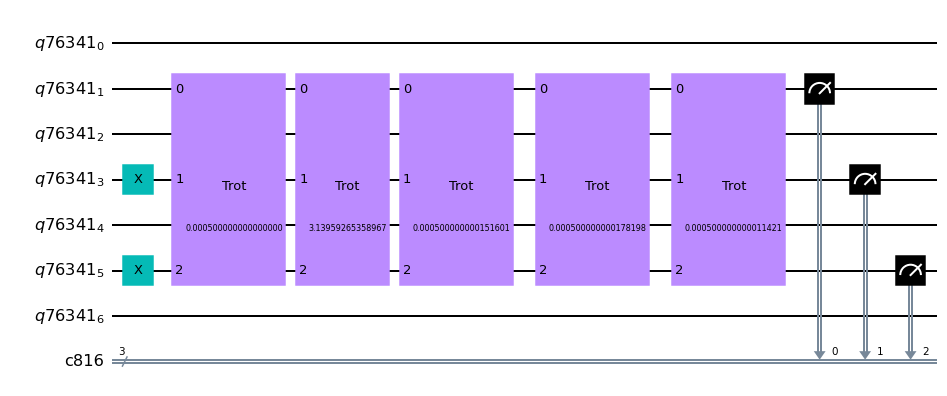

################################################################################
Single trotterization step:


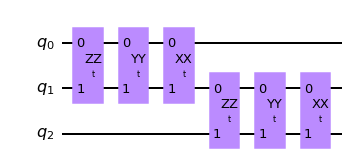

################################################################################

All steps + measurements of state tomography:


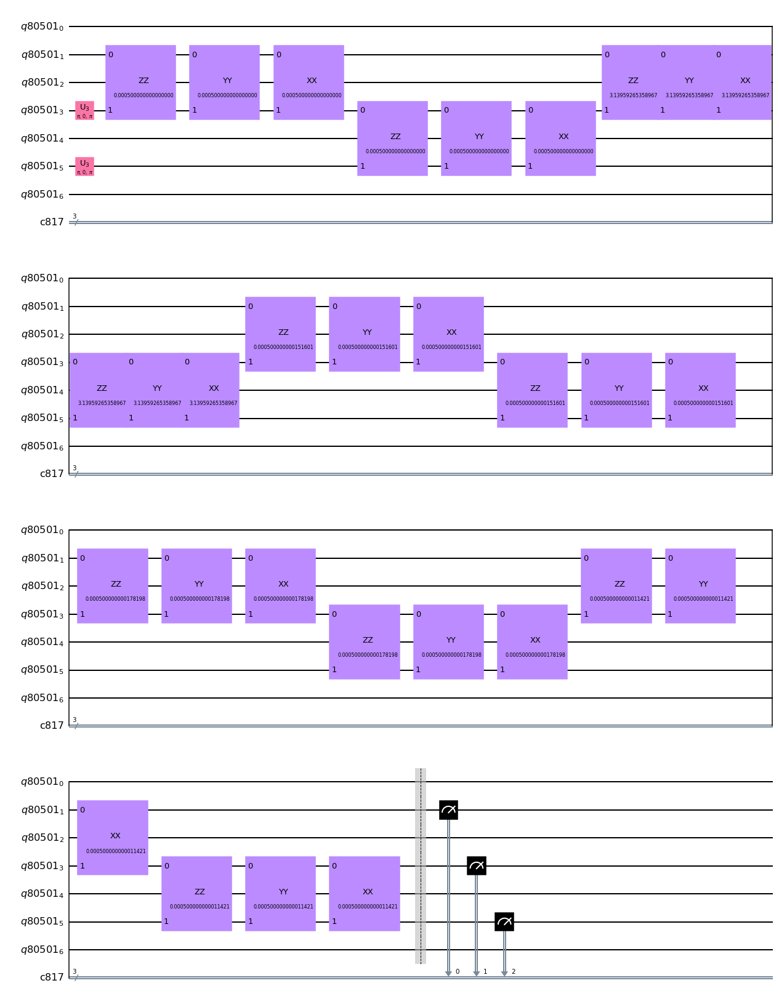

################################################################################

1/8 - Job ID bfb86f6f-8f31-461b-8ab3-501c1345f56c
2/8 - Job ID c0e7be38-6f60-461e-8216-2cc6635e96ee
3/8 - Job ID 05a000a8-0517-461a-97ff-f2c547b9ac2f
4/8 - Job ID cb0b4e64-7a1b-4b9e-b2d6-fc3614efde34
5/8 - Job ID f43c3489-ed15-41d4-844e-db681bf786fc
6/8 - Job ID 54954108-d6a3-4498-b127-8d471f527e04
7/8 - Job ID 803d97e0-2090-404b-a9a8-dac3d99dc010
8/8 - Job ID 1fbe51f3-eaad-4485-8506-71c9b505c7d5

################################################################################

Final results - order: 1 - strotter steps: 5

State tomography fidelity = 0.5315 ± 0.0025

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:00:56



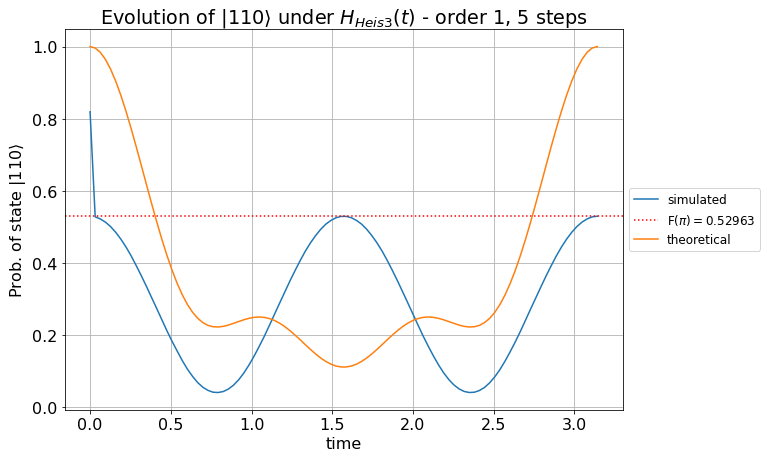




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 6                                   
                                 min time: 0.1                                  
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


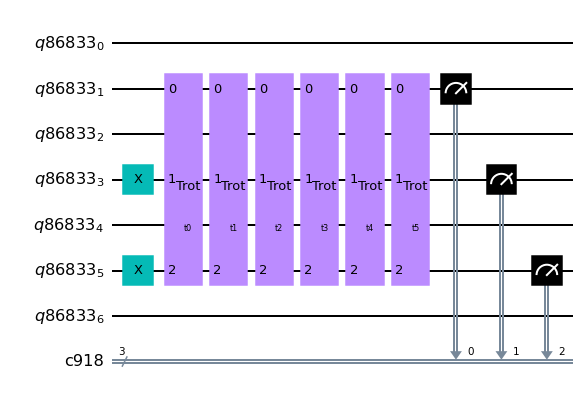

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.4058
Current parameters: [0.1   1.531 1.211 0.1   0.1   0.1  ] (sum to 3.14)

Iter 2 done!
Loss value: -0.4302
Current parameters: [0.1   1.315 1.427 0.1   0.1   0.1  ] (sum to 3.14)

Iter 3 done!
Loss value: -0.43576
Current parameters: [0.1   1.368 1.374 0.1   0.1   0.1  ] (sum to 3.14)

Iter 4 done!
Loss value: -0.43571
Current parameters: [0.1   1.4   1.342 0.1   0.1   0.1  ] (sum to 3.14)

Iter 5 done!
Loss value: -0.43586
Current parameters: [0.1   1.397 1.345 0.1   0.1   0.1  ] (sum to 3.14)

Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43612
            Iterations: 5
            Function evaluations: 47
            Gradient evaluations: 5

Total time of optimization: 00:00:28

Optimizer: SLSQP
eps = 0.01

Iter 1 done!
Loss value: -0.40933
Current parameters: [0.1   1.499

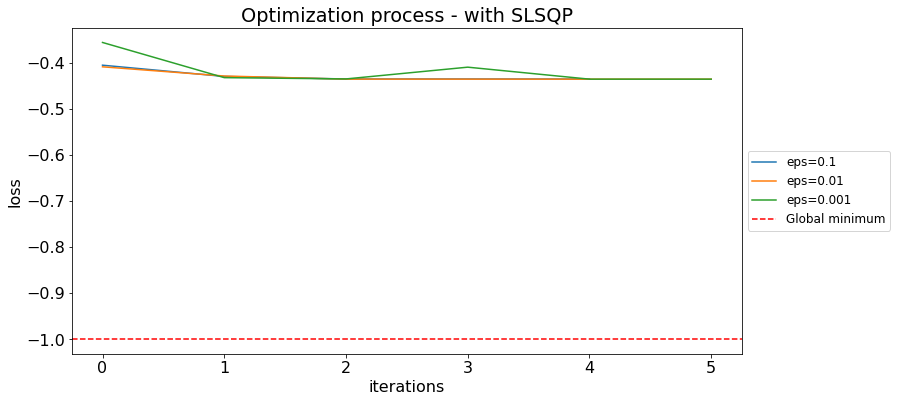


Optimization results:



,optimizer,eps,final_params,final_loss
0,slsqp,0.100,"[0.1, 1.3833466178789675, 1.3582460357108253, ...",-0.43612
1,slsqp,0.010,"[0.1, 1.3852492220332906, 1.3563434315565024, ...",-0.43611
2,slsqp,0.001,"[0.10000000000000005, 1.3868926521946727, 1.35...",-0.43609


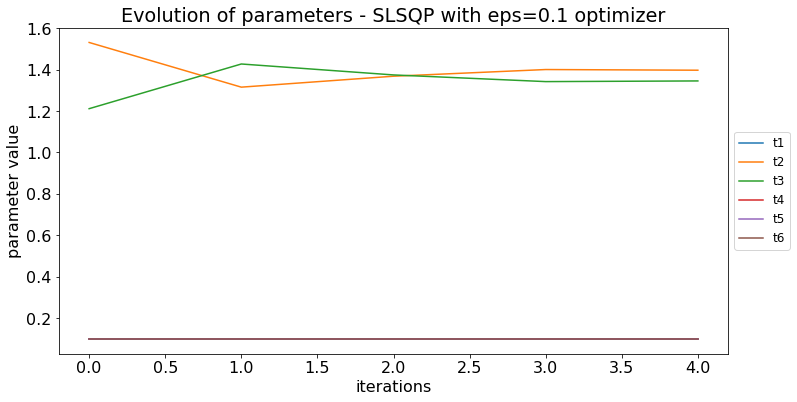

Best parameters (sum to 3.14):	[0.1   1.383 1.358 0.1   0.1   0.1  ]
Best parameters (sum to 1):	[0.032 0.44  0.432 0.032 0.032 0.032]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


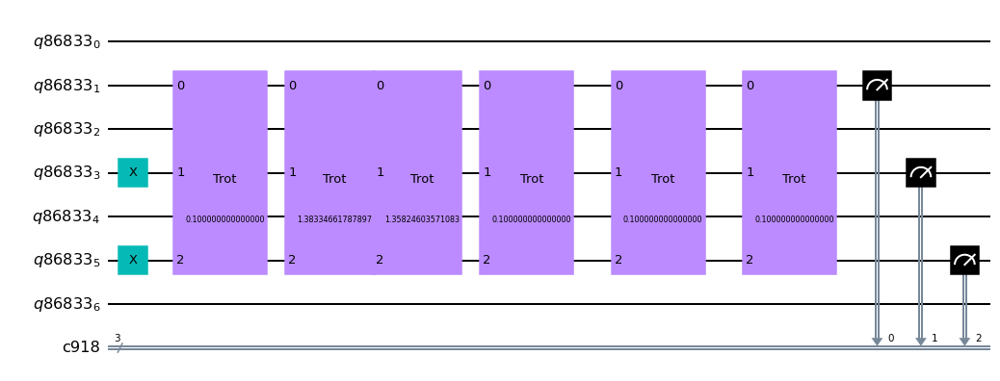

################################################################################
Single trotterization step:


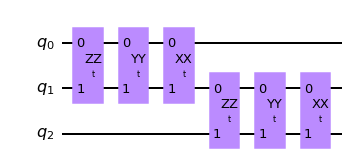

################################################################################

All steps + measurements of state tomography:


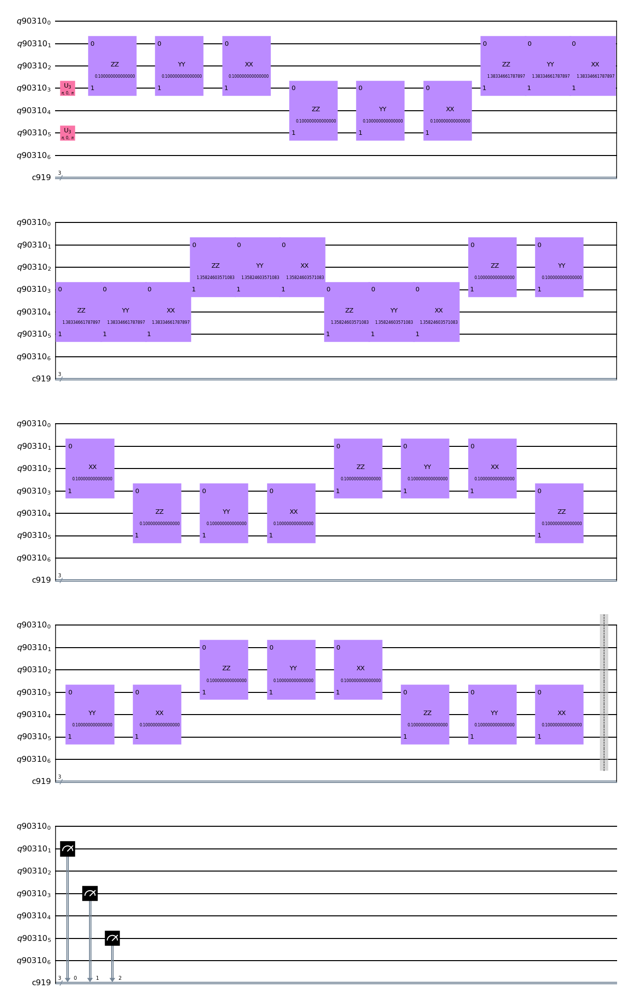

################################################################################

1/8 - Job ID ea5b5599-ecf4-4090-b627-3aecf85a5594
2/8 - Job ID 86d37d35-458c-42c2-8a83-9b927cc31cae
3/8 - Job ID 10560c61-7bc6-4a81-aa96-d126053ebb3b
4/8 - Job ID 4d13f567-0db1-4774-9900-9f66c16780fe
5/8 - Job ID f811bb3c-d210-4e7b-8cac-bcd2eadb7081
6/8 - Job ID 91421c51-1caa-428c-bd9a-dd3d1cec5897
7/8 - Job ID a00fee15-1a0c-40e3-bdca-511a5b452714
8/8 - Job ID ca483928-baa9-45df-9f6e-7e9fde832436

################################################################################

Final results - order: 1 - strotter steps: 6

State tomography fidelity = 0.4352 ± 0.0022

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:00



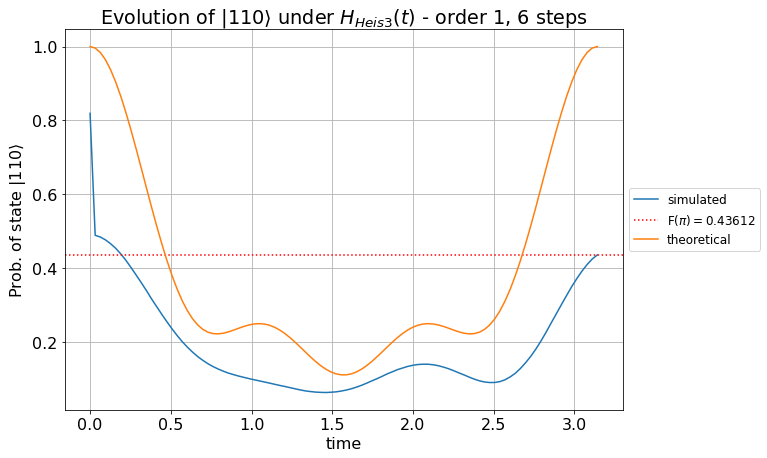




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 6                                   
                                 min time: 0.01                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


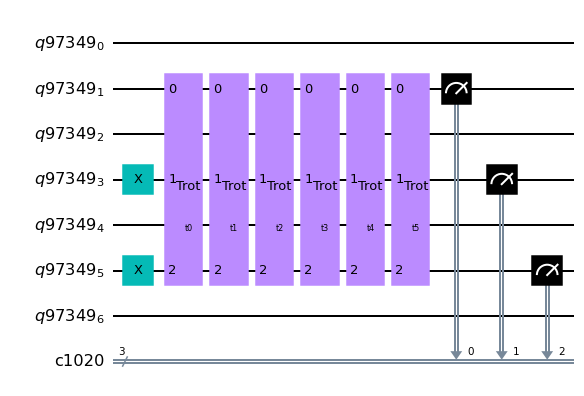

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.41741
Current parameters: [0.01  1.495 1.311 0.305 0.01  0.01 ] (sum to 3.14)

Iter 2 done!
Loss value: -0.47795
Current parameters: [0.01  1.48  1.491 0.01  0.089 0.062] (sum to 3.14)

Iter 3 done!
Loss value: -0.48965
Current parameters: [0.018 1.536 1.542 0.01  0.026 0.01 ] (sum to 3.14)

Iter 4 done!
Loss value: -0.49029
Current parameters: [0.01  1.551 1.55  0.01  0.01  0.01 ] (sum to 3.14)

Iter 5 done!
Loss value: -0.49029
Current parameters: [0.01  1.553 1.549 0.01  0.01  0.01 ] (sum to 3.14)

Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49029
            Iterations: 5
            Function evaluations: 46
            Gradient evaluations: 5

Total time of optimization: 00:00:28

Optimizer: SLSQP
eps = 0.01

Iter 1 done!
Loss value: -0.35652
Current parameters: [0.01  1.4

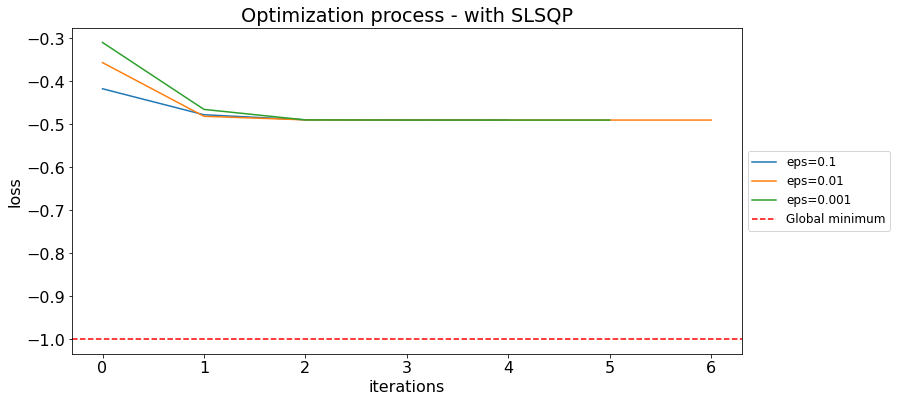


Optimization results:



,optimizer,eps,final_params,final_loss
0,slsqp,0.100,"[0.010362989889260066, 1.551179278552409, 1.55...",-0.49029
1,slsqp,0.010,"[0.01, 1.5542006506933652, 1.5473920028964285,...",-0.49029
2,slsqp,0.001,"[0.01, 1.5470437805858466, 1.554548873003946, ...",-0.49028


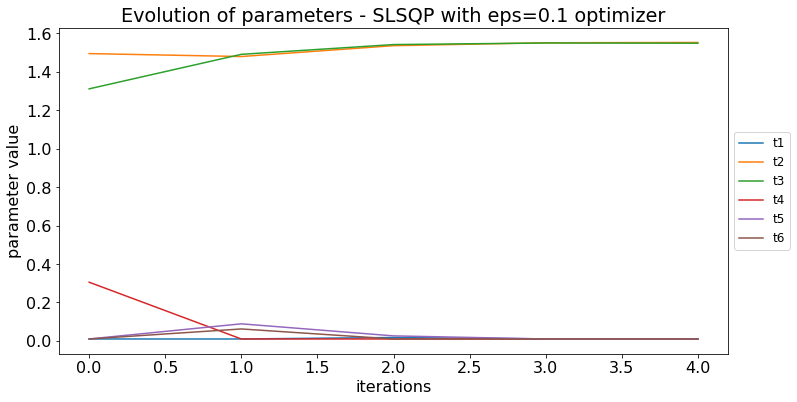

Best parameters (sum to 3.14):	[0.01  1.551 1.55  0.01  0.01  0.01 ]
Best parameters (sum to 1):	[0.003 0.494 0.493 0.003 0.003 0.003]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


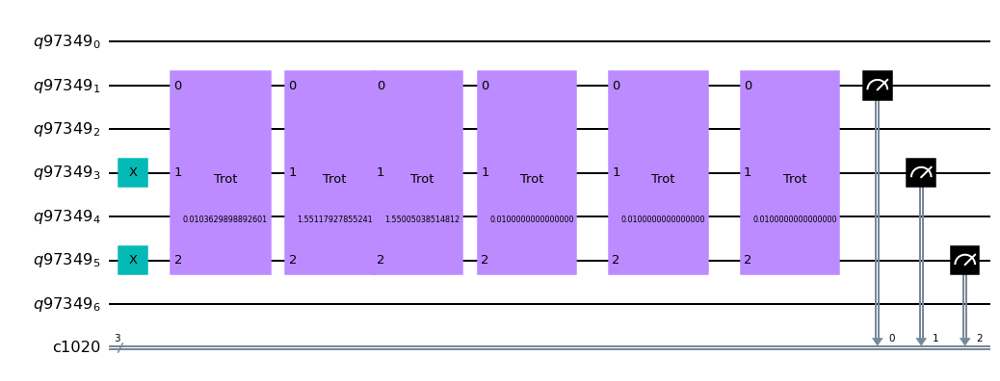

################################################################################
Single trotterization step:


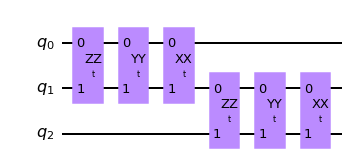

################################################################################

All steps + measurements of state tomography:


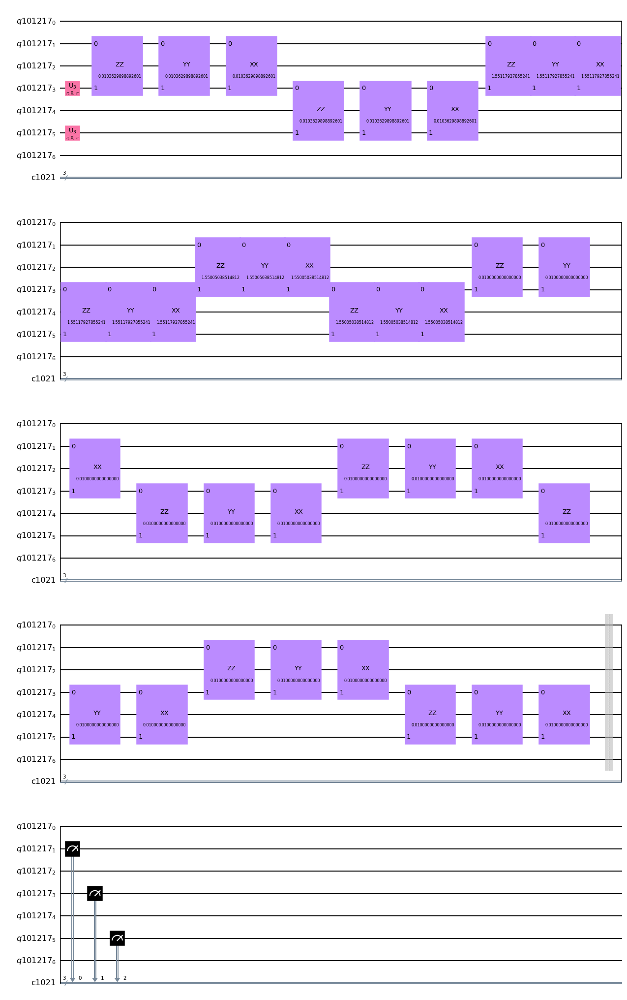

################################################################################

1/8 - Job ID 0b33ec92-e89f-4edb-ab3a-2dd105ded3ea
2/8 - Job ID de1ce798-5057-4121-b335-3dc563445a39
3/8 - Job ID 7c238410-94d4-4bce-a6a0-4fda1c32d13a
4/8 - Job ID 87a2a249-dbcf-4a06-8c0d-9db25d4e6f4a
5/8 - Job ID fde60bdf-e357-48eb-aa06-06c1d3d24125
6/8 - Job ID ab26f21d-4e4b-4bc9-8bf0-b170e48d9fb6
7/8 - Job ID 7c61dc44-35d1-4d45-b5fb-b07d66ecfcac
8/8 - Job ID c0ca0a8e-5c7b-4272-9455-3ec2777f5097

################################################################################

Final results - order: 1 - strotter steps: 6

State tomography fidelity = 0.4921 ± 0.0027

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:01



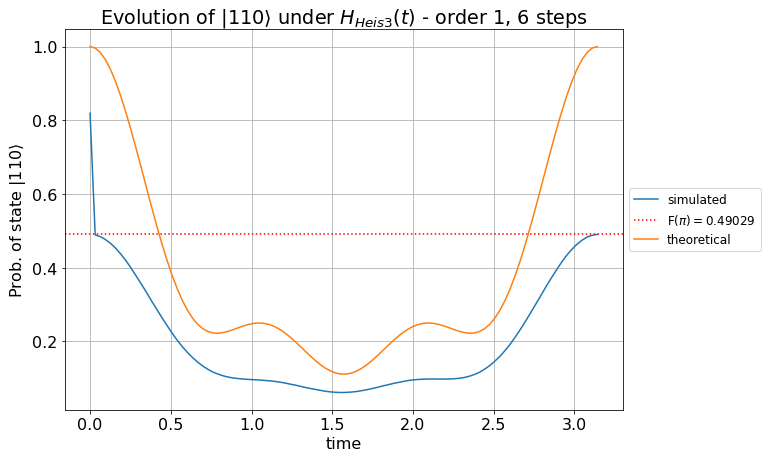




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 6                                   
                                min time: 0.001                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


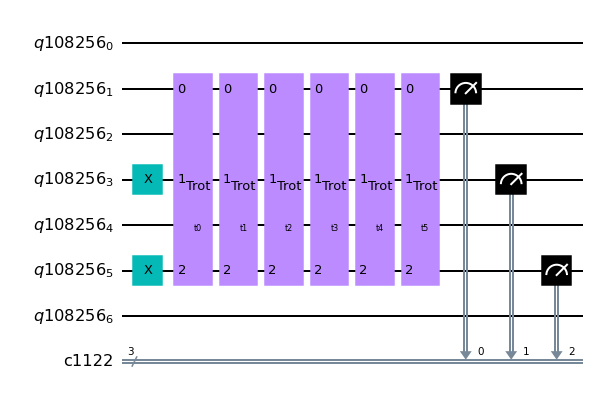

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.40293
Current parameters: [1.000e-03 1.501e+00 1.304e+00 3.339e-01 1.000e-03 1.000e-03] (sum to 3.14)

Iter 2 done!
Loss value: -0.46823
Current parameters: [1.000e-03 1.443e+00 1.494e+00 1.000e-03 1.140e-01 8.764e-02] (sum to 3.14)

Iter 3 done!
Loss value: -0.48895
Current parameters: [1.061e-02 1.520e+00 1.559e+00 1.000e-03 5.021e-02 1.000e-03] (sum to 3.14)

Iter 4 done!
Loss value: -0.49067
Current parameters: [1.290e-02 1.551e+00 1.574e+00 1.000e-03 1.000e-03 1.000e-03] (sum to 3.14)

Iter 5 done!
Loss value: -0.49068
Current parameters: [8.862e-03 1.556e+00 1.573e+00 1.000e-03 1.000e-03 1.000e-03] (sum to 3.14)

Iter 6 done!
Loss value: -0.49069
Current parameters: [1.188e-03 1.568e+00 1.570e+00 1.000e-03 1.000e-03 1.000e-03] (sum to 3.14)

Iter 7 done!
Loss value: -0.49069
Current parameters: [1.772e-03 1.568e+00 1.56

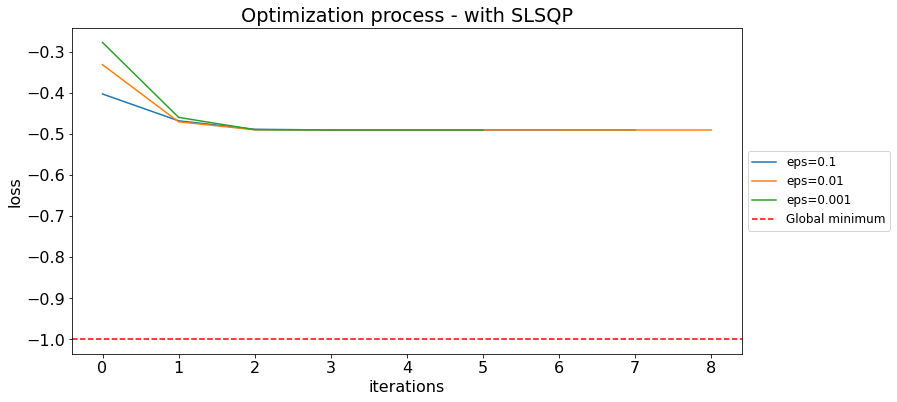


Optimization results:



,optimizer,eps,final_params,final_loss
0,slsqp,0.100,"[0.0014796098234385764, 1.568081721352316, 1.5...",-0.49070
1,slsqp,0.010,"[0.0010482120900142807, 1.5697852779097405, 1....",-0.49070
2,slsqp,0.001,"[0.0010000000000000026, 1.564655583630676, 1.5...",-0.49069


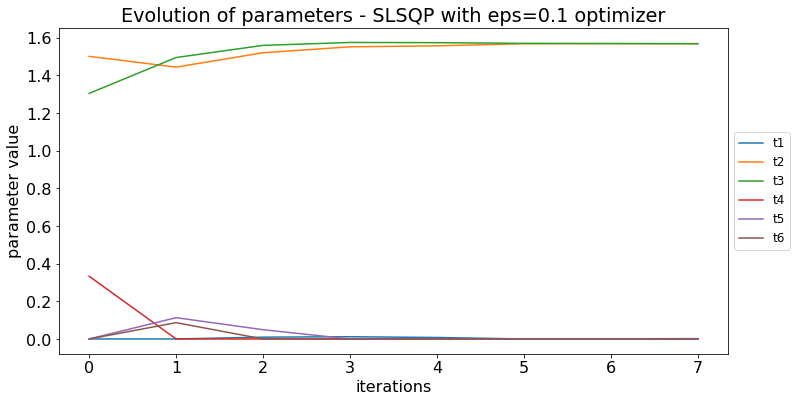

Best parameters (sum to 3.14):	[1.480e-03 1.568e+00 1.569e+00 1.000e-03 1.000e-03 1.000e-03]
Best parameters (sum to 1):	[4.710e-04 4.991e-01 4.994e-01 3.183e-04 3.183e-04 3.183e-04]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


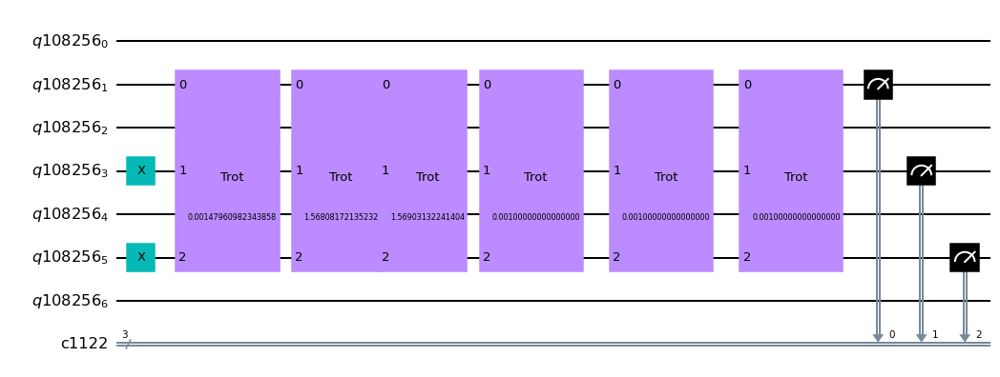

################################################################################
Single trotterization step:


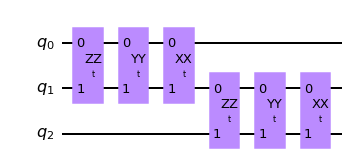

################################################################################

All steps + measurements of state tomography:


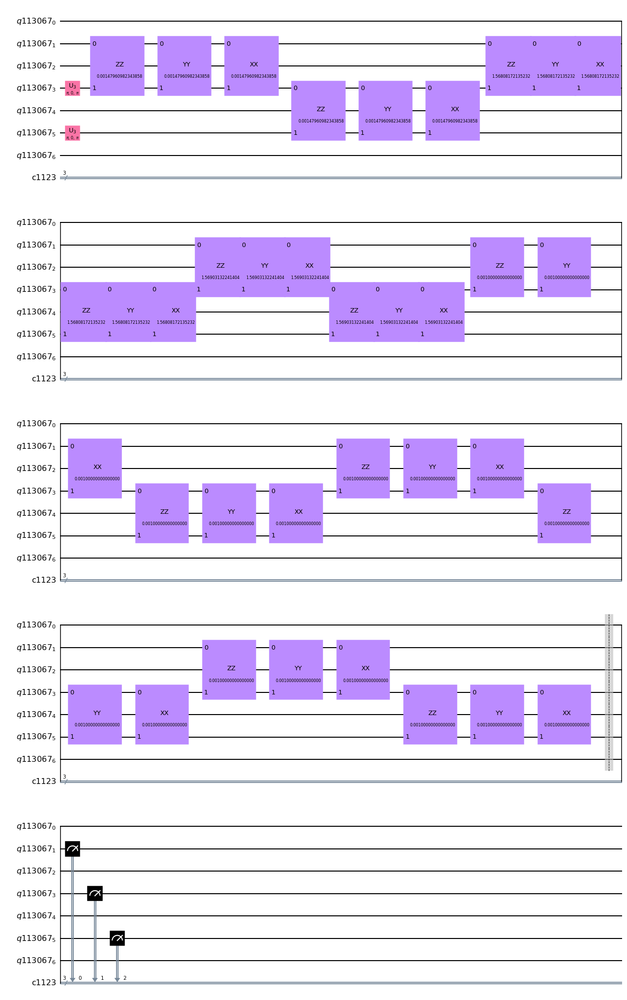

################################################################################

1/8 - Job ID da75177d-6b53-4e10-9dc8-77adc3610fe4
2/8 - Job ID 890c598f-ced5-4d45-8b86-fd44e36b6705
3/8 - Job ID 26f3a2b0-684b-461e-b371-c6642dcc2b42
4/8 - Job ID 04908a4f-9e9a-4907-97a1-9b9d928c15ce
5/8 - Job ID ecaf1fae-b48d-4e05-a01e-61be1ec6215b
6/8 - Job ID 80d06262-cf56-42cc-8a0c-e4708ca9fbdf
7/8 - Job ID a4e8257d-ebde-488f-bf0a-18a2950f45e0
8/8 - Job ID 092804f2-8ae7-4fd7-a42b-daf6cc9c2fd7

################################################################################

Final results - order: 1 - strotter steps: 6

State tomography fidelity = 0.4895 ± 0.0014

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:00



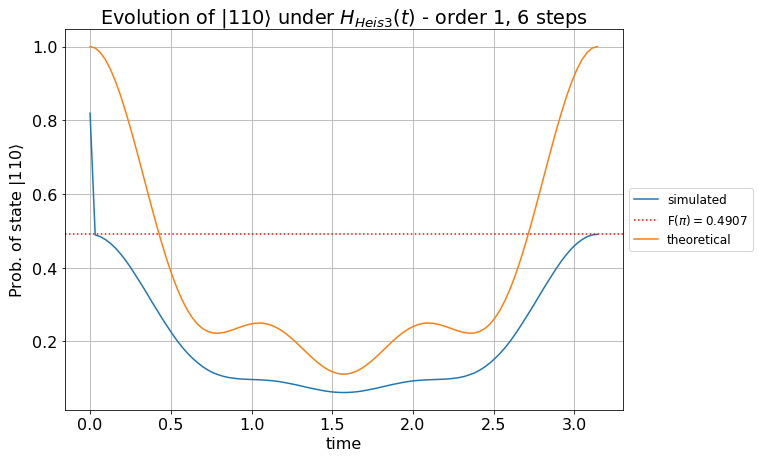




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 6                                   
                                min time: 0.0005                                
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


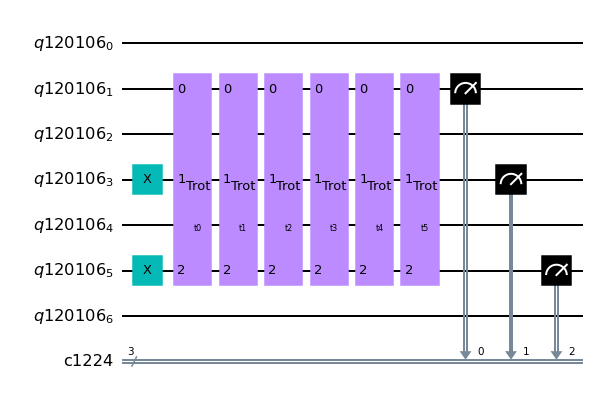

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.40188
Current parameters: [5.000e-04 1.501e+00 1.303e+00 3.359e-01 5.000e-04 5.000e-04] (sum to 3.14)

Iter 2 done!
Loss value: -0.46769
Current parameters: [5.000e-04 1.442e+00 1.493e+00 5.000e-04 1.163e-01 8.886e-02] (sum to 3.14)

Iter 3 done!
Loss value: -0.48892
Current parameters: [9.801e-03 1.520e+00 1.560e+00 5.000e-04 5.131e-02 5.000e-04] (sum to 3.14)

Iter 4 done!
Loss value: -0.49067
Current parameters: [1.268e-02 1.551e+00 1.575e+00 5.000e-04 1.605e-03 5.000e-04] (sum to 3.14)

Iter 5 done!
Loss value: -0.49068
Current parameters: [8.874e-03 1.557e+00 1.575e+00 5.000e-04 5.000e-04 5.000e-04] (sum to 3.14)

Iter 6 done!
Loss value: -0.4907
Current parameters: [1.454e-03 1.568e+00 1.571e+00 5.000e-04 5.000e-04 5.000e-04] (sum to 3.14)

Iter 7 done!
Loss value: -0.4907
Current parameters: [1.434e-03 1.569e+00 1.570e

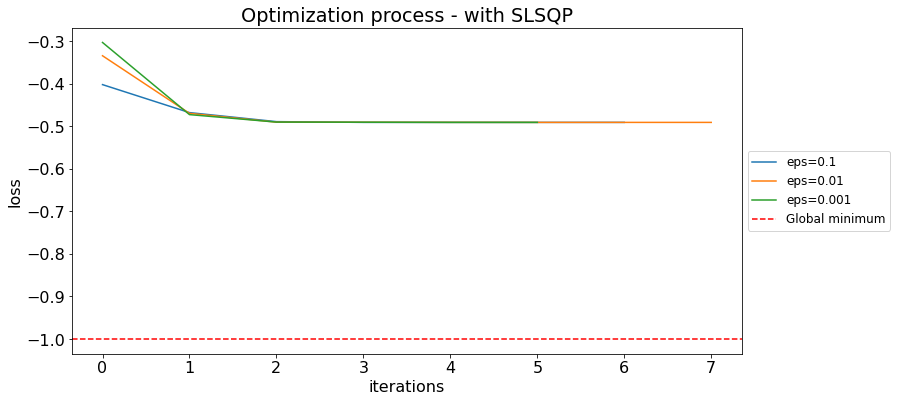


Optimization results:



,optimizer,eps,final_params,final_loss
0,slsqp,0.100,"[0.0014542523057605751, 1.567753820530556, 1.5...",-0.49070
1,slsqp,0.010,"[0.0005000000000000009, 1.5723270341896862, 1....",-0.49070
2,slsqp,0.001,"[0.010907354332197115, 1.5598960268902615, 1.5...",-0.49068


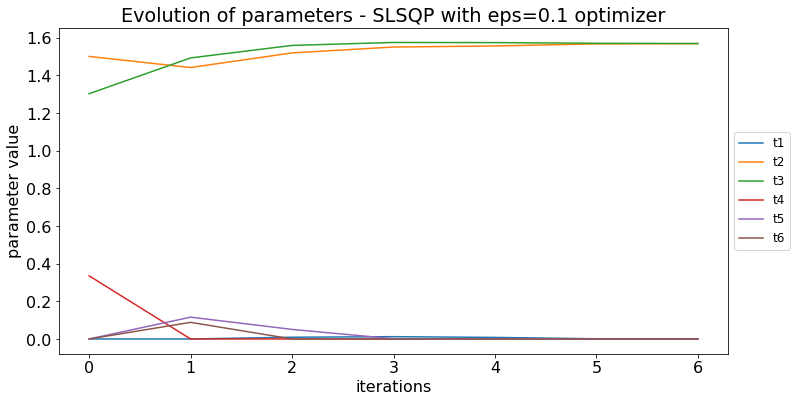

Best parameters (sum to 3.14):	[1.454e-03 1.568e+00 1.571e+00 5.000e-04 5.000e-04 5.000e-04]
Best parameters (sum to 1):	[4.629e-04 4.990e-01 5.000e-01 1.592e-04 1.592e-04 1.592e-04]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


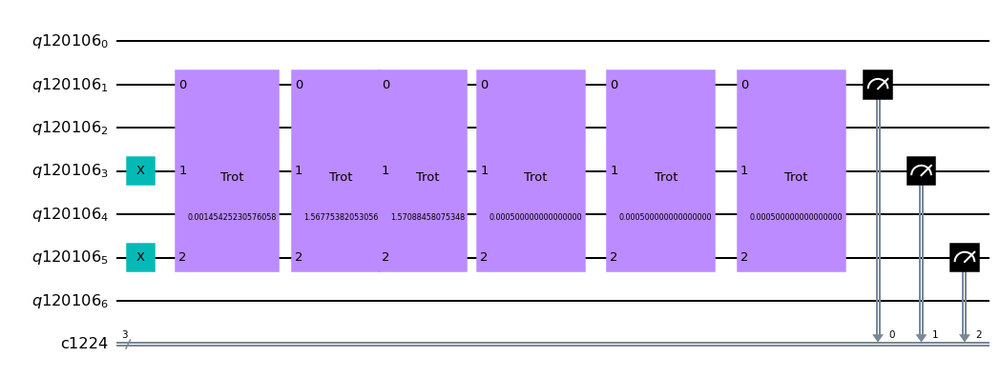

################################################################################
Single trotterization step:


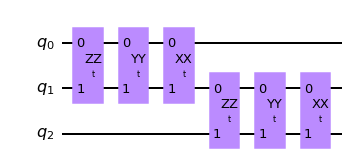

################################################################################

All steps + measurements of state tomography:


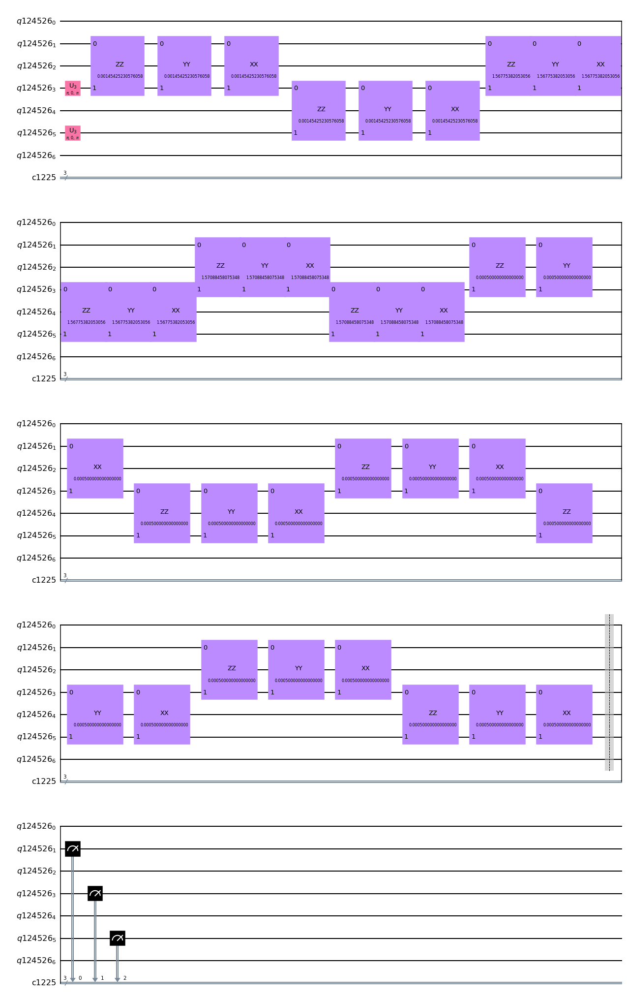

################################################################################

1/8 - Job ID 022f90e0-937d-4598-83d0-965a18c3d82f
2/8 - Job ID f1696b6b-ec15-439e-95ff-9d0d982e2804
3/8 - Job ID b0f74b6f-afc6-4f4e-8c3f-61cfaeb8dd8a
4/8 - Job ID 3dcc3e5e-f450-4464-9763-c9939efbcd63
5/8 - Job ID a5c5057f-9244-4a5b-a8ac-34f53b99936a
6/8 - Job ID 73d4b0c4-3831-443c-bd3b-26da68b23ef8
7/8 - Job ID f2deab5e-3c5f-4b87-aeec-e60e58065a7b
8/8 - Job ID c0fd8aab-c220-4937-a98a-f54375ceb25b

################################################################################

Final results - order: 1 - strotter steps: 6

State tomography fidelity = 0.4889 ± 0.0019

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:01



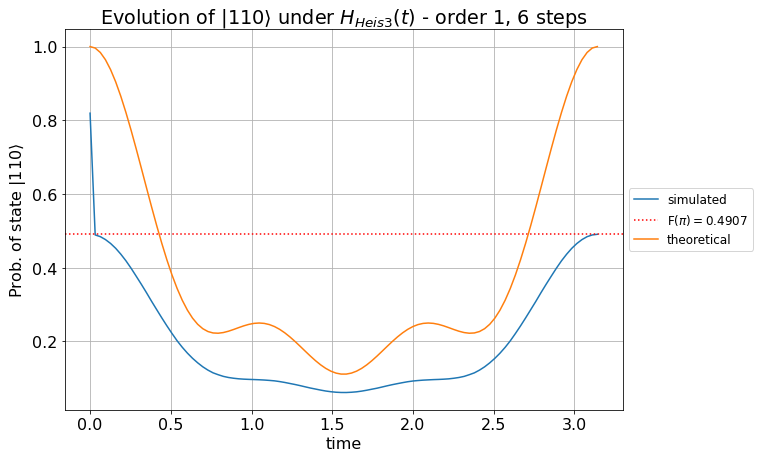




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 7                                   
                                 min time: 0.1                                  
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


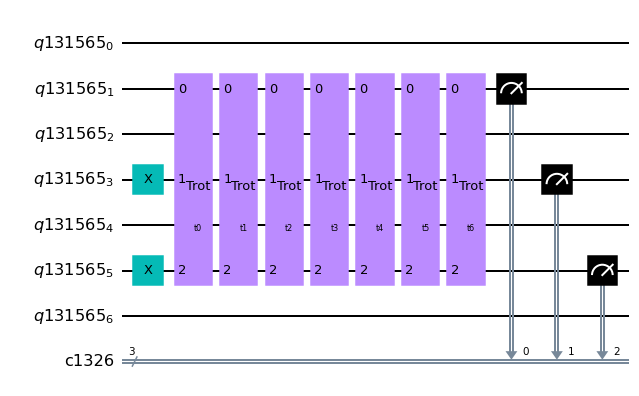

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.13378
Current parameters: [0.1   1.72  0.821 0.201 0.1   0.1   0.1  ] (sum to 3.14)

Iter 2 done!
Loss value: -0.32022
Current parameters: [0.1   1.419 1.111 0.1   0.147 0.124 0.141] (sum to 3.14)

Iter 3 done!
Loss value: -0.34489
Current parameters: [0.1   1.183 1.457 0.102 0.1   0.1   0.1  ] (sum to 3.14)

Iter 4 done!
Loss value: -0.37131
Current parameters: [0.1   1.292 1.349 0.1   0.1   0.1   0.1  ] (sum to 3.14)

Iter 5 done!
Loss value: -0.37167
Current parameters: [0.1   1.389 1.253 0.1   0.1   0.1   0.1  ] (sum to 3.14)

Iter 6 done!
Loss value: -0.37411
Current parameters: [0.1   1.357 1.285 0.1   0.1   0.1   0.1  ] (sum to 3.14)

Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37432
            Iterations: 6
            Function evaluations: 60
            Gradient eval

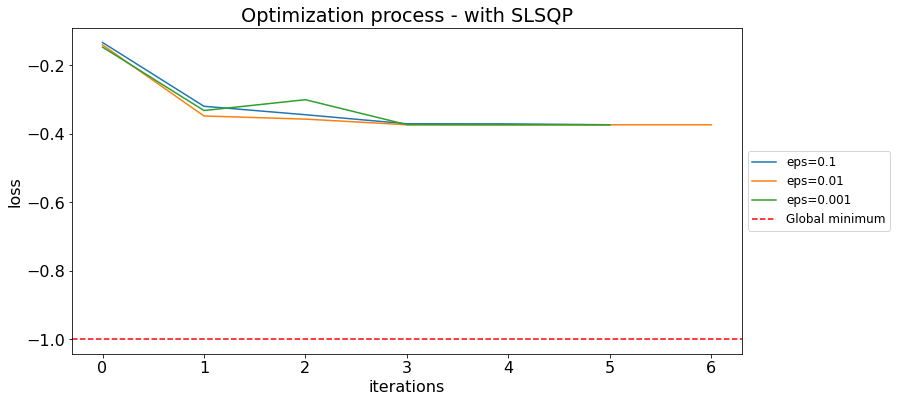


Optimization results:



,optimizer,eps,final_params,final_loss
0,slsqp,0.100,"[0.10000000000000005, 1.3420948351014808, 1.29...",-0.37432
1,slsqp,0.010,"[0.1, 1.3446106043993677, 1.2969820491904251, ...",-0.37432
2,slsqp,0.001,"[0.10000000000000006, 1.3365288668141724, 1.30...",-0.37432


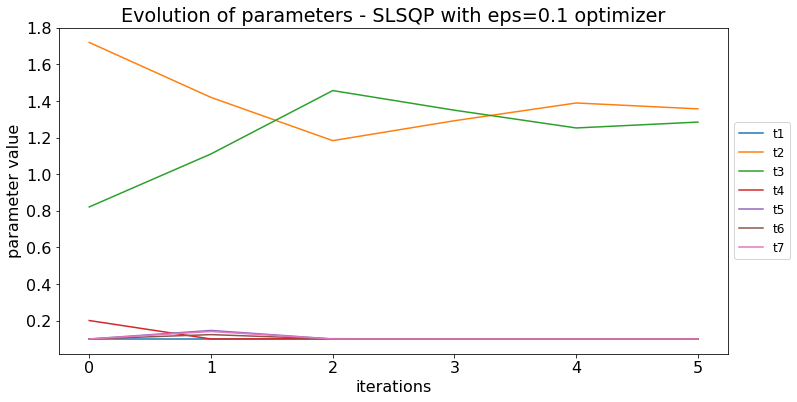

Best parameters (sum to 3.14):	[0.1   1.342 1.299 0.1   0.1   0.1   0.1  ]
Best parameters (sum to 1):	[0.032 0.427 0.414 0.032 0.032 0.032 0.032]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


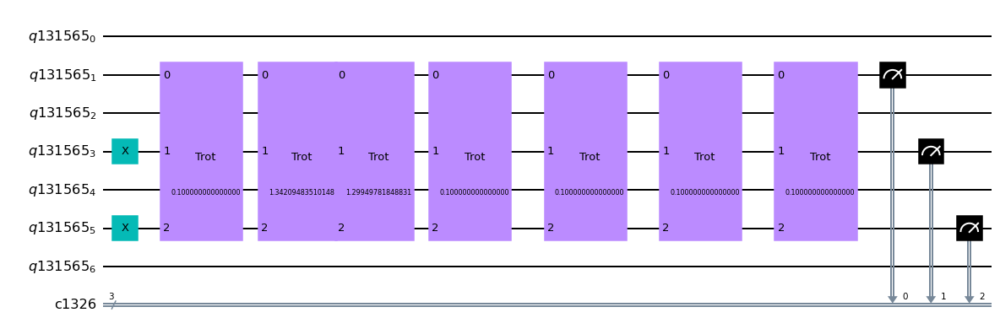

################################################################################
Single trotterization step:


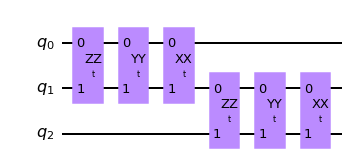

################################################################################

All steps + measurements of state tomography:


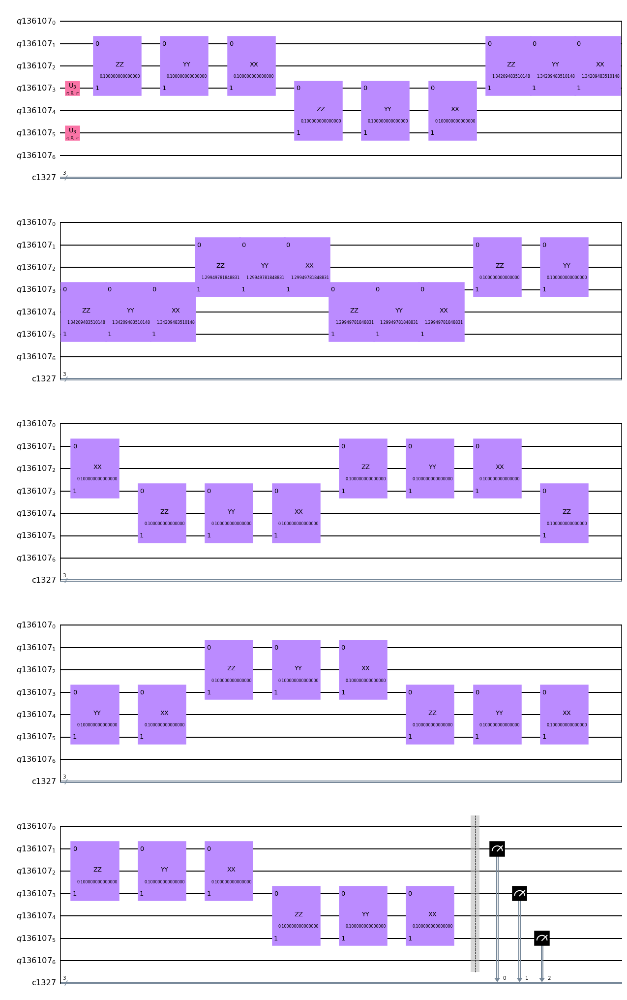

################################################################################

1/8 - Job ID cba586cf-4600-4207-b2c2-c291199010f3
2/8 - Job ID dc8c8b2d-8bb7-4a34-964b-fa3029167c88
3/8 - Job ID cc48baf7-ee68-4500-a002-5ea4809a063b
4/8 - Job ID 10b8fd6b-4a4c-46fa-9e86-058739612292
5/8 - Job ID 167d642b-626f-4ddf-8a93-5329dc3a909a
6/8 - Job ID ae140628-11d8-4e2d-bacf-c3857de038cd
7/8 - Job ID 572c1ee7-724f-4fbd-8144-f459f0e754ae
8/8 - Job ID d79ffb29-756a-4207-882a-0426950a693a

################################################################################

Final results - order: 1 - strotter steps: 7

State tomography fidelity = 0.3744 ± 0.0025

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:04



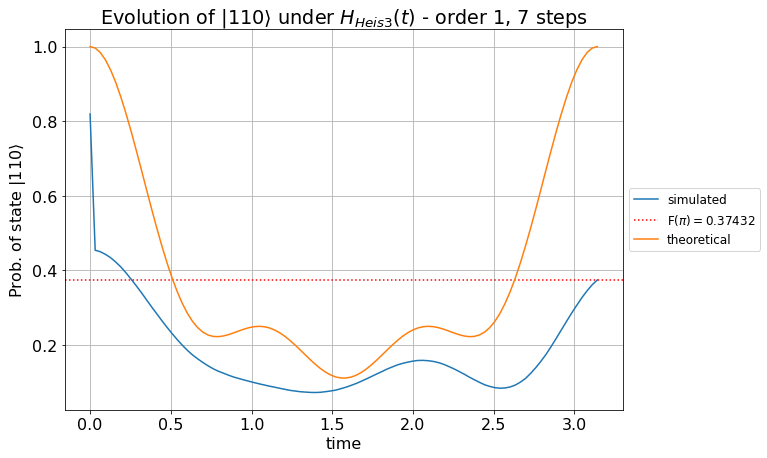




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 7                                   
                                 min time: 0.01                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


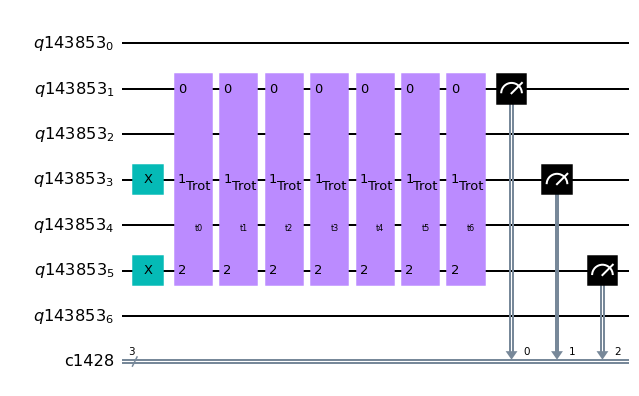

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.3547
Current parameters: [0.01  1.611 1.203 0.288 0.01  0.01  0.01 ] (sum to 3.14)

Iter 2 done!
Loss value: -0.41519
Current parameters: [0.01  1.337 1.534 0.01  0.094 0.078 0.079] (sum to 3.14)

Iter 3 done!
Loss value: -0.4498
Current parameters: [0.01  1.439 1.622 0.01  0.041 0.01  0.01 ] (sum to 3.14)

Iter 4 done!
Loss value: -0.45307
Current parameters: [0.01  1.477 1.615 0.01  0.01  0.01  0.01 ] (sum to 3.14)

Iter 5 done!
Loss value: -0.4541
Current parameters: [0.01  1.506 1.586 0.01  0.01  0.01  0.01 ] (sum to 3.14)

Iter 6 done!
Loss value: -0.45467
Current parameters: [0.01  1.553 1.538 0.01  0.01  0.01  0.01 ] (sum to 3.14)

Iter 7 done!
Loss value: -0.45467
Current parameters: [0.01  1.553 1.538 0.01  0.01  0.01  0.01 ] (sum to 3.14)

Optimization terminated successfully    (Exit mode 0)
            Current fun

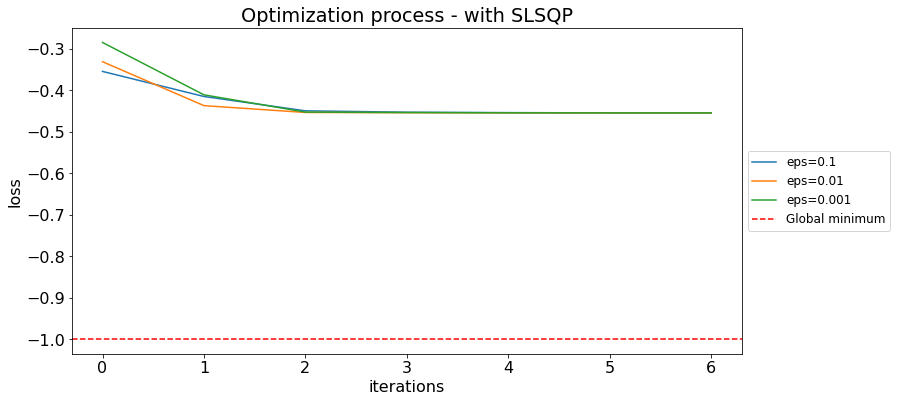


Optimization results:



,optimizer,eps,final_params,final_loss
0,slsqp,0.100,"[0.010000000000000009, 1.5534167884332346, 1.5...",-0.45467
1,slsqp,0.010,"[0.01, 1.5553907539720933, 1.5362018996177003,...",-0.45467
2,slsqp,0.001,"[0.01, 1.544602958789506, 1.5469896948002886, ...",-0.45466


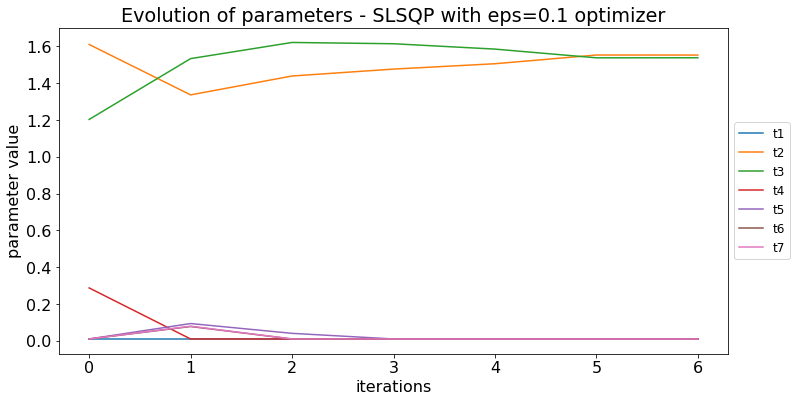

Best parameters (sum to 3.14):	[0.01  1.553 1.538 0.01  0.01  0.01  0.01 ]
Best parameters (sum to 1):	[0.003 0.494 0.49  0.003 0.003 0.003 0.003]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


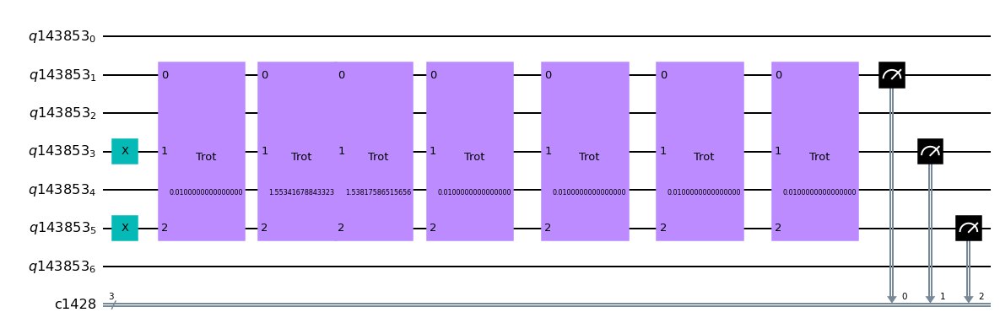

################################################################################
Single trotterization step:


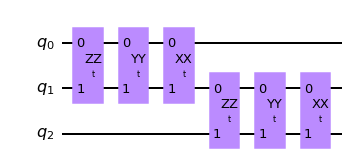

################################################################################

All steps + measurements of state tomography:


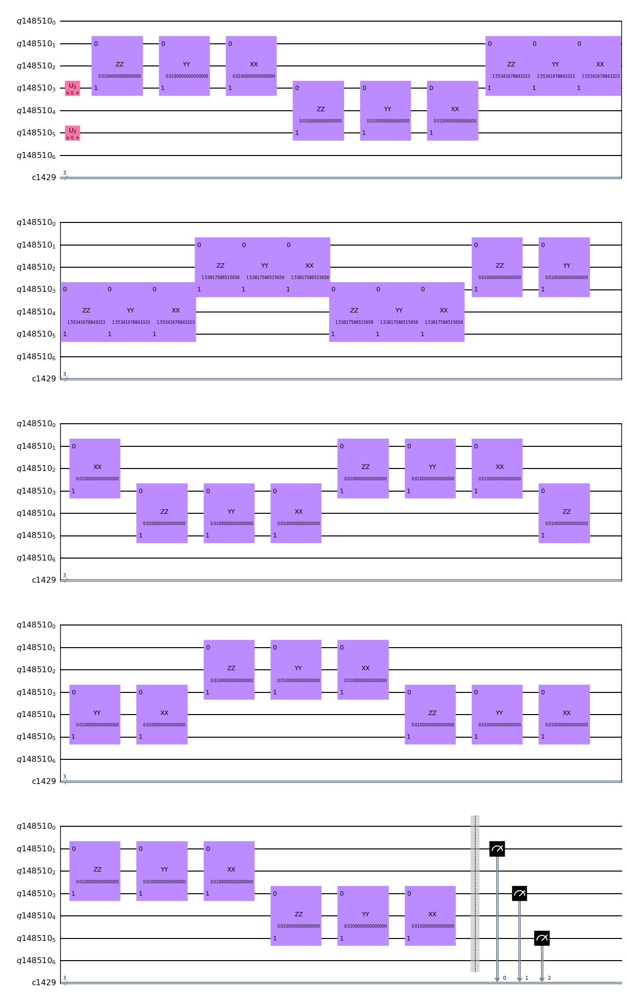

################################################################################

1/8 - Job ID 661fec6c-4700-4f4c-a979-d5f5754dbdde
2/8 - Job ID f3658a4f-e471-442d-96cc-1bd37ca37c82
3/8 - Job ID f5d9cdfd-1005-481b-a931-d5ac1540a593
4/8 - Job ID adc73fab-4e7a-42c1-b11d-d3d1e81ab77b
5/8 - Job ID d305e50c-623b-41bd-8eae-310106976bba
6/8 - Job ID 5c0daa1d-d90e-4ab9-b50c-9bcbd9a6a4f6
7/8 - Job ID e32ec9a2-9b84-474c-9fee-b07a7ad76ee3
8/8 - Job ID 69b16c43-8f7d-4e33-8687-1e29cc952eed

################################################################################

Final results - order: 1 - strotter steps: 7

State tomography fidelity = 0.4537 ± 0.0015

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:05



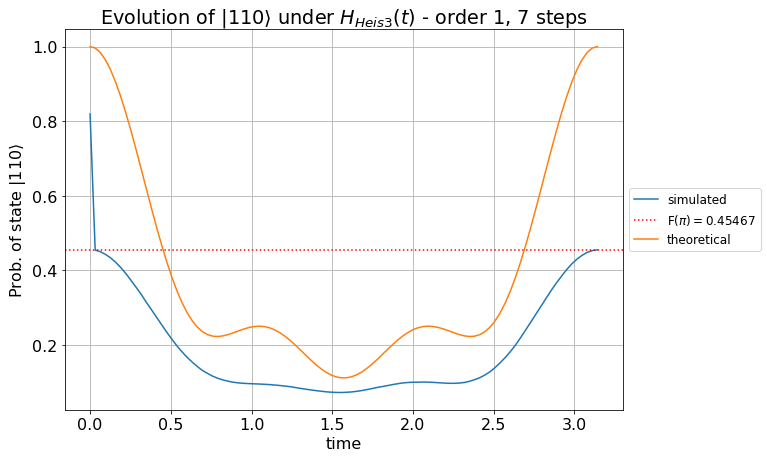




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 7                                   
                                min time: 0.001                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


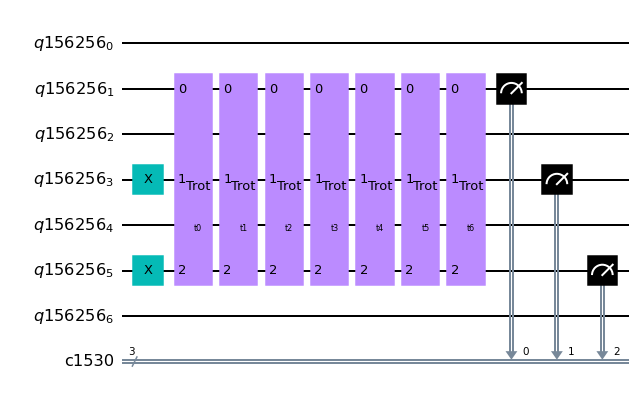

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.35559
Current parameters: [1.000e-03 1.602e+00 1.224e+00 3.116e-01 1.000e-03 1.000e-03 1.000e-03] (sum to 3.14)

Iter 2 done!
Loss value: -0.41046
Current parameters: [1.000e-03 1.335e+00 1.525e+00 1.000e-03 1.018e-01 8.774e-02 9.003e-02] (sum to 3.14)

Iter 3 done!
Loss value: -0.44974
Current parameters: [1.000e-03 1.449e+00 1.620e+00 1.000e-03 6.360e-02 5.896e-03 1.000e-03] (sum to 3.14)

Iter 4 done!
Loss value: -0.45428
Current parameters: [8.992e-03 1.498e+00 1.631e+00 1.000e-03 1.000e-03 1.000e-03 1.000e-03] (sum to 3.14)

Iter 5 done!
Loss value: -0.45476
Current parameters: [5.944e-03 1.519e+00 1.613e+00 1.000e-03 1.000e-03 1.000e-03 1.000e-03] (sum to 3.14)

Iter 6 done!
Loss value: -0.45509
Current parameters: [1.811e-03 1.559e+00 1.577e+00 1.000e-03 1.000e-03 1.000e-03 1.000e-03] (sum to 3.14)

Iter 7 done!
Loss v

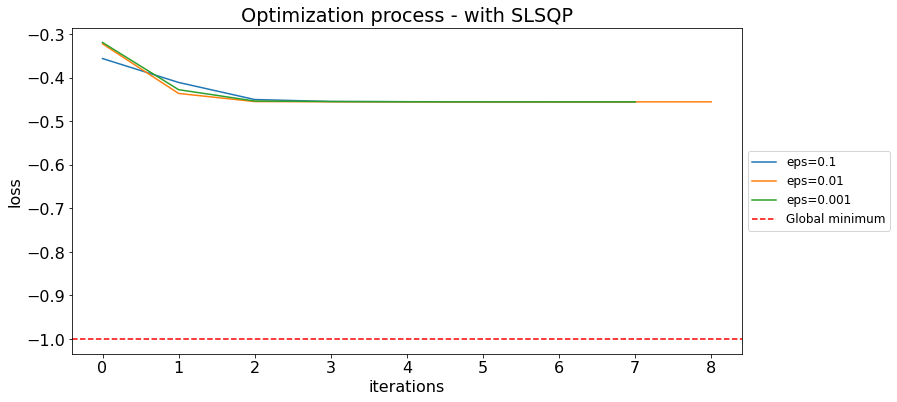


Optimization results:



,optimizer,eps,final_params,final_loss
0,slsqp,0.100,"[0.001532701229502128, 1.5712154421682043, 1.5...",-0.45510
1,slsqp,0.010,"[0.001001499931669445, 1.5755477104821782, 1.5...",-0.45510
2,slsqp,0.001,"[0.014596407849593306, 1.5599558064847812, 1.5...",-0.45505


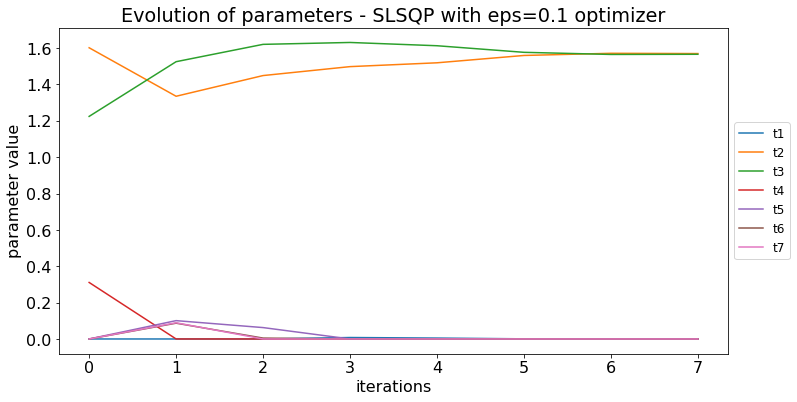

Best parameters (sum to 3.14):	[1.533e-03 1.571e+00 1.565e+00 1.000e-03 1.000e-03 1.000e-03 1.000e-03]
Best parameters (sum to 1):	[4.879e-04 5.001e-01 4.981e-01 3.183e-04 3.183e-04 3.183e-04 3.183e-04]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


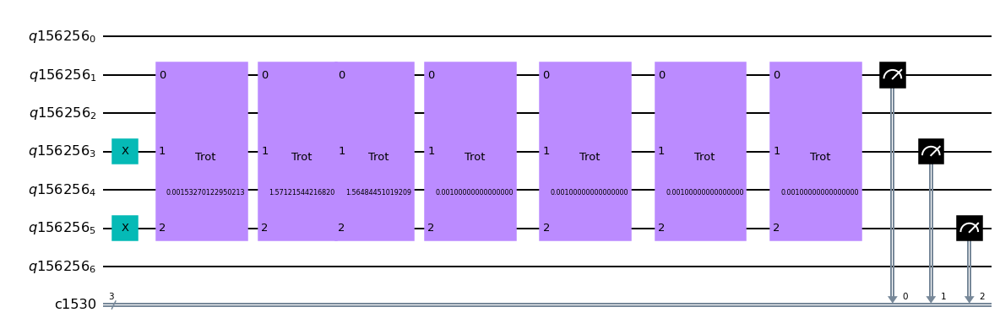

################################################################################
Single trotterization step:


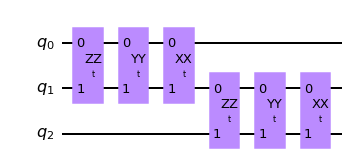

################################################################################

All steps + measurements of state tomography:


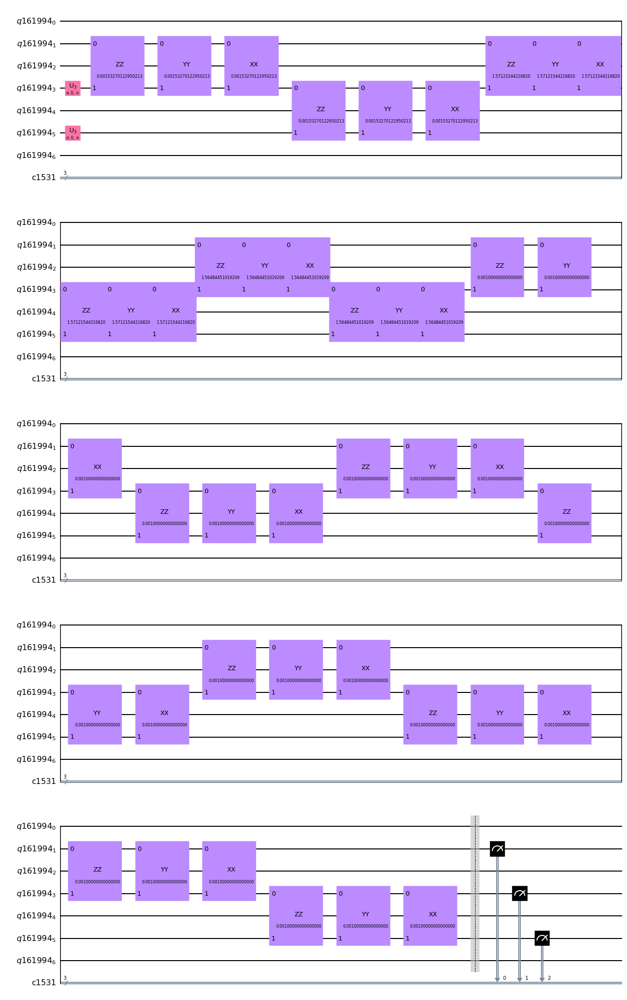

################################################################################

1/8 - Job ID f5acd652-d122-43d0-8561-0fafd77e5ab4
2/8 - Job ID edfe734a-4daf-4c80-aab7-0e0b97b7fc6a
3/8 - Job ID 4c551659-a32d-4193-83fd-a14fda32bb0d
4/8 - Job ID 637115e5-7441-49e0-a3a3-2130255a07ac
5/8 - Job ID f5d52477-1e3e-482f-b882-36a21802e28f
6/8 - Job ID 23474482-04e4-449b-a62b-9b3513a22f80
7/8 - Job ID 66e5250e-8e85-407e-8210-f1b4ff03489e
8/8 - Job ID 993b586b-90b3-4958-b0c4-2254dca218f0

################################################################################

Final results - order: 1 - strotter steps: 7

State tomography fidelity = 0.4545 ± 0.0025

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:03



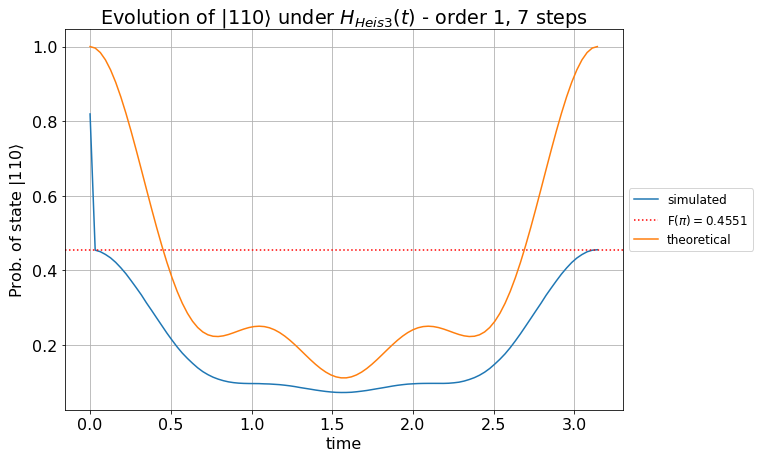




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 7                                   
                                min time: 0.0005                                
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


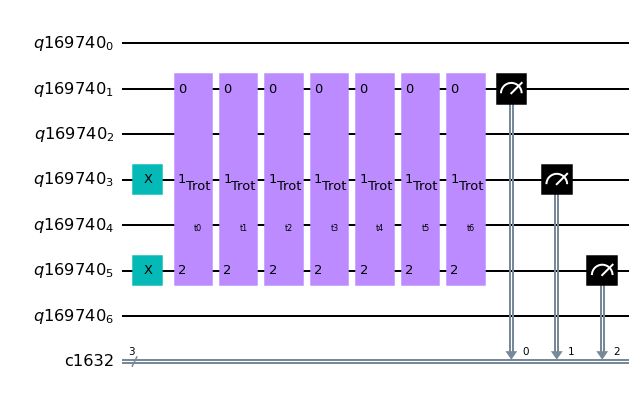

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.35537
Current parameters: [5.000e-04 1.601e+00 1.225e+00 3.131e-01 5.000e-04 5.000e-04 5.000e-04] (sum to 3.14)

Iter 2 done!
Loss value: -0.40982
Current parameters: [5.000e-04 1.334e+00 1.524e+00 5.000e-04 1.024e-01 8.848e-02 9.093e-02] (sum to 3.14)

Iter 3 done!
Loss value: -0.4496
Current parameters: [5.000e-04 1.448e+00 1.620e+00 5.000e-04 6.423e-02 7.255e-03 5.000e-04] (sum to 3.14)

Iter 4 done!
Loss value: -0.4543
Current parameters: [9.429e-03 1.498e+00 1.632e+00 5.000e-04 5.000e-04 5.000e-04 5.000e-04] (sum to 3.14)

Iter 5 done!
Loss value: -0.45476
Current parameters: [6.445e-03 1.519e+00 1.614e+00 5.000e-04 5.000e-04 5.000e-04 5.000e-04] (sum to 3.14)

Iter 6 done!
Loss value: -0.4551
Current parameters: [2.292e-03 1.561e+00 1.577e+00 5.000e-04 5.000e-04 5.000e-04 5.000e-04] (sum to 3.14)

Iter 7 done!
Loss valu

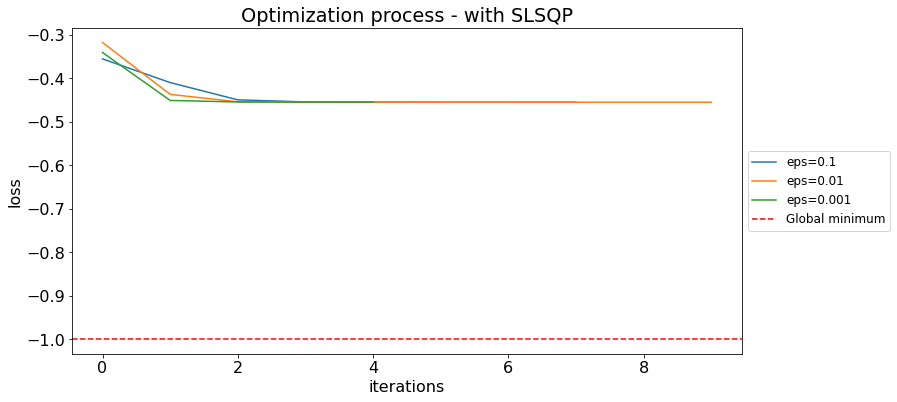


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.0016654598190647268, 1.5712132077266627, 1....",-0.45512
0,slsqp,0.100,"[0.002308767605593645, 1.5713707952841134, 1.5...",-0.45511
2,slsqp,0.001,"[0.01534922181908371, 1.5150011907993872, 1.60...",-0.45478


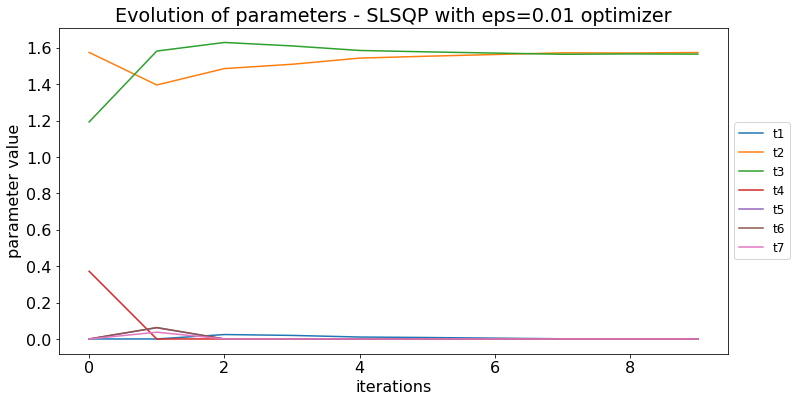

Best parameters (sum to 3.14):	[1.665e-03 1.571e+00 1.566e+00 9.985e-04 5.000e-04 5.000e-04 5.000e-04]
Best parameters (sum to 1):	[5.301e-04 5.001e-01 4.985e-01 3.178e-04 1.592e-04 1.592e-04 1.592e-04]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


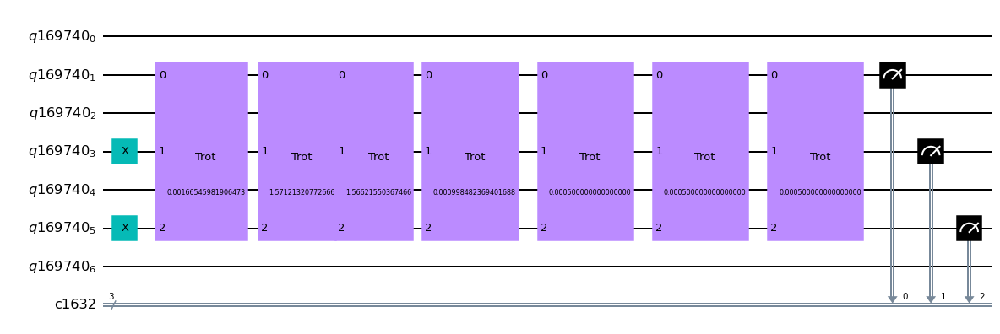

################################################################################
Single trotterization step:


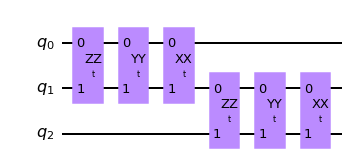

################################################################################

All steps + measurements of state tomography:


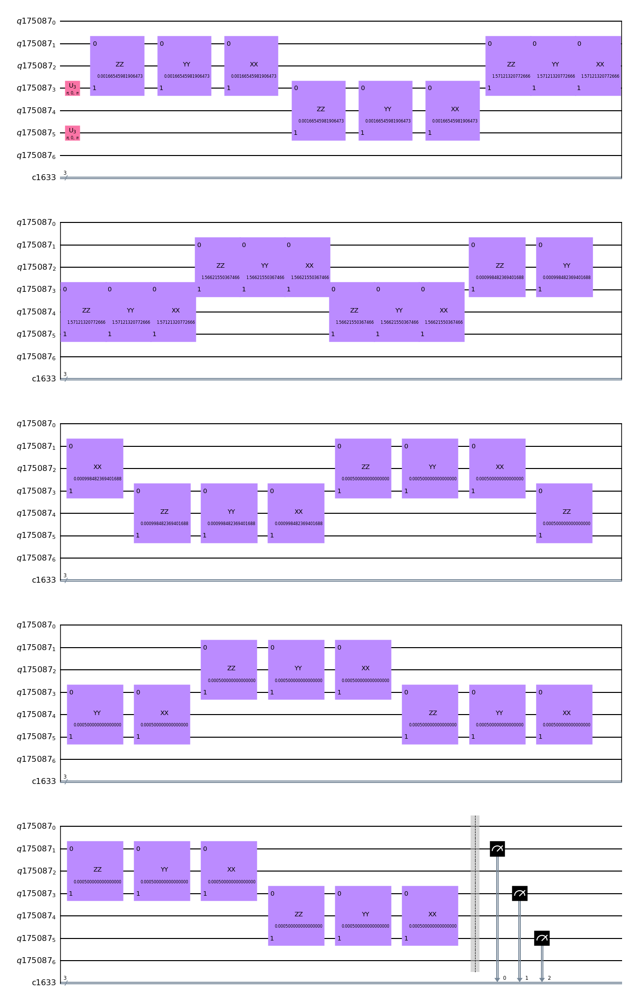

################################################################################

1/8 - Job ID ab27496c-d8ef-46bd-8506-2b8ff8b2b0cb
2/8 - Job ID 9035991f-3e09-4fd2-a1a1-4d1d276b85d2
3/8 - Job ID 97e010d4-fe93-4dd3-96fe-4245a47f7bbe
4/8 - Job ID beeeefb7-e48c-4b6d-865d-142445504958
5/8 - Job ID 144a537f-7057-4e90-8e96-dd4ec4ba7412
6/8 - Job ID c8bfc78c-c984-465f-887f-08733afef28f
7/8 - Job ID 52810ef5-5033-44e9-891f-7f302e0c38c5
8/8 - Job ID 0af97b90-636e-4fb0-9557-27219ff7c1d0

################################################################################

Final results - order: 1 - strotter steps: 7

State tomography fidelity = 0.4525 ± 0.0018

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:06



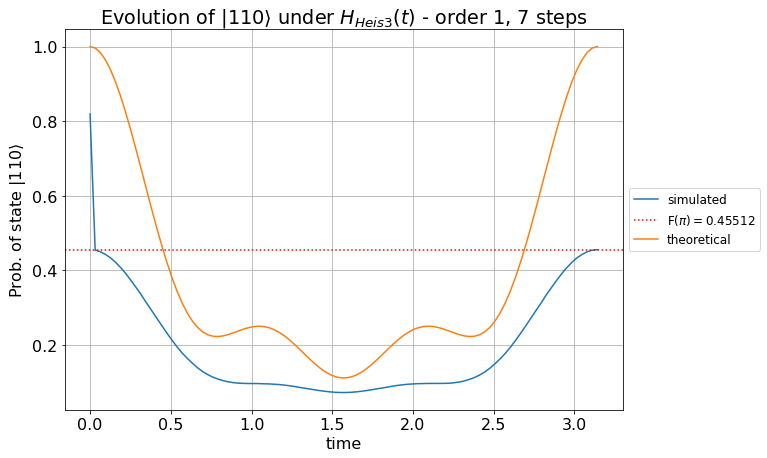




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 8                                   
                                 min time: 0.1                                  
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


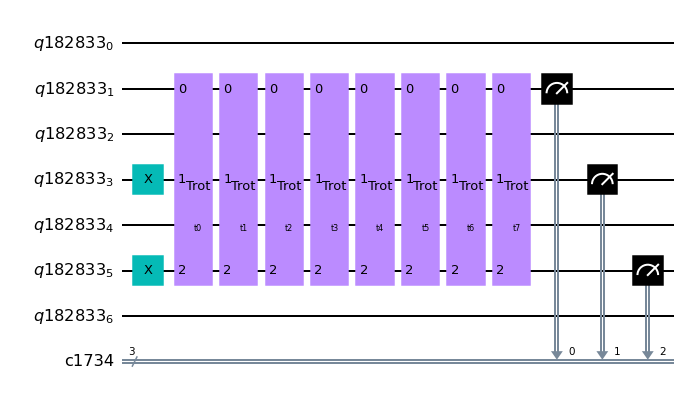

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.1667
Current parameters: [0.1   1.098 0.752 0.1   0.1   0.1   0.1   0.791] (sum to 3.14)

Iter 2 done!
Loss value: -0.21112
Current parameters: [0.1   0.85  0.693 0.239 0.27  0.254 0.231 0.505] (sum to 3.14)

Iter 3 done!
Loss value: -0.22553
Current parameters: [0.212 0.487 0.816 0.408 0.269 0.212 0.261 0.476] (sum to 3.14)

Iter 4 done!
Loss value: -0.24099
Current parameters: [0.173 0.616 0.705 0.446 0.24  0.196 0.226 0.54 ] (sum to 3.14)

Iter 5 done!
Loss value: -0.25055
Current parameters: [0.18  0.592 0.698 0.394 0.246 0.235 0.269 0.528] (sum to 3.14)

Iter 6 done!
Loss value: -0.25505
Current parameters: [0.202 0.561 0.646 0.383 0.268 0.25  0.288 0.544] (sum to 3.14)

Iter 7 done!
Loss value: -0.2736
Current parameters: [0.307 0.48  0.488 0.362 0.323 0.297 0.345 0.54 ] (sum to 3.14)

Iter 8 done!
Loss value: -0.2747
C

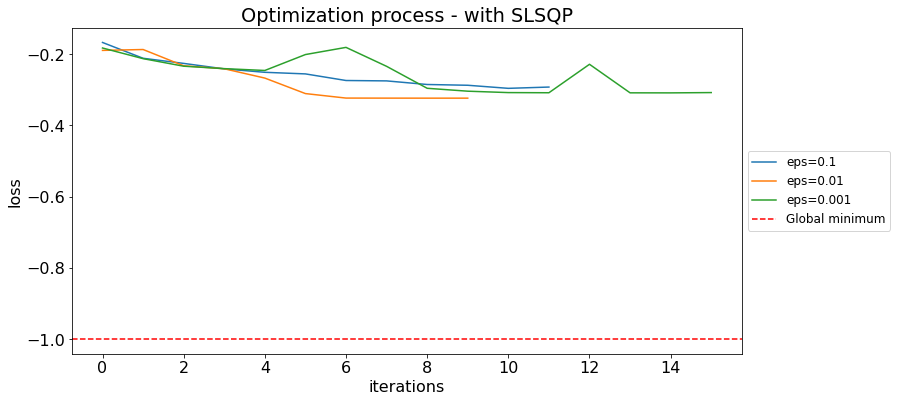


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.10000000000014504, 1.3089631843747311, 1.23...",-0.32322
2,slsqp,0.001,"[0.4067836924797189, 0.3640270109919866, 0.326...",-0.30837
0,slsqp,0.100,"[0.43432796654546135, 0.4084120149905036, 0.36...",-0.29782


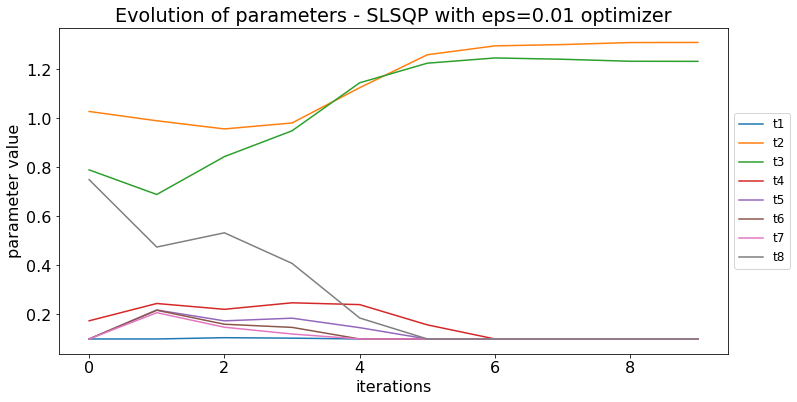

Best parameters (sum to 3.14):	[0.1   1.309 1.233 0.1   0.1   0.1   0.1   0.1  ]
Best parameters (sum to 1):	[0.032 0.417 0.392 0.032 0.032 0.032 0.032 0.032]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


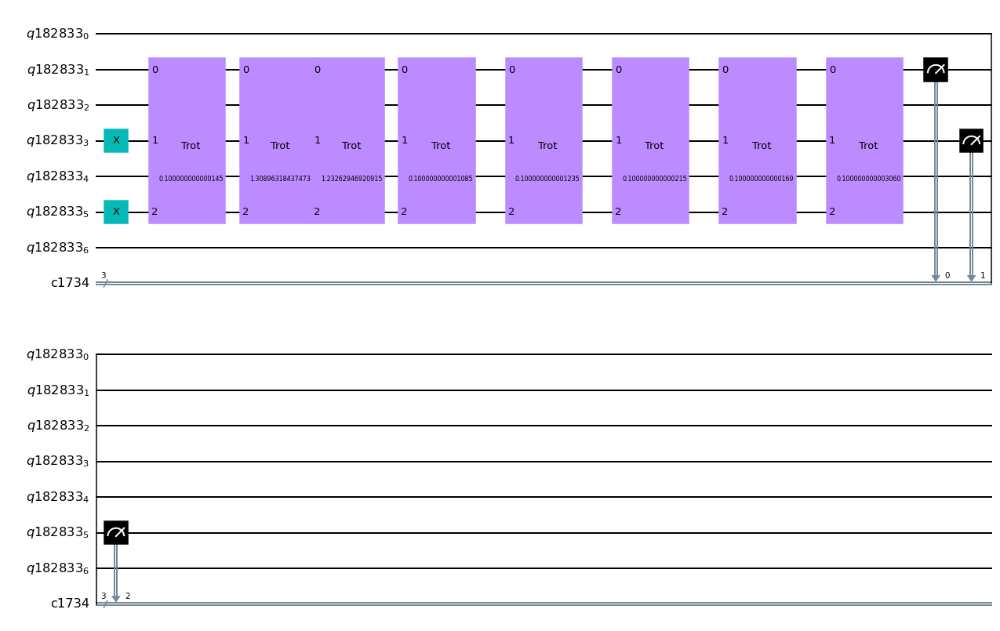

################################################################################
Single trotterization step:


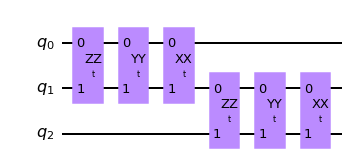

################################################################################

All steps + measurements of state tomography:


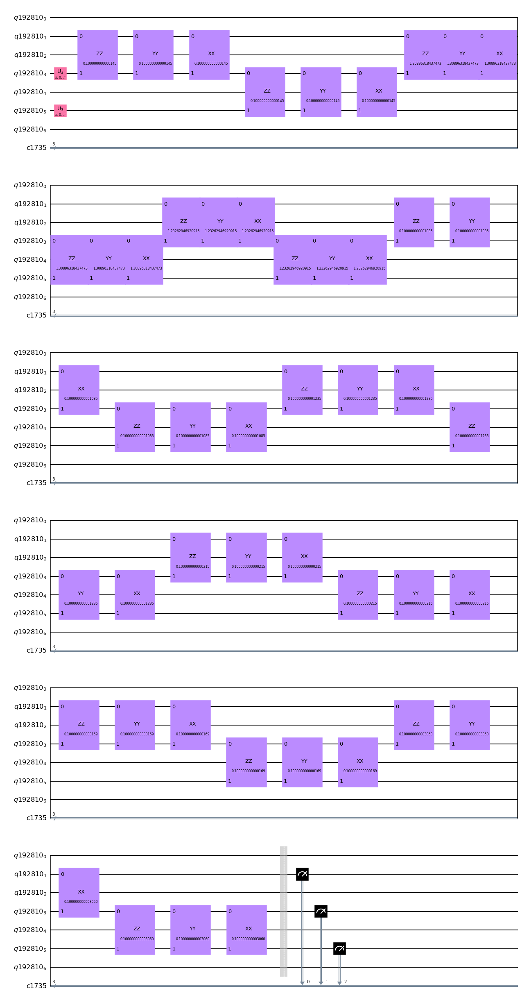

################################################################################

1/8 - Job ID 3ee88b94-f8d0-4a80-ba55-f1fd2b7482a4
2/8 - Job ID 52330558-68d0-410f-88ad-f5b52a05999f
3/8 - Job ID b91994a2-d728-4cf2-8d5b-beaefbd0a2c9
4/8 - Job ID dbc01522-801f-4b81-9662-ff1638c7888f
5/8 - Job ID 18fb8adc-1013-4caa-a9ed-344031debc16
6/8 - Job ID 0277a396-ffd4-47e7-bc0f-6b37a75eb84e
7/8 - Job ID 6636d7e8-74ad-4f44-8d4e-69f5a2bd4cf5
8/8 - Job ID 32963fcd-57a5-4056-9230-137c12a04510

################################################################################

Final results - order: 1 - strotter steps: 8

State tomography fidelity = 0.3235 ± 0.0027

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:11



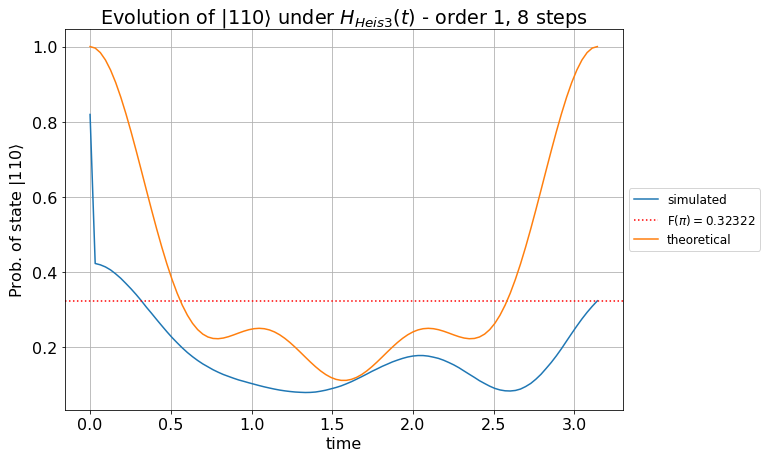




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 8                                   
                                 min time: 0.01                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


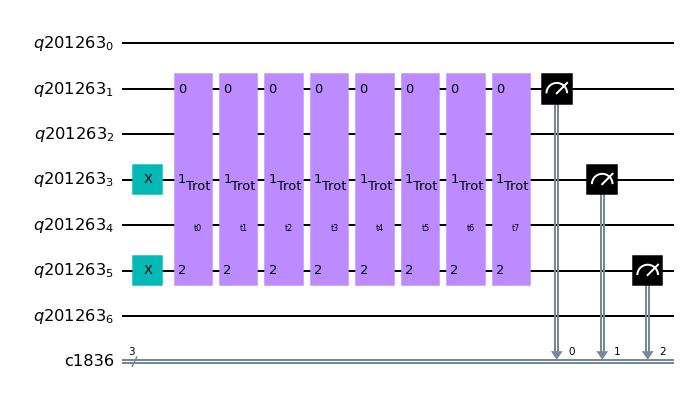

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.17237
Current parameters: [0.01  1.109 0.869 0.331 0.01  0.01  0.01  0.792] (sum to 3.14)

Iter 2 done!
Loss value: -0.2125
Current parameters: [0.01  0.98  0.82  0.278 0.218 0.196 0.174 0.464] (sum to 3.14)

Iter 3 done!
Loss value: -0.22812
Current parameters: [0.035 0.911 0.976 0.21  0.164 0.14  0.164 0.541] (sum to 3.14)

Iter 4 done!
Loss value: -0.24409
Current parameters: [0.01  1.014 0.975 0.238 0.14  0.117 0.117 0.529] (sum to 3.14)

Iter 5 done!
Loss value: -0.22483
Current parameters: [0.01  1.571 0.994 0.231 0.014 0.01  0.01  0.302] (sum to 3.14)

Iter 6 done!
Loss value: -0.28899
Current parameters: [0.01  1.331 1.064 0.235 0.075 0.062 0.063 0.302] (sum to 3.14)

Iter 7 done!
Loss value: -0.36178
Current parameters: [0.01  1.452 1.251 0.183 0.073 0.082 0.082 0.01 ] (sum to 3.14)

Iter 8 done!
Loss value: -0.38015

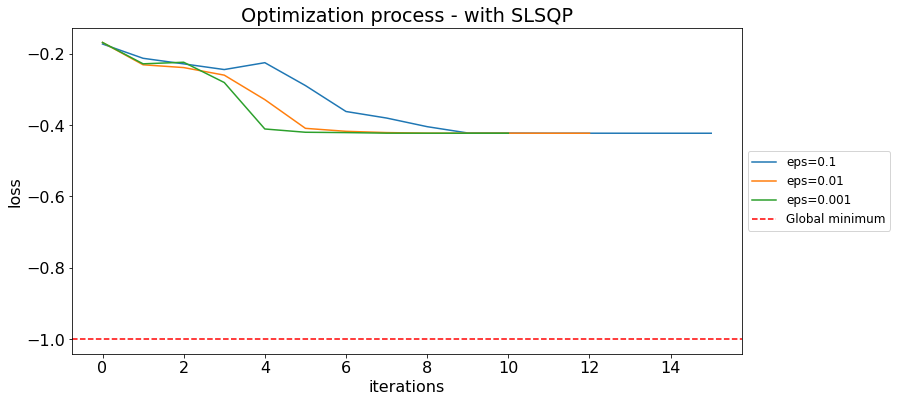


Optimization results:



,optimizer,eps,final_params,final_loss
0,slsqp,0.100,"[0.01, 1.5516638741295359, 1.5299287794602572,...",-0.42277
1,slsqp,0.010,"[0.01, 1.5510425988641923, 1.5305500547256012,...",-0.42277
2,slsqp,0.001,"[0.01, 1.5598715702562844, 1.5217210833335089,...",-0.42273


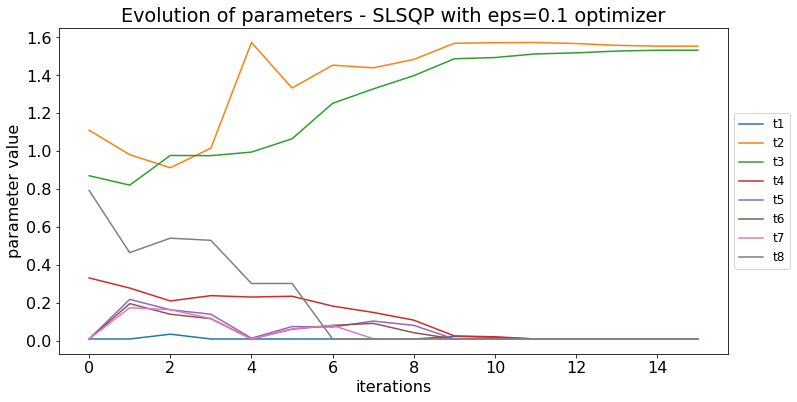

Best parameters (sum to 3.14):	[0.01  1.552 1.53  0.01  0.01  0.01  0.01  0.01 ]
Best parameters (sum to 1):	[0.003 0.494 0.487 0.003 0.003 0.003 0.003 0.003]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


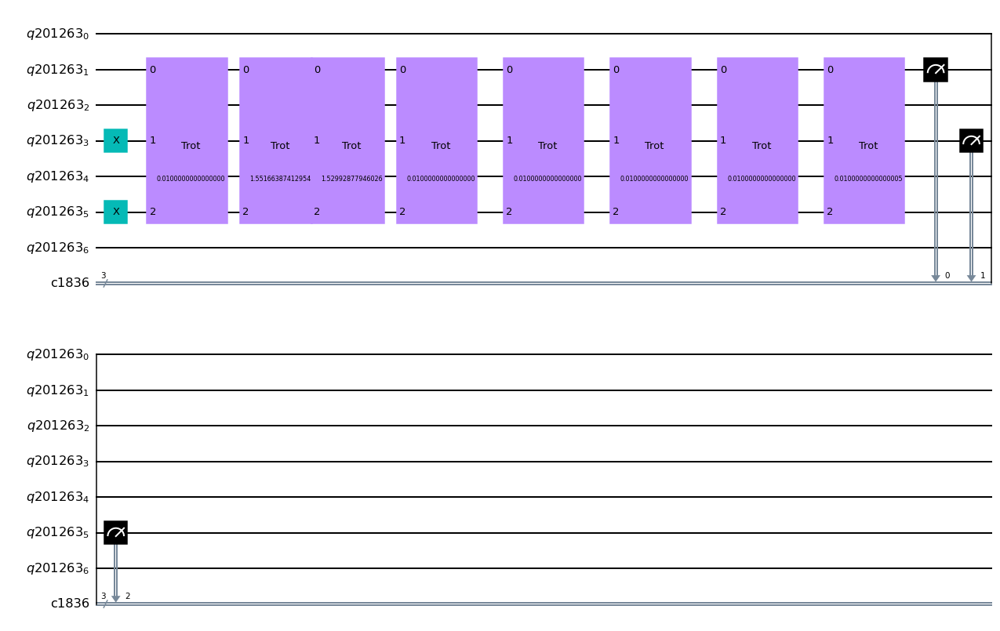

################################################################################
Single trotterization step:


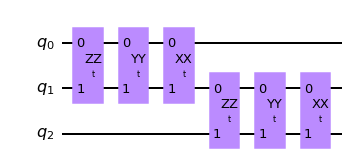

################################################################################

All steps + measurements of state tomography:


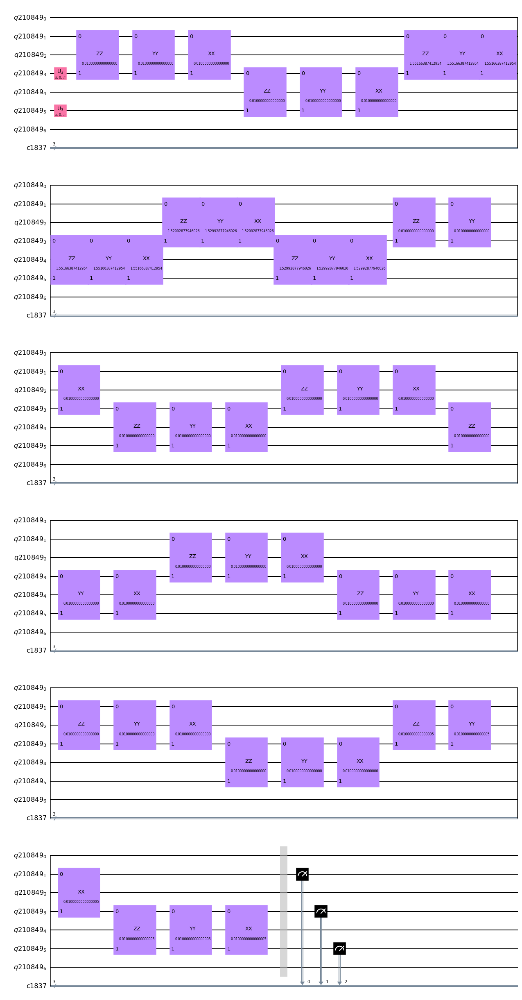

################################################################################

1/8 - Job ID aed187c1-a9d6-46d1-abfa-8a04933f8dde
2/8 - Job ID 0f4a3721-a2ea-4465-8327-a07317058f84
3/8 - Job ID 8177f2b0-0884-45df-90aa-43615824d510
4/8 - Job ID 7fe0d77e-8cb2-44a0-8fc6-72e0da215dc6
5/8 - Job ID 4b088852-0d73-4c50-9427-5917e3f58fe8
6/8 - Job ID 0bbafa9e-7d7d-4209-be9e-120ff822e1e3
7/8 - Job ID 94bdb209-7116-46ea-a34b-e6115020ba41
8/8 - Job ID 650cb98d-c829-4474-bae1-a5ddabe288ae

################################################################################

Final results - order: 1 - strotter steps: 8

State tomography fidelity = 0.4219 ± 0.0016

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:09



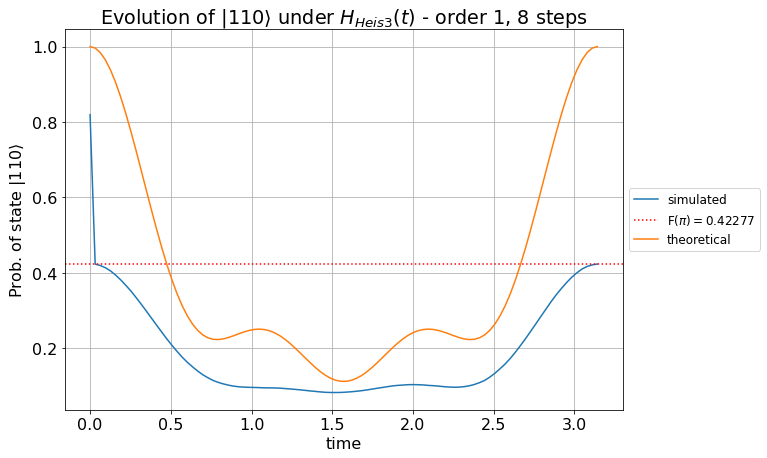




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 8                                   
                                min time: 0.001                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


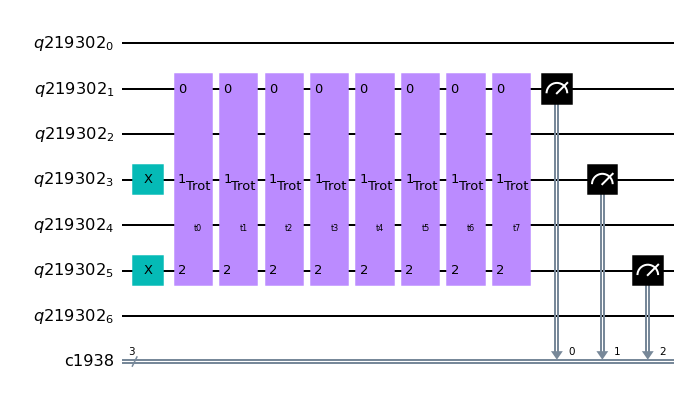

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.16627
Current parameters: [1.000e-03 1.122e+00 8.619e-01 3.429e-01 1.000e-03 1.000e-03 1.000e-03
 8.111e-01] (sum to 3.14)

Iter 2 done!
Loss value: -0.22083
Current parameters: [0.001 0.954 0.833 0.274 0.222 0.191 0.177 0.489] (sum to 3.14)

Iter 3 done!
Loss value: -0.22154
Current parameters: [0.027 0.874 0.986 0.211 0.165 0.143 0.17  0.565] (sum to 3.14)

Iter 4 done!
Loss value: -0.23618
Current parameters: [1.000e-03 1.010e+00 9.829e-01 2.386e-01 1.344e-01 1.061e-01 9.504e-02
 5.735e-01] (sum to 3.14)

Iter 5 done!
Loss value: -0.21236
Current parameters: [1.000e-03 1.265e+00 1.135e+00 1.486e-01 3.639e-02 1.323e-02 1.000e-03
 5.412e-01] (sum to 3.14)

Iter 6 done!
Loss value: -0.2539
Current parameters: [1.000e-03 1.170e+00 1.054e+00 2.376e-01 7.918e-02 4.465e-02 5.420e-02
 5.003e-01] (sum to 3.14)

Iter 7 done!
Loss va

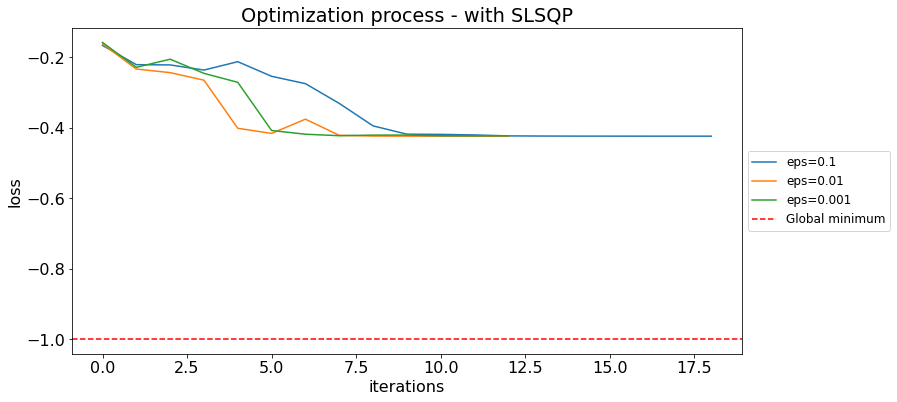


Optimization results:



,optimizer,eps,final_params,final_loss
0,slsqp,0.100,"[0.004718806420565146, 1.5657007894449693, 1.5...",-0.42392
1,slsqp,0.010,"[0.0010000000000000015, 1.5644515226962685, 1....",-0.42392
2,slsqp,0.001,"[0.007799690852223542, 1.597268776285385, 1.49...",-0.42298


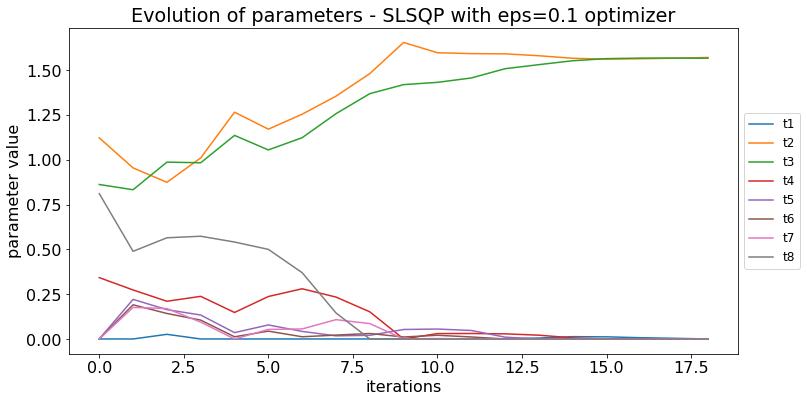

Best parameters (sum to 3.14):	[4.719e-03 1.566e+00 1.566e+00 1.000e-03 1.000e-03 1.000e-03 1.000e-03
 1.000e-03]
Best parameters (sum to 1):	[1.502e-03 4.984e-01 4.985e-01 3.183e-04 3.183e-04 3.183e-04 3.183e-04
 3.183e-04]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


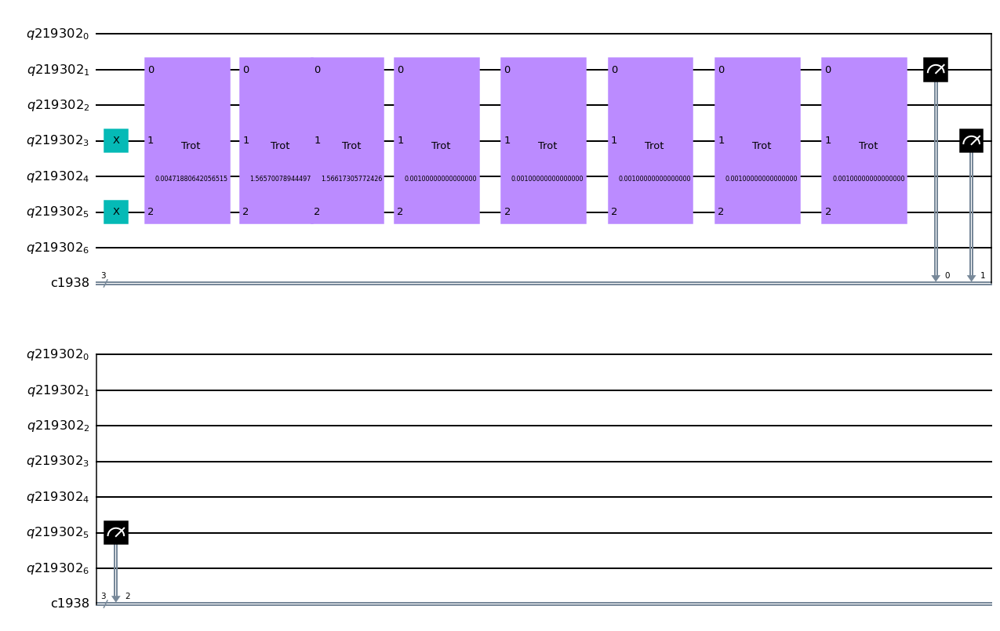

################################################################################
Single trotterization step:


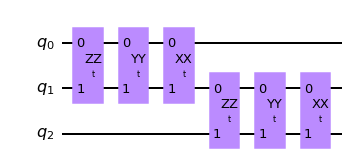

################################################################################

All steps + measurements of state tomography:


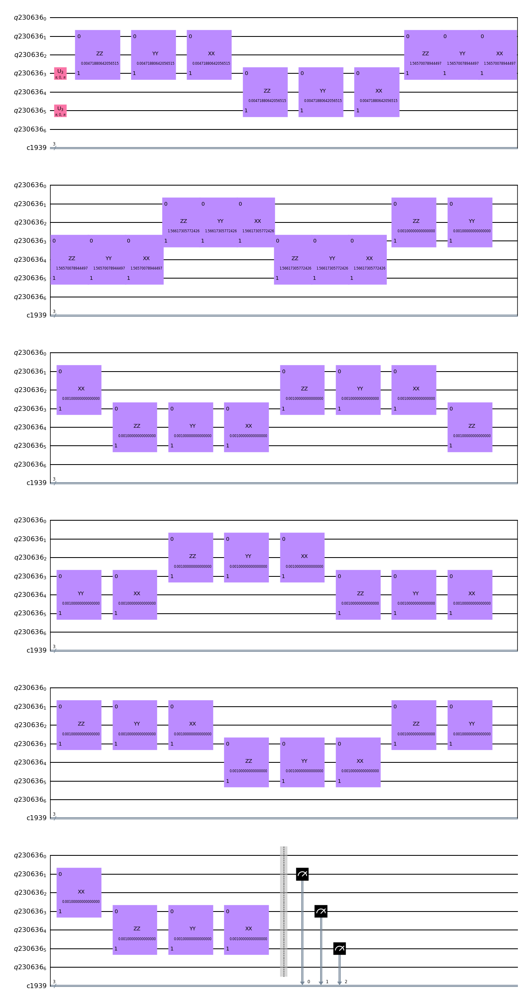

################################################################################

1/8 - Job ID 2442d3e4-7b8a-4e65-b5e9-9446843828a9
2/8 - Job ID 2c669b96-baa3-47fa-b5a1-1e015b0073b8
3/8 - Job ID ac4e354f-7ad7-419e-b4d2-ef478a542e55
4/8 - Job ID 79672db6-e523-48ff-9e6f-7ad55bb7cef7
5/8 - Job ID ebc8fa60-7cce-4d58-b54f-e85ccda038ed
6/8 - Job ID 7d8202d0-a317-4adb-b808-53eb42b1c451
7/8 - Job ID b5698b5a-0ea1-439b-8f6e-4cf1187341fc
8/8 - Job ID 97d46bfd-abe4-4985-a99f-7190de145726

################################################################################

Final results - order: 1 - strotter steps: 8

State tomography fidelity = 0.4233 ± 0.0015

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:09



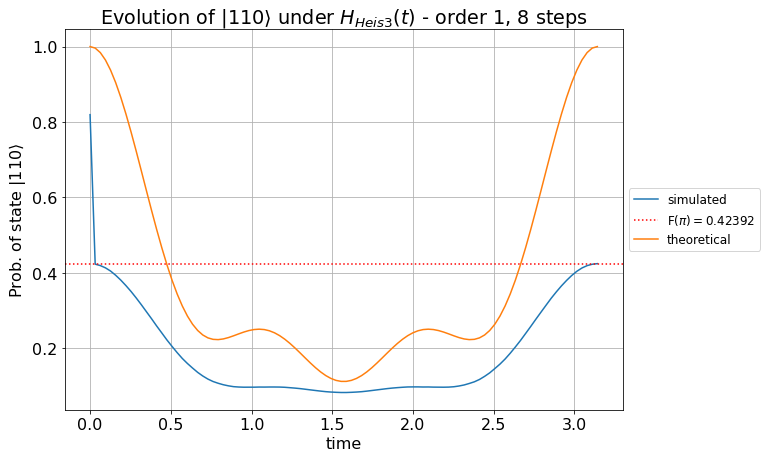




################################################################################
################################################################################
                                    Order: 1                                    
                                   # steps: 8                                   
                                min time: 0.0005                                
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


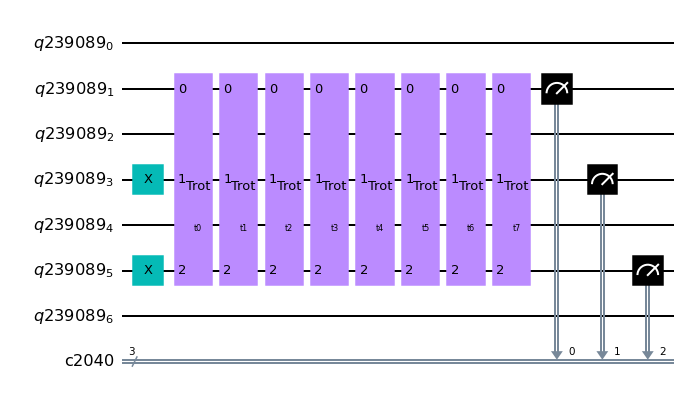

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.16609
Current parameters: [5.000e-04 1.123e+00 8.600e-01 3.449e-01 5.000e-04 5.000e-04 5.000e-04
 8.119e-01] (sum to 3.14)

Iter 2 done!
Loss value: -0.22211
Current parameters: [5.000e-04 9.516e-01 8.363e-01 2.701e-01 2.221e-01 1.918e-01 1.761e-01
 4.930e-01] (sum to 3.14)

Iter 3 done!
Loss value: -0.21982
Current parameters: [0.028 0.873 0.989 0.207 0.165 0.143 0.169 0.567] (sum to 3.14)

Iter 4 done!
Loss value: -0.23642
Current parameters: [5.000e-04 1.010e+00 9.831e-01 2.406e-01 1.334e-01 1.057e-01 9.601e-02
 5.721e-01] (sum to 3.14)

Iter 5 done!
Loss value: -0.21464
Current parameters: [5.000e-04 1.267e+00 1.136e+00 1.551e-01 3.439e-02 1.148e-02 5.000e-04
 5.368e-01] (sum to 3.14)

Iter 6 done!
Loss value: -0.25478
Current parameters: [5.000e-04 1.180e+00 1.060e+00 2.409e-01 7.354e-02 3.951e-02 5.257e-02
 4.952e-01] (

Iter 15 done!
Loss value: -0.41875
Current parameters: [7.940e-02 1.541e+00 1.461e+00 8.605e-04 5.000e-04 1.459e-02 5.000e-04
 4.441e-02] (sum to 3.14)

Iter 16 done!
Loss value: -0.4203
Current parameters: [7.576e-02 1.544e+00 1.479e+00 6.571e-03 5.000e-04 5.000e-04 2.174e-03
 3.282e-02] (sum to 3.14)

Iter 17 done!
Loss value: -0.42301
Current parameters: [4.702e-02 1.549e+00 1.530e+00 3.562e-03 5.000e-04 5.000e-04 5.000e-04
 1.032e-02] (sum to 3.14)

Iter 18 done!
Loss value: -0.42355
Current parameters: [3.567e-02 1.545e+00 1.553e+00 6.313e-03 5.000e-04 5.000e-04 5.000e-04
 6.503e-04] (sum to 3.14)

Iter 19 done!
Loss value: -0.42362
Current parameters: [1.979e-02 1.538e+00 1.572e+00 5.000e-04 5.433e-03 5.316e-03 5.000e-04
 5.000e-04] (sum to 3.14)

Iter 20 done!
Loss value: -0.42369
Current parameters: [9.808e-03 1.539e+00 1.585e+00 5.000e-04 5.366e-03 5.000e-04 5.000e-04
 5.000e-04] (sum to 3.14)

Iter 21 done!
Loss value: -0.42376
Current parameters: [4.479e-03 1.544e+00 1.590e+

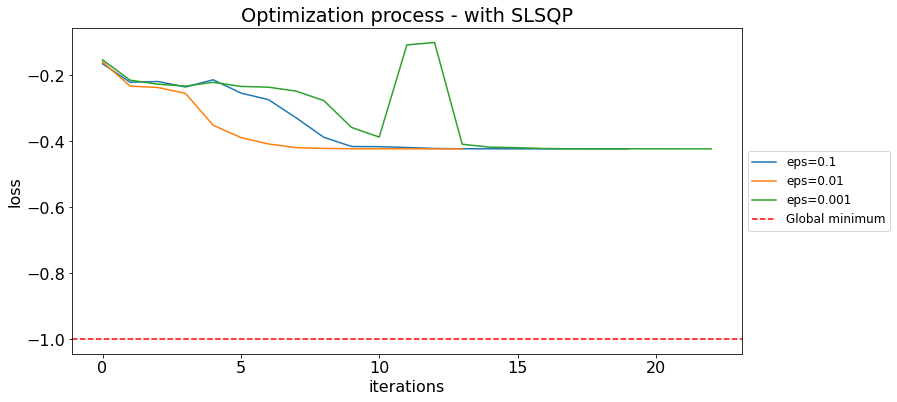


Optimization results:



,optimizer,eps,final_params,final_loss
0,slsqp,0.100,"[0.004076619771805038, 1.5682584765799255, 1.5...",-0.42393
1,slsqp,0.010,"[0.0010363519334550494, 1.5675369448121261, 1....",-0.42393
2,slsqp,0.001,"[0.009198915170215226, 1.556089850596967, 1.57...",-0.42391


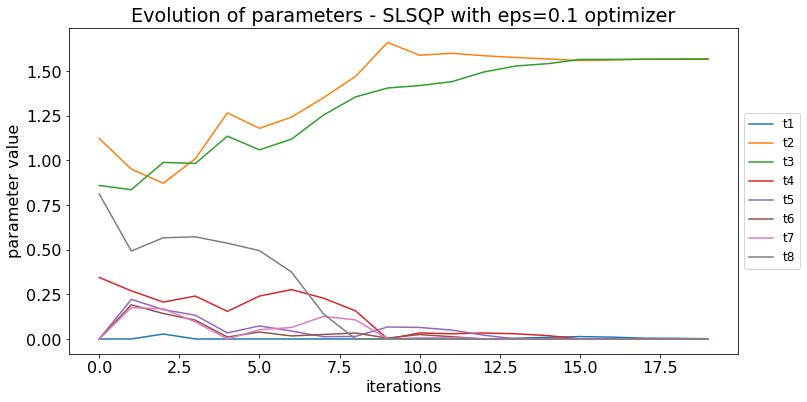

Best parameters (sum to 3.14):	[4.077e-03 1.568e+00 1.567e+00 5.000e-04 5.000e-04 5.000e-04 5.000e-04
 5.000e-04]
Best parameters (sum to 1):	[1.298e-03 4.992e-01 4.987e-01 1.592e-04 1.592e-04 1.592e-04 1.592e-04
 1.592e-04]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


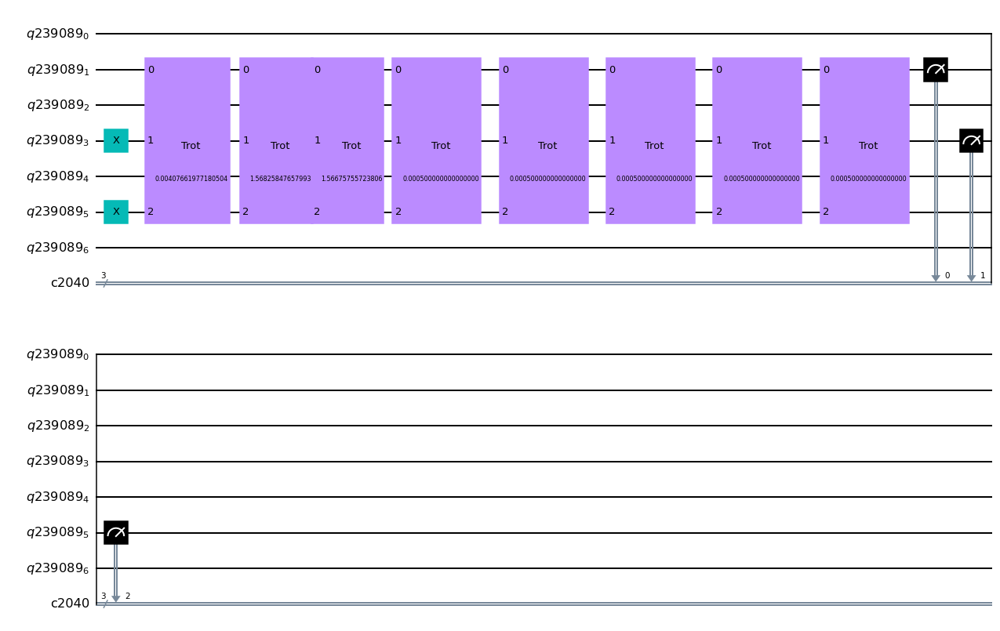

################################################################################
Single trotterization step:


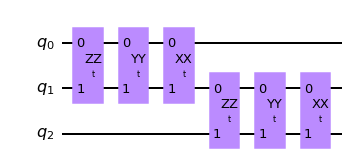

################################################################################

All steps + measurements of state tomography:


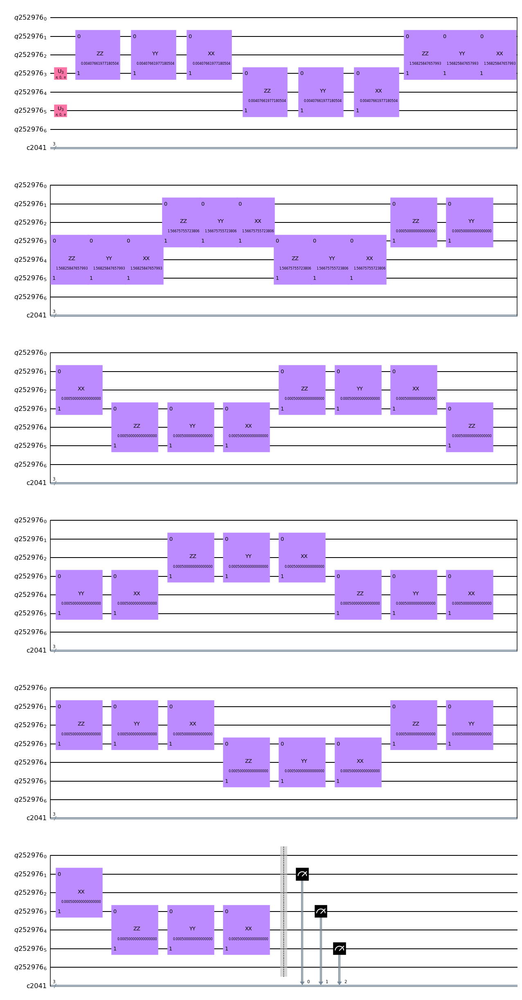

################################################################################

1/8 - Job ID fcb3f270-6425-4aef-acc7-6b5b80a9b3d2
2/8 - Job ID 5db3896a-36e9-454b-bd56-30bbf09bb709
3/8 - Job ID e990c737-4242-4bf0-9fc0-9bcf757f03f6
4/8 - Job ID 05d9f910-2f26-46fa-adcc-a8fab3838f9c
5/8 - Job ID b5d82178-233a-479d-976a-34363ea47590
6/8 - Job ID 8c986d7e-1c5a-4970-8d0b-27370823cbd4
7/8 - Job ID 955aadb8-3a87-4daa-8fcb-cbd30b270279
8/8 - Job ID 40f41e6d-31de-44b6-9d85-7d37d0c41d9d

################################################################################

Final results - order: 1 - strotter steps: 8

State tomography fidelity = 0.4226 ± 0.0012

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:07



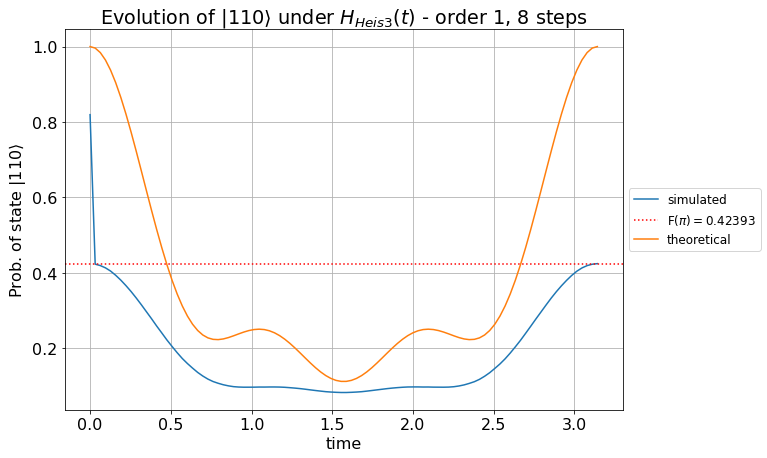

CPU times: user 1h 36min 59s, sys: 1min 59s, total: 1h 38min 58s
Wall time: 1h 14min 53s


In [9]:
%%time
order = 1
uniform_times  = False
backend_opt, backend_state_tomo = sim_noisy_jakarta, sim_noisy_jakarta
quadratic_loss = False

steps = range(4, 9)
min_times = [0.1, 0.01, 0.001, 0.0005]

combs = itertools.product(steps, min_times)

for trotter_steps, params_bounds_min in combs:
    
    print("\n\n")    
    print("#"*80)
    print("="*80)
    print("#"*80)
    print(f"Order: {order}".center(80))
    print(f"# steps: {trotter_steps}".center(80))
    print(f"min time: {params_bounds_min}".center(80))
    print("#"*80)
    print("="*80)
    print("#"*80)
    print("\n\n")
    
    fids, fidelity_pi, best_params = optimize_params_and_run(order, trotter_steps, uniform_times, params_bounds_min,
                                                             backend_opt, backend_state_tomo, quadratic_loss)
    
    results['order'].append(order)
    results['n_steps'].append(trotter_steps)
    results['t_min'].append(params_bounds_min)
    results['state_tomo_fids'].append(fids)
    results['fid_pi'].append(fidelity_pi)
    results['best_params'].append(best_params)

In [10]:
#sorting firt order results by highest fidelity
results_first_order = pd.DataFrame(results).sort_values("fid_pi", ascending=False)

results_first_order

,order,n_steps,t_min,state_tomo_fids,fid_pi,best_params
2,1,4,0.0010,"[0.5784652519687651, 0.574286376365254, 0.5750...",0.57411,"[0.001, 1.568456254347037, 0.00388483498907728..."
3,1,4,0.0005,"[0.5716769278686193, 0.5743328336679746, 0.575...",0.57411,"[0.0017461160414020311, 1.5703193318202449, 0...."
1,1,4,0.0100,"[0.5767852554194195, 0.5795811131392834, 0.573...",0.57405,"[0.010000000000000002, 1.5562983235294372, 0.0..."
0,1,4,0.1000,"[0.5627217038552783, 0.5645457169991213, 0.559...",0.56336,"[0.1, 1.4542006072722344, 0.10000000000000002,..."
7,1,5,0.0005,"[0.5287527977884076, 0.5344052863829062, 0.532...",0.52963,"[0.0005000000000000004, 3.1395926535896734, 0...."
6,1,5,0.0010,"[0.5314668915146457, 0.5338984300838793, 0.532...",0.52956,"[0.0010003879226125475, 1.5720226639167176, 1...."
5,1,5,0.0100,"[0.5309573857901896, 0.529393783112713, 0.5283...",0.52941,"[0.010000000000000005, 1.563732301548536, 1.54..."
4,1,5,0.1000,"[0.5008944498803715, 0.5012708448662984, 0.499...",0.50069,"[0.10000000000000002, 1.4204674816061003, 1.42..."
11,1,6,0.0005,"[0.48885018656084106, 0.49007894405588326, 0.4...",0.4907,"[0.0014542523057605751, 1.567753820530556, 1.5..."
10,1,6,0.0010,"[0.49083094916045195, 0.48688061179978165, 0.4...",0.4907,"[0.0014796098234385764, 1.568081721352316, 1.5..."


In [11]:
# saving the best schedule time once optimized for each combination to reuse for hardware execution 
results_first_order["fid_pi"] = results_first_order["fid_pi"].astype("float")

file_1st = f"results/results_opt_first_order_{dt.datetime.today().date()}.parquet"

results_first_order.to_parquet(file_1st, index=False)

___________

### Second order trotterization ($k = 2$)

- Number steps: 4 to 8;
- Variable time;
- Minimum time: 0.1, 0.01, 0.001, 0.0005;
- It takes around 1 hour to finish all combinations.

In [12]:
results = {"order"   : [],
           "n_steps" : [],
           "t_min"   : [],
           "state_tomo_fids" : [],
           "fid_pi"  : [],
           "best_params" : []}




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 4                                   
                                 min time: 0.1                                  
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


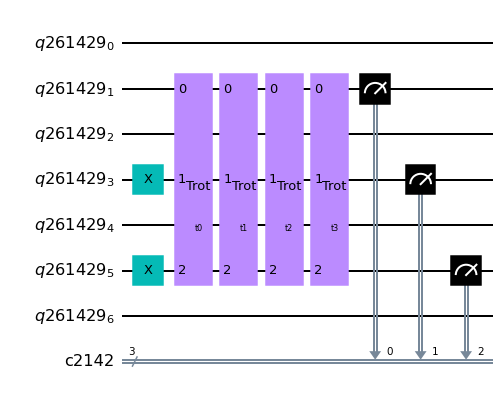

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.13871
Current parameters: [0.107 1.479 0.818 0.738] (sum to 3.14)

Iter 2 done!
Loss value: -0.14531
Current parameters: [0.1   1.52  0.849 0.673] (sum to 3.14)

Iter 3 done!
Loss value: -0.27545
Current parameters: [0.1   1.707 1.064 0.271] (sum to 3.14)

Iter 4 done!
Loss value: -0.3935
Current parameters: [0.1   1.711 1.231 0.1  ] (sum to 3.14)

Iter 5 done!
Loss value: -0.39946
Current parameters: [0.1   1.278 1.664 0.1  ] (sum to 3.14)

Iter 6 done!
Loss value: -0.41833
Current parameters: [0.1   1.473 1.468 0.1  ] (sum to 3.14)

Iter 7 done!
Loss value: -0.41832
Current parameters: [0.1   1.472 1.47  0.1  ] (sum to 3.14)

Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41833
            Iterations: 7
            Function evaluations: 47
            Gradient evaluations: 7

To

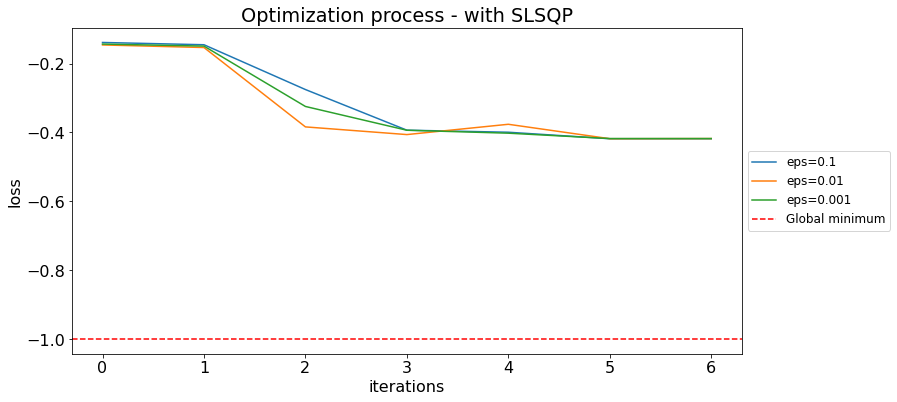


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.10000000000000278, 1.475106508122843, 1.466...",-0.41834
0,slsqp,0.100,"[0.10000000000000002, 1.4731615937620577, 1.46...",-0.41833
2,slsqp,0.001,"[0.10000000000000012, 1.4481093987592029, 1.49...",-0.41784


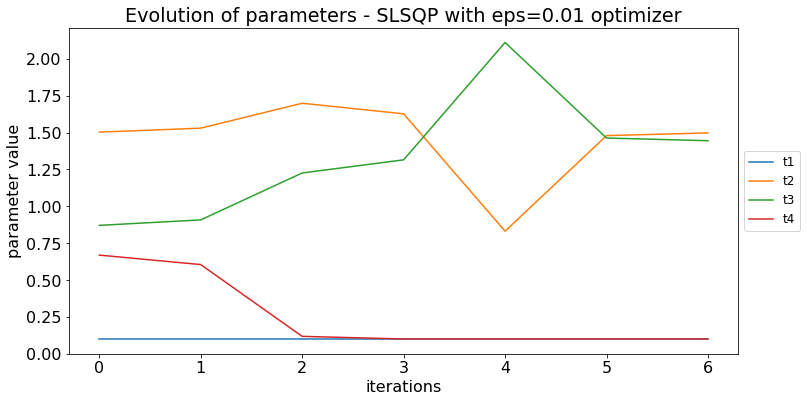

Best parameters (sum to 3.14):	[0.1   1.475 1.466 0.1  ]
Best parameters (sum to 1):	[0.032 0.47  0.467 0.032]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


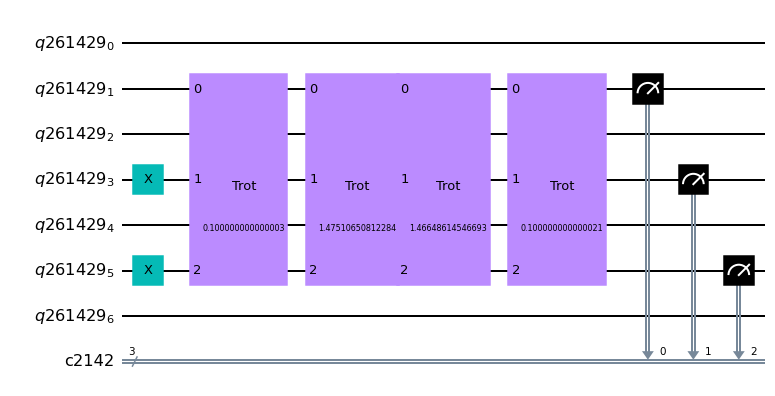

################################################################################
Single trotterization step:


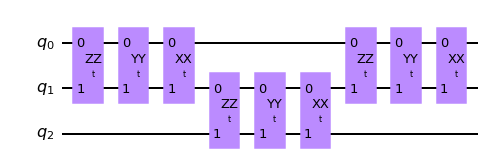

################################################################################

All steps + measurements of state tomography:


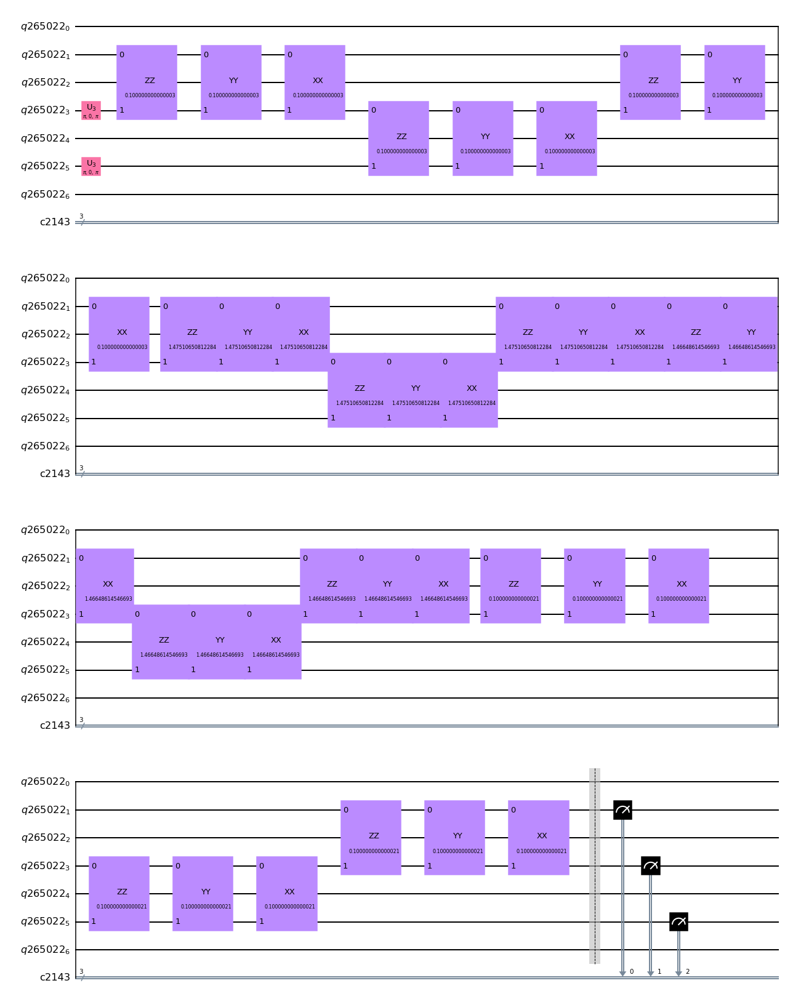

################################################################################

1/8 - Job ID 2e42532a-9913-4317-a433-4da1b2cddcc7
2/8 - Job ID ba5641e9-9d18-416c-b33f-411c79173dd7
3/8 - Job ID 95cba6c7-600d-48dc-b75a-37cb0a7c1344
4/8 - Job ID 7f48f5b7-d28c-44d9-8629-10d858280807
5/8 - Job ID c5550a53-4b84-443e-bffa-94653dc86e9e
6/8 - Job ID 2bedcc7f-b89c-42a3-95fb-466ad50e7701
7/8 - Job ID 2139f3ef-9cae-4be8-ac28-326303152948
8/8 - Job ID 3d2ca361-9e48-4e07-ada4-397b7bb6b6a6

################################################################################

Final results - order: 2 - strotter steps: 4

State tomography fidelity = 0.4179 ± 0.0017

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:00:59



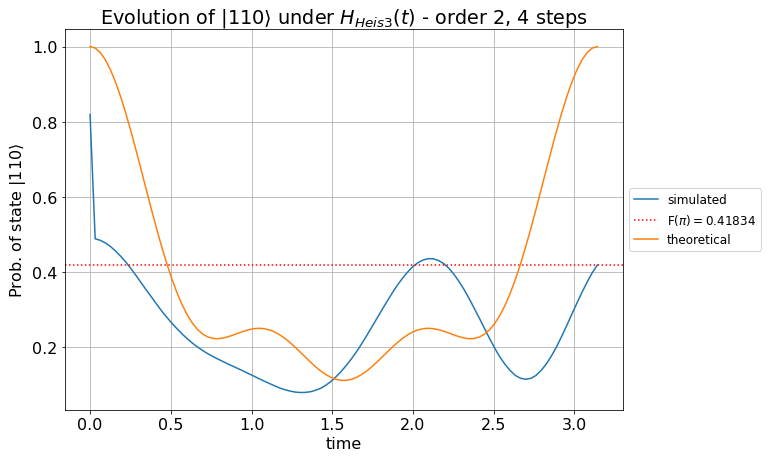




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 4                                   
                                 min time: 0.01                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


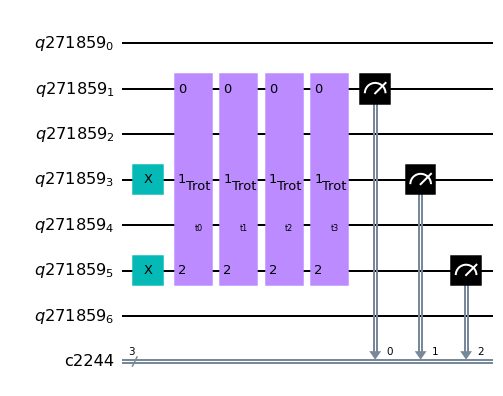

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.17267
Current parameters: [0.01  1.614 0.873 0.645] (sum to 3.14)

Iter 2 done!
Loss value: -0.19338
Current parameters: [0.01  1.687 0.893 0.552] (sum to 3.14)

Iter 3 done!
Loss value: -0.44439
Current parameters: [0.01  2.025 1.097 0.01 ] (sum to 3.14)

Iter 4 done!
Loss value: -0.41576
Current parameters: [0.01  1.957 1.054 0.121] (sum to 3.14)

Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44439
            Iterations: 4
            Function evaluations: 31
            Gradient evaluations: 4

Total time of optimization: 00:00:19

Optimizer: SLSQP
eps = 0.01

Iter 1 done!
Loss value: -0.19258
Current parameters: [0.01  1.684 0.893 0.555] (sum to 3.14)

Iter 2 done!
Loss value: -0.2654
Current parameters: [0.01  1.797 0.957 0.377] (sum to 3.14)

Iter 3 done!
Loss value: -0.44

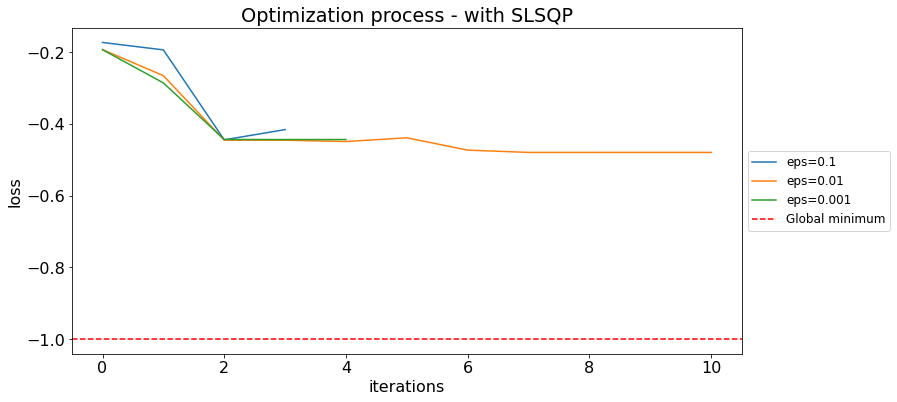


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.010000000000000007, 1.560694927216592, 1.56...",-0.47946
0,slsqp,0.100,"[0.010000000000000222, 2.024964478185343, 1.09...",-0.44439
2,slsqp,0.001,"[0.010000000000000014, 2.0977711560928185, 1.0...",-0.44356


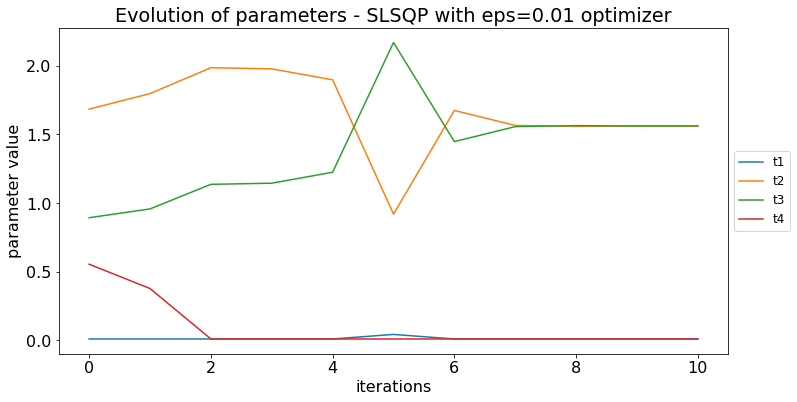

Best parameters (sum to 3.14):	[0.01  1.561 1.561 0.01 ]
Best parameters (sum to 1):	[0.003 0.497 0.497 0.003]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


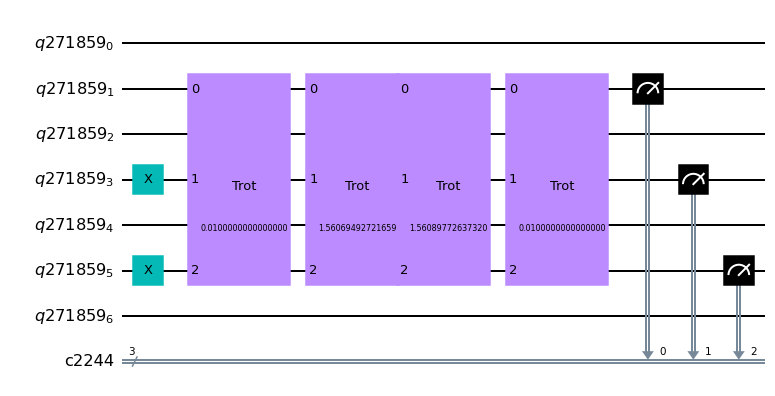

################################################################################
Single trotterization step:


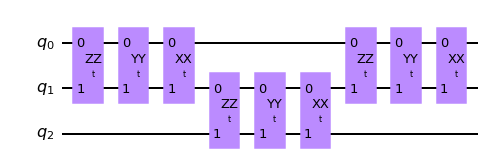

################################################################################

All steps + measurements of state tomography:


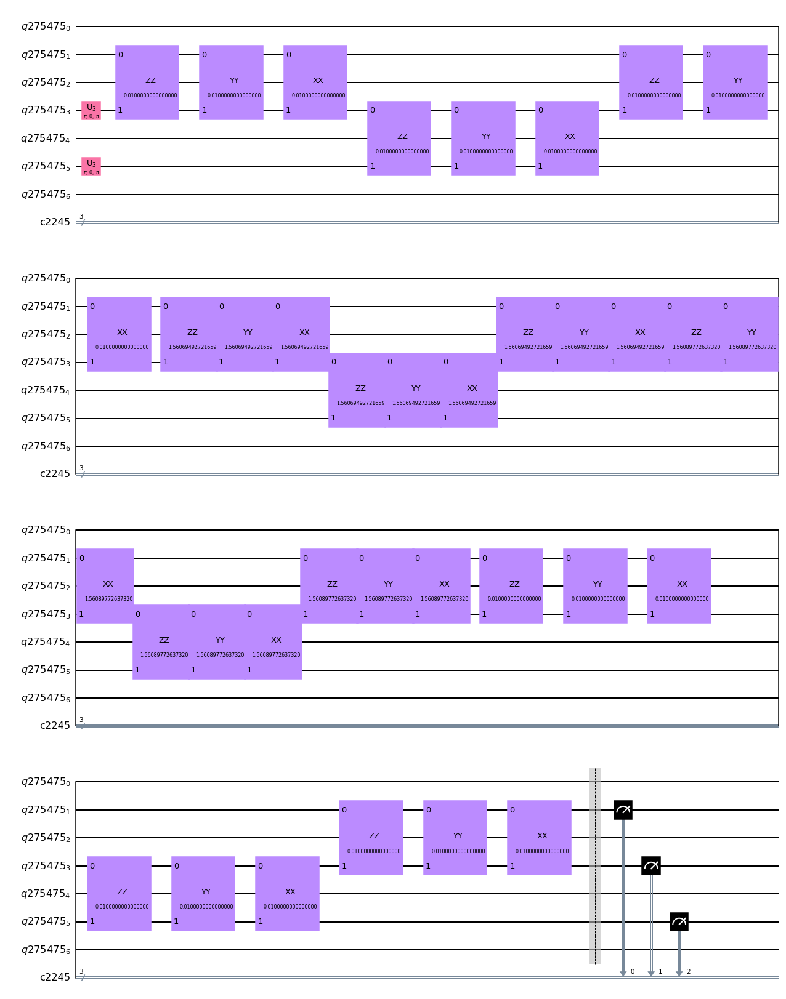

################################################################################

1/8 - Job ID d3b25411-9187-4a29-9d77-7ed1a17ae0aa
2/8 - Job ID f312c9c8-d010-4191-97df-59769bd05060
3/8 - Job ID caf799f3-63a2-40ce-af84-fcf825b4148f
4/8 - Job ID aa00fbaa-fa1a-4b84-b07e-787c5b8cc4da
5/8 - Job ID 12225b8a-6db8-4f7e-82f6-2f907625cf65
6/8 - Job ID 830974a8-a082-453f-a929-34b5ea11bfaf
7/8 - Job ID 75668256-d60f-4066-9f09-e82565338ca4
8/8 - Job ID 835dd122-c9de-4dba-bd9e-9a3b1191a2c4

################################################################################

Final results - order: 2 - strotter steps: 4

State tomography fidelity = 0.4797 ± 0.0016

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:02



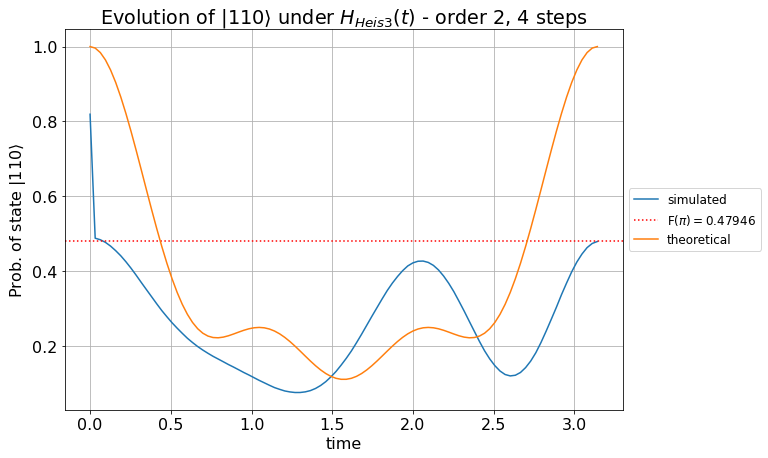




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 4                                   
                                min time: 0.001                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


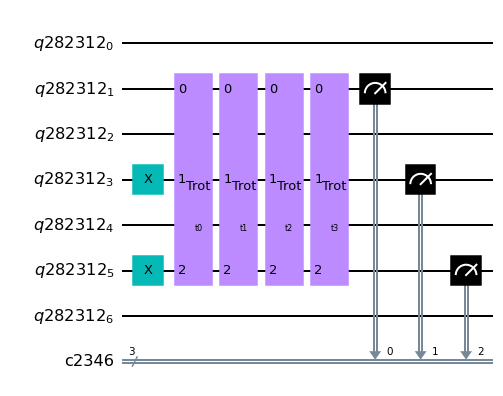

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.17802
Current parameters: [1.000e-03 1.628e+00 8.779e-01 6.347e-01] (sum to 3.14)

Iter 2 done!
Loss value: -0.20151
Current parameters: [1.000e-03 1.704e+00 8.978e-01 5.384e-01] (sum to 3.14)

Iter 3 done!
Loss value: -0.44508
Current parameters: [1.000e-03 2.045e+00 1.094e+00 1.000e-03] (sum to 3.14)

Iter 4 done!
Loss value: -0.38993
Current parameters: [1.000e-03 1.938e+00 1.022e+00 1.805e-01] (sum to 3.14)

Iter 5 done!
Loss value: -0.44209
Current parameters: [1.000e-03 2.017e+00 1.081e+00 4.197e-02] (sum to 3.14)

Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44513
            Iterations: 5
            Function evaluations: 40
            Gradient evaluations: 5

Total time of optimization: 00:00:25

Optimizer: SLSQP
eps = 0.01

Iter 1 done!
Loss value: -0.20008
Current pa

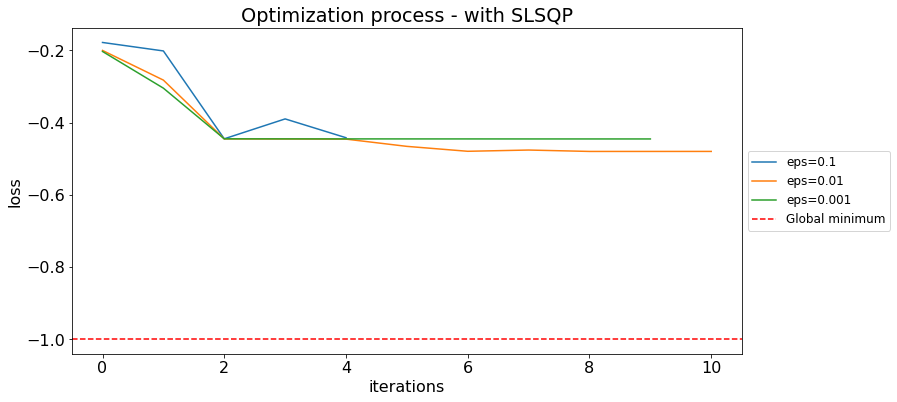


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.0010000812767599512, 1.572844659094464, 1.5...",-0.48013
2,slsqp,0.001,"[0.0010000000000000087, 2.014201901210442, 1.1...",-0.44549
0,slsqp,0.100,"[0.001000000000000042, 2.0439506323437717, 1.0...",-0.44513


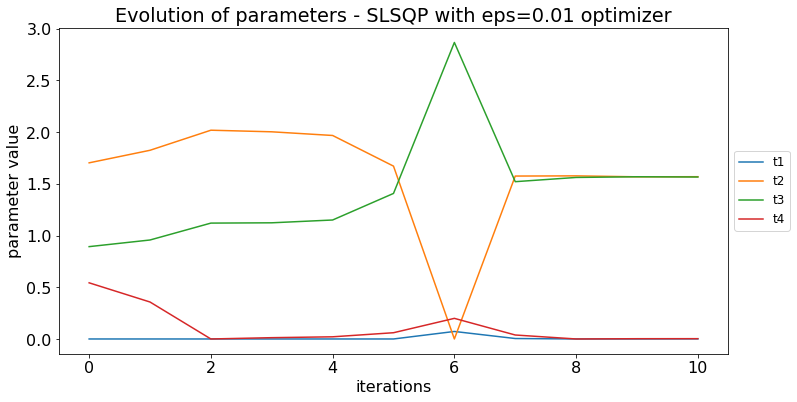

Best parameters (sum to 3.14):	[1.000e-03 1.573e+00 1.565e+00 2.272e-03]
Best parameters (sum to 1):	[3.183e-04 5.007e-01 4.983e-01 7.231e-04]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


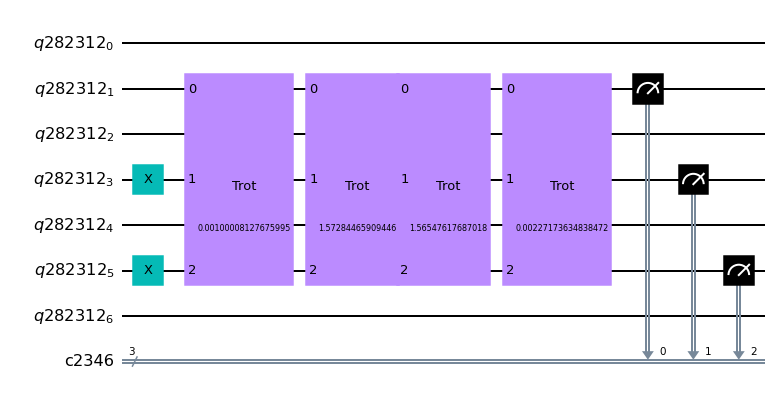

################################################################################
Single trotterization step:


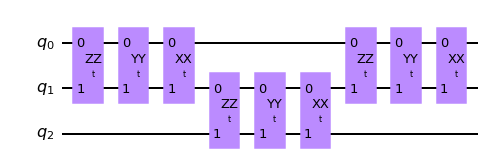

################################################################################

All steps + measurements of state tomography:


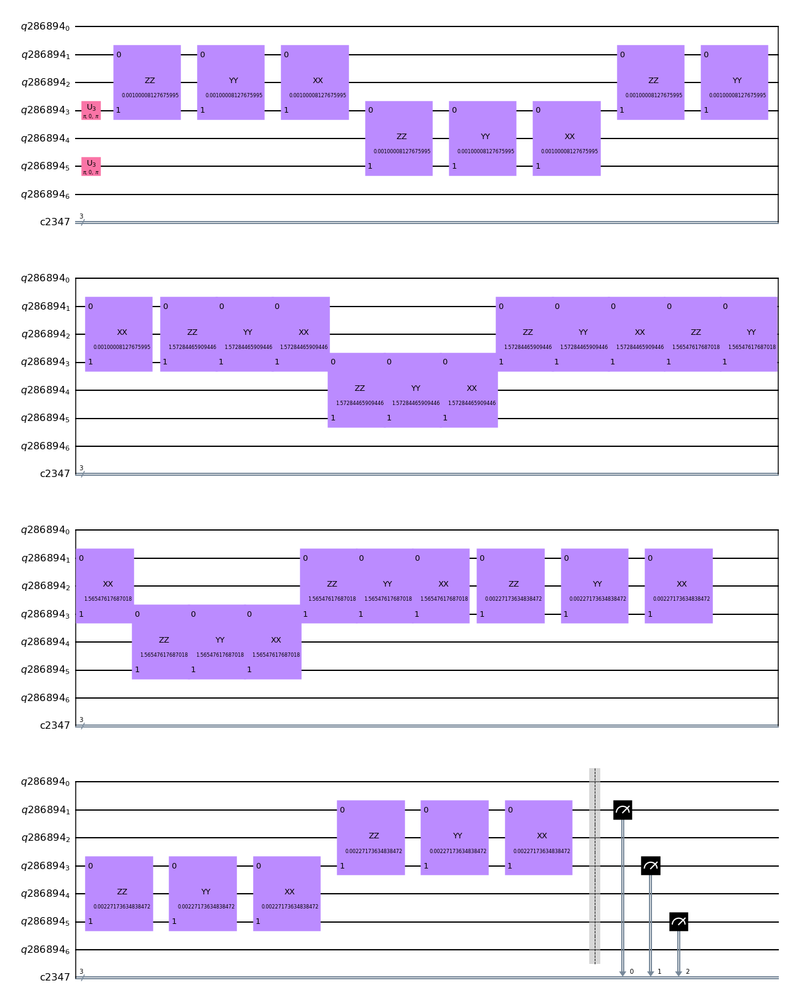

################################################################################

1/8 - Job ID 6cf7c4e7-d7ec-4f85-8718-09188dd64a03
2/8 - Job ID e851f2b9-f37a-4e70-beb1-ab6f3d767ea5
3/8 - Job ID 96f2bde1-0e17-499c-88b2-33d35bc0ee36
4/8 - Job ID bf05bfd7-8d2f-4e61-ae8d-08da16f5a14b
5/8 - Job ID a937dbde-3437-4dbb-b981-634e6d43614b
6/8 - Job ID 06bb5531-6d1f-4f02-9a0b-281be5fcaebb
7/8 - Job ID 7a251be8-02fc-43ae-8131-75c6c1b09a12
8/8 - Job ID c360b341-c4fa-4582-a9ff-ba1dc17f0e34

################################################################################

Final results - order: 2 - strotter steps: 4

State tomography fidelity = 0.4799 ± 0.0018

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:02



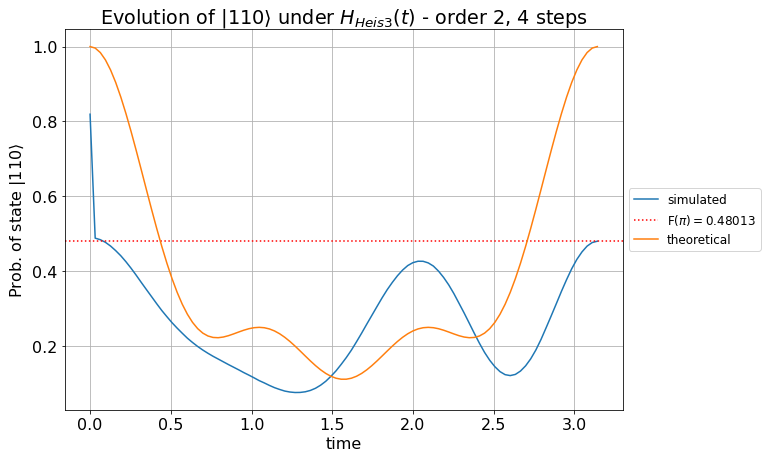




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 4                                   
                                min time: 0.0005                                
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


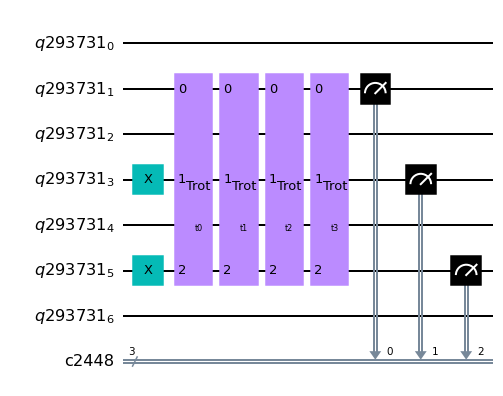

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.17835
Current parameters: [5.000e-04 1.629e+00 8.786e-01 6.336e-01] (sum to 3.14)

Iter 2 done!
Loss value: -0.20262
Current parameters: [5.000e-04 1.707e+00 8.982e-01 5.358e-01] (sum to 3.14)

Iter 3 done!
Loss value: -0.44497
Current parameters: [5.000e-04 2.048e+00 1.092e+00 5.000e-04] (sum to 3.14)

Iter 4 done!
Loss value: -0.38962
Current parameters: [5.000e-04 1.940e+00 1.020e+00 1.815e-01] (sum to 3.14)

Iter 5 done!
Loss value: -0.44286
Current parameters: [5.000e-04 2.026e+00 1.078e+00 3.685e-02] (sum to 3.14)

Iter 6 done!
Loss value: -0.4405
Current parameters: [5.000e-04 1.984e+00 1.103e+00 5.421e-02] (sum to 3.14)

Iter 7 done!
Loss value: -0.44203
Current parameters: [5.000e-04 1.989e+00 1.106e+00 4.606e-02] (sum to 3.14)

Iter 8 done!
Loss value: -0.44331
Current parameters: [5.000e-04 1.999e+00 1.105e+00 3.64

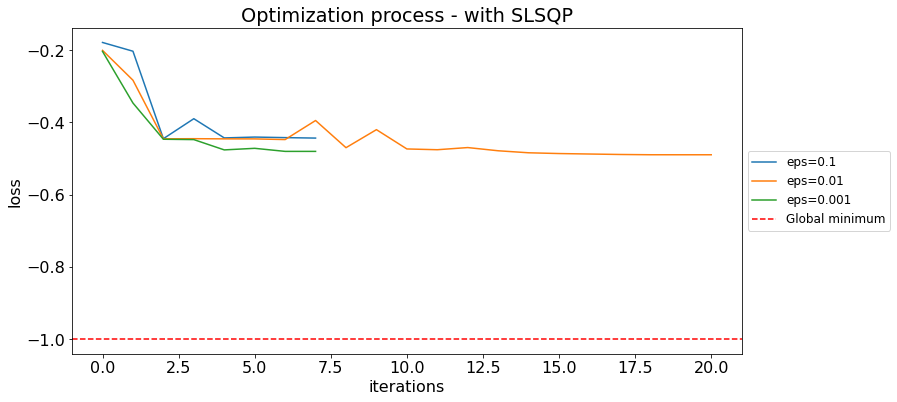


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.0005, 0.0005000000000000028, 3.138415754501...",-0.48954
2,slsqp,0.001,"[0.0005, 1.569154013118712, 1.5714386404710907...",-0.48017
0,slsqp,0.100,"[0.0005000000000000009, 2.0416318958126296, 1....",-0.44511


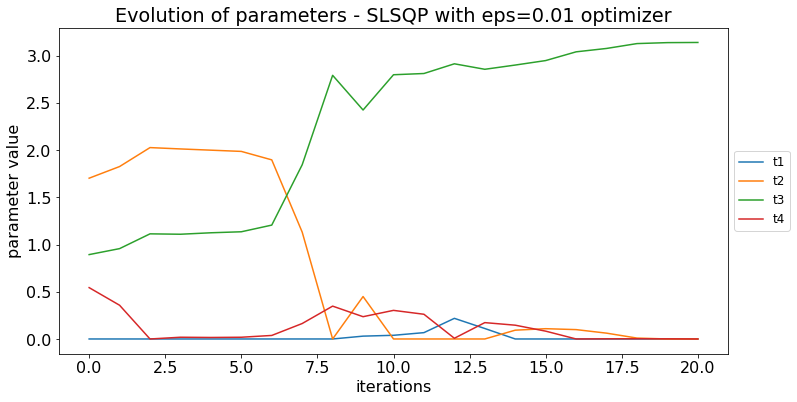

Best parameters (sum to 3.14):	[5.000e-04 5.000e-04 3.138e+00 2.177e-03]
Best parameters (sum to 1):	[1.592e-04 1.592e-04 9.990e-01 6.929e-04]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


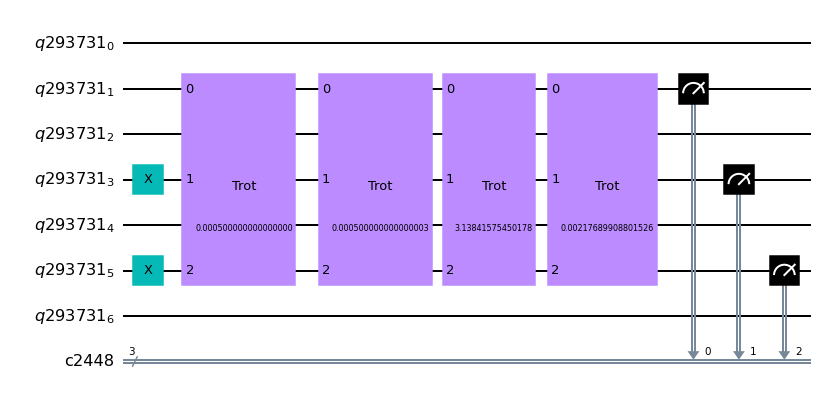

################################################################################
Single trotterization step:


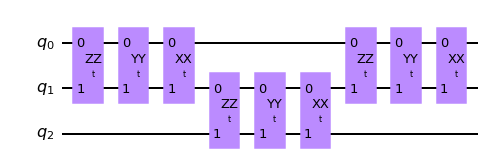

################################################################################

All steps + measurements of state tomography:


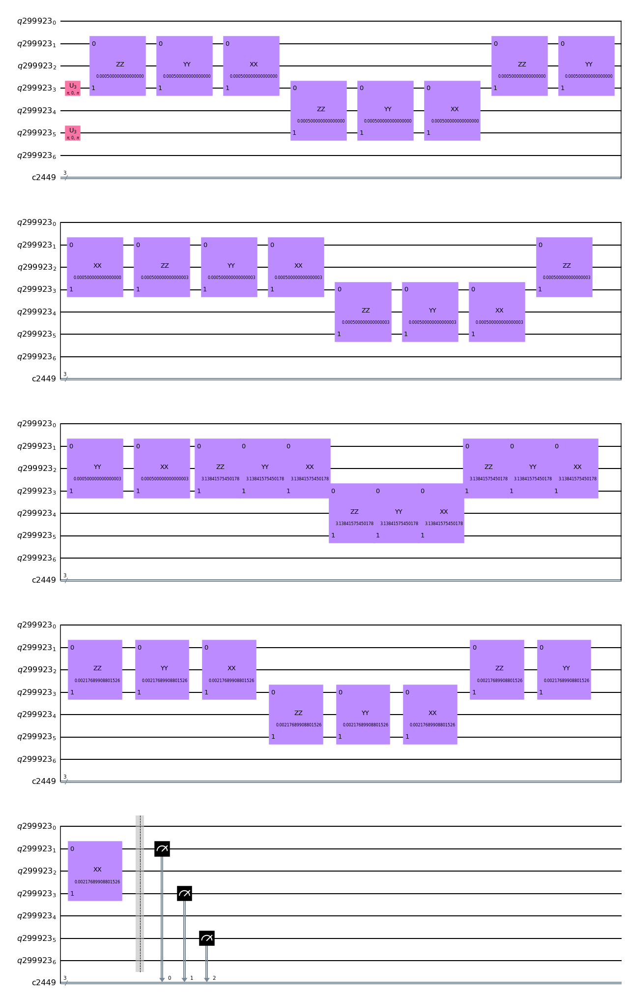

################################################################################

1/8 - Job ID 3f912968-499f-4a8b-8dcf-13d32f4a8850
2/8 - Job ID c456dcd4-2900-462a-b5e8-894a1cc86bb7
3/8 - Job ID 13fb7009-40f3-48e3-9562-eef4c7f766d9
4/8 - Job ID 843888bd-f57b-4c94-8240-a97dbee13e5b
5/8 - Job ID 3549ff04-fd4a-4db2-889f-5b23e6c8d02b
6/8 - Job ID 4463db50-8ae6-4661-a3b0-485fcd4f02f4
7/8 - Job ID 6a09a561-6a25-4221-8226-a1cd9584aae5
8/8 - Job ID d187b691-6f40-4f1f-9209-585247410a29

################################################################################

Final results - order: 2 - strotter steps: 4

State tomography fidelity = 0.4901 ± 0.0019

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:03



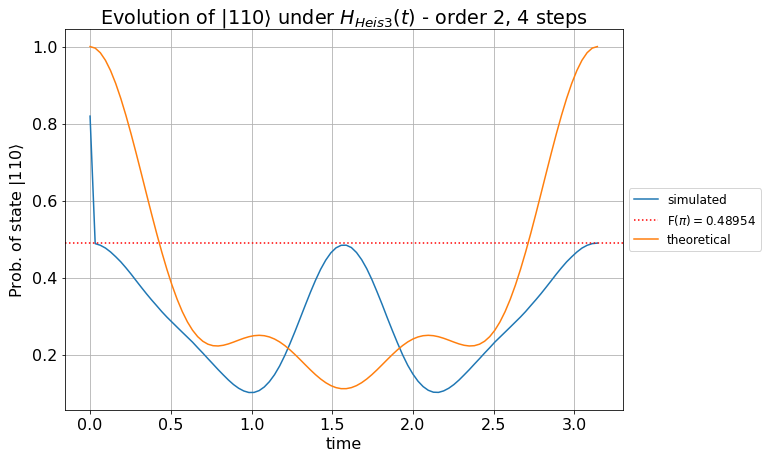




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 5                                   
                                 min time: 0.1                                  
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


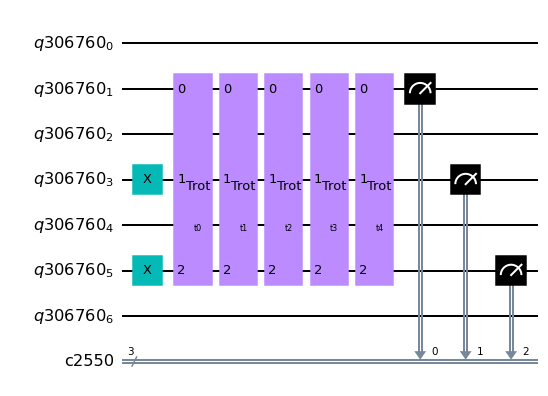

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.13758
Current parameters: [0.1   1.689 0.755 0.497 0.1  ] (sum to 3.14)

Iter 2 done!
Loss value: -0.1429
Current parameters: [0.1   1.726 0.77  0.445 0.1  ] (sum to 3.14)

Iter 3 done!
Loss value: -0.27858
Current parameters: [0.1   1.929 0.913 0.1   0.1  ] (sum to 3.14)

Iter 4 done!
Loss value: -0.27865
Current parameters: [0.1   1.913 0.929 0.1   0.1  ] (sum to 3.14)

Iter 5 done!
Loss value: -0.28174
Current parameters: [0.1   1.821 1.02  0.1   0.1  ] (sum to 3.14)

Iter 6 done!
Loss value: -0.27378
Current parameters: [0.1   0.825 2.016 0.1   0.1  ] (sum to 3.14)

Iter 7 done!
Loss value: -0.31044
Current parameters: [0.1   1.575 1.267 0.1   0.1  ] (sum to 3.14)

Iter 8 done!
Loss value: -0.32022
Current parameters: [0.1   1.437 1.405 0.1   0.1  ] (sum to 3.14)

Iter 9 done!
Loss value: -0.32024
Current parameters: [0.1

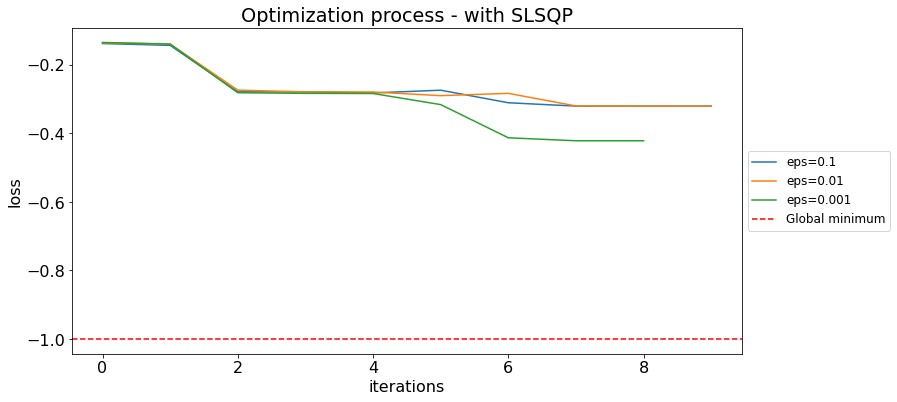


Optimization results:



,optimizer,eps,final_params,final_loss
2,slsqp,0.001,"[0.1, 0.10000000047045174, 2.741592653160785, ...",-0.42139
1,slsqp,0.010,"[0.10000000000000002, 1.4342156281023895, 1.40...",-0.32025
0,slsqp,0.100,"[0.1, 1.4358253033993593, 1.405767350190491, 0...",-0.32024


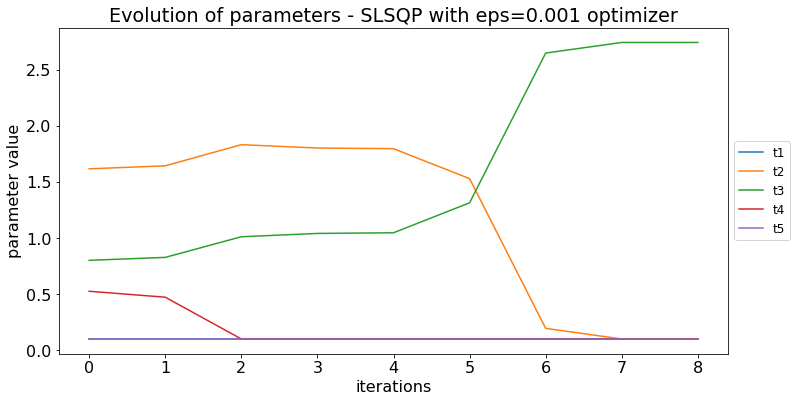

Best parameters (sum to 3.14):	[0.1   0.1   2.742 0.1   0.1  ]
Best parameters (sum to 1):	[0.032 0.032 0.873 0.032 0.032]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


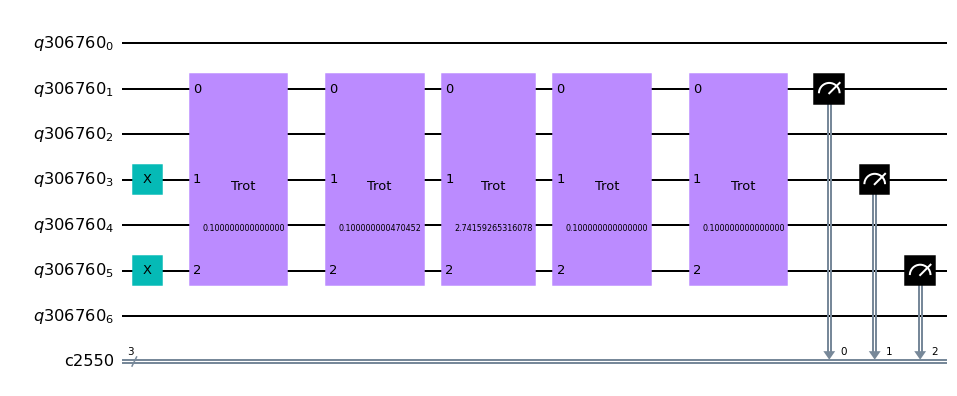

################################################################################
Single trotterization step:


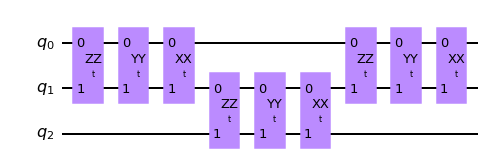

################################################################################

All steps + measurements of state tomography:


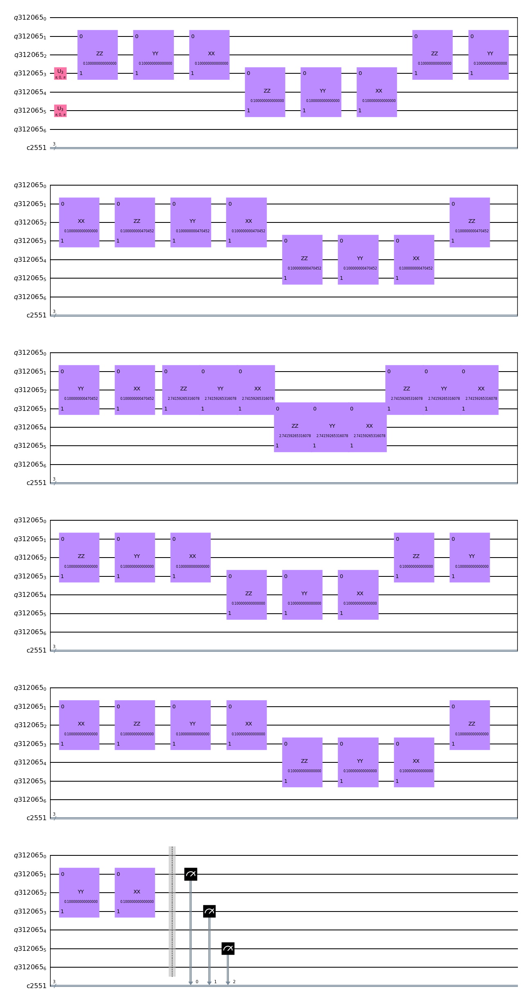

################################################################################

1/8 - Job ID bfe66967-5754-4051-b55c-d937e9932d7a
2/8 - Job ID 327ad5d5-86ea-484d-9a69-50f59e5c8cb4
3/8 - Job ID fe40b498-d20d-4411-a419-c6a68f2a36e8
4/8 - Job ID cf1f1feb-faf7-4c07-a14e-7ea2508a3f19
5/8 - Job ID 8a8e1671-17d7-4d66-8eac-2acb133aefc0
6/8 - Job ID 2bf19214-bd22-4b56-a726-844e7837bd58
7/8 - Job ID d9e446f9-9260-4fed-b7b2-4b20cc7f4823
8/8 - Job ID d210712e-eaa2-4aef-9169-a197af7c2611

################################################################################

Final results - order: 2 - strotter steps: 5

State tomography fidelity = 0.4193 ± 0.0021

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:08



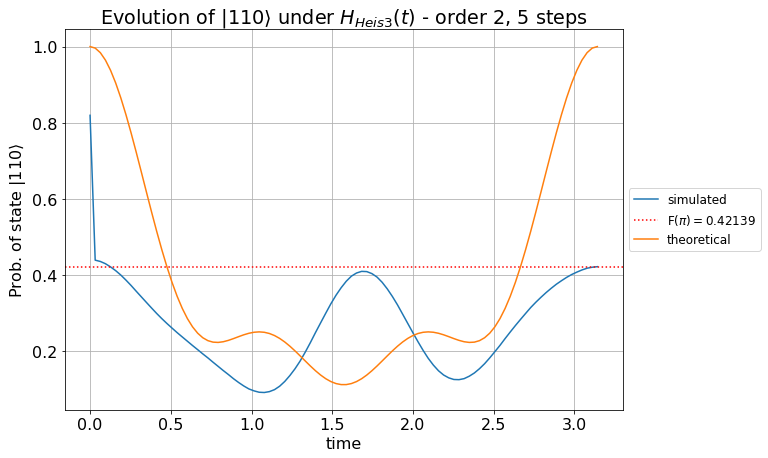




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 5                                   
                                 min time: 0.01                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


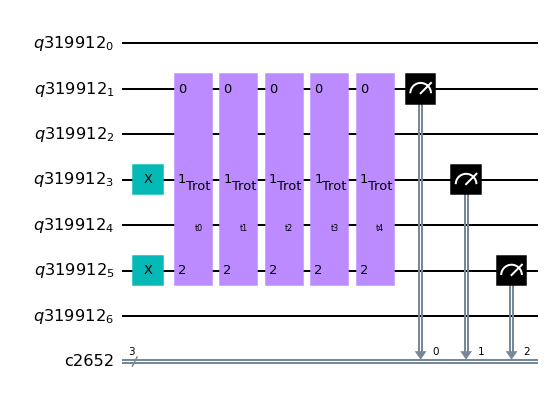

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.1668
Current parameters: [0.01  1.667 0.829 0.626 0.01 ] (sum to 3.14)

Iter 2 done!
Loss value: -0.18175
Current parameters: [0.01  1.742 0.826 0.553 0.01 ] (sum to 3.14)

Iter 3 done!
Loss value: -0.39747
Current parameters: [0.01  2.209 0.898 0.014 0.01 ] (sum to 3.14)

Iter 4 done!
Loss value: -0.39782
Current parameters: [0.01  2.219 0.892 0.01  0.01 ] (sum to 3.14)

Iter 5 done!
Loss value: -0.39817
Current parameters: [0.01  2.303 0.809 0.01  0.01 ] (sum to 3.14)

Iter 6 done!
Loss value: -0.43725
Current parameters: [0.01  3.019 0.092 0.01  0.01 ] (sum to 3.14)

Iter 7 done!
Loss value: -0.43937
Current parameters: [0.01  3.102 0.01  0.01  0.01 ] (sum to 3.14)

Iter 8 done!
Loss value: -0.43937
Current parameters: [0.01  3.102 0.01  0.01  0.01 ] (sum to 3.14)

Optimization terminated successfully    (Exit mode 0)
    

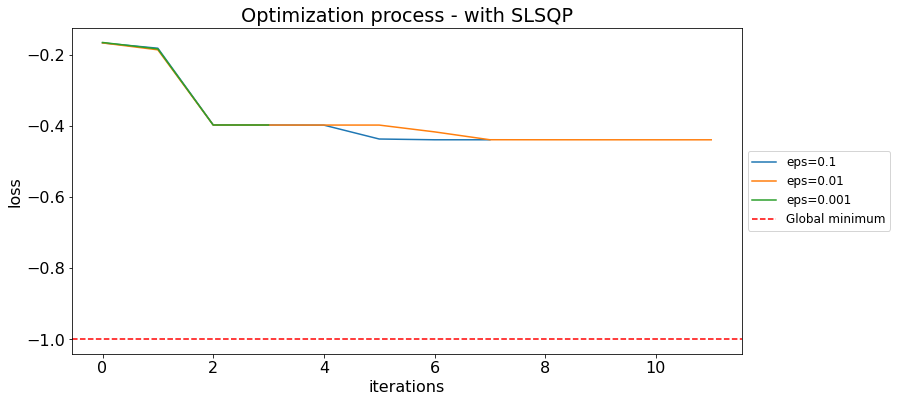


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.010000000000000002, 0.01, 3.101592653589793...",-0.43947
0,slsqp,0.100,"[0.01, 3.1015926535898526, 0.00999999999999999...",-0.43937
2,slsqp,0.001,"[0.010000000000000201, 2.2010243408404633, 0.9...",-0.39784


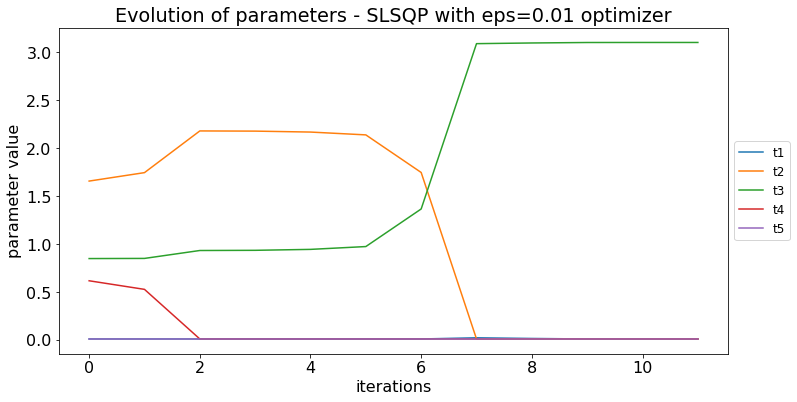

Best parameters (sum to 3.14):	[0.01  0.01  3.102 0.01  0.01 ]
Best parameters (sum to 1):	[0.003 0.003 0.987 0.003 0.003]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


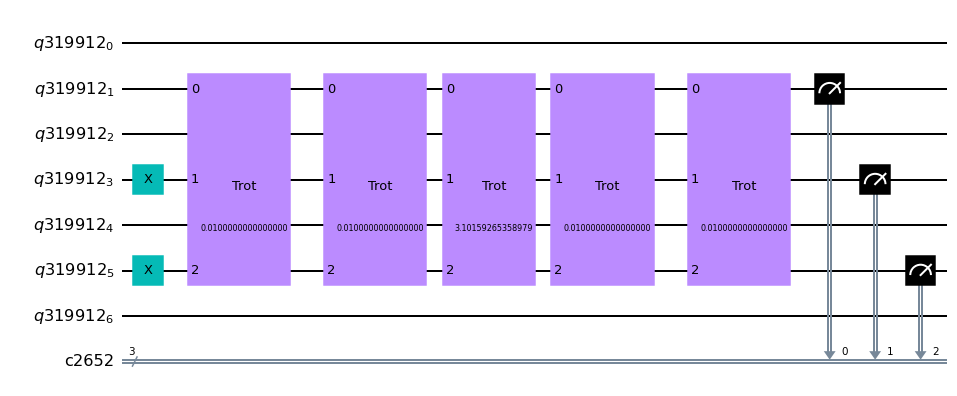

################################################################################
Single trotterization step:


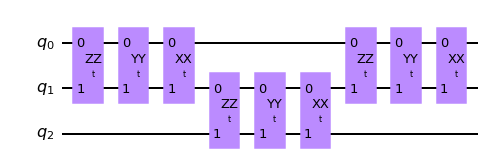

################################################################################

All steps + measurements of state tomography:


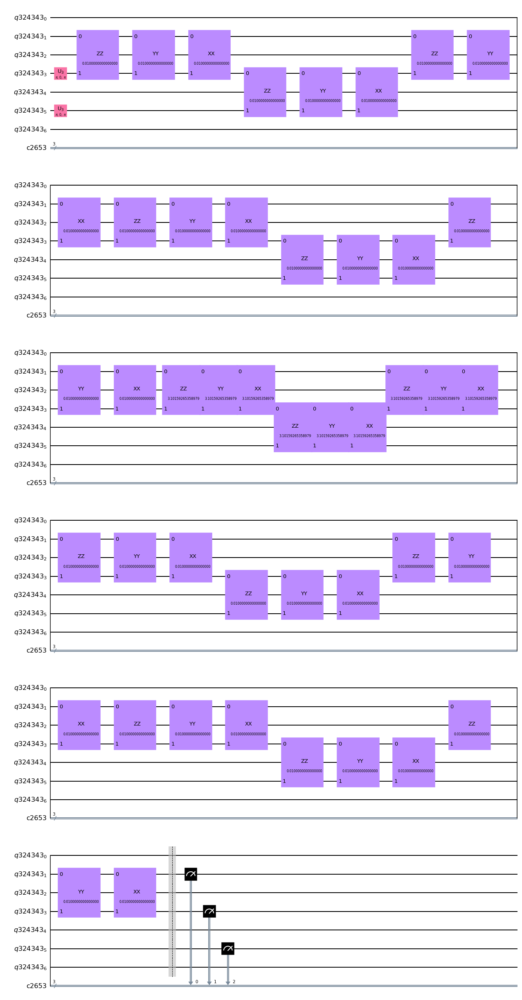

################################################################################

1/8 - Job ID 9ef9e319-c059-4d6b-a29d-db0fc59dcd3f
2/8 - Job ID cb2b18de-4ee5-4a6d-ab3c-31f789ed69ee
3/8 - Job ID 4da73af7-c4e0-45da-bc10-a4c608fc0221
4/8 - Job ID d9be9401-5953-443d-aba7-bdec455bc037
5/8 - Job ID 1422854f-024e-45ca-828b-6c7a0d1bdc1c
6/8 - Job ID 3891d0d8-d3d5-4a0b-a99e-f1bccb4433dc
7/8 - Job ID 5d6ac219-7808-4418-bc48-f5caf31fa8a1
8/8 - Job ID 6a996340-33b4-49e1-817a-c041d53d0042

################################################################################

Final results - order: 2 - strotter steps: 5

State tomography fidelity = 0.4400 ± 0.0015

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:09



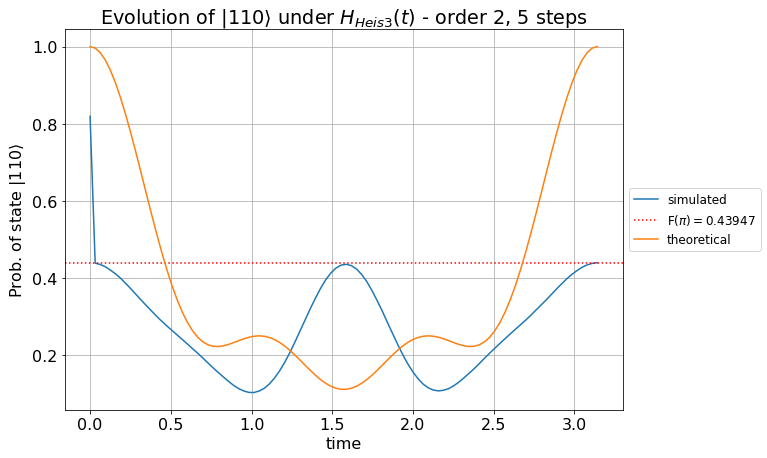




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 5                                   
                                min time: 0.001                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


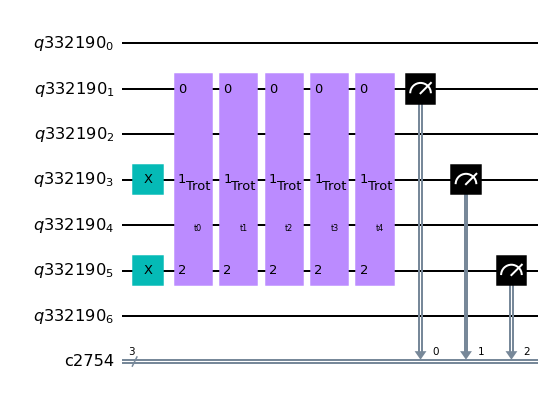

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.17117
Current parameters: [1.000e-03 1.669e+00 8.365e-01 6.343e-01 1.000e-03] (sum to 3.14)

Iter 2 done!
Loss value: -0.18687
Current parameters: [1.000e-03 1.742e+00 8.367e-01 5.607e-01 1.000e-03] (sum to 3.14)

Iter 3 done!
Loss value: -0.39888
Current parameters: [1.000e-03 2.204e+00 9.184e-01 1.742e-02 1.000e-03] (sum to 3.14)

Iter 4 done!
Loss value: -0.39792
Current parameters: [1.000e-03 2.200e+00 9.084e-01 3.084e-02 1.000e-03] (sum to 3.14)

Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39888
            Iterations: 4
            Function evaluations: 35
            Gradient evaluations: 4

Total time of optimization: 00:00:22

Optimizer: SLSQP
eps = 0.01

Iter 1 done!
Loss value: -0.17135
Current parameters: [1.000e-03 1.655e+00 8.635e-01 6.207e-01 1.000e-03] (sum to 3

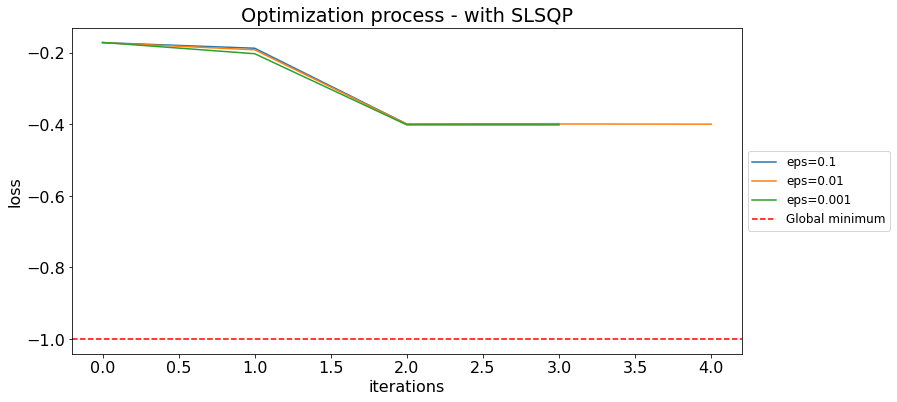


Optimization results:



,optimizer,eps,final_params,final_loss
2,slsqp,0.001,"[0.001000000000000013, 1.9835777289239498, 1.1...",-0.40133
1,slsqp,0.010,"[0.001, 2.1401678152926555, 0.9967757429542726...",-0.39949
0,slsqp,0.100,"[0.001, 2.203788544691425, 0.9183810203893911,...",-0.39888


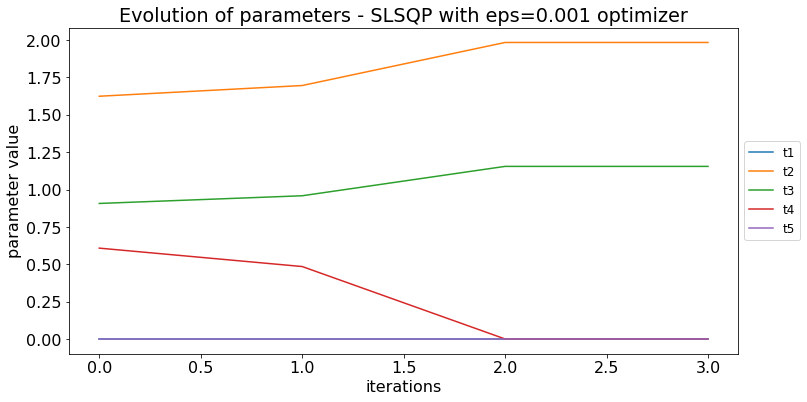

Best parameters (sum to 3.14):	[1.000e-03 1.984e+00 1.155e+00 1.000e-03 1.000e-03]
Best parameters (sum to 1):	[3.183e-04 6.314e-01 3.677e-01 3.183e-04 3.183e-04]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


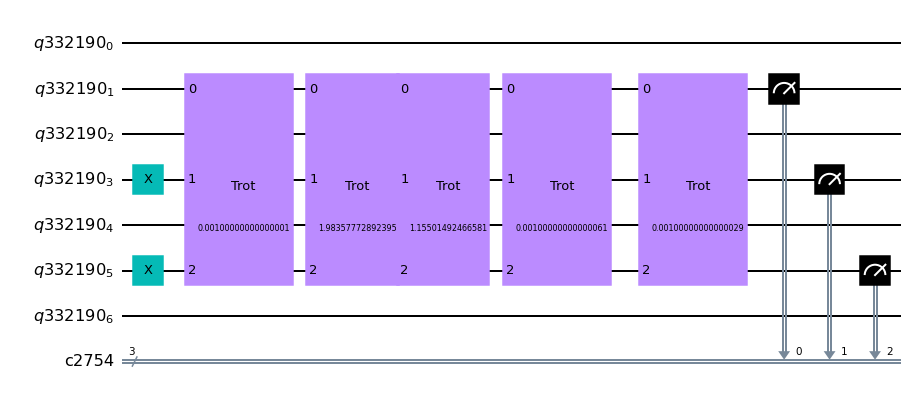

################################################################################
Single trotterization step:


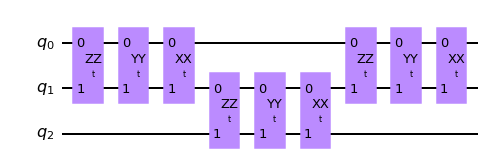

################################################################################

All steps + measurements of state tomography:


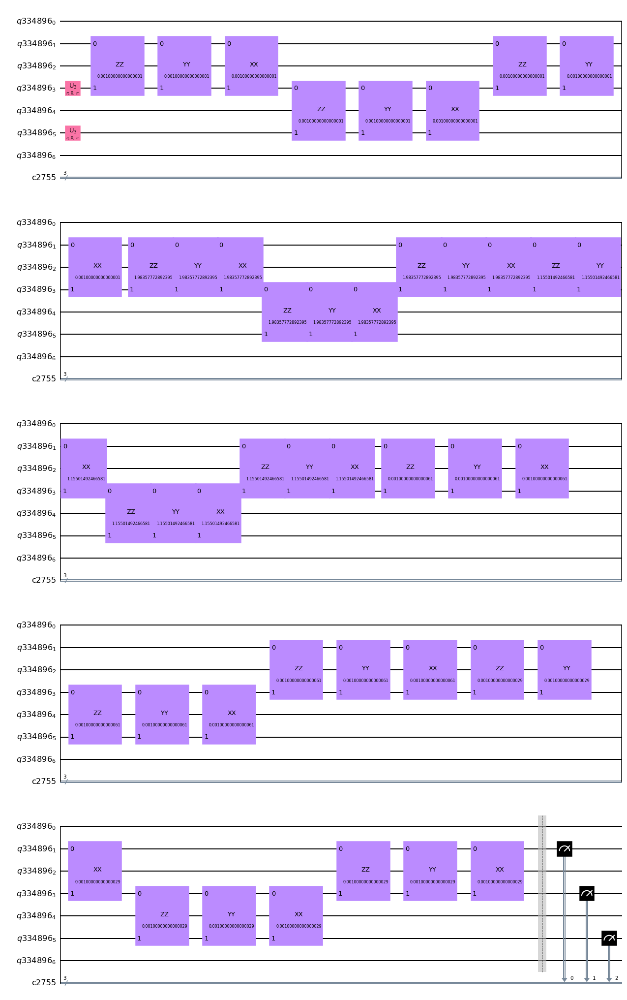

################################################################################

1/8 - Job ID ae70ce0a-fe4d-4ac1-9fb3-3785e0fded04
2/8 - Job ID 9912f4d8-ceb3-4f14-b304-def692353f36
3/8 - Job ID 347986d0-574f-4023-9cf1-62caf8a4b270
4/8 - Job ID 124e8954-4836-42d4-80b9-ec7b03e46ace
5/8 - Job ID 4ebba626-7c05-42f6-bb03-3f683b9cd36f
6/8 - Job ID d52a163d-0411-492d-ba46-45e34d42ca04
7/8 - Job ID 75056b50-8889-41b2-a226-efcb325341d3
8/8 - Job ID 0f500aa2-f325-4c17-ad6c-ed418361ef03

################################################################################

Final results - order: 2 - strotter steps: 5

State tomography fidelity = 0.4002 ± 0.0021

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:08



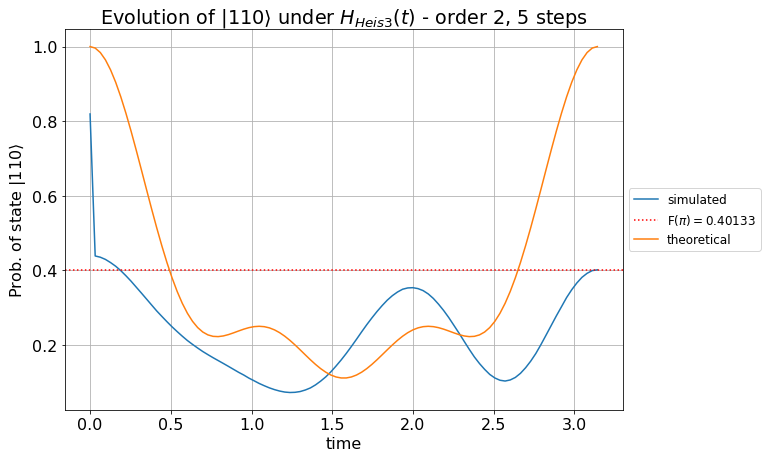




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 5                                   
                                min time: 0.0005                                
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


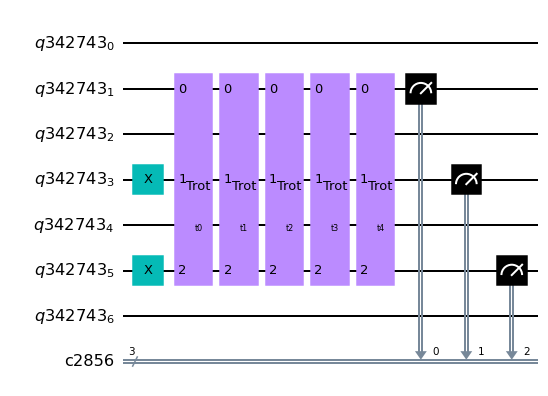

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.17148
Current parameters: [5.000e-04 1.670e+00 8.367e-01 6.342e-01 5.000e-04] (sum to 3.14)

Iter 2 done!
Loss value: -0.1877
Current parameters: [5.000e-04 1.744e+00 8.363e-01 5.600e-01 5.000e-04] (sum to 3.14)

Iter 3 done!
Loss value: -0.39913
Current parameters: [5.000e-04 2.214e+00 9.182e-01 8.227e-03 5.000e-04] (sum to 3.14)

Iter 4 done!
Loss value: -0.38916
Current parameters: [5.000e-04 2.165e+00 8.934e-01 8.240e-02 5.000e-04] (sum to 3.14)

Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39913
            Iterations: 4
            Function evaluations: 35
            Gradient evaluations: 4

Total time of optimization: 00:00:23

Optimizer: SLSQP
eps = 0.01

Iter 1 done!
Loss value: -0.17112
Current parameters: [5.000e-04 1.655e+00 8.601e-01 6.253e-01 5.000e-04] (sum to 3.

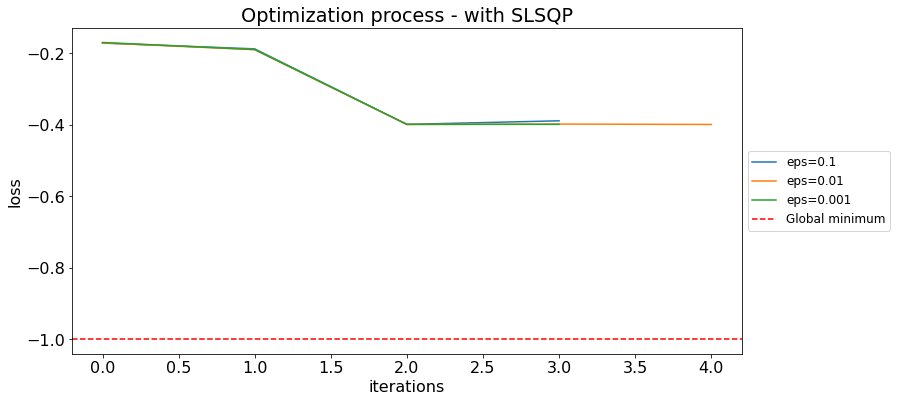


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.0005000000000000004, 2.1723904181446065, 0....",-0.39936
0,slsqp,0.100,"[0.0005000000000002483, 2.214133294983585, 0.9...",-0.39913
2,slsqp,0.001,"[0.0005, 2.2235571514550383, 0.916535502134458...",-0.39912


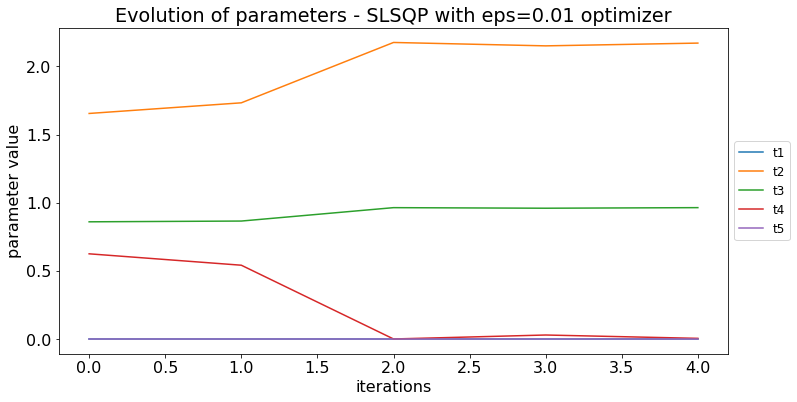

Best parameters (sum to 3.14):	[5.000e-04 2.172e+00 9.634e-01 4.767e-03 5.000e-04]
Best parameters (sum to 1):	[1.592e-04 6.915e-01 3.067e-01 1.518e-03 1.592e-04]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


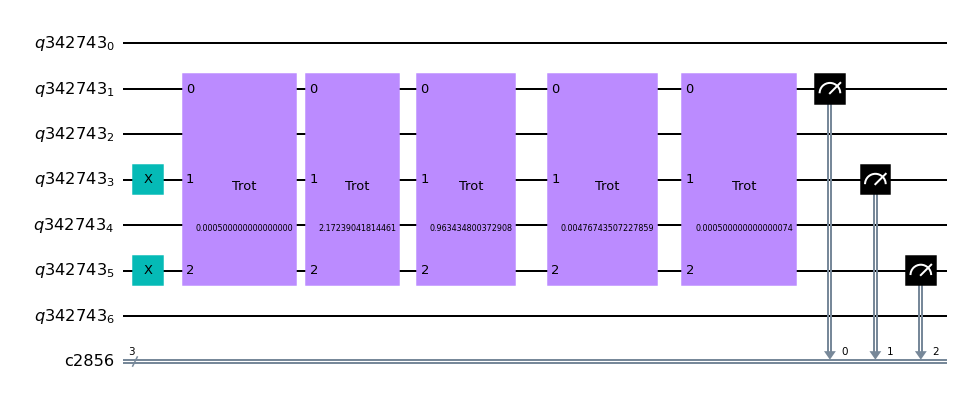

################################################################################
Single trotterization step:


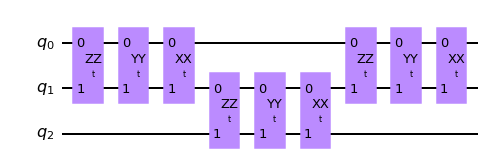

################################################################################

All steps + measurements of state tomography:


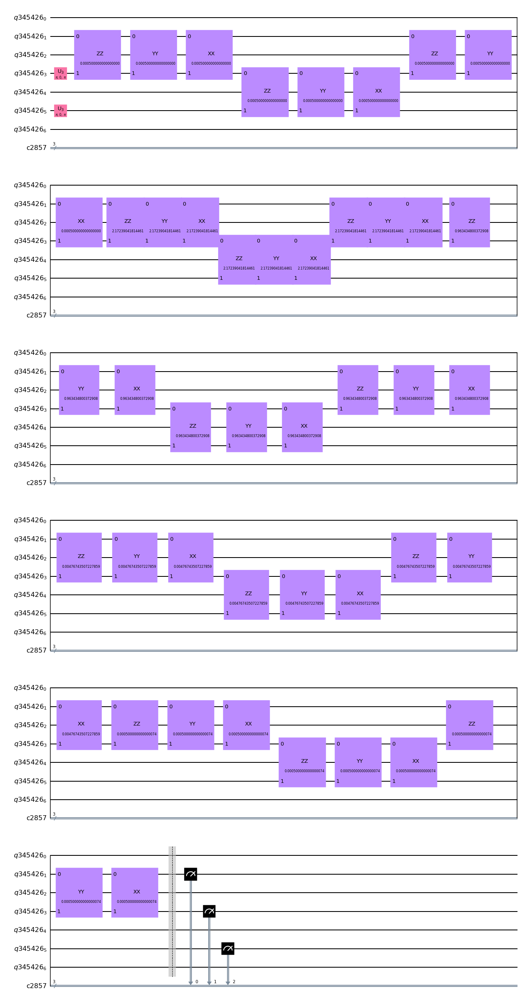

################################################################################

1/8 - Job ID 89f2f546-3216-413e-b446-8306ff9cd740
2/8 - Job ID e68291cb-feab-4bbd-9ba4-e992a8521d3f
3/8 - Job ID fa6c7e70-ed98-421c-8297-4ffd1d9ff0ea
4/8 - Job ID 93bc6628-4f5b-4965-a30e-bbbbac892d61
5/8 - Job ID 6e4e81c4-e118-4964-96df-e0e16ee83bea
6/8 - Job ID 746d1330-c477-45e7-b7b3-5671be7f0285
7/8 - Job ID 86eea6b9-c2d7-492e-aeab-e163bd2f0810
8/8 - Job ID 6bfa6764-7bb9-48f5-9551-f675aec7422e

################################################################################

Final results - order: 2 - strotter steps: 5

State tomography fidelity = 0.3985 ± 0.0018

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:11



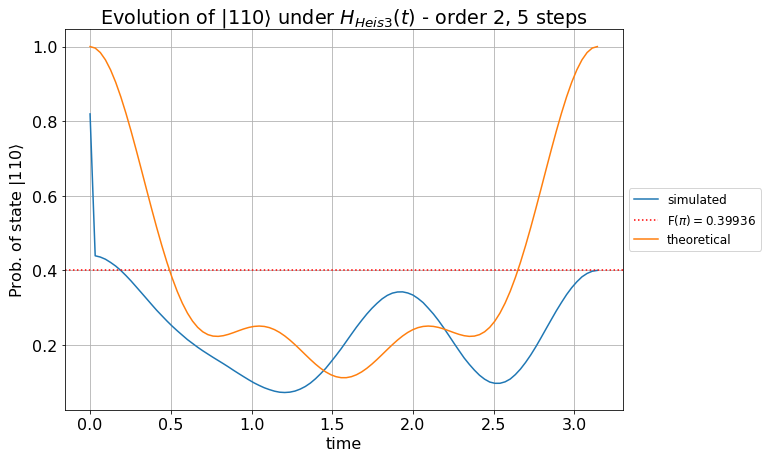




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 6                                   
                                 min time: 0.1                                  
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


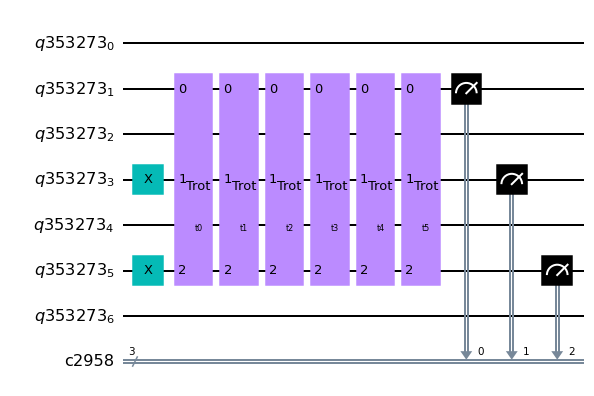

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.13271
Current parameters: [0.1   1.592 0.929 0.32  0.1   0.1  ] (sum to 3.14)

Iter 2 done!
Loss value: -0.17376
Current parameters: [0.1   1.639 1.018 0.184 0.1   0.1  ] (sum to 3.14)

Iter 3 done!
Loss value: -0.21898
Current parameters: [0.1   1.614 1.127 0.1   0.1   0.1  ] (sum to 3.14)

Iter 4 done!
Loss value: -0.22543
Current parameters: [0.1   1.56  1.181 0.1   0.1   0.1  ] (sum to 3.14)

Iter 5 done!
Loss value: -0.23368
Current parameters: [0.1   1.304 1.437 0.1   0.1   0.1  ] (sum to 3.14)

Iter 6 done!
Loss value: -0.23687
Current parameters: [0.1   1.41  1.331 0.1   0.1   0.1  ] (sum to 3.14)

Iter 7 done!
Loss value: -0.23706
Current parameters: [0.1   1.393 1.348 0.1   0.1   0.1  ] (sum to 3.14)

Iter 8 done!
Loss value: -0.23706
Current parameters: [0.1   1.394 1.347 0.1   0.1   0.1  ] (sum to 3.14)

Optimizat

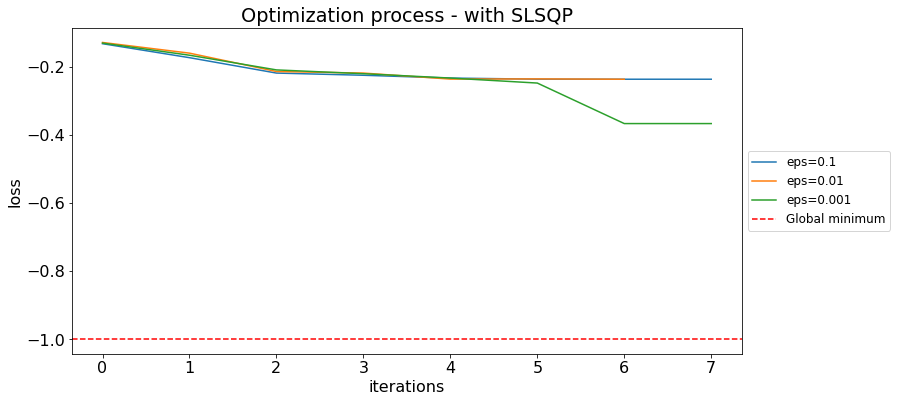


Optimization results:



,optimizer,eps,final_params,final_loss
2,slsqp,0.001,"[0.10000000000000403, 0.09999999999999998, 2.6...",-0.36732
1,slsqp,0.010,"[0.10000000000000407, 1.3912496941388746, 1.35...",-0.23710
0,slsqp,0.100,"[0.10000000000000143, 1.3933630089157585, 1.34...",-0.23706


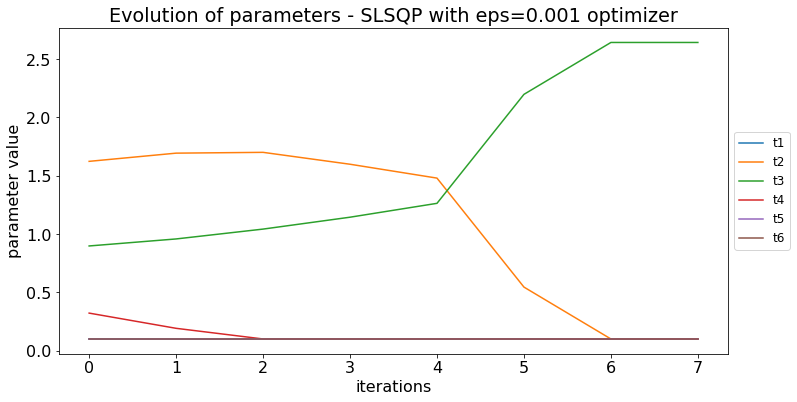

Best parameters (sum to 3.14):	[0.1   0.1   2.642 0.1   0.1   0.1  ]
Best parameters (sum to 1):	[0.032 0.032 0.841 0.032 0.032 0.032]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


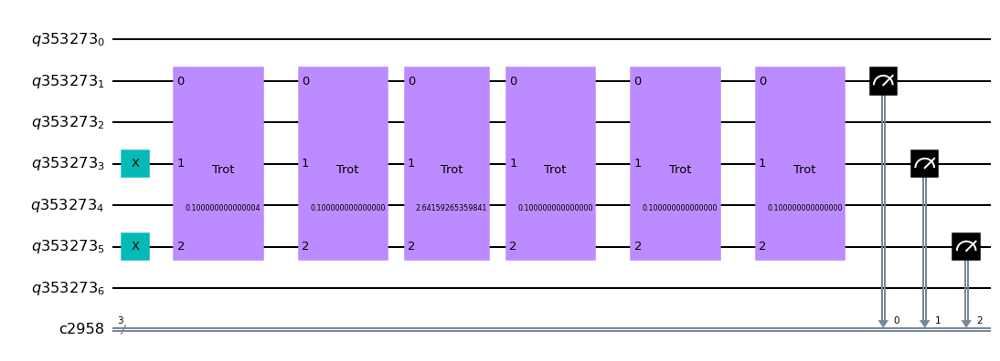

################################################################################
Single trotterization step:


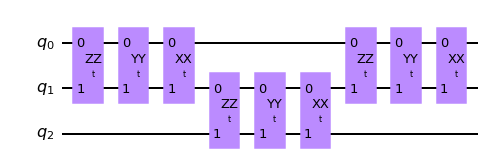

################################################################################

All steps + measurements of state tomography:


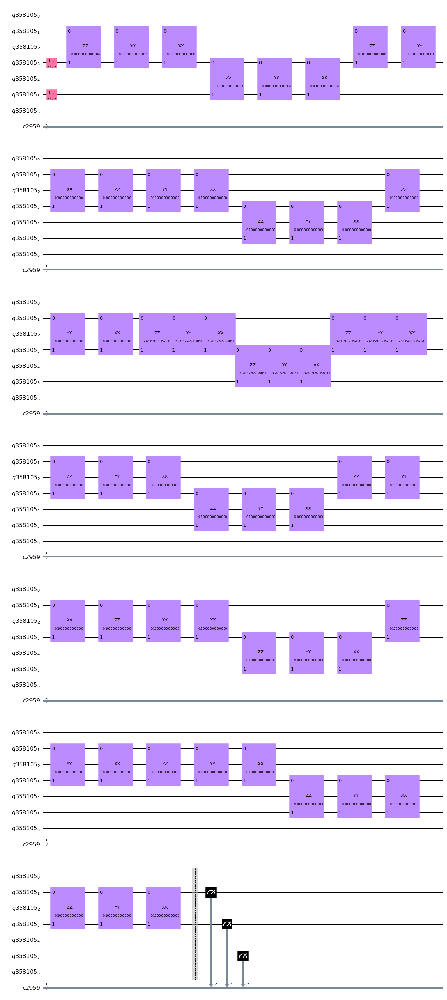

################################################################################

1/8 - Job ID 821c0891-99c2-4447-ae0f-f465149a613c
2/8 - Job ID 94468e20-7f6b-401e-b0ab-168fa63438c8
3/8 - Job ID c29b64ab-1ce1-449a-9bae-2db98c7307fb
4/8 - Job ID 5061e7e9-5d65-417c-8858-3cece8277983
5/8 - Job ID 5509c7b7-84a9-4a2f-91f5-7c081eed62ad
6/8 - Job ID aa5846eb-6a8e-4169-b18a-78dabe17683b
7/8 - Job ID 18a2988c-9bc0-4ebe-bc19-896c24e4a692
8/8 - Job ID f469577b-30b3-4484-a86d-c5a38bf82c5d

################################################################################

Final results - order: 2 - strotter steps: 6

State tomography fidelity = 0.3662 ± 0.0033

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:14



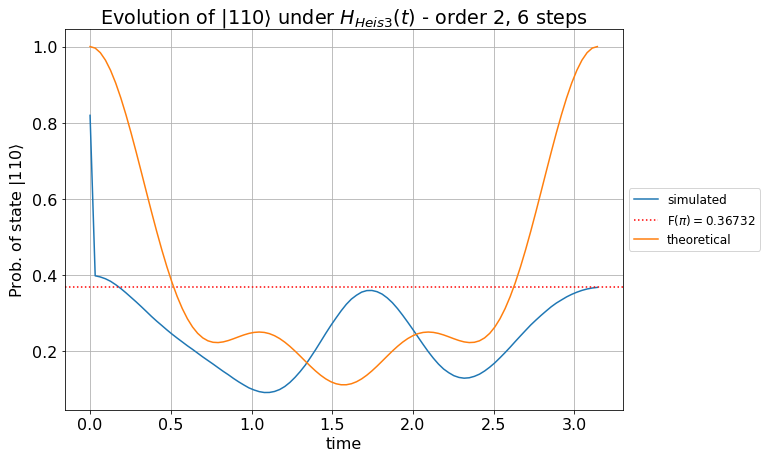




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 6                                   
                                 min time: 0.01                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


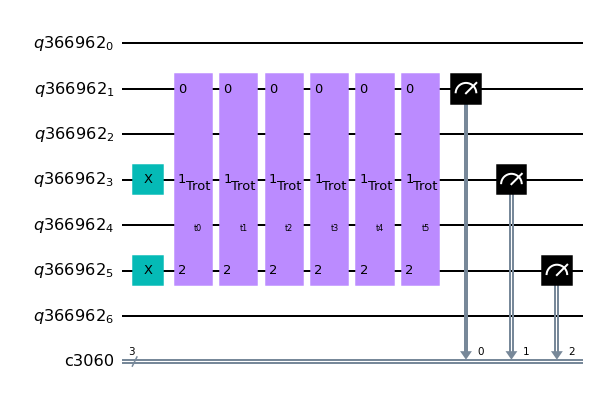

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.18009
Current parameters: [0.01  1.629 1.008 0.474 0.01  0.01 ] (sum to 3.14)

Iter 2 done!
Loss value: -0.25124
Current parameters: [0.01  1.698 1.107 0.306 0.01  0.01 ] (sum to 3.14)

Iter 3 done!
Loss value: -0.37528
Current parameters: [0.01  1.759 1.343 0.01  0.01  0.01 ] (sum to 3.14)

Iter 4 done!
Loss value: -0.38073
Current parameters: [0.01  1.704 1.395 0.01  0.013 0.01 ] (sum to 3.14)

Iter 5 done!
Loss value: -0.38428
Current parameters: [0.013 1.444 1.65  0.01  0.015 0.01 ] (sum to 3.14)

Iter 6 done!
Loss value: -0.38863
Current parameters: [0.019 1.562 1.531 0.01  0.01  0.01 ] (sum to 3.14)

Iter 7 done!
Loss value: -0.38819
Current parameters: [0.023 1.539 1.55  0.01  0.01  0.01 ] (sum to 3.14)

Iter 8 done!
Loss value: -0.38818
Current parameters: [0.023 1.542 1.546 0.01  0.01  0.01 ] (sum to 3.14)

Optimizat

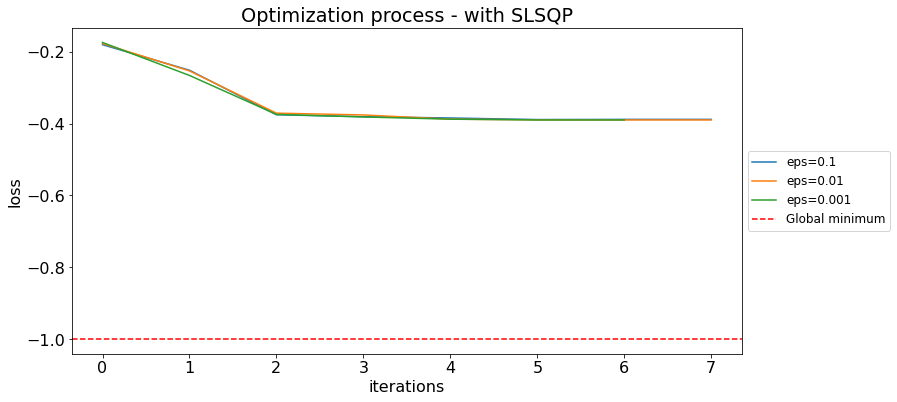


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.01, 1.5594982115656308, 1.5420944420241627,...",-0.38974
2,slsqp,0.001,"[0.01000000000000001, 1.5605436298588453, 1.54...",-0.38974
0,slsqp,0.100,"[0.019668468620802584, 1.556596358566763, 1.53...",-0.38864


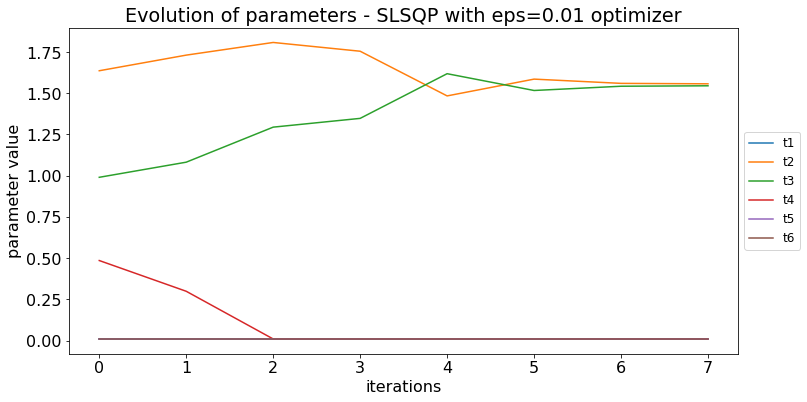

Best parameters (sum to 3.14):	[0.01  1.559 1.542 0.01  0.01  0.01 ]
Best parameters (sum to 1):	[0.003 0.496 0.491 0.003 0.003 0.003]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


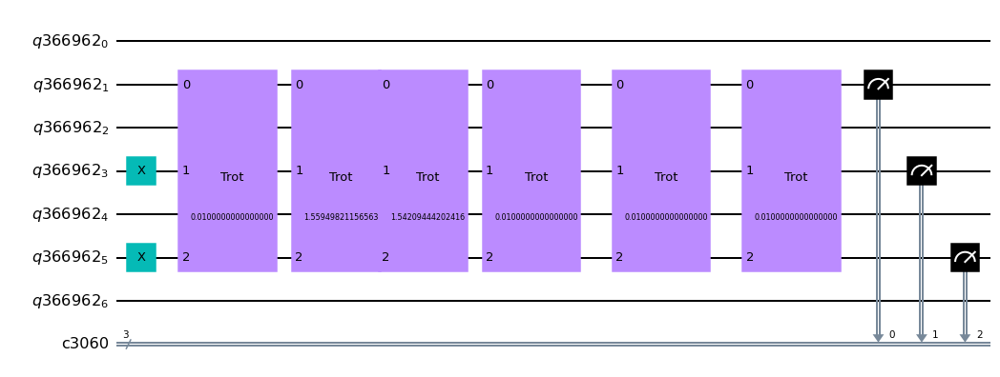

################################################################################
Single trotterization step:


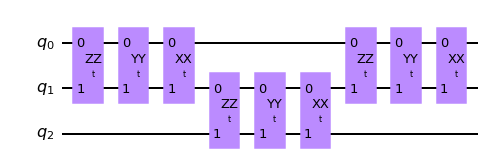

################################################################################

All steps + measurements of state tomography:


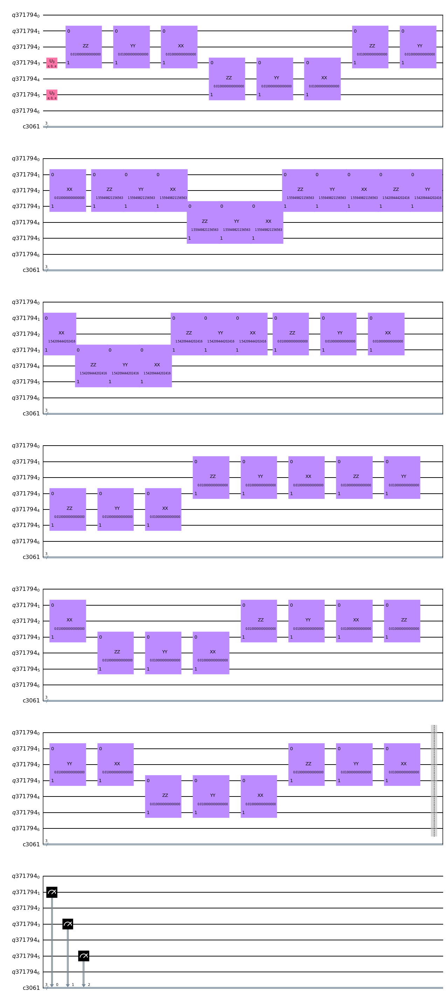

################################################################################

1/8 - Job ID dc9ff0d7-e92c-415f-91ae-cb377cbac288
2/8 - Job ID 03bf4432-7a61-4383-9ecc-b4483dc2d697
3/8 - Job ID 4d948bb5-c92a-421f-81f4-794ff9fb4782
4/8 - Job ID 7475c54a-83f5-458e-a1ce-eff8a920f94a
5/8 - Job ID aee6ee87-9338-40d1-a1ca-6483a76f6bae
6/8 - Job ID 383da58f-6d67-43ee-8fd1-06a430bacaf9
7/8 - Job ID 64c154d4-08da-4132-ac8d-8695c5e5930a
8/8 - Job ID 178e850c-3384-4a5c-84f7-1d6a4d149c52

################################################################################

Final results - order: 2 - strotter steps: 6

State tomography fidelity = 0.3895 ± 0.0016

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:12



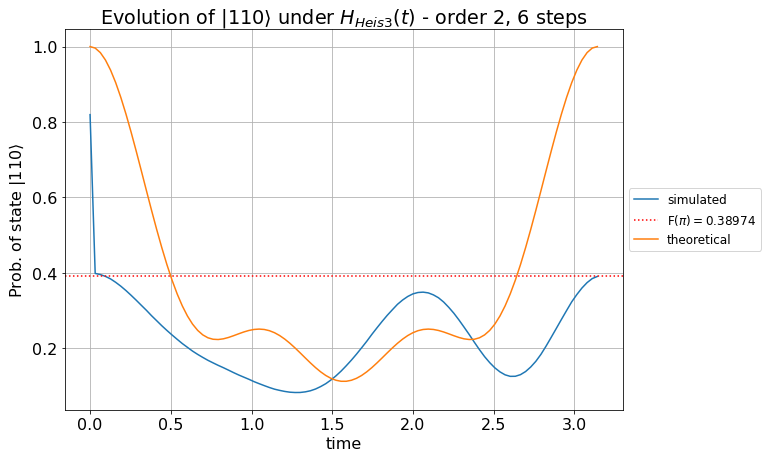




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 6                                   
                                min time: 0.001                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


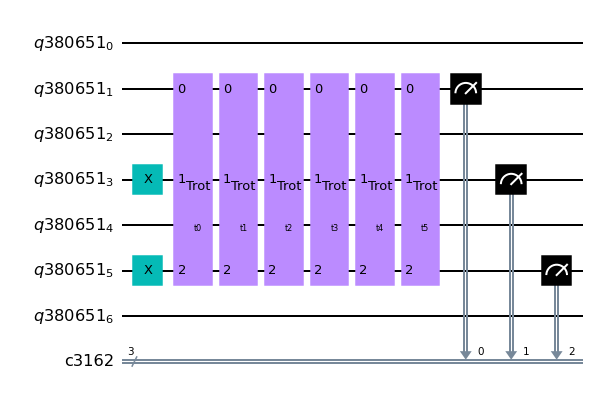

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.18698
Current parameters: [1.000e-03 1.635e+00 1.014e+00 4.895e-01 1.000e-03 1.000e-03] (sum to 3.14)

Iter 2 done!
Loss value: -0.25958
Current parameters: [1.000e-03 1.704e+00 1.115e+00 3.199e-01 1.000e-03 1.000e-03] (sum to 3.14)

Iter 3 done!
Loss value: -0.37755
Current parameters: [1.000e-03 1.774e+00 1.364e+00 1.000e-03 1.000e-03 1.000e-03] (sum to 3.14)

Iter 4 done!
Loss value: -0.3757
Current parameters: [1.000e-03 1.708e+00 1.365e+00 6.515e-02 1.000e-03 1.000e-03] (sum to 3.14)

Iter 5 done!
Loss value: -0.38357
Current parameters: [1.000e-03 1.606e+00 1.466e+00 3.988e-02 1.404e-02 1.549e-02] (sum to 3.14)

Iter 6 done!
Loss value: -0.38438
Current parameters: [0.025 1.501 1.569 0.021 0.016 0.011] (sum to 3.14)

Iter 7 done!
Loss value: -0.38783
Current parameters: [2.958e-02 1.542e+00 1.544e+00 1.728e-02 8.296e-03

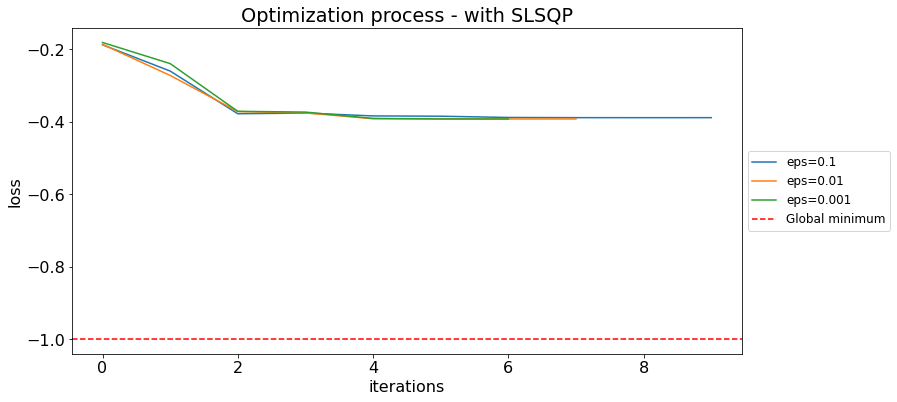


Optimization results:



,optimizer,eps,final_params,final_loss
2,slsqp,0.001,"[0.001, 1.5671656058326005, 1.5704270477571927...",-0.39202
1,slsqp,0.010,"[0.0012227012879356125, 1.5668441884344408, 1....",-0.39201
0,slsqp,0.100,"[0.029846000084994842, 1.5416528680990318, 1.5...",-0.38840


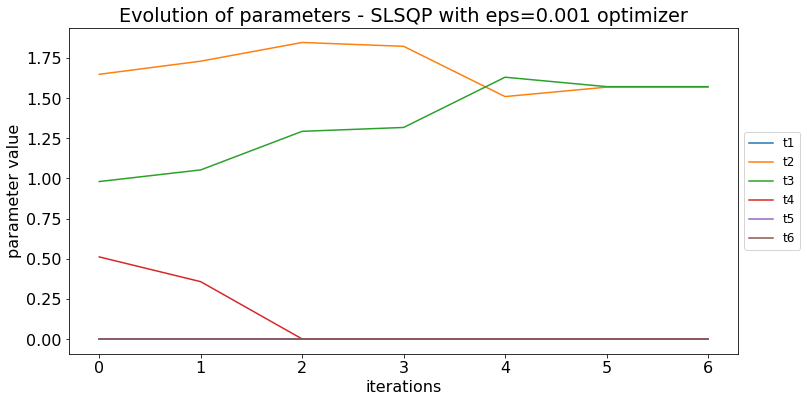

Best parameters (sum to 3.14):	[1.000e-03 1.567e+00 1.570e+00 1.000e-03 1.000e-03 1.000e-03]
Best parameters (sum to 1):	[3.183e-04 4.988e-01 4.999e-01 3.183e-04 3.183e-04 3.183e-04]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


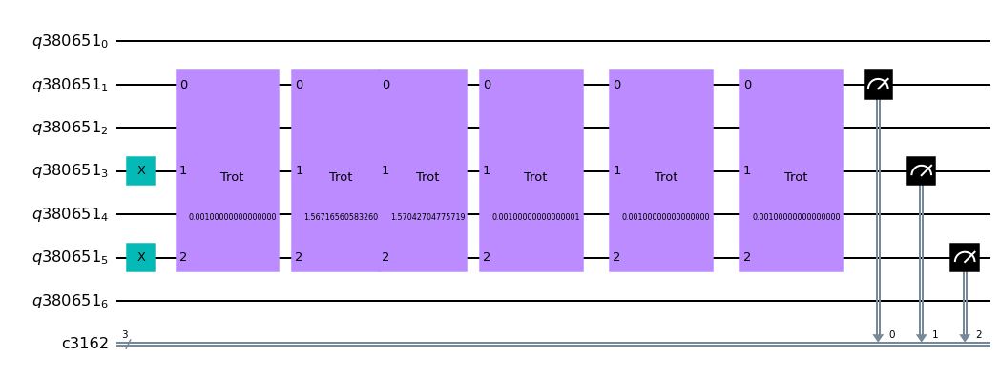

################################################################################
Single trotterization step:


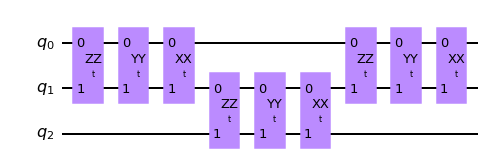

################################################################################

All steps + measurements of state tomography:


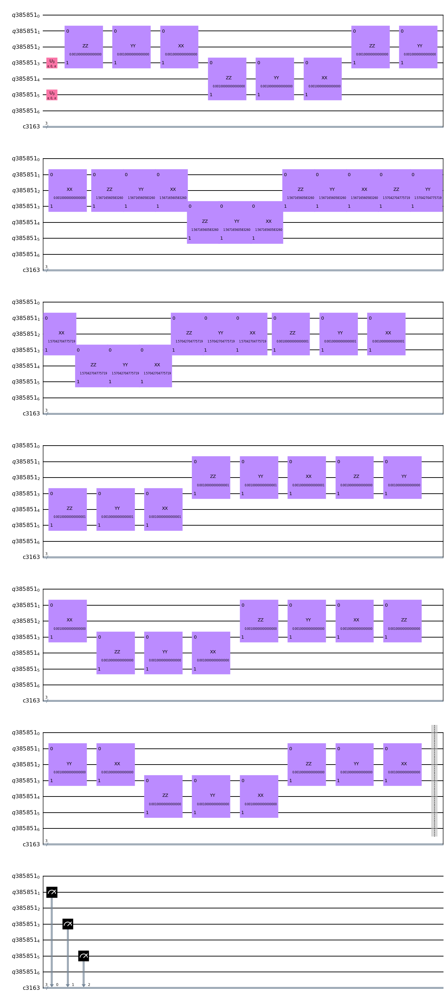

################################################################################

1/8 - Job ID d6d939c9-d3fa-44af-be74-290c093972d6
2/8 - Job ID f60d4da4-45ca-4f5e-abe4-ac993652b0ca
3/8 - Job ID f4534c50-a106-47ff-b9bf-e55af0dc5527
4/8 - Job ID 2f8d4ba8-7ec6-4995-983a-aeb7c93f0b37
5/8 - Job ID 9c699742-4840-4e44-b50a-624d21bdea29
6/8 - Job ID 612ad531-4dda-4c45-a1b0-9364886fd6f0
7/8 - Job ID 32a62d59-57fb-47c1-9ead-aa7dccbcc75f
8/8 - Job ID add1cdc7-0c68-4f33-9652-242cc4294dae

################################################################################

Final results - order: 2 - strotter steps: 6

State tomography fidelity = 0.3923 ± 0.0032

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:12



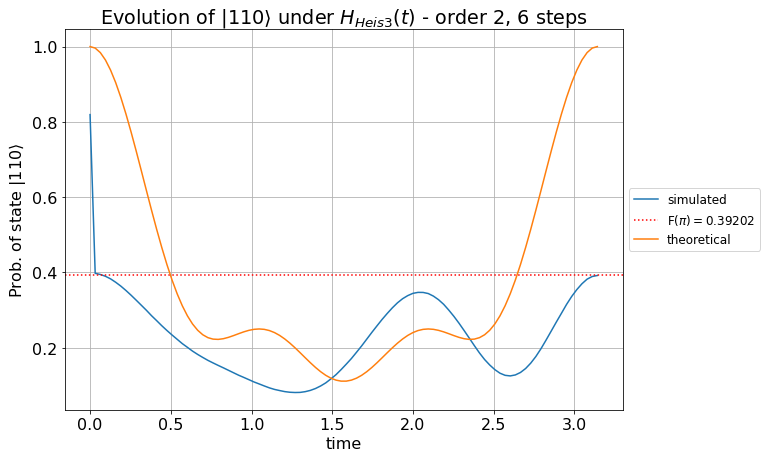




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 6                                   
                                min time: 0.0005                                
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


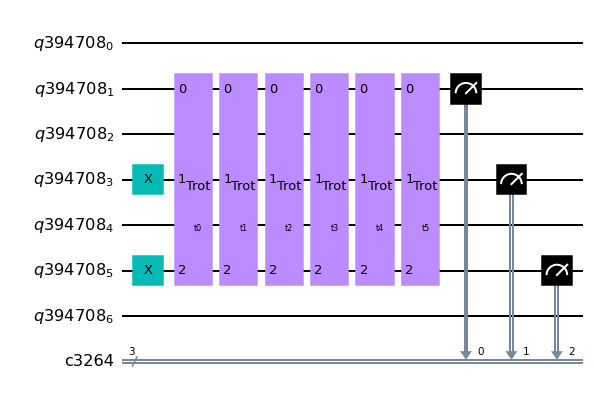

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.18709
Current parameters: [5.000e-04 1.635e+00 1.014e+00 4.912e-01 5.000e-04 5.000e-04] (sum to 3.14)

Iter 2 done!
Loss value: -0.25919
Current parameters: [5.000e-04 1.703e+00 1.114e+00 3.224e-01 5.000e-04 5.000e-04] (sum to 3.14)

Iter 3 done!
Loss value: -0.37758
Current parameters: [5.000e-04 1.775e+00 1.365e+00 5.000e-04 5.000e-04 5.000e-04] (sum to 3.14)

Iter 4 done!
Loss value: -0.37519
Current parameters: [5.000e-04 1.709e+00 1.363e+00 6.829e-02 5.000e-04 5.000e-04] (sum to 3.14)

Iter 5 done!
Loss value: -0.38324
Current parameters: [5.000e-04 1.612e+00 1.459e+00 4.115e-02 1.381e-02 1.463e-02] (sum to 3.14)

Iter 6 done!
Loss value: -0.38329
Current parameters: [0.025 1.493 1.573 0.022 0.018 0.011] (sum to 3.14)

Iter 7 done!
Loss value: -0.38766
Current parameters: [2.847e-02 1.541e+00 1.542e+00 1.749e-02 1.055e-0

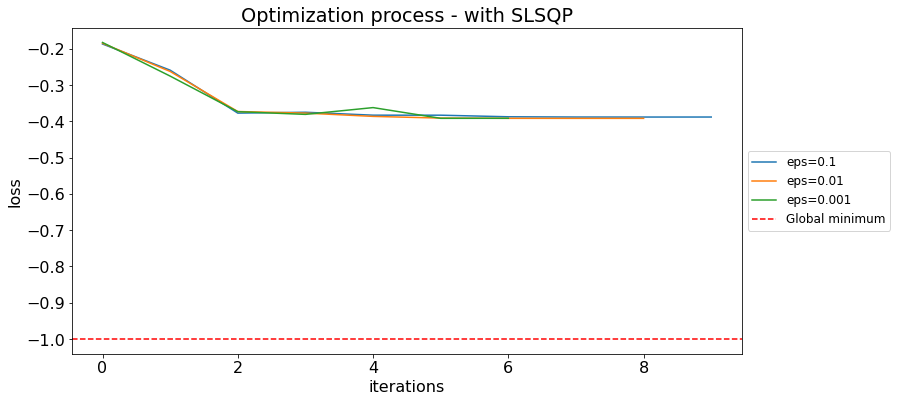


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.00233903682293575, 1.563753339179068, 1.572...",-0.39201
2,slsqp,0.001,"[0.0005001827924005107, 1.552293507752433, 1.5...",-0.39194
0,slsqp,0.100,"[0.029846252158606385, 1.5416550702099863, 1.5...",-0.38840


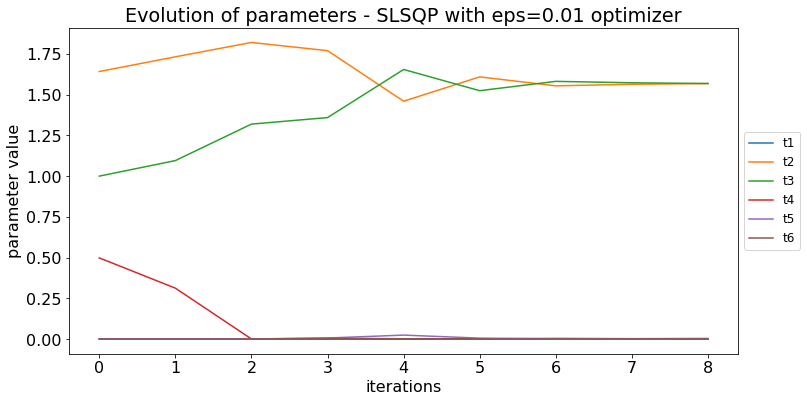

Best parameters (sum to 3.14):	[2.339e-03 1.564e+00 1.573e+00 1.019e-03 1.084e-03 5.000e-04]
Best parameters (sum to 1):	[7.445e-04 4.978e-01 5.007e-01 3.243e-04 3.451e-04 1.592e-04]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


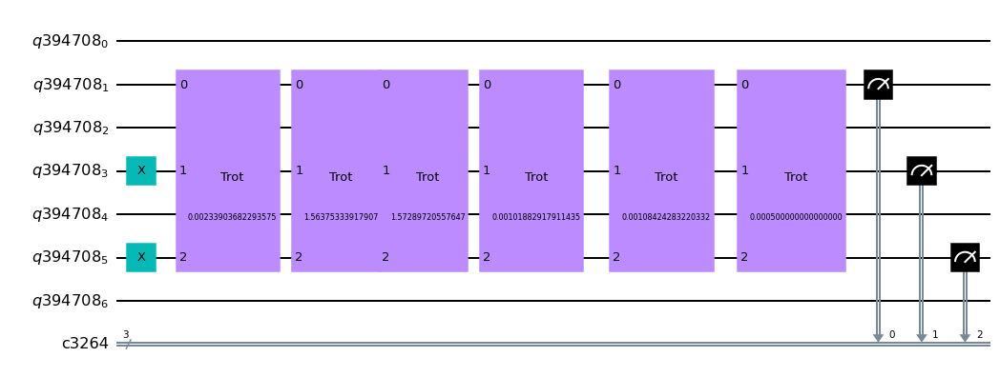

################################################################################
Single trotterization step:


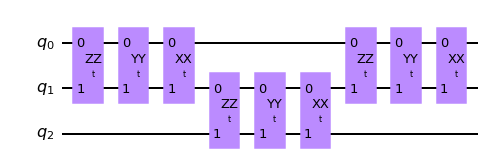

################################################################################

All steps + measurements of state tomography:


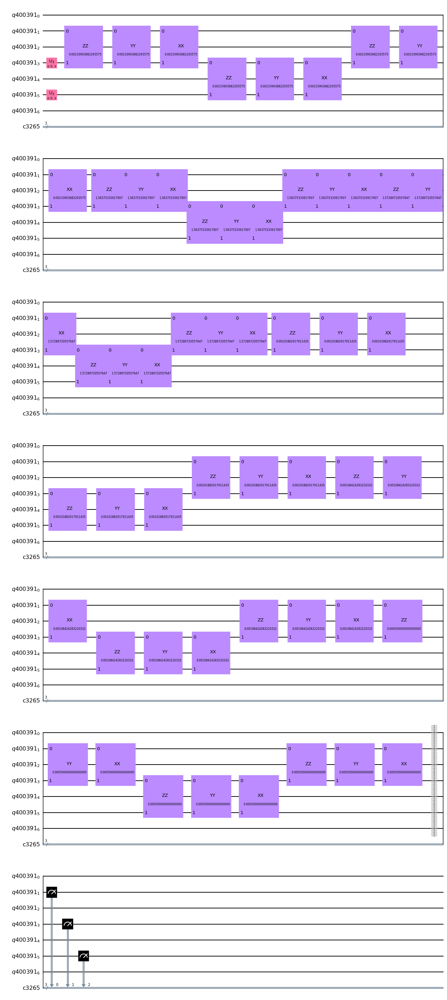

################################################################################

1/8 - Job ID f0279d70-ab92-4066-8bfa-193626b2e762
2/8 - Job ID 0fa15a7f-9bda-43aa-8427-0d3f2685d0a8
3/8 - Job ID a7383800-1494-4ce9-88a2-f0beca45c6af
4/8 - Job ID a7ec14ef-4231-4c37-a4af-61effc199e86
5/8 - Job ID 3bd4453e-0921-4aa0-88fa-2f9f5efa6ee4
6/8 - Job ID eb0ee536-f42c-40b4-9760-9d10c7a64641
7/8 - Job ID 44758829-cb73-4c64-a137-ec4f695cc618
8/8 - Job ID 64ef2351-05c4-4f0e-9969-d71addb7bd46

################################################################################

Final results - order: 2 - strotter steps: 6

State tomography fidelity = 0.3908 ± 0.0020

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:12



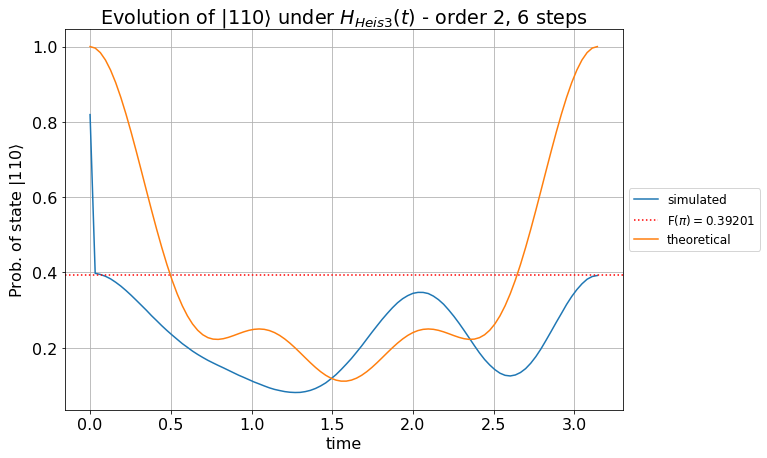




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 7                                   
                                 min time: 0.1                                  
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


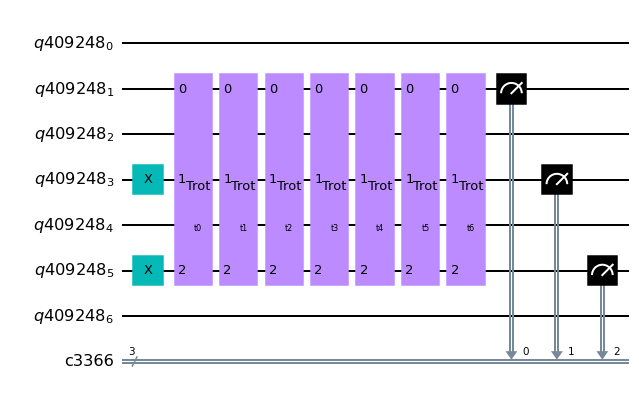

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.10851
Current parameters: [0.1   1.555 0.824 0.362 0.1   0.1   0.1  ] (sum to 3.14)

Iter 2 done!
Loss value: -0.11053
Current parameters: [0.1   1.592 0.833 0.316 0.1   0.1   0.1  ] (sum to 3.14)

Iter 3 done!
Loss value: -0.14987
Current parameters: [0.1   1.73  0.912 0.1   0.1   0.1   0.1  ] (sum to 3.14)

Iter 4 done!
Loss value: -0.15067
Current parameters: [0.1   1.709 0.932 0.1   0.1   0.1   0.1  ] (sum to 3.14)

Iter 5 done!
Loss value: -0.15924
Current parameters: [0.1   1.591 1.051 0.1   0.1   0.1   0.1  ] (sum to 3.14)

Iter 6 done!
Loss value: -0.18737
Current parameters: [0.148 0.449 2.145 0.1   0.1   0.1   0.1  ] (sum to 3.14)

Iter 7 done!
Loss value: -0.3152
Current parameters: [0.1   0.1   2.542 0.1   0.1   0.1   0.1  ] (sum to 3.14)

Iter 8 done!
Loss value: -0.3152
Current parameters: [0.1   0.1   2.542 0.1

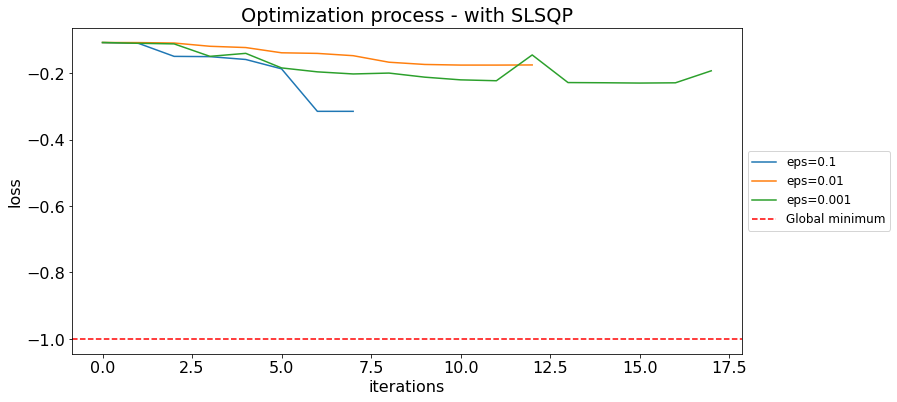


Optimization results:



,optimizer,eps,final_params,final_loss
0,slsqp,0.100,"[0.1, 0.1000000000055209, 2.5415926535835704, ...",-0.31520
2,slsqp,0.001,"[0.47561216935849693, 0.5706544572629627, 0.46...",-0.23051
1,slsqp,0.010,"[0.10000000060605832, 1.3325845912556695, 1.30...",-0.17625


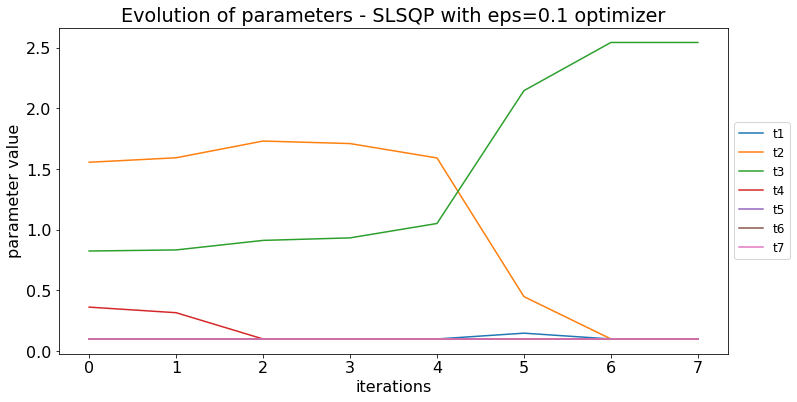

Best parameters (sum to 3.14):	[0.1   0.1   2.542 0.1   0.1   0.1   0.1  ]
Best parameters (sum to 1):	[0.032 0.032 0.809 0.032 0.032 0.032 0.032]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


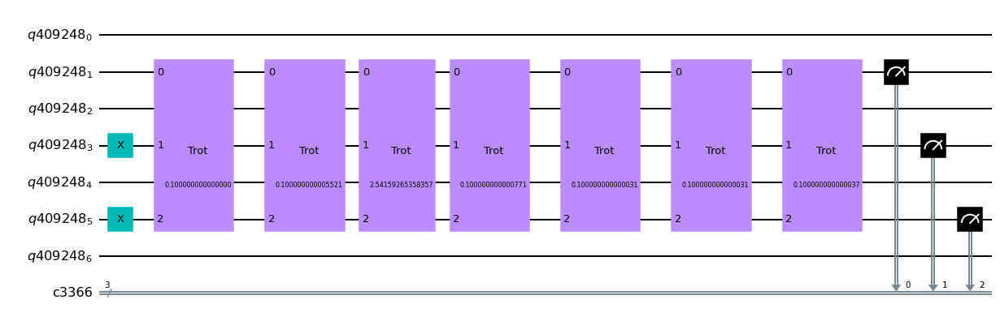

################################################################################
Single trotterization step:


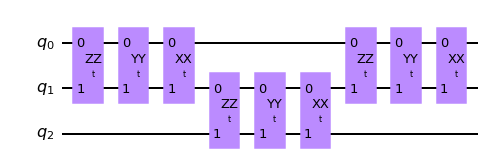

################################################################################

All steps + measurements of state tomography:


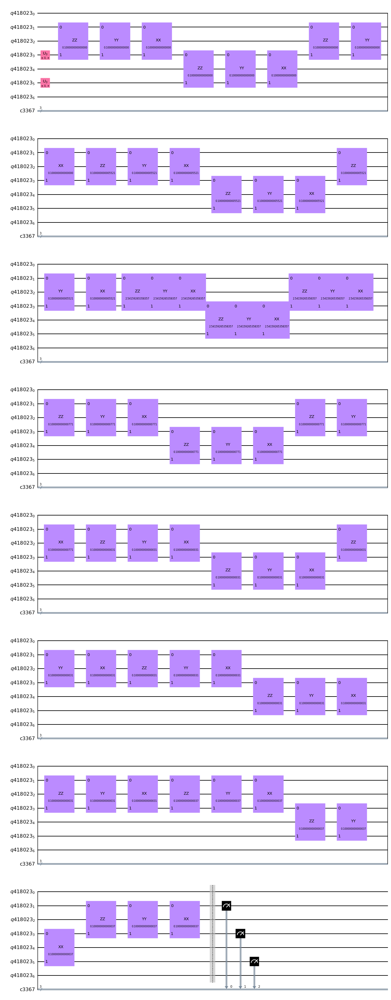

################################################################################

1/8 - Job ID 7cc5efa5-716d-4a14-bfb9-8c754ceeff58
2/8 - Job ID e545c270-5838-4a5a-b6b9-af617a7a6908
3/8 - Job ID 20d1ed1a-ccf3-4315-8c0c-c4b7fd48d706
4/8 - Job ID 3055ea87-f623-4820-bbef-af09d4a6c1bf
5/8 - Job ID 46712d92-e2d4-4234-a683-41a1a4908839
6/8 - Job ID 016a0f52-ef4a-418f-8ddf-7d3de18bb130
7/8 - Job ID fb598f16-e847-4d34-af4d-531d66d08b5e
8/8 - Job ID 97f808c9-842c-458c-a97c-e3dd53bd2333

################################################################################

Final results - order: 2 - strotter steps: 7

State tomography fidelity = 0.3136 ± 0.0016

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:20



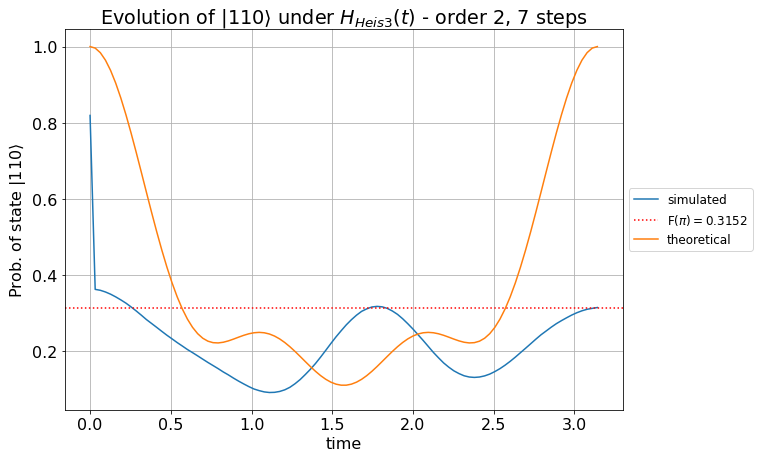




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 7                                   
                                 min time: 0.01                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


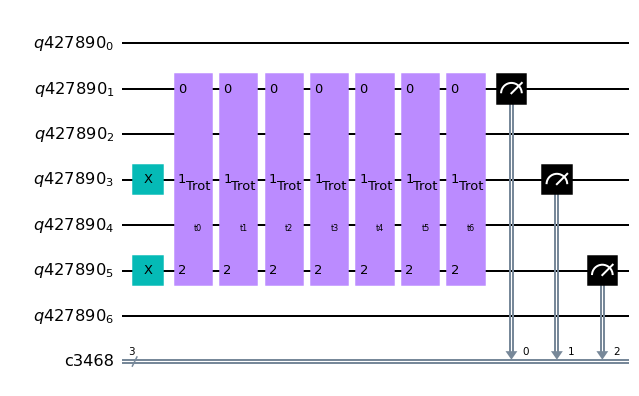

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.15828
Current parameters: [0.01  1.585 1.007 0.51  0.01  0.01  0.01 ] (sum to 3.14)

Iter 2 done!
Loss value: -0.19787
Current parameters: [0.01  1.644 1.077 0.38  0.01  0.01  0.01 ] (sum to 3.14)

Iter 3 done!
Loss value: -0.34126
Current parameters: [0.01  1.762 1.329 0.01  0.01  0.01  0.01 ] (sum to 3.14)

Iter 4 done!
Loss value: -0.34522
Current parameters: [0.01  1.722 1.37  0.01  0.01  0.01  0.01 ] (sum to 3.14)

Iter 5 done!
Loss value: -0.35078
Current parameters: [0.017 1.496 1.576 0.022 0.01  0.01  0.01 ] (sum to 3.14)

Iter 6 done!
Loss value: -0.35458
Current parameters: [0.01  1.557 1.534 0.01  0.01  0.01  0.01 ] (sum to 3.14)

Iter 7 done!
Loss value: -0.35417
Current parameters: [0.013 1.546 1.543 0.01  0.01  0.01  0.01 ] (sum to 3.14)

Optimization terminated successfully    (Exit mode 0)
            Current 

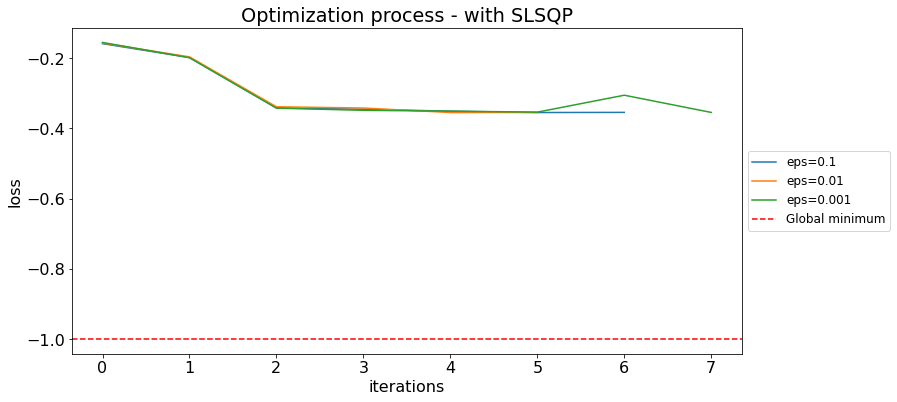


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.01, 1.551377620187225, 1.540215033402569, 0...",-0.35459
0,slsqp,0.100,"[0.010000025276442056, 1.5574867132613237, 1.5...",-0.35458
2,slsqp,0.001,"[0.010000000000000002, 1.5797365369420082, 1.5...",-0.35361


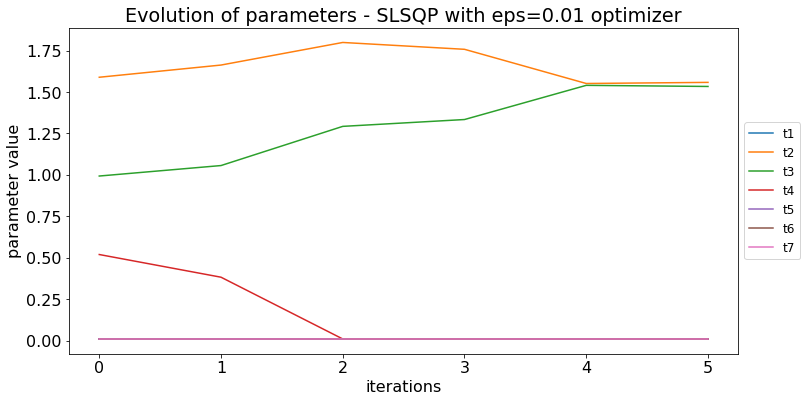

Best parameters (sum to 3.14):	[0.01  1.551 1.54  0.01  0.01  0.01  0.01 ]
Best parameters (sum to 1):	[0.003 0.494 0.49  0.003 0.003 0.003 0.003]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


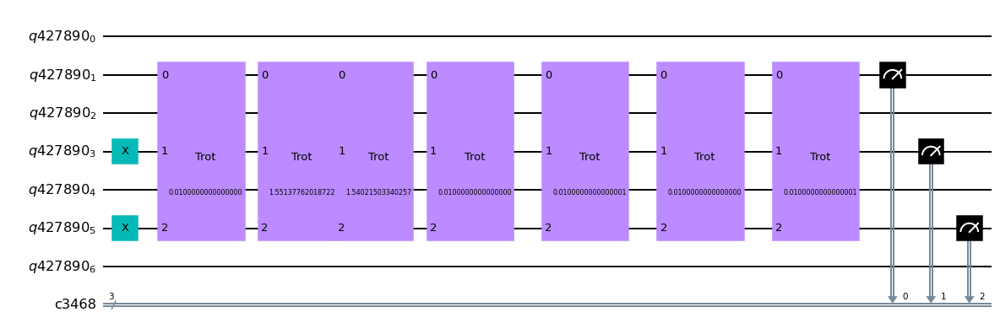

################################################################################
Single trotterization step:


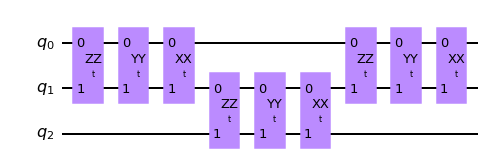

################################################################################

All steps + measurements of state tomography:


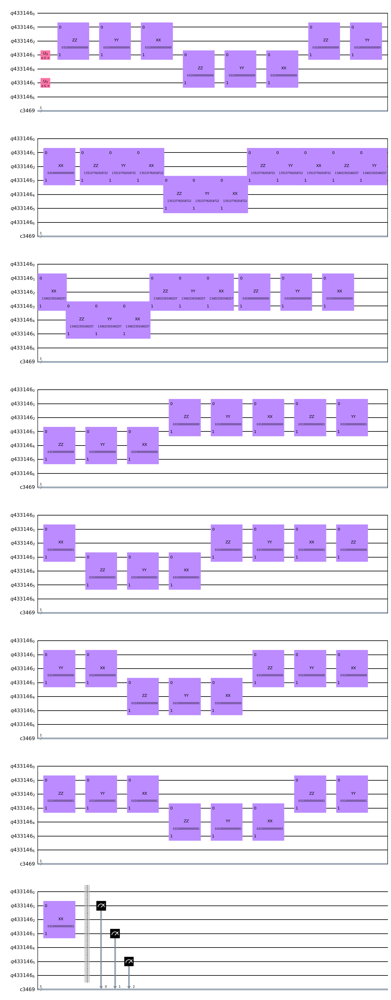

################################################################################

1/8 - Job ID e39bd9f4-ccc5-406e-bb1a-b032430b1a20
2/8 - Job ID 566fe362-bfa1-4280-804c-63f8e8a0e384
3/8 - Job ID 27284c98-1310-4d4b-aec0-90d47a6d1145
4/8 - Job ID f3cea173-2538-4088-a887-92edd21cc8ab
5/8 - Job ID fd68cdeb-fcf7-4ae1-91ae-3ef423fd79a5
6/8 - Job ID 8b4bb4a9-ac9e-4876-baa8-3f6171121569
7/8 - Job ID d1685181-6053-4f6e-822f-a55aa2e6bac5
8/8 - Job ID 7f1cc289-f475-4d24-ae58-e4d84c069608

################################################################################

Final results - order: 2 - strotter steps: 7

State tomography fidelity = 0.3545 ± 0.0024

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:20



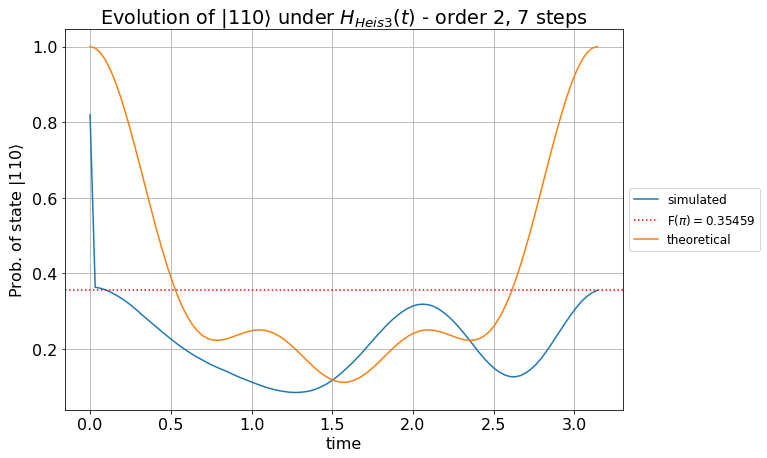




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 7                                   
                                min time: 0.001                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


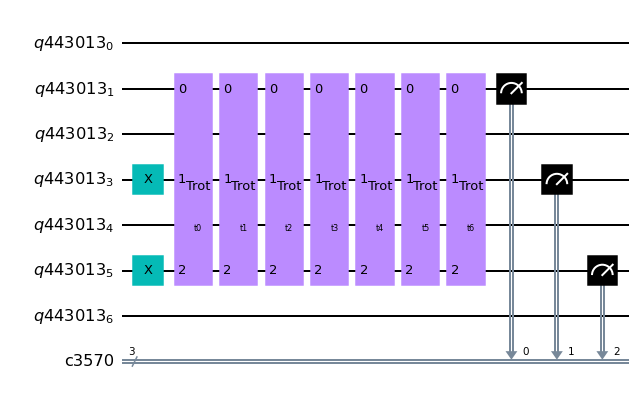

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.16703
Current parameters: [1.000e-03 1.591e+00 1.021e+00 5.253e-01 1.000e-03 1.000e-03 1.000e-03] (sum to 3.14)

Iter 2 done!
Loss value: -0.20941
Current parameters: [1.000e-03 1.649e+00 1.094e+00 3.943e-01 1.000e-03 1.000e-03 1.000e-03] (sum to 3.14)

Iter 3 done!
Loss value: -0.3459
Current parameters: [1.000e-03 1.767e+00 1.370e+00 1.000e-03 1.000e-03 1.000e-03 1.000e-03] (sum to 3.14)

Iter 4 done!
Loss value: -0.33901
Current parameters: [1.000e-03 1.702e+00 1.349e+00 8.674e-02 1.000e-03 1.000e-03 1.000e-03] (sum to 3.14)

Iter 5 done!
Loss value: -0.34821
Current parameters: [1.000e-03 1.650e+00 1.425e+00 2.861e-02 1.269e-02 9.040e-03 1.513e-02] (sum to 3.14)

Iter 6 done!
Loss value: -0.34995
Current parameters: [0.014 1.554 1.51  0.024 0.022 0.007 0.011] (sum to 3.14)

Iter 7 done!
Loss value: -0.35324
Current parame

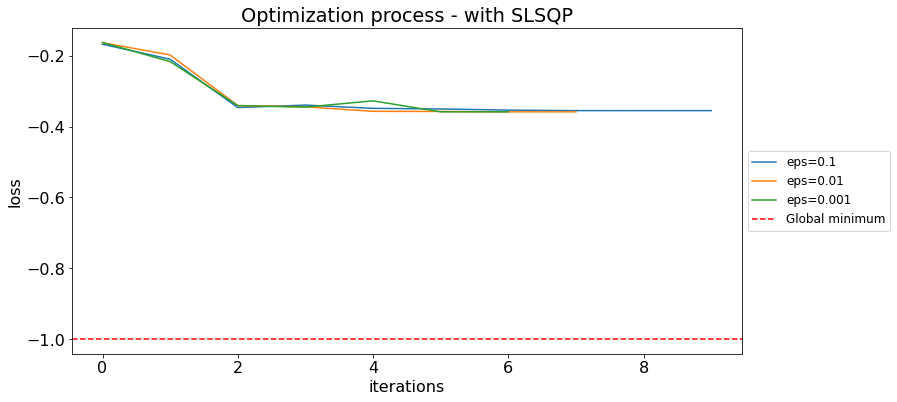


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.0010000000000000005, 1.5679170829076838, 1....",-0.35811
2,slsqp,0.001,"[0.0010000000000000035, 1.5601875645733556, 1....",-0.35811
0,slsqp,0.100,"[0.03401364693451881, 1.541213742888094, 1.549...",-0.35472


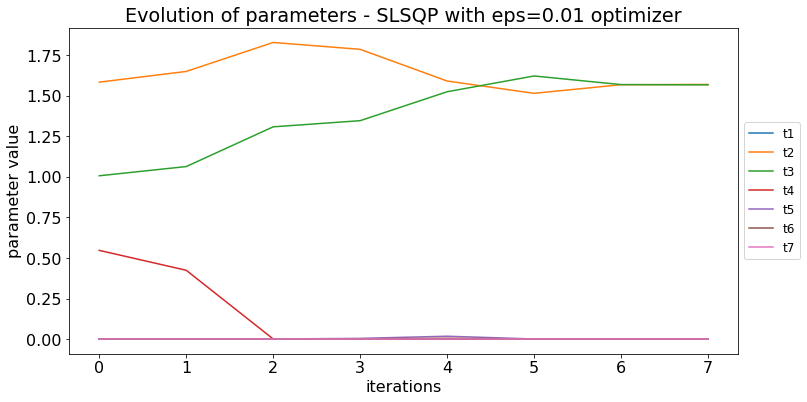

Best parameters (sum to 3.14):	[1.000e-03 1.568e+00 1.569e+00 1.000e-03 1.000e-03 1.000e-03 1.000e-03]
Best parameters (sum to 1):	[3.183e-04 4.991e-01 4.993e-01 3.183e-04 3.183e-04 3.183e-04 3.183e-04]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


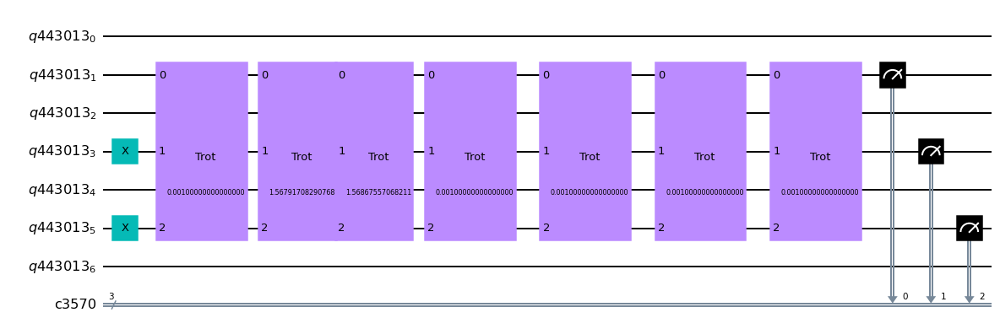

################################################################################
Single trotterization step:


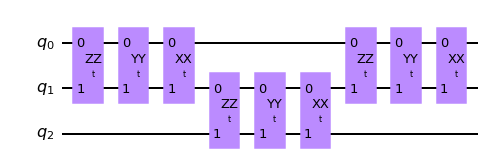

################################################################################

All steps + measurements of state tomography:


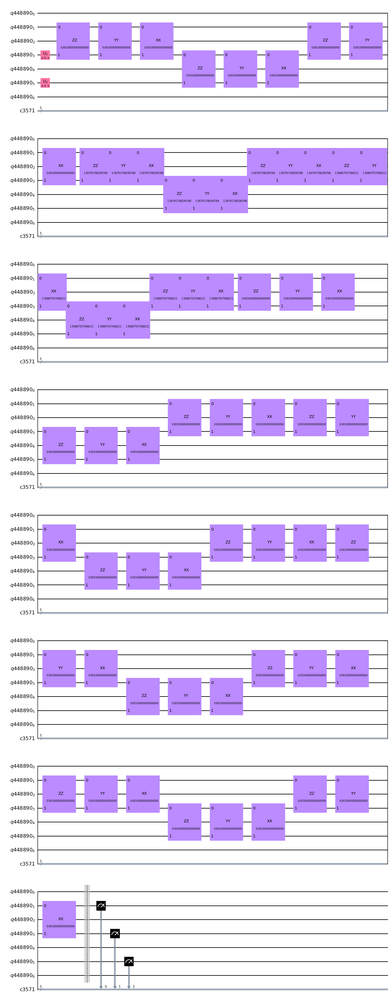

################################################################################

1/8 - Job ID 9292e3dc-bbd0-45f0-ba0d-d24554306bfa
2/8 - Job ID 89251101-7ee1-4a25-98cd-0f3f3622005f
3/8 - Job ID 653b4c34-ddb4-4790-9fcb-21adbb0e77bc
4/8 - Job ID f40f1ccb-60cf-4fcc-8516-47ebc0a477da
5/8 - Job ID a939ecc7-49a7-4fa4-949e-81d30a1a009c
6/8 - Job ID 5995da23-ee85-4c61-97d4-a9448c15c7e9
7/8 - Job ID 55ae0fd9-6349-4e3e-b22d-7ac2259baaae
8/8 - Job ID efde3459-7f66-4954-955d-14a271e30b85

################################################################################

Final results - order: 2 - strotter steps: 7

State tomography fidelity = 0.3572 ± 0.0020

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:19



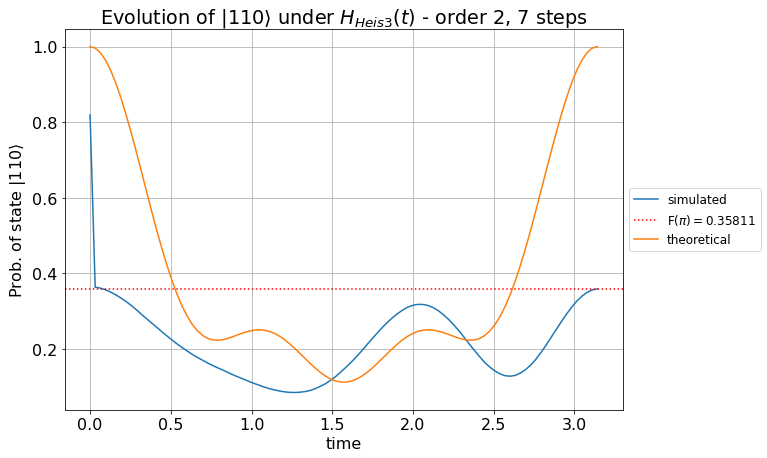




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 7                                   
                                min time: 0.0005                                
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


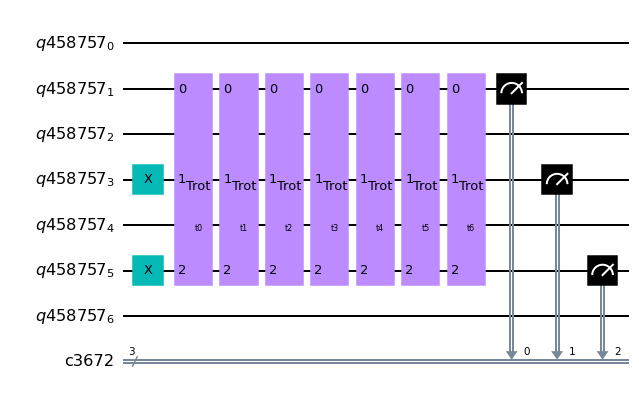

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.16759
Current parameters: [5.000e-04 1.592e+00 1.021e+00 5.263e-01 5.000e-04 5.000e-04 5.000e-04] (sum to 3.14)

Iter 2 done!
Loss value: -0.20979
Current parameters: [5.000e-04 1.650e+00 1.094e+00 3.954e-01 5.000e-04 5.000e-04 5.000e-04] (sum to 3.14)

Iter 3 done!
Loss value: -0.34602
Current parameters: [5.000e-04 1.766e+00 1.373e+00 5.000e-04 5.000e-04 5.000e-04 5.000e-04] (sum to 3.14)

Iter 4 done!
Loss value: -0.33892
Current parameters: [5.000e-04 1.700e+00 1.350e+00 8.982e-02 5.000e-04 5.000e-04 5.000e-04] (sum to 3.14)

Iter 5 done!
Loss value: -0.34896
Current parameters: [5.000e-04 1.648e+00 1.430e+00 2.839e-02 1.325e-02 1.102e-02 9.838e-03] (sum to 3.14)

Iter 6 done!
Loss value: -0.35024
Current parameters: [0.014 1.544 1.522 0.019 0.025 0.011 0.006] (sum to 3.14)

Iter 7 done!
Loss value: -0.35306
Current param

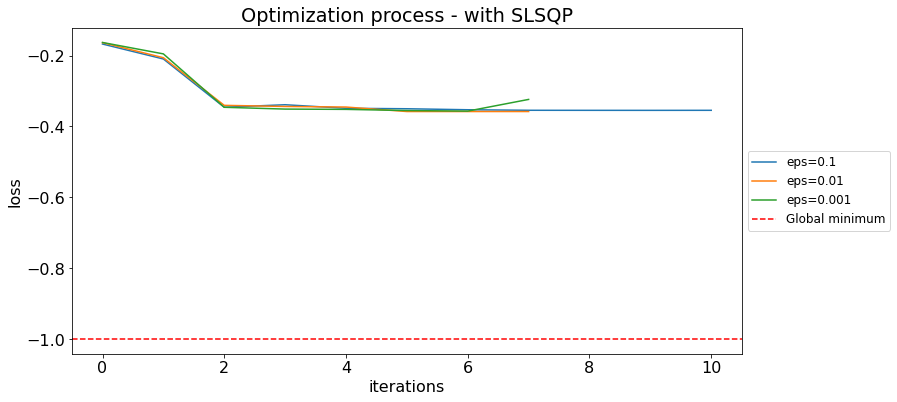


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.001082774952617008, 1.5645790734774887, 1.5...",-0.35812
2,slsqp,0.001,"[0.0005002781071562954, 1.580572409506205, 1.5...",-0.35690
0,slsqp,0.100,"[0.034549156858558756, 1.5394620808482065, 1.5...",-0.35476


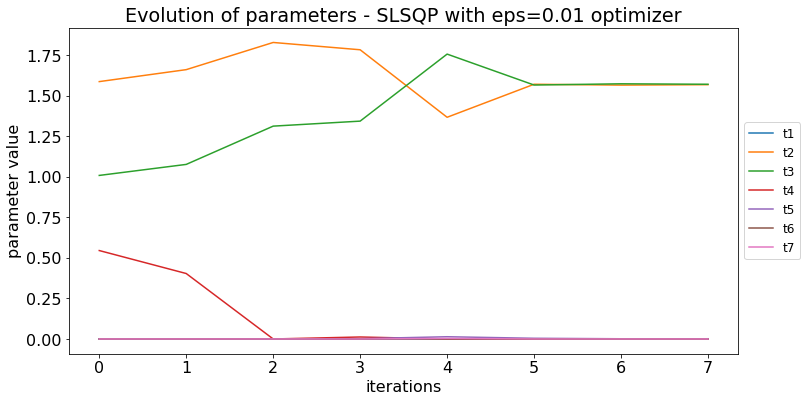

Best parameters (sum to 3.14):	[1.083e-03 1.565e+00 1.573e+00 5.000e-04 1.822e-03 5.000e-04 5.000e-04]
Best parameters (sum to 1):	[3.447e-04 4.980e-01 5.006e-01 1.592e-04 5.800e-04 1.592e-04 1.592e-04]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


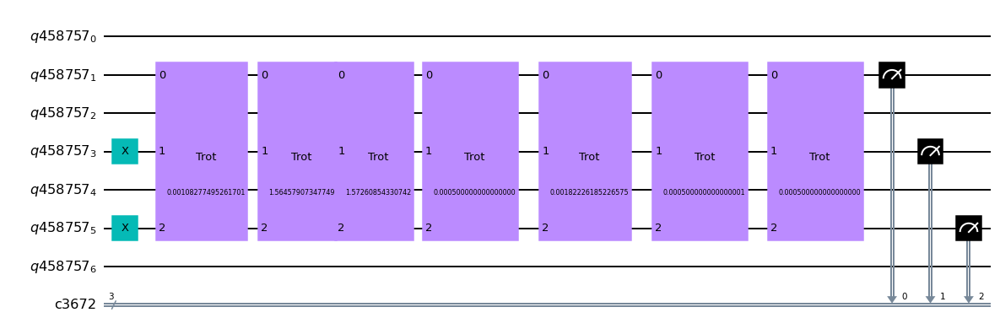

################################################################################
Single trotterization step:


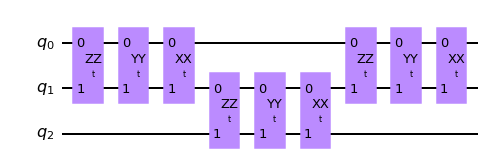

################################################################################

All steps + measurements of state tomography:


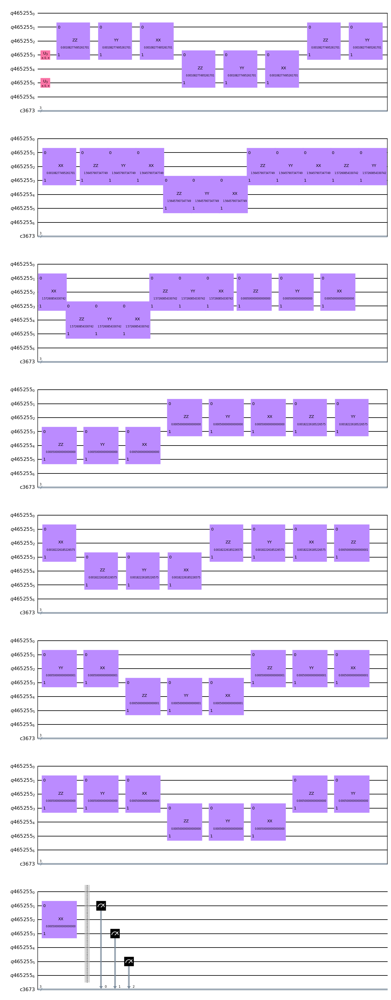

################################################################################

1/8 - Job ID 123b33f5-84b0-4eae-878d-ae0c84ee74b0
2/8 - Job ID 5e09101f-fa2d-48a5-8ebc-9874550ba37d
3/8 - Job ID 64d20008-2932-4c1b-b4b4-20128061794f
4/8 - Job ID 52699626-f093-4d87-bb2e-f5be438dfbf9
5/8 - Job ID 33fb5fa4-c73d-46a3-9243-ef6e90b40fb8
6/8 - Job ID 6f151831-4306-4b90-bd87-73ac38f6bc43
7/8 - Job ID eb5212f7-ee1a-4524-abca-c3d06d631951
8/8 - Job ID 20d23e42-97d3-4de8-8d87-4a25a1cf2cf9

################################################################################

Final results - order: 2 - strotter steps: 7

State tomography fidelity = 0.3575 ± 0.0018

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:18



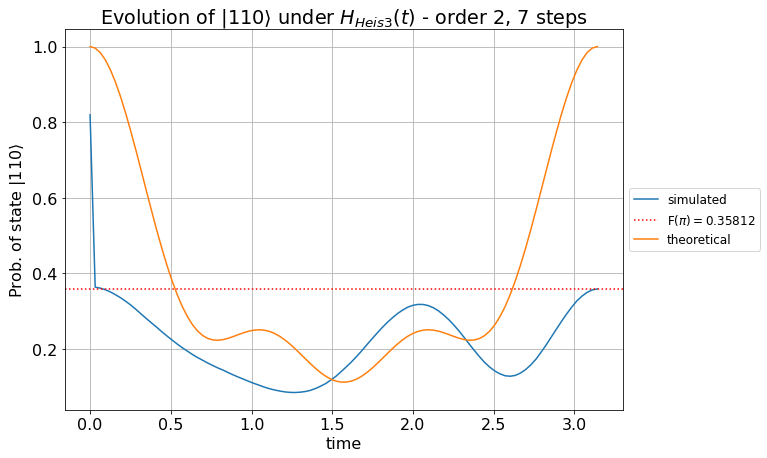




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 8                                   
                                 min time: 0.1                                  
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


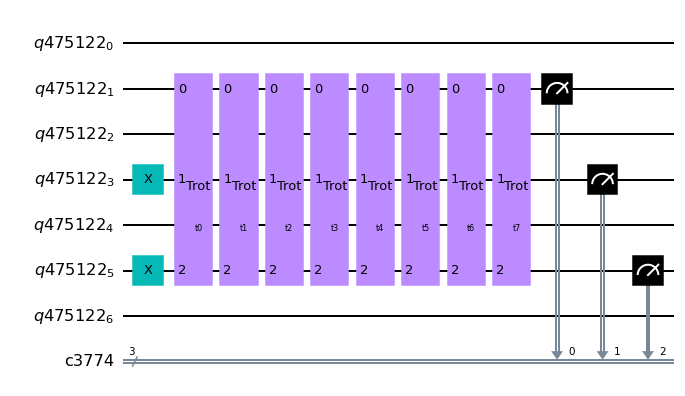

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.11643
Current parameters: [0.1   1.195 0.501 0.1   0.1   0.1   0.1   0.946] (sum to 3.14)

Iter 2 done!
Loss value: -0.12123
Current parameters: [0.1   1.156 0.478 0.105 0.114 0.114 0.11  0.964] (sum to 3.14)

Iter 3 done!
Loss value: -0.15725
Current parameters: [0.1   0.796 0.291 0.146 0.243 0.262 0.248 1.054] (sum to 3.14)

Iter 4 done!
Loss value: -0.1693
Current parameters: [0.1   0.6   0.227 0.203 0.321 0.349 0.343 0.999] (sum to 3.14)

Iter 5 done!
Loss value: -0.19025
Current parameters: [0.133 0.299 0.149 0.322 0.411 0.474 0.549 0.804] (sum to 3.14)

Iter 6 done!
Loss value: -0.19873
Current parameters: [0.185 0.1   0.174 0.529 0.47  0.56  0.814 0.31 ] (sum to 3.14)

Iter 7 done!
Loss value: -0.21583
Current parameters: [0.15  0.548 0.369 0.432 0.326 0.39  0.575 0.352] (sum to 3.14)

Iter 8 done!
Loss value: -0.21762

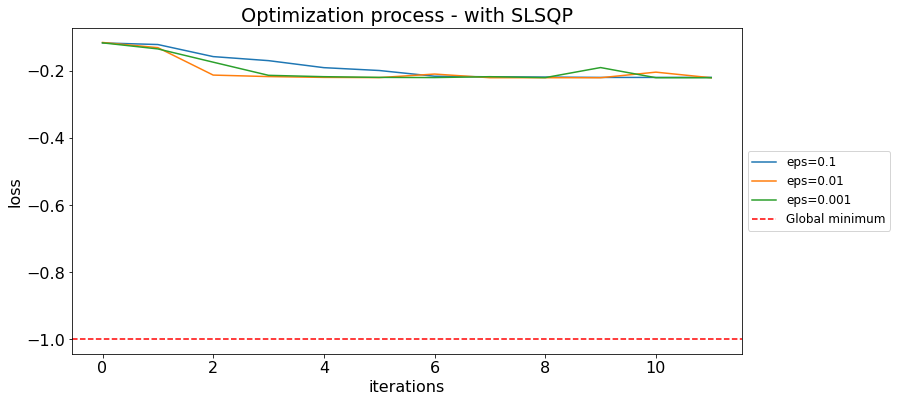


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.20511626825604978, 0.3775763259479514, 0.49...",-0.22040
2,slsqp,0.001,"[0.18382222639500229, 0.34876928268236407, 0.4...",-0.22023
0,slsqp,0.100,"[0.2944102285489145, 0.3628410550718919, 0.452...",-0.21944


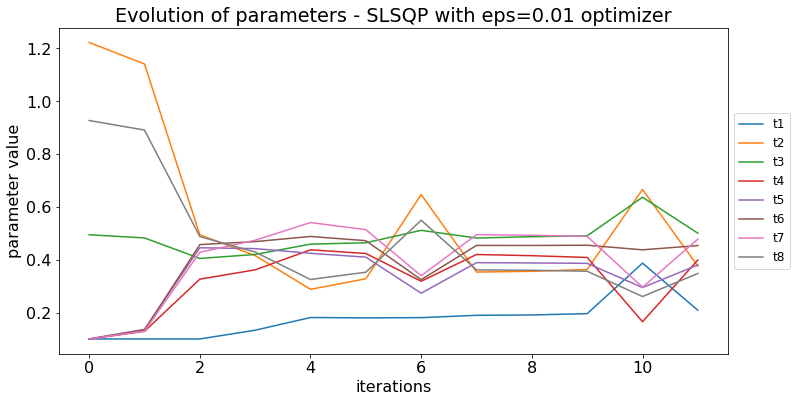

Best parameters (sum to 3.14):	[0.205 0.378 0.497 0.396 0.382 0.454 0.478 0.351]
Best parameters (sum to 1):	[0.065 0.12  0.158 0.126 0.121 0.144 0.152 0.112]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


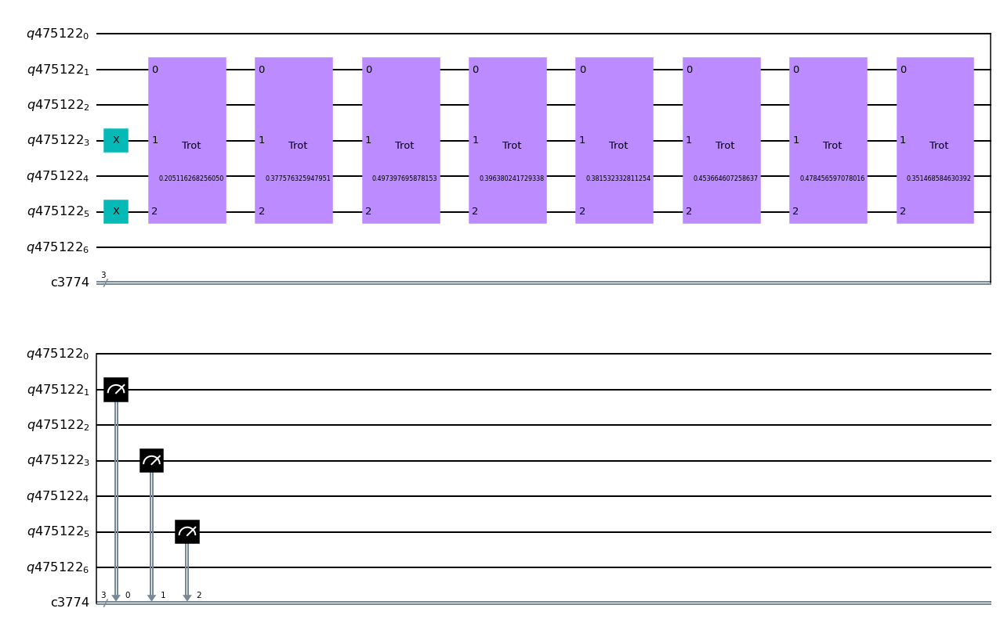

################################################################################
Single trotterization step:


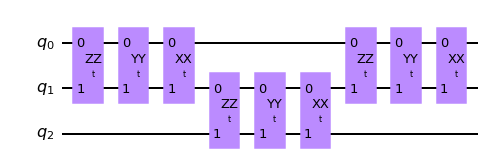

################################################################################

All steps + measurements of state tomography:


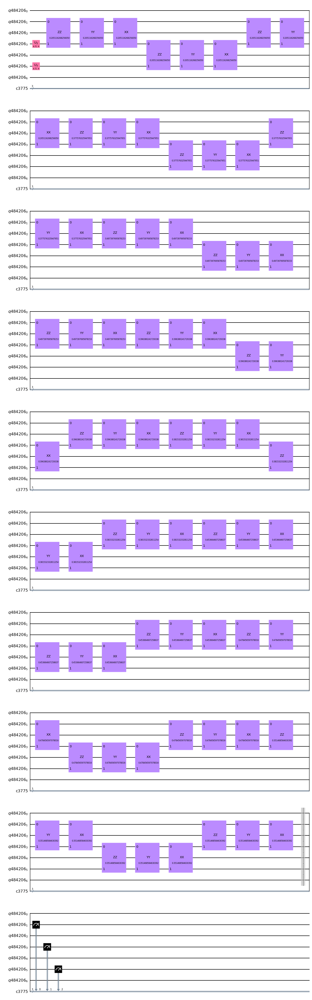

################################################################################

1/8 - Job ID 5bc6c18a-9dcb-4120-8ba4-89a0237b8859
2/8 - Job ID 3a7bf4b1-12a5-4cd6-a231-31c9ff069f60
3/8 - Job ID 1a5a1a0e-2a90-4e0b-979c-3d9b875c82f4
4/8 - Job ID 4478507f-8960-483e-9a35-9dd6bd761940
5/8 - Job ID 88adff27-1f92-4208-966a-4e05e4316461
6/8 - Job ID 31ac85ef-ff0f-4e1f-9a0f-620aa2381b89
7/8 - Job ID 24c17b83-70b8-4807-a14c-01595e400906
8/8 - Job ID ba2eb923-7fed-4c21-88e9-9b9ae951179e

################################################################################

Final results - order: 2 - strotter steps: 8

State tomography fidelity = 0.2197 ± 0.0025

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:23



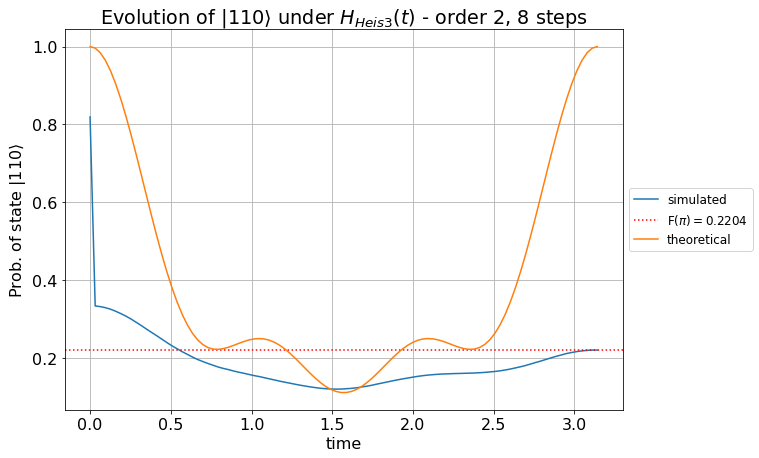




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 8                                   
                                 min time: 0.01                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


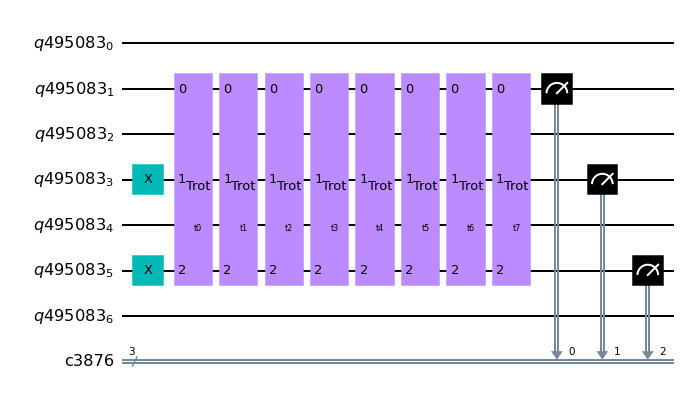

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.11152
Current parameters: [0.01  1.329 0.615 0.194 0.01  0.01  0.01  0.963] (sum to 3.14)

Iter 2 done!
Loss value: -0.11461
Current parameters: [0.01  1.371 0.609 0.136 0.01  0.01  0.01  0.986] (sum to 3.14)

Iter 3 done!
Loss value: -0.13461
Current parameters: [0.01  1.466 0.564 0.01  0.01  0.01  0.01  1.061] (sum to 3.14)

Iter 4 done!
Loss value: -0.15547
Current parameters: [0.01  1.482 0.459 0.01  0.01  0.01  0.01  1.15 ] (sum to 3.14)

Iter 5 done!
Loss value: -0.30956
Current parameters: [0.01  1.444 0.01  0.01  0.01  0.01  0.01  1.638] (sum to 3.14)

Iter 6 done!
Loss value: -0.29524
Current parameters: [0.01  1.513 0.136 0.01  0.01  0.01  0.01  1.442] (sum to 3.14)

Iter 7 done!
Loss value: -0.32545
Current parameters: [0.01  1.55  0.01  0.01  0.01  0.01  0.01  1.532] (sum to 3.14)

Iter 8 done!
Loss value: -0.3253

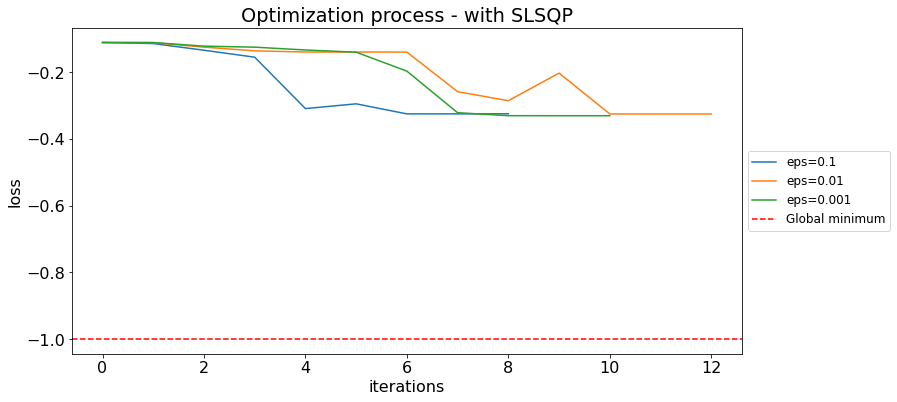


Optimization results:



,optimizer,eps,final_params,final_loss
2,slsqp,0.001,"[0.1214101972944295, 2.9256091748304494, 0.044...",-0.33087
1,slsqp,0.010,"[0.01, 1.5383594135035525, 0.01000000000365254...",-0.32571
0,slsqp,0.100,"[0.0106217409173339, 1.5475886941847794, 0.010...",-0.32546


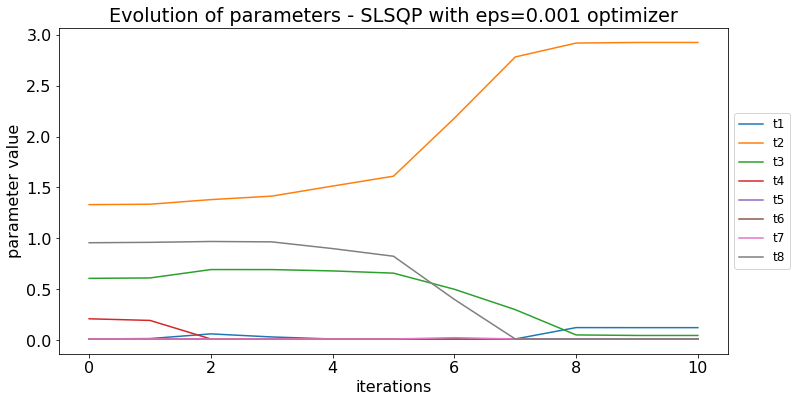

Best parameters (sum to 3.14):	[0.121 2.926 0.045 0.01  0.01  0.01  0.01  0.01 ]
Best parameters (sum to 1):	[0.039 0.931 0.014 0.003 0.003 0.003 0.003 0.003]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


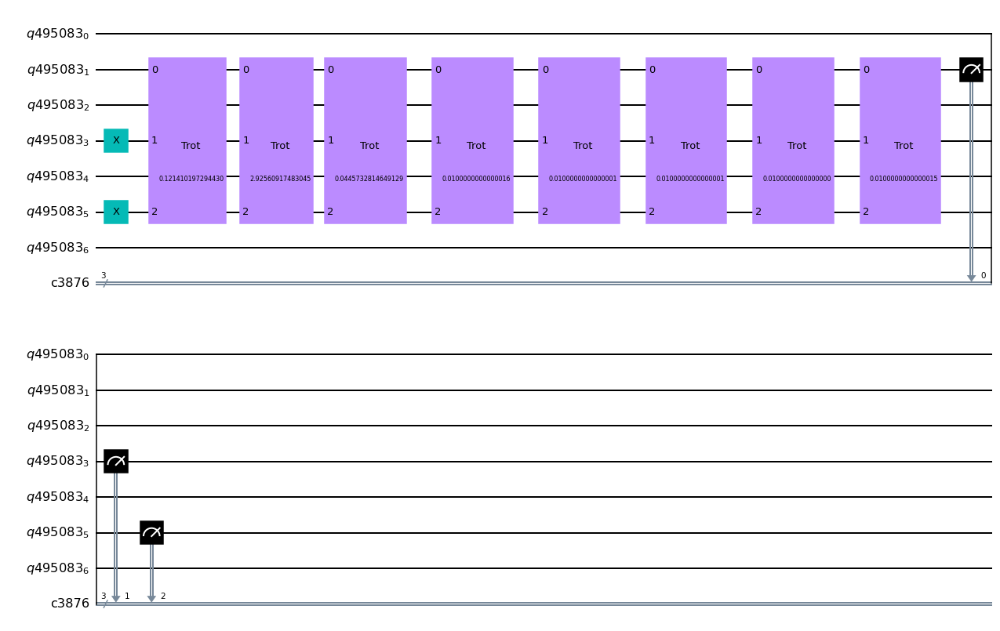

################################################################################
Single trotterization step:


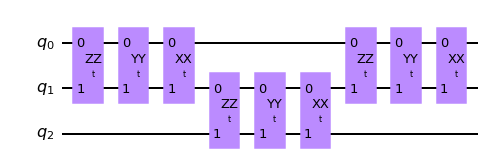

################################################################################

All steps + measurements of state tomography:


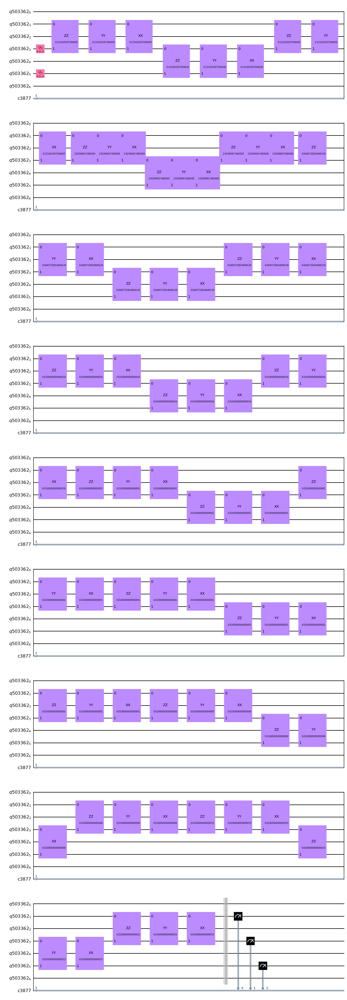

################################################################################

1/8 - Job ID e030b7cc-5506-4605-a41a-d0035b90c172
2/8 - Job ID ecf34e67-a6e2-4656-a823-4647936e3275
3/8 - Job ID 3d5ced0f-e150-4967-a13a-a5929541e1d8
4/8 - Job ID ffd00f6e-1d2e-49a5-a600-74e505adcef7
5/8 - Job ID 802ceb23-2e2e-465a-b00c-2cf5e9920317
6/8 - Job ID 0d1a3a09-8367-4409-92d6-fd6fed96f983
7/8 - Job ID 0421b02c-eac6-44fe-ac51-363179f34244
8/8 - Job ID 80e020a2-1f87-4227-adbd-a6210ebbf966

################################################################################

Final results - order: 2 - strotter steps: 8

State tomography fidelity = 0.3302 ± 0.0021

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:23



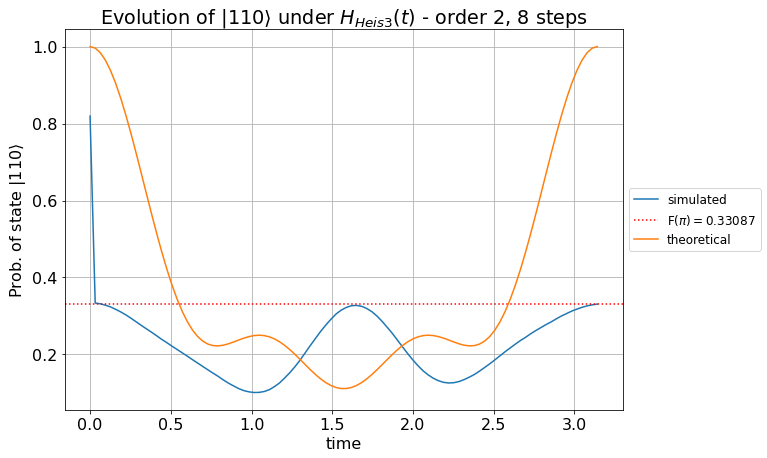




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 8                                   
                                min time: 0.001                                 
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


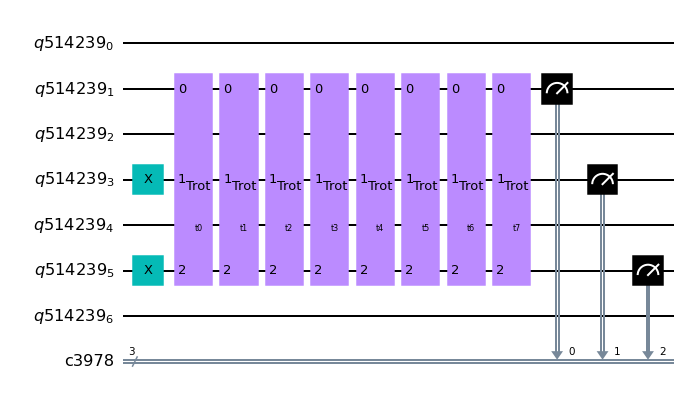

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.11255
Current parameters: [1.000e-03 1.337e+00 6.244e-01 2.120e-01 1.000e-03 1.000e-03 1.000e-03
 9.639e-01] (sum to 3.14)

Iter 2 done!
Loss value: -0.11659
Current parameters: [1.000e-03 1.384e+00 6.191e-01 1.506e-01 1.000e-03 1.000e-03 1.000e-03
 9.843e-01] (sum to 3.14)

Iter 3 done!
Loss value: -0.14325
Current parameters: [1.000e-03 1.507e+00 5.697e-01 1.000e-03 1.000e-03 1.000e-03 1.000e-03
 1.060e+00] (sum to 3.14)

Iter 4 done!
Loss value: -0.16122
Current parameters: [1.000e-03 1.535e+00 4.704e-01 1.000e-03 1.000e-03 1.000e-03 1.000e-03
 1.131e+00] (sum to 3.14)

Iter 5 done!
Loss value: -0.32859
Current parameters: [1.000e-03 1.565e+00 1.000e-03 1.000e-03 1.000e-03 1.000e-03 1.000e-03
 1.570e+00] (sum to 3.14)

Iter 6 done!
Loss value: -0.30286
Current parameters: [2.502e-03 1.541e+00 1.397e-01 1.000e-03 1.000e-03 

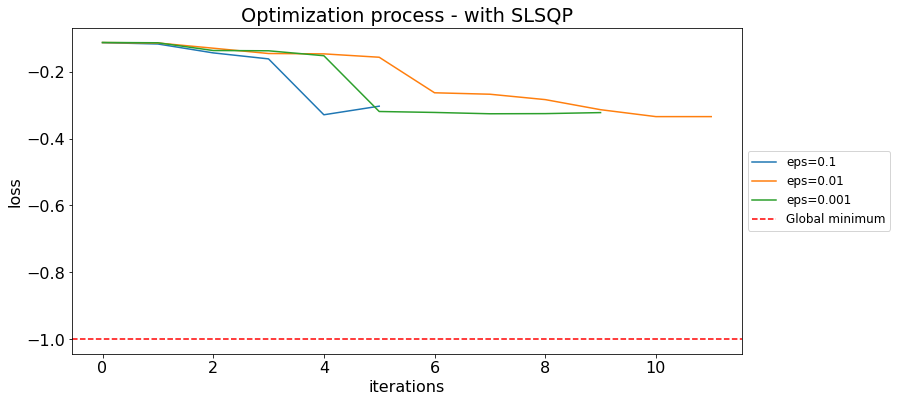


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.017764484326059947, 3.1178278824552756, 0.0...",-0.33411
0,slsqp,0.100,"[0.0010002985972909508, 1.5651854826616705, 0....",-0.32859
2,slsqp,0.001,"[0.06095726075449023, 2.7876568828799027, 0.28...",-0.32558


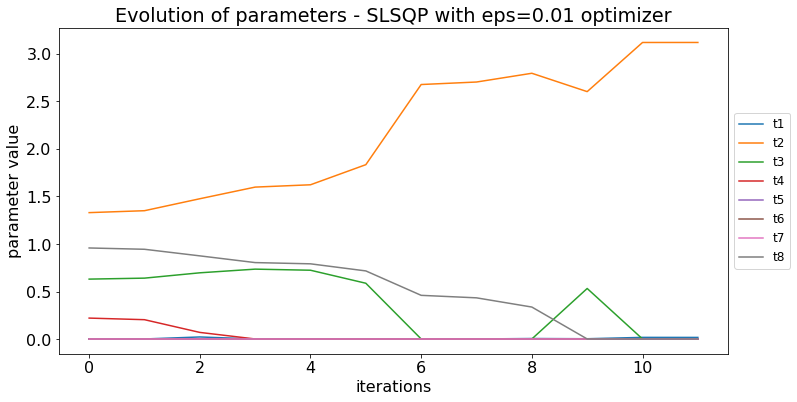

Best parameters (sum to 3.14):	[1.776e-02 3.118e+00 1.000e-03 1.000e-03 1.000e-03 1.000e-03 1.000e-03
 1.000e-03]
Best parameters (sum to 1):	[5.655e-03 9.924e-01 3.184e-04 3.183e-04 3.183e-04 3.183e-04 3.183e-04
 3.183e-04]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


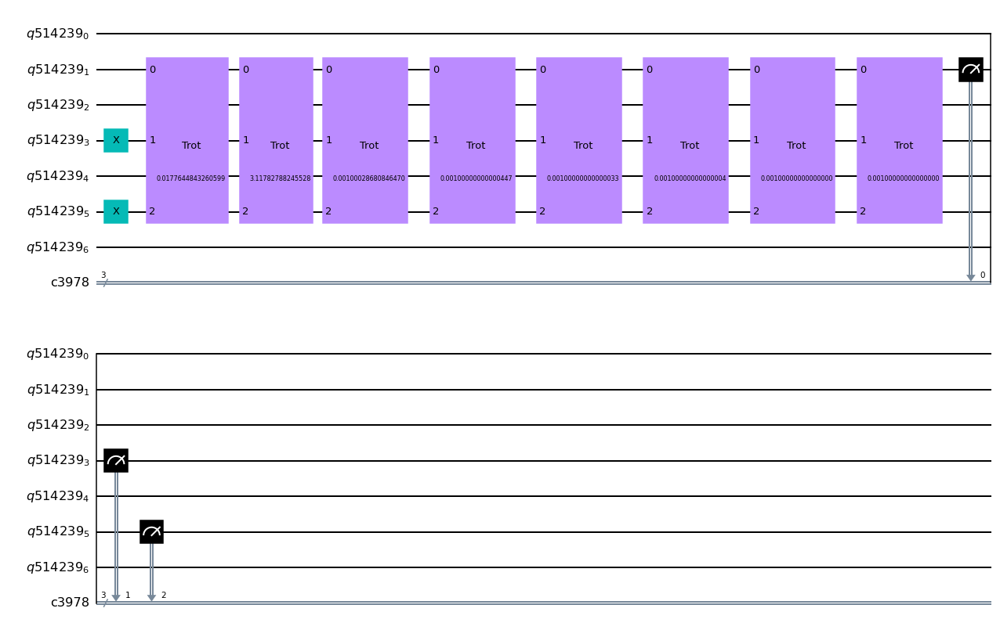

################################################################################
Single trotterization step:


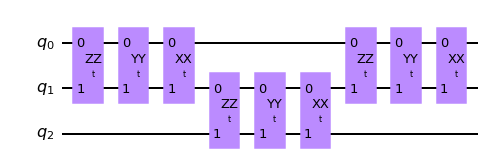

################################################################################

All steps + measurements of state tomography:


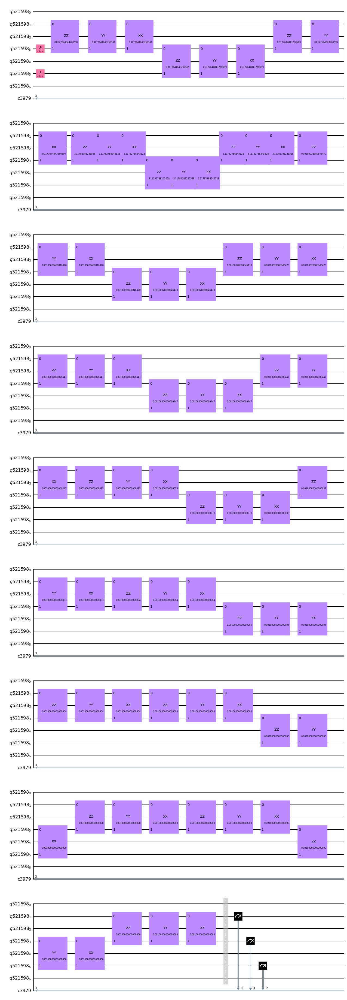

################################################################################

1/8 - Job ID e735c699-a297-4641-baa0-c1936b18ad30
2/8 - Job ID 8cecd7c7-ade5-4e0b-ae7d-2f264b1a132f
3/8 - Job ID 84f599b1-294e-4b90-be5d-fc5b37225de3
4/8 - Job ID 7c830a2a-fa6f-4d36-b8ef-df291770e562
5/8 - Job ID cf412e36-32a0-4b5a-b7d6-4215d8883ef5
6/8 - Job ID 76857646-4733-4f57-9a72-8c0d9e7d36bc
7/8 - Job ID 86eba69b-d61a-4e4f-9ac5-ce6816b8fe52
8/8 - Job ID 59e7b5af-f8d7-4f3b-bd20-e89ad62853e3

################################################################################

Final results - order: 2 - strotter steps: 8

State tomography fidelity = 0.3341 ± 0.0019

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:25



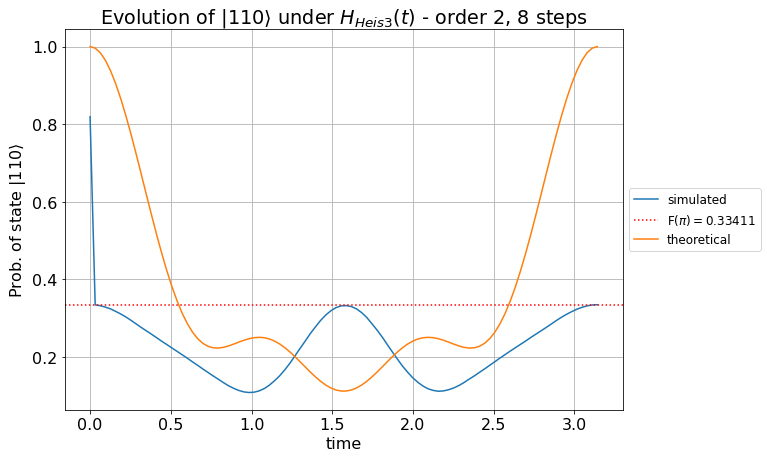




################################################################################
################################################################################
                                    Order: 2                                    
                                   # steps: 8                                   
                                min time: 0.0005                                
################################################################################
################################################################################





/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


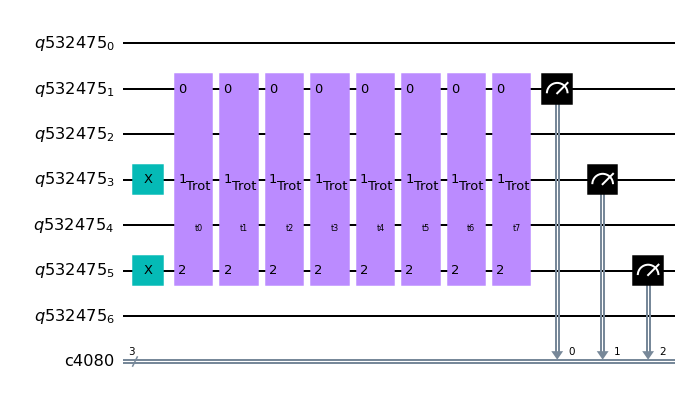

################################################################################

Starting optimization!


Optimizer: SLSQP
eps = 0.1

Iter 1 done!
Loss value: -0.11264
Current parameters: [5.000e-04 1.338e+00 6.250e-01 2.136e-01 5.000e-04 5.000e-04 5.000e-04
 9.634e-01] (sum to 3.14)

Iter 2 done!
Loss value: -0.11663
Current parameters: [5.000e-04 1.384e+00 6.199e-01 1.524e-01 5.000e-04 5.000e-04 5.000e-04
 9.832e-01] (sum to 3.14)

Iter 3 done!
Loss value: -0.14342
Current parameters: [5.000e-04 1.511e+00 5.726e-01 5.000e-04 5.000e-04 5.000e-04 5.000e-04
 1.056e+00] (sum to 3.14)

Iter 4 done!
Loss value: -0.15989
Current parameters: [5.000e-04 1.540e+00 4.762e-01 5.000e-04 5.000e-04 5.000e-04 5.000e-04
 1.123e+00] (sum to 3.14)

Iter 5 done!
Loss value: -0.32807
Current parameters: [5.000e-04 1.586e+00 5.000e-04 5.000e-04 5.000e-04 5.000e-04 5.000e-04
 1.552e+00] (sum to 3.14)

Iter 6 done!
Loss value: -0.30623
Current parameters: [1.012e-02 1.437e+00 5.000e-04 1.089e-01 4.384e-03 

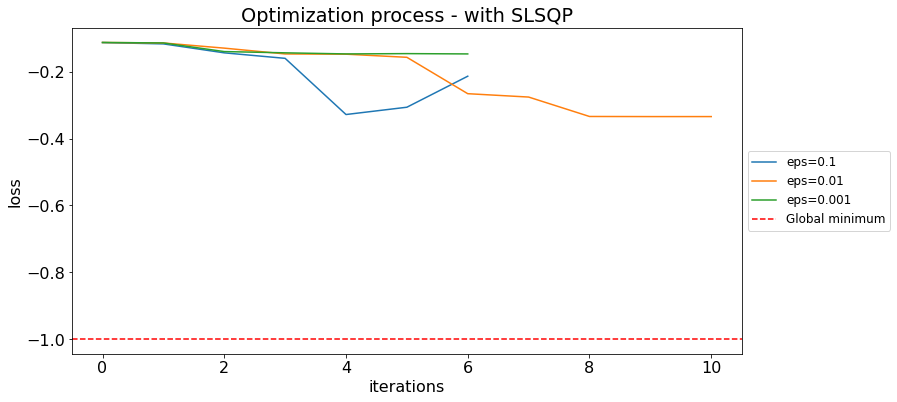


Optimization results:



,optimizer,eps,final_params,final_loss
1,slsqp,0.010,"[0.0006566771160659235, 3.137935976473727, 0.0...",-0.33424
0,slsqp,0.100,"[0.001462866747774239, 1.5714700186424557, 0.0...",-0.32825
2,slsqp,0.001,"[0.0005000000000000331, 1.6458166538082653, 0....",-0.14666


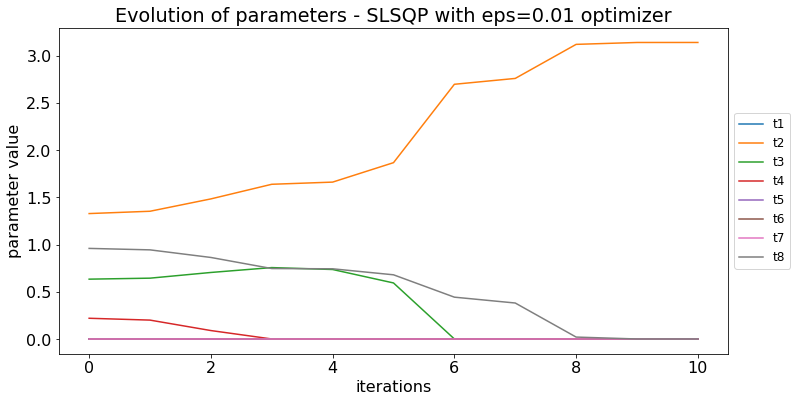

Best parameters (sum to 3.14):	[6.567e-04 3.138e+00 5.000e-04 5.000e-04 5.000e-04 5.000e-04 5.000e-04
 5.000e-04]
Best parameters (sum to 1):	[2.090e-04 9.988e-01 1.592e-04 1.592e-04 1.592e-04 1.592e-04 1.592e-04
 1.592e-04]


/home/askery/anaconda3/envs/qiskit/lib/python3.8/site-packages/sympy/core/expr.py:3949: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


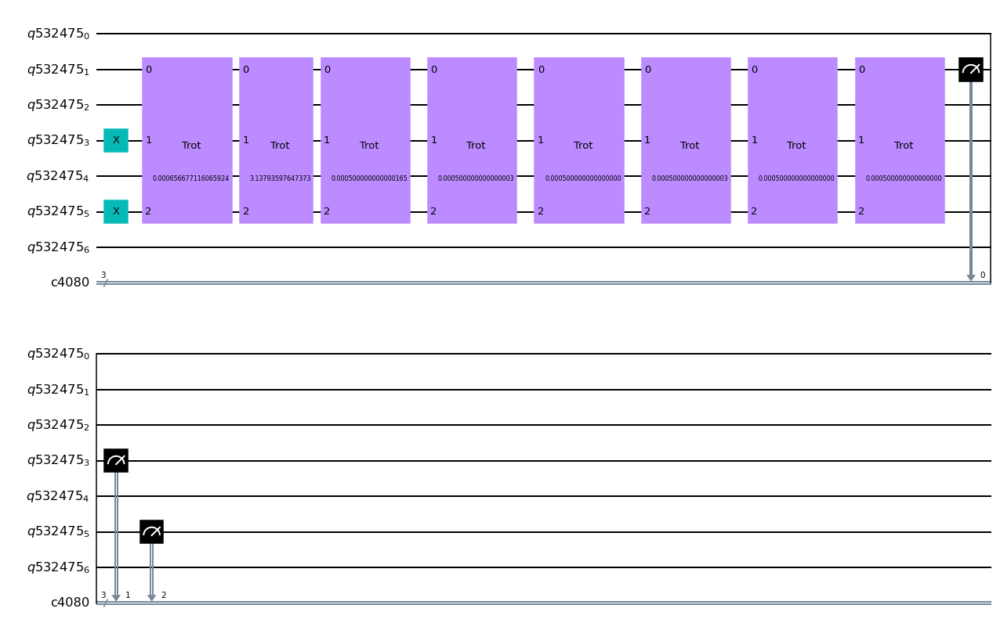

################################################################################
Single trotterization step:


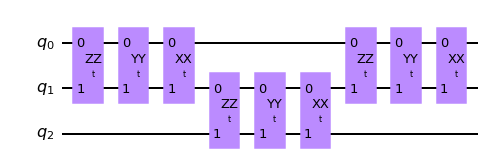

################################################################################

All steps + measurements of state tomography:


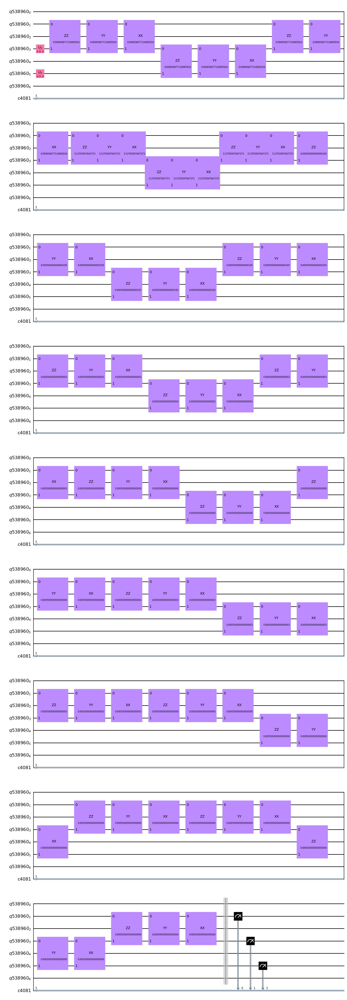

################################################################################

1/8 - Job ID 630d269f-daf4-4f02-bf30-d6e82d7235d8
2/8 - Job ID b4a4f9f1-0374-42c0-a057-e638ab4d8ca3
3/8 - Job ID 0a03c09c-727c-43a7-afa4-922be85c5308
4/8 - Job ID 52ec0a34-6119-4cda-9b1d-ac83246c06f3
5/8 - Job ID 9e378cbb-13c5-4fa6-9c1d-0c998baceb6e
6/8 - Job ID 6fd2fe3d-1641-4060-b40c-e160b2e0345f
7/8 - Job ID c1a33689-9e3f-4ffb-8305-abbef07b703f
8/8 - Job ID 5c0809b7-1f77-47c1-aead-03722d060014

################################################################################

Final results - order: 2 - strotter steps: 8

State tomography fidelity = 0.3347 ± 0.0032

################################################################################

Starting simulation for times from 0 to pi!
Simulation ended!
Total time of simulation: 00:01:23



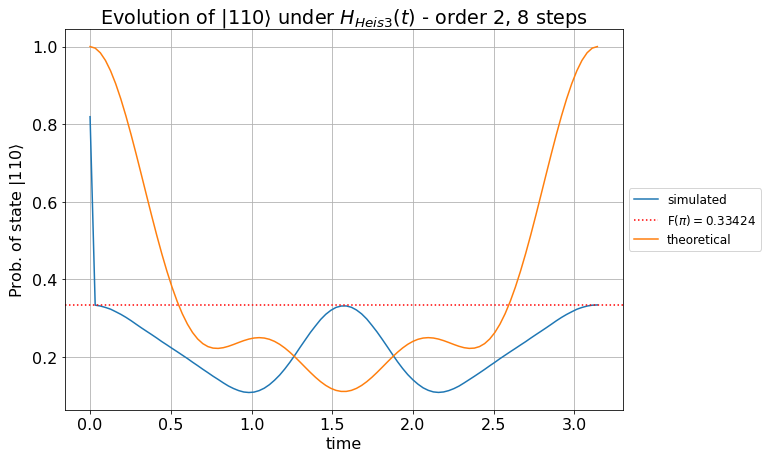

CPU times: user 1h 48min 36s, sys: 2min 4s, total: 1h 50min 40s
Wall time: 1h 28min 53s


In [13]:
%%time
order = 2
uniform_times  = False
backend_opt, backend_state_tomo = sim_noisy_jakarta, sim_noisy_jakarta
quadratic_loss = False

steps = range(4, 9)
min_times = [0.1, 0.01, 0.001, 0.0005]

combs = itertools.product(steps, min_times)

for trotter_steps, params_bounds_min in combs:
    
    print("\n\n")    
    print("#"*80)
    print("="*80)
    print("#"*80)
    print(f"Order: {order}".center(80))
    print(f"# steps: {trotter_steps}".center(80))
    print(f"min time: {params_bounds_min}".center(80))
    print("#"*80)
    print("="*80)
    print("#"*80)
    print("\n\n")
    
    fids, fidelity_pi, best_params = optimize_params_and_run(order, trotter_steps, uniform_times, params_bounds_min,
                                                             backend_opt, backend_state_tomo, quadratic_loss)
    
    results['order'].append(order)
    results['n_steps'].append(trotter_steps)
    results['t_min'].append(params_bounds_min)
    results['state_tomo_fids'].append(fids)
    results['fid_pi'].append(fidelity_pi)
    results['best_params'].append(best_params)

In [14]:
#sorting second order results by highest fidelity
results_second_order = pd.DataFrame(results).sort_values("fid_pi", ascending=False)

results_second_order

,order,n_steps,t_min,state_tomo_fids,fid_pi,best_params
3,2,4,0.0005,"[0.49138109442492856, 0.48860385312602467, 0.4...",0.48954,"[0.0005, 0.0005000000000000028, 3.138415754501..."
2,2,4,0.0010,"[0.4825624982127805, 0.47914331438575863, 0.47...",0.48013,"[0.0010000812767599512, 1.572844659094464, 1.5..."
1,2,4,0.0100,"[0.4804547351549336, 0.47639243032934997, 0.47...",0.47946,"[0.010000000000000007, 1.560694927216592, 1.56..."
5,2,5,0.0100,"[0.44101036365386065, 0.4412935023002398, 0.43...",0.43947,"[0.010000000000000002, 0.01, 3.101592653589793..."
4,2,5,0.1000,"[0.41928775167515325, 0.4171962865373143, 0.42...",0.42139,"[0.1, 0.10000000047045174, 2.741592653160785, ..."
0,2,4,0.1000,"[0.42003126657125706, 0.4144024557838749, 0.41...",0.41834,"[0.10000000000000278, 1.475106508122843, 1.466..."
6,2,5,0.0010,"[0.3966278963644874, 0.3994817795904532, 0.403...",0.40133,"[0.001000000000000013, 1.9835777289239498, 1.1..."
7,2,5,0.0005,"[0.4004453639003768, 0.3969193786056827, 0.399...",0.39936,"[0.0005000000000000004, 2.1723904181446065, 0...."
10,2,6,0.0010,"[0.3995303849753915, 0.39039921732416527, 0.39...",0.39202,"[0.001, 1.5671656058326005, 1.5704270477571927..."
11,2,6,0.0005,"[0.3913555206575954, 0.39009928555197704, 0.39...",0.39201,"[0.00233903682293575, 1.563753339179068, 1.572..."


In [15]:
# saving the best schedule time once optimized for each combination to reuse for hardware execution 
results_second_order["fid_pi"] = results_second_order["fid_pi"].astype("float")

file_2nd = f"results/results_opt_second_order_{dt.datetime.today().date()}.parquet"

results_second_order.to_parquet(file_2nd, index=False)

________________

## Hardware execution

After we have the optimized parameters for all combinations above

In [17]:
result_files = [f for f in listdir("./results") if isfile(join("./results", f))]

result_files

['results_opt_first_order_2022-04-15.parquet',
 'results_opt_second_order_2022-04-15.parquet']

In [19]:
file1  = 'results/'+ result_files[0]
results_1st_order = pd.read_parquet(file1)

results_1st_order

,order,n_steps,t_min,state_tomo_fids,fid_pi,best_params
0,1,4,0.0010,"[0.5784652519687651, 0.574286376365254, 0.5750...",0.57411,"[0.001, 1.568456254347037, 0.00388483498907728..."
1,1,4,0.0005,"[0.5716769278686193, 0.5743328336679746, 0.575...",0.57411,"[0.0017461160414020311, 1.5703193318202449, 0...."
2,1,4,0.0100,"[0.5767852554194195, 0.5795811131392834, 0.573...",0.57405,"[0.010000000000000002, 1.5562983235294372, 0.0..."
3,1,4,0.1000,"[0.5627217038552783, 0.5645457169991213, 0.559...",0.56336,"[0.1, 1.4542006072722344, 0.10000000000000002,..."
4,1,5,0.0005,"[0.5287527977884076, 0.5344052863829062, 0.532...",0.52963,"[0.0005000000000000004, 3.1395926535896734, 0...."
5,1,5,0.0010,"[0.5314668915146457, 0.5338984300838793, 0.532...",0.52956,"[0.0010003879226125475, 1.5720226639167176, 1...."
6,1,5,0.0100,"[0.5309573857901896, 0.529393783112713, 0.5283...",0.52941,"[0.010000000000000005, 1.563732301548536, 1.54..."
7,1,5,0.1000,"[0.5008944498803715, 0.5012708448662984, 0.499...",0.50069,"[0.10000000000000002, 1.4204674816061003, 1.42..."
8,1,6,0.0005,"[0.48885018656084106, 0.49007894405588326, 0.4...",0.49070,"[0.0014542523057605751, 1.567753820530556, 1.5..."
9,1,6,0.0010,"[0.49083094916045195, 0.48688061179978165, 0.4...",0.49070,"[0.0014796098234385764, 1.568081721352316, 1.5..."


In [20]:
file2  = 'results/'+ result_files[1]
results_2nd_order = pd.read_parquet(file2)

results_2nd_order

,order,n_steps,t_min,state_tomo_fids,fid_pi,best_params
0,2,4,0.0005,"[0.49138109442492856, 0.48860385312602467, 0.4...",0.48954,"[0.0005, 0.0005000000000000028, 3.138415754501..."
1,2,4,0.0010,"[0.4825624982127805, 0.47914331438575863, 0.47...",0.48013,"[0.0010000812767599512, 1.572844659094464, 1.5..."
2,2,4,0.0100,"[0.4804547351549336, 0.47639243032934997, 0.47...",0.47946,"[0.010000000000000007, 1.560694927216592, 1.56..."
3,2,5,0.0100,"[0.44101036365386065, 0.4412935023002398, 0.43...",0.43947,"[0.010000000000000002, 0.01, 3.101592653589793..."
4,2,5,0.1000,"[0.41928775167515325, 0.4171962865373143, 0.42...",0.42139,"[0.1, 0.10000000047045174, 2.741592653160785, ..."
5,2,4,0.1000,"[0.42003126657125706, 0.4144024557838749, 0.41...",0.41834,"[0.10000000000000278, 1.475106508122843, 1.466..."
6,2,5,0.0010,"[0.3966278963644874, 0.3994817795904532, 0.403...",0.40133,"[0.001000000000000013, 1.9835777289239498, 1.1..."
7,2,5,0.0005,"[0.4004453639003768, 0.3969193786056827, 0.399...",0.39936,"[0.0005000000000000004, 2.1723904181446065, 0...."
8,2,6,0.0010,"[0.3995303849753915, 0.39039921732416527, 0.39...",0.39202,"[0.001, 1.5671656058326005, 1.5704270477571927..."
9,2,6,0.0005,"[0.3913555206575954, 0.39009928555197704, 0.39...",0.39201,"[0.00233903682293575, 1.563753339179068, 1.572..."


_____________

### Execution - 1st order

In [ ]:
jobs_dict_1st_order = send_jobs(results_1st_order, jakarta, uniform_times=False)

jobs_dict_1st_order

In [ ]:
fids_dict_1st_order = hardware_exec_final_analysis(jobs_dict_1st_order)

_____________

### Execution - 2nd order

In [ ]:
jobs_dict_2nd_order = send_jobs(results_2nd_order, jakarta, uniform_times=False)

jobs_dict_2nd_order

In [ ]:
fids_dict_2nd_order = hardware_exec_final_analysis(jobs_dict_2nd_order)